# Predict tags on StackOverflow with linear models

In this assignment you will learn how to predict tags for posts from [StackOverflow](https://stackoverflow.com). To solve this task you will use multilabel classification approach.

### Libraries

In this task you will need the following libraries:
- [Numpy](http://www.numpy.org) — a package for scientific computing.
- [Pandas](https://pandas.pydata.org) — a library providing high-performance, easy-to-use data structures and data analysis tools for the Python
- [scikit-learn](http://scikit-learn.org/stable/index.html) — a tool for data mining and data analysis.
- [NLTK](http://www.nltk.org) — a platform to work with natural language.

### Data

The following cell will download all data required for this assignment into the folder `week1/data`.

In [1]:
import sys
sys.path.append("..")
from common.download_utils import download_week1_resources

download_week1_resources()

File data/train.tsv is already downloaded.
File data/validation.tsv is already downloaded.
File data/test.tsv is already downloaded.
File data/text_prepare_tests.tsv is already downloaded.


### Grading
We will create a grader instance below and use it to collect your answers. Note that these outputs will be stored locally inside grader and will be uploaded to platform only after running submitting function in the last part of this assignment. If you want to make partial submission, you can run that cell any time you want.

In [2]:
from grader import Grader

In [3]:
grader = Grader()

### Text preprocessing

For this and most of the following assignments you will need to use a list of stop words. It can be downloaded from *nltk*:

In [4]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/Louizz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In this task you will deal with a dataset of post titles from StackOverflow. You are provided a split to 3 sets: *train*, *validation* and *test*. All corpora (except for *test*) contain titles of the posts and corresponding tags (100 tags are available). The *test* set is provided for Coursera's grading and doesn't contain answers. Upload the corpora using *pandas* and look at the data:

In [5]:
from ast import literal_eval
import pandas as pd
import numpy as np

In [6]:
def read_data(filename):
    data = pd.read_csv(filename, sep='\t')
    data['tags'] = data['tags'].apply(literal_eval)
    return data

In [7]:
train = read_data('data/train.tsv')
validation = read_data('data/validation.tsv')
test = pd.read_csv('data/test.tsv', sep='\t')

In [8]:
train.head()

,title,tags
0,How to draw a stacked dotplot in R?,[r]
1,mysql select all records where a datetime fiel...,"[php, mysql]"
2,How to terminate windows phone 8.1 app,[c#]
3,get current time in a specific country via jquery,"[javascript, jquery]"
4,Configuring Tomcat to Use SSL,[java]


As you can see, *title* column contains titles of the posts and *tags* column contains the tags. It could be noticed that a number of tags for a post is not fixed and could be as many as necessary.

For a more comfortable usage, initialize *X_train*, *X_val*, *X_test*, *y_train*, *y_val*.

In [9]:
X_train, y_train = train['title'].values, train['tags'].values
X_val, y_val = validation['title'].values, validation['tags'].values
X_test = test['title'].values

One of the most known difficulties when working with natural data is that it's unstructured. For example, if you use it "as is" and extract tokens just by splitting the titles by whitespaces, you will see that there are many "weird" tokens like *3.5?*, *"Flip*, etc. To prevent the problems, it's usually useful to prepare the data somehow. In this task you'll write a function, which will be also used in the other assignments. 

**Task 1 (TextPrepare).** Implement the function *text_prepare* following the instructions. After that, run the function *test_test_prepare* to test it on tiny cases and submit it to Coursera.

In [10]:
import re

In [11]:
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('english'))

def text_prepare(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = text.split()
    text = [w.lower() for w in text]
    text = [re.sub(REPLACE_BY_SPACE_RE," ",w) for w in text]
    text = [re.sub(BAD_SYMBOLS_RE,"",w) for w in text]
    text = [w for w in text if w not in [""]]
    text = [w for w in text if w not in STOPWORDS]
    text = ' '.join([w for w in text])
    return text

In [12]:
def test_text_prepare():
    examples = ["SQL Server - any equivalent of Excel's CHOOSE function?",
                "How to free c++ memory vector<int> * arr?"]
    answers = ["sql server equivalent excels choose function", 
               "free c++ memory vectorint arr"]
    for ex, ans in zip(examples, answers):
        if text_prepare(ex) != ans:
            return "Wrong answer for the case: '%s'" % ex
    return 'Basic tests are passed.'

In [13]:
print(test_text_prepare())

Basic tests are passed.


Run your implementation for questions from file *text_prepare_tests.tsv* to earn the points.

In [14]:
prepared_questions = []
for line in open('data/text_prepare_tests.tsv', encoding='utf-8'):
    line = text_prepare(line.strip())
    prepared_questions.append(line)
text_prepare_results = '\n'.join(prepared_questions)

grader.submit_tag('TextPrepare', text_prepare_results)

Current answer for task TextPrepare is:
 sqlite php readonly
creating multiple textboxes dynamically
that  self one prefer javascript
save ph...


Now we can preprocess the titles using function *text_prepare* and  making sure that the headers don't have bad symbols:

In [15]:
X_train = [text_prepare(x) for x in X_train]
X_val = [text_prepare(x) for x in X_val]
X_test = [text_prepare(x) for x in X_test]

In [16]:
X_train[:3]

['draw stacked dotplot r',
 'mysql select records datetime field less specified value',
 'terminate windows phone 81 app']

For each tag and for each word calculate how many times they occur in the train corpus. 

**Task 2 (WordsTagsCount).** Find 3 most popular tags and 3 most popular words in the train data and submit the results to earn the points.

In [17]:
# Dictionary of all tags from train corpus with their counts.
tags_counts = {}
# Dictionary of all words from train corpus with their counts.
words_counts = {}

for ele in X_train:
    for w in ele.split():
        words_counts[w] = words_counts.get(w, 0) + 1

for ele in y_train:
    for t in ele:
        tags_counts[t] = tags_counts.get(t, 0) + 1

In [18]:
words_counts

{'draw': 173,
 'stacked': 20,
 'dotplot': 1,
 'r': 896,
 'mysql': 1572,
 'select': 980,
 'records': 175,
 'datetime': 363,
 'field': 778,
 'less': 79,
 'specified': 162,
 'value': 3175,
 'terminate': 33,
 'windows': 1339,
 'phone': 223,
 '81': 59,
 'app': 1116,
 'get': 4301,
 'current': 523,
 'time': 1213,
 'specific': 691,
 'country': 37,
 'via': 590,
 'jquery': 3293,
 'configuring': 32,
 'tomcat': 255,
 'use': 2422,
 'ssl': 145,
 'awesome': 7,
 'nested': 446,
 'set': 1640,
 'plugin': 270,
 'add': 1611,
 'new': 931,
 'children': 79,
 'tree': 209,
 'various': 27,
 'levels': 25,
 'create': 1757,
 'map': 496,
 'json': 1557,
 'response': 396,
 'ruby': 1164,
 'rails': 1778,
 '3': 641,
 'rspec': 144,
 'test': 540,
 'method': 2123,
 'called': 316,
 'springboot': 27,
 'catalina': 3,
 'lifecycle': 9,
 'exception': 944,
 'import': 354,
 'data': 3298,
 'excel': 540,
 'database': 1631,
 'using': 8278,
 'php': 5614,
 'obtaining': 15,
 'object': 2646,
 'javalangclasst': 1,
 'parameterized': 17,
 't

In [19]:
X_train

['draw stacked dotplot r',
 'mysql select records datetime field less specified value',
 'terminate windows phone 81 app',
 'get current time specific country via jquery',
 'configuring tomcat use ssl',
 'awesome nested set plugin add new children tree various levels',
 'create map json response ruby rails 3',
 'rspec test method called',
 'springboot catalina lifecycle exception',
 'import data excel mysql database using php',
 'obtaining object javalangclasst object parameterized type without constructing class q_uestion',
 'ipad selecting text inside text input tap',
 'jquerys function object',
 'eclipse c++ mingw lauch program terminated',
 'javascript call one prototype method another prototype method',
 'get intersection list sets',
 'longer able hide keyboard viewwilldisappear ios7',
 'fetch key json swift',
 'change pivot header template windows phone 8',
 'connectionstring encryption',
 'let ui refresh long running ui operation',
 'better way execute ruby file using python get

In [20]:
items = [(v, k) for k, v in words_counts.items()]
items.sort()
items.reverse()
words_freq = [(v, k) for k, v in items]
words_freq

[('using', 8278),
 ('php', 5614),
 ('java', 5501),
 ('file', 5055),
 ('javascript', 4746),
 ('error', 4388),
 ('get', 4301),
 ('c#', 4188),
 ('python', 4073),
 ('string', 3652),
 ('array', 3533),
 ('data', 3298),
 ('jquery', 3293),
 ('value', 3175),
 ('function', 2896),
 ('object', 2646),
 ('class', 2558),
 ('use', 2422),
 ('c++', 2312),
 ('list', 2137),
 ('method', 2123),
 ('multiple', 2096),
 ('text', 1929),
 ('image', 1849),
 ('page', 1847),
 ('rails', 1778),
 ('form', 1776),
 ('create', 1757),
 ('html', 1715),
 ('type', 1699),
 ('code', 1664),
 ('set', 1640),
 ('working', 1636),
 ('database', 1631),
 ('add', 1611),
 ('convert', 1587),
 ('mysql', 1572),
 ('json', 1557),
 ('c', 1550),
 ('server', 1543),
 ('variable', 1542),
 ('android', 1530),
 ('values', 1528),
 ('aspnet', 1506),
 ('way', 1454),
 ('application', 1451),
 ('change', 1441),
 ('button', 1385),
 ('find', 1383),
 ('django', 1373),
 ('one', 1370),
 ('without', 1369),
 ('windows', 1339),
 ('cannot', 1314),
 ('table', 1274),

We are assuming that *tags_counts* and *words_counts* are dictionaries like `{'some_word_or_tag': frequency}`. After applying the sorting procedure, results will be look like this: `[('most_popular_word_or_tag', frequency), ('less_popular_word_or_tag', frequency), ...]`. The grader gets the results in the following format (two comma-separated strings with line break):

    tag1,tag2,tag3
    word1,word2,word3

Pay attention that in this assignment you should not submit frequencies or some additional information.

In [21]:
most_common_tags = sorted(tags_counts.items(), key=lambda x: x[1], reverse=True)[:3]
most_common_words = sorted(words_counts.items(), key=lambda x: x[1], reverse=True)[:3]

grader.submit_tag('WordsTagsCount', '%s\n%s' % (','.join(tag for tag, _ in most_common_tags), 
                                                ','.join(word for word, _ in most_common_words)))

Current answer for task WordsTagsCount is:
 javascript,c#,java
using,php,java...


### Transforming text to a vector

Machine Learning algorithms work with numeric data and we cannot use the provided text data "as is". There are many ways to transform text data to numeric vectors. In this task you will try to use two of them.

#### Bag of words

One of the well-known approaches is a *bag-of-words* representation. To create this transformation, follow the steps:
1. Find *N* most popular words in train corpus and numerate them. Now we have a dictionary of the most popular words.
2. For each title in the corpora create a zero vector with the dimension equals to *N*.
3. For each text in the corpora iterate over words which are in the dictionary and increase by 1 the corresponding coordinate.

Let's try to do it for a toy example. Imagine that we have *N* = 4 and the list of the most popular words is 

    ['hi', 'you', 'me', 'are']

Then we need to numerate them, for example, like this: 

    {'hi': 0, 'you': 1, 'me': 2, 'are': 3}

And we have the text, which we want to transform to the vector:

    'hi how are you'

For this text we create a corresponding zero vector 

    [0, 0, 0, 0]
    
And iterate over all words, and if the word is in the dictionary, we increase the value of the corresponding position in the vector:

    'hi':  [1, 0, 0, 0]
    'how': [1, 0, 0, 0] # word 'how' is not in our dictionary
    'are': [1, 0, 0, 1]
    'you': [1, 1, 0, 1]

The resulting vector will be 

    [1, 1, 0, 1]
   
Implement the described encoding in the function *my_bag_of_words* with the size of the dictionary equals to 5000. To find the most common words use train data. You can test your code using the function *test_my_bag_of_words*.

In [22]:
DICT_SIZE = 5000
i = 0
WORDS_TO_INDEX = {}
INDEX_TO_WORDS = {}
for (word, freq) in words_freq[:DICT_SIZE]:
    WORDS_TO_INDEX[word] = i
    INDEX_TO_WORDS[i] = word
    i = i+1
ALL_WORDS = WORDS_TO_INDEX.keys()

def my_bag_of_words(text, words_to_index, dict_size):
    """
        text: a string
        dict_size: size of the dictionary
        
        return a vector which is a bag-of-words representation of 'text'
    """
    result_vector = np.zeros(dict_size)
    for word in text.split():
        print(word)
        if (word in words_to_index.keys() and words_to_index[word] < dict_size):
            result_vector[words_to_index[word]] += 1
    return result_vector

In [23]:
def test_my_bag_of_words():
    words_to_index = {'hi': 0, 'you': 1, 'me': 2, 'are': 3}
    examples = ['hi how are you']
    answers = [[1, 1, 0, 1]]
    for ex, ans in zip(examples, answers):
        if (my_bag_of_words(ex, words_to_index, 4) != ans).any():
            return "Wrong answer for the case: '%s'" % ex
    return 'Basic tests are passed.'

In [24]:
print(test_my_bag_of_words())

hi
how
are
you
Basic tests are passed.


Now apply the implemented function to all samples (this might take up to a minute):

In [25]:
from scipy import sparse as sp_sparse

In [26]:
X_train_mybag = sp_sparse.vstack([sp_sparse.csr_matrix(my_bag_of_words(text, WORDS_TO_INDEX, DICT_SIZE)) for text in X_train])
X_val_mybag = sp_sparse.vstack([sp_sparse.csr_matrix(my_bag_of_words(text, WORDS_TO_INDEX, DICT_SIZE)) for text in X_val])
X_test_mybag = sp_sparse.vstack([sp_sparse.csr_matrix(my_bag_of_words(text, WORDS_TO_INDEX, DICT_SIZE)) for text in X_test])
print('X_train shape ', X_train_mybag.shape)
print('X_val shape ', X_val_mybag.shape)
print('X_test shape ', X_test_mybag.shape)

draw
stacked
dotplot
r
mysql
select
records
datetime
field
less
specified
value
terminate
windows
phone
81
app
get
current
time
specific
country
via
jquery
configuring
tomcat
use
ssl
awesome
nested
set
plugin
add
new
children
tree
various
levels
create
map
json
response
ruby
rails
3
rspec
test
method
called
springboot
catalina
lifecycle
exception
import
data
excel
mysql
database
using
php
obtaining
object
javalangclasst
object
parameterized
type
without
constructing
class
q_uestion
ipad
selecting
text
inside
text
input
tap
jquerys
function
object
eclipse
c++
mingw
lauch
program
terminated
javascript
call
one
prototype
method
another
prototype
method
get
intersection
list
sets
longer
able
hide
keyboard
viewwilldisappear
ios7
fetch
key
json
swift
change
pivot
header
template
windows
phone
8
connectionstring
encryption
let
ui
refresh
long
running
ui
operation
better
way
execute
ruby
file
using
python
get
ruby
console
output
ruby
file
run
python
make
2
thumbnails
codeigniter
java
character

adding
style
editor
xml
serialization
readonlycollections
possible
extend
java
class
one
name
exceptions
handling
guidelines
c++
understand
parallelinstances
testng
suite
configure
import
csv
excel
data
webpage
pass
parameter
owin
host
rspec
check
model
saved
rake
errors
loading
kind
mutex
datetime
add
calculation
inside
linq
entities
query
difference
ruby
ruby
rails
cocos2dx
lua
binding
reset
dispatchertimer
angularjs
verify
check
box
clicked
pass
structure
pointer
c
dll
c#
pausing
method
set
#
milliseconds
call
javascript
vbnet
difference
data
params
python
requests
brace
highlighting
visual
studio
javascript
email
component
versus
phpmailer
cakephp
cannot
include
header
files
correctly
php
api
development
change
uiimageview
size
position
programmatically
swift
n
n
stdendl
stdcout
ajax
uploading
file
html
5
php
seperate
gc
log
file
java
vm
oracle
application
server
fix
error
laravellog
could
opened
php
separate
array
commas
test
string
basically
integer
quotes
using
ruby
android
java

table
name
_post
array
data
change
font
size
gradually
uilabel
concatenate
values
select
inputs
radio
groups
one
hidden
field
value
c++
win32
window
background
redrawing
change
value
htmltextbox
using
jquery
json
json
empty
string
deserializes
null
server
side
way
select
bit
rate
using
avplayer
http
live
audio
streaming
django
creating
superuser
custom
user
model
jquery
ajax
send
data
url
without
showing
data
webdevelopers
merging
two
datasets
1
column
common
facebook
integration
website
using
facebook
login
button
plugin
store
user
crenditials
database
modal
container
auto
centering
fitting
size
content
inside
container
angular2
testing
whats
difference
debugelement
nativeelement
object
componentfixture
java
jdbc
driver
type_forward_only
make
yaxis
intersect
xaxis
0
ggplot2
playframework
catch
deadlock
reissue
transaction
sqlalchemy
update
postgresql
array
using
merge
work
stringargument
constructor
factory
method
deserialize
string
value
compare
sql
datetime
c#
datetime
html5
drag
dr

display
speed
mkmap
xcode
automapper
mapping
2
enum
values
1
value
java
stringsplit
regex
conversion
type
dbnull
type
string
valid10
bootstrap
3
invisible
dropdown
ie9
bug
fix
convert
joda
localdate
joda
datetime
create
menu
json
file
setting
default
value
param
attribute
controller
nil
semantic
interpretation
srgs
xml
grammar
exception
immediately
expunging
mailbox
java
email
pythonic
way
handle
sqlalchemy
models
getting
cannot
implicitly
convert
type
decimal
bool
error
query
elasticsearch
java
json
codeigniter
query
times
custom
file
logging
magento
unit
testing
jackson
json
view
deserialization
remove
elements
linked
list
save
tuple
nsuserdefaults
starting
address
array
click
link
open
pdf
new
window
time
changing
parent
window
find
element
insert
content
next
json
response
parsing
using
wordpress
ajax
php
foreach
doesnt
override
array
value
iterating
js
change
text
onclick
change
back
onclick
ifelse
apache
poi
thousand
separator
highcharts
sparse
data
hide
empty
values
interopword


button
iframe
jquery
javascript
splash
screen
animation
supporting
xcode
7
gm
ios9
app
crashes
error
wpf
window
detect
first
show
google
maps
jsp
spring
javascript
generated
typescript
make
python
3x
enter
text
web
browser
jquery
accordion
activate
external
links
delete
multiple
rows
table
angularjs
could
affect
python
string
comparison
performance
strings
64
characters
running
django
project
without
django
installation
rails
upgrade
323
3211
using
blocks
reload
uitableview
data
crashes
best
practice
handle
backing
bean
initialization
jsf
20
jsf20
file
load
error
running
rspec
xml
validation
xsds
java
accessing
attributes
attr
raphael
element
triggering
mouseover
event
write
jump
instruction
c
property
found
object
type
populate
matrix
values
another
matrix
r
allow
access
php
file
another
php
file
direct
url
change
json
structure
local
global
static
variables
c++
get
type
name
object
property
name
reduce
lag
jframe
painting
convert
complex
filename
html
link
use
typeid
store
type_info


writing
reading
repeated
extended
fields
protobuf
comparing
python
lists
opening
jpeg
image
python
faster
way
match
filename
folder
containing
thousend
files
html
cannot
write
textboxes
shown
dynamically
javascript
internet
explorer
combine
contents
two
files
using
linq
csv
wpf
toolkit
chart
control
binding
mean
global
namespace
would
polluted
high
precision
integer
math
c#
help
getting
json
format
data
external
website
c
training
16bit
microcontrollers
return
json
ruby
android
socket
connection
failed
jtable
1
point
border
doesnt
appear
grid
line
realworld
examples
nested
functions
convert
urls
html
document
net
textbox
control
wait
till
user
done
typing
finding
really
big
power
number
ckeditor
find
getdata
mandatory
cloneable
interface
java
variable
number
columns
genfromtxt
python
onclientclick
code
preventing
validation
working
make
objects
thread
safe
nhibernate
get
source
jars
maven
repository
read
file
current
directory
java
class
another
directory
heroku
push
error
git
push
her

source
ienumerable
error
using
sqlquery
type
string
object
asqueryable
setting
nhibernate
mapping
code
session
factory
mysql
method
apply
sketch
effect
cartoon
effect
executing
php
scripts
using
button
android
app
algorithm
multithreaded
construction
immutable
trees
java
tell
facebook
version
api
im
using
php
browsing
drive
wpf
tree
view
transform
url
link
unless
already
link
generating
deck
cards
permissionerror
errno
13
permission
denied
code
managepy
rvm
install
ruby
192
snow
leopard
error
running
make
rails
3
including
multiple
tables
one
query
whats
disadvantage
mt_rand
display
output
looping
php
get
id
affected
row
codeignitor
update
resharper
complain
compare
double
zero
get
sublist
hashmap
rails
3
scope
returns
array
error
creating
new
rails
3
project
require
cannot
load
file
openssl
loaderror
drawrect
cropping
uiscrollview
put
percentage
label
ggplot
geom_text
suitable
python
repeated
capture
groups
switching
jpanels
jframe
back
catch
exit
event
php
receive
smtp
error
javaxmai

using
javascript
html
javascript
static
members
awesome
bootstrap
checkboxes
bootstrap
multiselect
django
admin
restricting
access
user
making
jqgrid
cells
editable
entity
framework
exception
ambiguous
match
found
jquery
tooltip
offset
calling
php
interface
methods
post
string
javascript
code
apicontroller
server
filling
dataset
manually
php
get
last
array
key
exporting
requests
cookies
webdriver
parsing
xml
dynamically
android
view
based
vs
windows
based
iphone
application
jsp
http
status
404
requested
resource
available
truncate
text
without
truncating
html
jquery
full
calendar
edit
calendar
view
initialization
reinitialize
bean
bootstrapselect
opens
option
div
sending
mail
using
php
iis
7
windows
2008
server
comparing
objects
array
extension
causing
error
swift
django
project
root
self
discovery
sending
data
parameters
rest
api
using
pythonrequests
systemidentitymodeltokensjwtsecuritytoken
custom
properties
use
str_replace
sufficient
prevent
sql
injection
attacks
test
gcroot
referen

import
json
data
d3
set
timeout
jaxws
webservice
call
ocr
digits
classify
hu
invariant
moments
showing
alert
dialog
dropdown
select
jquery
save
subplot
matplotlib
get
mysql
primary
key
foreign
keys
constraints
php
nginx
raises
404
using
format
js
subclass
arguments
superclass
month
week
year
spring
security
+
mvc
requestmapping
different
secured
flask
make_response
large
files
angular
directives
use
jquery
add
ngmodel
ngbind
custom
directive
elements
jstl
cset
set
bean
property
results
argument
type
mismatch
get
struct
object
java
c++
java
iterating
array
list
draw
triangle
shape
python
add
onclick
attribute
login
submit
button
drupal
7
vs2013
codecoverageexe
runsettings
file
never
parses
order
statistic
tree
c++
storing
java
date
object
redis
printing
without
showdialog
gives
blank
pages
turn
keyboard
sounds
cocoa
application
problem
textbox
focus
wpf
c++
game
programming
love
distrust
javascript
scope
closure
detect
uiview
size
changed
swift
ios
xcode
possible
replace
browsers
url
wi

java
vs2008
missing
c
c++
header
files
register
app
open
pdf
file
app
ipad
convert
cfdataref
nsdata
httpclient
passing
content
post
using
absolute_import
handling
relative
module
name
conflicts
python
jquery
run
per
session
unresolved
host
exception
android
typeerror
cannot
concatenate
str
list
objects
generate
random
string
php
using
3
strings
random
numbers
get
values
dynamically
created
select
box
fcbk
multiple
selection
highcharts
scroll
bar
working
returning
partialview
html
javascript
use
anonymous
functions
affect
performance
string
slicing
python
lists
update
c#
hashtable
loop
remember
scroll
position
page
input
redirection
using
visual
studio
2010
pass
db
connection
object
one
class
another
difference
x
function
a
b
c
function
x
a
b
c
c
c++
rarer
keywords
register
volatile
extern
explicit
ascii
codec
cant
decode
byte
0xef
position
convert
decimal
matrix
binary
matrix
scipy
route
matches
action
show
params
action
returns
edit
pythonplotting
bubble
chart
location
data
capybara
a

rsa
encrypt
public
key
sorting
list
objects
orderbydescending
subview
disappears
auto
layout
make
sure
dispose
method
called
idisposable
object
possible
integrate
continuous
integration
specifying
default
value
template
function
argument
c#
array
question
split
hide
jqgrid
completely
data
returned
swift
converting
character
string
change
language
button
play
framework
jquery
event
working
append
jpa
without
container
doesnt
find
work
urllibrequesturlopen
python
3
php
codeigniter
_files
ignored
completely
best
way
iterate
sortedset
sortedmap
java
backwards
java
error
using
scanner
suitable
constructor
found
scanner
java
string
value
change
function
use
bufferedreader
create
array
inside
actionlistener
class
call
function
dll
php
windows
load
font
eclipse
w
o
installing
native
os
datagridview
cellendedit
event
php
still
wont
allow
file
uploads
larger
2
mb
data
binding
help
wpf
vbnet
send
reset
password
instructions
working
devise
purejavascript
projects
netbeans
json
twitter
query
parse


get
event
change
enum
value
c++
compilation
error
double
array
redeclared
different
kind
symbol
creating
virtual
keyboard
unity
c#
reorder
array
backwards
pointers
using
counter
controlled
loops
set
image
tabbar
item
ios
6
ios
7
program
uses
loops
find
prime
numbers
upper
bound
parse
xpath
expression
java
read
json
data
php
codeigniter
onclick
ondblclick
working
together
wcf
service
returning
undefined
javascript
techniques
deploying
single
page
application
depends
rest
api
datatable
columnexpression
throw
error
reflecting
mysql
boolean
checkbox
highlight
word
string
contains
keyword
richtextbox
default
value
global
javascript
variables
webkit
change
hover
effect
onclick
drop
menu
skip
number
lines
writing
txt
file
select
reduce
list
dictionaries
flask
jinja
embed
svg
raphaeljs
lightest
java
virtual
machine
ever
except
kvm
making
lazy
iterator
arithmetic
series
chrome
extension
auth
networkrequestfailed
communicating
firebase
sqlstate
hy093
invalid
parameter
number
number
bound
variabl

allow
one
instance
python
script
decode
quotable
chars
from
quotable
char
fix
undefined
method
user_id
nilnilclass
parse
xml
attributes
jquery
alone
django
model
foreign
key
removal
activerecord
configuration
reading
slave
mysql
box
phpmailer
gmail
server
error
c++
equivalent
matlab
max
find
array
x
min
find
array
x
specify
client
area
size
form
design
mode
automatic
loading
indicator
calling
async
function
php
xml
request
travelport
api
rails
image_tag
width
attribute
use
percentage
auto
value
directorycreatedirectory
path
create
given
folder
php
get
frame
swf
jpeg
gif
arraylist
containing
integers
strings
declare
variable
function
static
c
form
validation
works
using
typebutton
typesubmit
protect
servlet
external
users
make
timer
run
forever
java
struts2
get
action
name
current
url
prevent
bootstrap
modal
window
closing
form
submission
short
random
unique
alphanumeric
keys
similar
youtube
ids
swift
plotting
image
map
matplotlib
possible
http
request
angularjs
returning
html
doc
andro

firefox
extension
many
arguments
method
call
jquerymobileloadpage
ms
visual
studio
2010
database
connection
ms
access
2007
switch
statement
fallthrough
c#
ajax
requests
works
javascript
disabled
browser
embed
reference
exe
c#
bind
rss
repeater
control
aspnet
20
wpfs
drawingcontextdrawtext
expensive
facebook
php
sdk
tab
pages
login
signed_request
remove
multiple
options
select
tag
using
jquery
exception
createblockoutputstream
copying
data
hdfs
using
smtpclient
send
email
outside
domain
working
apache
+
mod_wsgi
interaction
virtualenv
code
go
python
list
comprehension
unique
items
jquery
ajaxsubmit
synchron
call
yii
restful
authentication
implement
udp
spring
framework
difference
cholesky
numpy
scipy
unbind
hover
jquery
php
+
javascript
popup
window
set
codebehind
public
property
directly
ascx
better
random
generating
php
jquery
easy
ui
+
aspnet
initialize
char
pointer
class
pointer
integer
java
java
template
engine
api
creating
text
file
malloc
2d
array
entry
string
c
best
way
compare


possible
check
variable
type
struct
insert
opencv
mat
c++
stdvector
audio
stream
using
python
tornado
act
radio
edit
general
node
xml
file
using
xpath
java
auth
timeout
problems
cakephp
jquery
mouseover
timeout
validate
datagridview
decimal
values
000
c#
concatenating
multiple
files
one
access
denied
user
localhost
database
database
store
datalist
eval
variable
difference
running
script
command
line
exec
php
c++
member
inclass
initializer
must
const
comboboxitemsadd
visual
basic
c++
get
window
size
width
height
uncaught
typeerror
cannot
read
property
rows
null
choose
dynamically
runtime
version
dll
use
cakephp
cant
get
session
variable
view
entity
framework
join
across
two
databases
delete
update
ms
access
database
using
datagridview
navigator
binding
c#
expect
circular
linked
list
queue
print
backward
equivalent
python
map
function
using
lambda
python
subprocess
pipe
gnuplot
command
plot
variable
hide
console
eg
firebug
get
post
url
using
ajax
python
file
reading
throwing
c++
exceptio

package
disable
comments
ratings
using
youtube
api
aspnet
display
div
aphp
file
using
iframe
image
database
drawable
beautifulsoup
get
contents
single
string
ruby
using
regular
expression
find
open
file
based
filename
sequence
contains
one
element
merging
multiple
kml
files
configuring
continuation
behaviour
taskcompletionsources
task
cakephp
return
find
all
using
id
array
index
iterating
qlist
backwards
simple
php
login
wont
connect
db
php
imap_open
slow
alternatives
disable
checking
overflow
arraysum
encoding
undefined
conversion
error
ruby
rails
error
write
return
multiple
json
objects
controller
extjs4
check
shift+enter
pressed
textarea
html5
vs
adobe
air
vs
java
desktop
application
javafx
datepicker
updating
value
stop
bootstrap
group
buttons
stay
focused
postgresql
jdbc
driver
support
pgpass
authentication
rails
multi
dbs
using
establish_connection
fly
route
correct
database
full
screen
work
youtube
embedded
video
site
using
chrome
index
zero
based
must
greater
equal
zero
less
si

catching
error
branching
logic
single
big
files
php
lots
small
ones
accessing
variables
outside
ajax
comma
separated
values
string
function
arguments
php
exec
replacment
maybe
proc_open
image
showing
django
template
changing
z
encrypt
program
nhibernate
row
given
identifier
exists
find
friends
style
gps
remotely
ping
location
use
chomedriver
proxy
selenium
webdriver
display
problem
japanese
characters
c#
timer
stop
confusion
start
python
file
windows
starts
phpqrcode
library
return
image
string
wcf
client
mapping
returning
null
objects
uncaught
referenceerror
defined
twig
template
jquery
import
find
consecutive
numbers
sequence
initialize
character
arrays
class
scrollviewwillbegindragging
responding
second
uiscrollview
need
assign
value
dictionary
whose
name
stored
variable
python
chrome
undo
action
prevent
page
creating
additional
dialogs
hibernate
onetomany
mapping
multiple
join
tables
delete
selected
item
listview
safe
decoding
python
symbol
instead
exception
avoid
big
memory
alloca

c++
references
array
image
documentcreateelement
img
java
drop
one
single
digit
number
in
order
perform
calculation
rest
number
difference
statement
loop
make
animation
box2d
get
float
value
two
decimal
values
c
language
execute
php
script
cron
job
lua
c
api
pushing
function
lua_pushcfunction
isnt
working
sort
arraylist
objects
error
method
declared
scope
javascript
form
value
variable
field
name
creating
dynamic
dropdown
options
based
dropdown
selection
stuck
jquery
datepicker
codeigniter
issues
python
module
__init__
function
python
frozenset
hashing
algorithm
implementation
cant
update
props
reactjs
must
await
inside
async
method
php
curl
amazon
ec2
www
folder
multiple
xsd
schema
files
c#
classes
mvc4
model
null
redirecttoaction
calls
view
place
include
statements
php
class
file
im
implementing
recaptcha
large
form
in
php
preserve
form
data
recaptcha
fails
double
escaping
string
wrong
check
file
exists
remote
server
using
python
download
needed
opengl
libraries
includes
compiled
dll

python
check
facebook
user
access
token
expired
best
java
frameworks
learning
add
text
existing
pdf
using
ruby
cucumber
xpath
selector
create
dll
lua
c
undefined
reference
lual_register
php
mailform
file
attachment
size
limit
undefined
reference
linking
static
library
successful
link
compiling
src
impact
redundant
import
statements
java
programmatically
answer
yes
webbrowser
control
security
alert
take
user
input
form
perform
calculation
order
operations
output
back
form
access
global
struct
another
cpp
file
need
display
flow
full
binary
tree
java
including
files
codeigniter
webapi
method
email
address
parameter
returns
404
httpclient
android
programming
syntax
error
token
invalid
character
delete
token
returning
value
nested
function
nodejs
parsing
csv
comma
data
way
trigger
mousemove
get
eventpagex
eventpagey
jvm
matlab
compiler
runtime
mcr
periodically
push
data
user
interface
php
getting
program
start
get
new
value
goto
another
view
programatically
swift
3
calendar
return
wrong
cur

calculate
cell
value
based
formula
values
cells
google
pie
charts
label
make
windows
service
interactive
build
failed
creating
war
file
jenkin
using
ant
script
searching
phrase
text
file
c++
c++
function
calculating
area
triangle
dont
create
view
folder
rails
generate
controller
creating
libraries
arduino
sketch
folder
service
reference
using
arrays
instead
listtype
even
settings
say
use
list
iphone
device
device
communication
wifi
trouble
deleting
entries
access
database
using
c#
visual
studio
regular
expression
finding
string
contains
starts
make
java
program
independent
exe
run
without
jvm
golang
support
shared
memory
maven
multi
module
project
structuring
issues
get
last
next
week
wednesday
date
c#
url
unicode
characters
encoding
check
internet
connection
sockets
login
website
using
script
c
limit
string
length
make
asprepeater
control
editable
using
c#
vbnet
yii2
querying
custom
column
gives
unknown
column
columnname
clause
detect
link
clicked
open
new
frame
connect
multiple
sqlit

nice
way
split
int
two
shorts
net
treeview
node
object
reference
set
instance
object
remove
statically
added
controls
runtime
iterating
member
variables
java
nspredicate
nsstring
custom
format
authentication
username
password
node
js
angularjs
jwt
list
entry
dict
json
serializable
selecting
build
server
safari
javascript
cookie
issue
c#
nunit
possible
test
datetime
close
necessarily
equal
another
php
keep
radio
button
state
next
page
visual
studio
type
namespace
name
properties
exist
sql
jdbc
getgeneratedkeys
returns
column
id
found
column
type
unknown
swift
execute
action
uitabbaritem
pressed
documentgetelementbyid
returns
null
dynamically
generated
html
element
convert
seconds
minutes
seconds
replace
numeric
character
references
xml
document
using
python
bind
json
object
aspnet
gridview
control
using
javascript
add
dataattribute
dropdown
menu
c#
aspnet
webbrowser
making
wait
second
two
sql
server
error
ambiguous
column
name
make
drawing
draggable
canvas
html5
migration
adding
polymor

idea
exporting
gridview
excel
structure
multidimensional
array
xml
file
defining
drop
combo
box
within
abstract
table
model
java
anyobject
member
named
generator
direct
equivalent
java
pythons
strjoin
django
16
+
celery
31
typeerror
settings
object
attribute
__getitem__
get
checked
value
radiobuttons
checkboxes
c#
aspnet
updatepanel
lock
textbox
controls
postback
event
tinymce
plugin
dialog
closed
implement
nulltext
textblock
binding
custom
beforeunload
prompt
javascript
python
pyqt
call
gui
function
worker
thread
systemcurrenttimemillis
accurate
windows
xp
returning
success
failure
processing
array
using
foreach
making
calculation
according
bodmas
c#
set
size
datagridview
vbnet
400
bad
request
sending
xml
payload
wcf
rest
service
errors
inline
assembly
vc++
2010
javascript
jquery
equivalent
pythons
sum
builtin
function
display
data
2
tables
netbeans
oracle
database
get
radius
editable
circle
google
map
api
v3
fly
possible
winsound
play
sound
variable
changing
server
timezone
local
tim

endless
scroll
aspnet
customize
field
name
used
find
method
laravel
php
recursively
collect
simplexmlelement
data
flatten
array
arrays
overriding
method
nodejs
object
reference
set
instance
object
using
listt
c#
synchronization
c#
app
active
directory
django
serving
admin
media
files
suitable
conversion
stdstring
int
validating
urlparameter
using
modelrules
cakephp
add
multiple
functions
one
file
messagedialog
access
denied
exception
underused
data
visualization
django
noreversematch
error
update
filename
djangos
filefield
instance
get
exif
data
downloaded
image
simple
way
make
openfiledialog
smaller
size
adding
dynamic
textboxes
dynamically
added
panels
php
function
remove
key
query
string
maintain
session
attributte
open
new
url
webview
android
sending
multiple
requests
server
using
multithreading
php
reducing
memory
usage
using
fputcsv
php
output
find
url
web
service
dynamically
creating
android
controls
c#
spring
boot
resttemplate
calling
api
returns
forbidden
403
swt
composite
nee

4
class
exist
getting
invalid
sheetnames
excel
files
using
oledb
whats
wrong
json
jquery
php
uncaught
syntaxerror
unexpected
token
unable
open
database
file
django
sqlite3
rails
3
changing
input
box
length
libgdx
linear
velocity
working
facebook
app
javascript
set
height
canvas
php
java
migration
set
datasource
dropdownlist
jquery
validation
allow
alphabets
option
convert
web
application
select
visual
studio
handling
client
server
communications
tcp
general
question
interrupting
thread
java
best
way
create
java
servlet
jsp
optionally
includes
content
depending
url
parameters
setdata
column
chart
angularjs
navigation
javascript
add
textbox
dynamically
button
onclick
access
element
pair
pair
list
pass
array
string
url
move
window
iframe
without
reloading
clientside
breakpoints
gwt
maven
project
work
eclipse
netbeans
open
source
c#
project
ddd
fluent
nhibernate
great
architecture
read
line
line
text
file
ruby
hosting
s3
remove
default
apps
djangoadmin
inserting
datetime
mysql
db
jquery
ch

joining
server
discord
python
api
using
textbox
typedatetime
aspnet
implement
swipegesture
fragments
cant
put
hyperlink
php
echo
statement
numpy
array
array
resize
command
suspend
thread
gdb
run
migration
without
starting
transaction
rails
manually
change
uicollectionview
height
swift
get
resources
array
remember
persist
filter
sort
order
current
page
table
mvc
5
ef
6
uitableview
reloading
create
variable
loop
results
xampp
win7
slow
intersection
lists
r
css
field_with_errors
sql
clause
using
and
or
operators
need
add
g
using
string
replace
javascript
javascript
function
return
src
path
creating
custom
hibernate
usertype
ismutable
mean
python
ospathisfile
return
false
windows
specific
directory
create
find
mongoose
return
content
403
response
rails
use
static_cast
rather
dynamic_cast
safe
convert
javasqldate
javautildate
casting
equivalent
eod
ruby
rails
javas
datainputstreamreadutf
number
bytes
read
displaying
htm
contents
browser
via
responsewritefile
aspnet
removing
duplicate
string

uibutton
object
graph
java
woocommerce
grouped
product
images
php
dowhile
html
add
text
start
listbox
pdo
version
mysql_num_rows
result
0
try
catch
assembly
found
login
website
via
python
requests
project
euler
5
python
optimize
solution
setting
visibility
vs
hide
show
static
function
called
function
pointer
c
java
reading
text
file
prints
null
beginning
thisappendchild
function
element
scrollto
controller
directive
angularjs
usertransactionsettransactiontimeout
working
convert
iso88592
oracle
char
set
al16utf16
bind
dependency
property
anything
xaml
nodefetch
returning
promise
pending
print
triangle
numbers
java
spring
project
template
showing
templates
javascript
sending
custom
parameters
windowopen
working
java
server
client
time
performseguewithidentifier
instantiate
uiviewcontroller
get
data
database
display
android
application
aspnet
mvc
authorization
django
i18n
default
language
without
path
prefixes
arraysfill
multidimensional
array
java
exceptionmessage
ljavalangstring
incompa

whats
efficient
way
insert
string
alreadysorted
array
list
strings
query
postgres
arrays
ruby
rails
integers
using
variable
trying
capture
ip
addresses
wordpress
php
script
python
recursive
function
display
subsets
given
set
set
formscharfield
text
programmatically
javascript
ajax
flash
http
request
vb
listview
change
header
height
python
logging
module
logging
timestamp
include
microsecond
assign
hex
string
char
variable
repository
pattern
step
step
explanation
tomcat
oracle
wallet
configuration
add
oraclepkijar
classpath
iterating
digits
integer
c
remove
padding
matplotlib
plotting
free
cdn
store
images
css
files
django
heroku
calling
javascript
function
run
php
code
c#
get
string
list
geom_map
map_id
function
work
api
token
unicode
character
u+1fxyz
outputting
correctly
used
codebehind
spring
autowired
lazy
validate
members
array
field
whats
difference
modelalias
modelname
cakephp
apache
poi
relative
file
hyperlink
jsf
20
execute
javascript
facescontextresponsecomplete
hibernate
pos

using
mysqli
unix
maximum
number
threads
program
jquery
autocomplete
multiple
values
php
curl
doesnt
keep
cookie
data
session
control
size
radio
button
appearance
button
link
file
different
server
filter
page
field
name
advanced
custom
fields
wordpress
php
replace
username
link
twitter
account
find
replace
word
url
jquery
fastest
way
obtain
largest
x
numbers
large
unsorted
list
add
object
nsmutablearray
get
integer
value
combo
box
java
getting
first
two
words
string
php
getting
errors
using
apns
php
flask
app
raises
importerror
module
named
utils
started
get
truncated
text
uilabel
figure
column
size
bytes
characters
column
metadata
checking
see
frame
exists
jquery
remove
ppc
compilation
flags
python
setup
scripts
django
admin
foreign
key
dropdown
custom
value
jquery
grab
content
scroll
page
horizontally
using
javascript
read
file
names
current
directory
ionic
2
popover
dismiss
jsf
invoking
arbitrary
methods
via
el
convert
android
project
regular
java
project
inside
eclipse
commicrosoft

controller
catch
exception
thrown
model
get
ajax
url
website
using
php
curl
render
antialiased
text
transparent
surface
pygame
synchronizationcontextcurrent
main
thread
become
null
windows
forms
application
remove
time
nsdate
object
save
nsdate
string
checkbox
enable
onload
display
elements
r
shiny
downloadbutton
static
content
preserve
line
breaks
getting
text
textarea
create
dynamic
variables
rails
function
detect
onpage
404
errors
using
javascript
linq
sql
return
table
result
count
creating
textarea
strong
italic
underline
buttons
javatextparseexception
unparseable
date
android
set
encoding
type
json
java
steam
using
javaxjson
easy
way
create
46
character
id
varchar
format
running
oracle
sql
stored
procedure
hql
big
class
decomposition
java
imageopacitymask
winrt
xaml
newtonsoftjson
serializeobject
without
escape
backslashes
ruby
rails
set
database
timeout
application
configuration
get
selected
radio
button
label
text
using
jquery
making
web
application
use
utf8
spring
autowire
inte

richdatascroller
refresh
richdatatable
jsf
pseudorandom
integer
find
c++
execution
time
gcc
error
trying
install
pil
python26
virtualenv
error
invoking
ffmpeg
create
thumbnail
image
flash
movie
selecting
printing
specific
rows
text
file
parameter
data
type
uint32
invalid
ms
sql
server
distinct
rand
sequences
yielding
results
expression
convert
double
int
back
button
scroll
position
bootstrap
tooltip
showing
text
special
characters
strange
caching
js
file
firefox
tomcat
eclipse
compare
two
files
contents
extracting
different
contents
python
jquery
live
webcam
video
streaming
grouping
activerecord
objects
outputting
json
loading
textures
android
opengl
es
app
difference
object
object
ruby
instance
variable
initialized
warning
unity3d
click
touch
stack
corruption
c
safe
share
local
variable
threads
via
callback
closure
ios
charts
objective
c
swift
error
using
soapclient
php
proper
way
compile
angular
template
html
convert
result
string
create
custom
list
objects
java
phpunit
mock
method
e

log
exceptions
error
channel
cannot
get
ngclick
working
either
div
span
testing
redirect
login
devise
using
auto
layout
constraints
programmatically
create
four
uiview
equal
height
width
implement
tollfree
bridging
objectivec
c
nested
loops
make
christmas
tree
c
java
generics
example
animate
mask
mask
calayer
change
array
keys
numeric
php
simulate
click
anchor
tag
image
compression
using
median
filter
opencv
dont
use
median
filter
function
convert
byte
array
double
array
c#
explode
string
php
function
parameter
error
missing
argument
label
anomaly
swift
c#
drag
drop
text
within
richtextbox
sorting
int
array
descending
order
updating
multiple
selected
rows
dgv
vbnet
fix
error
creating
default
object
empty
value
wsawaitformultipleevents
networkevents
aspnet
vb
listbox
adding
removing
items
creating
invoking
anonymous
function
single
statement
displaying
non
modal
dialog
c#
getting
callback
form
close
removing
unrecognized
ascii
characters
string
systemnullreferenceexception
object
refere

speed
fetching
posts
social
network
app
using
query
instead
observing
single
event
repeatedly
difference
getallfailureexceptions
getfailureexceptions
methods
spring
batch
jobexecution
class
run
apktool
webcode
php
mysql
php
insert
logged
user
id
another
table
gathering
data
form
user
inputting
php
call
undefined
function
cannot
convert
parameter
1
char
260
const
stdbasic_string_elem
_traits
_ax
check
null
twice
singleton
lazy
initialization
lucene
multiplevalue
field
mixing
textfield
stringfield
create
nonblocking
system
call
ruby
error
int_ablineplotnew
called
yet
know
website
scraped
changed
open
excel
document
read
values
using
open
xml
c#
recommendation
javascript
url
manipulation
library
api
delete
s3
using
api
php
using
wildcard
syntax
error
insert
variabledeclarators
complete
localvariabledeclaration
occurs
split
array
two
parts
without
loop
java
bootstrap
3
dropdown
animate
easing
fork
child
parent
processes
localize
appbar
buttons
use
session
attributes
springmvc
c#
accessing


pass
one
row
grid
view
another
grid
view
aspnet
c#
rvm
determine
install
latest
version
ruby
cast
function
pointer
lnk2019
error
linking
external
library
qt
r
foreach
loops
verbosetrue
mysql_query
returns
false
successfully
executing
query
php
counting
unique
value
pairs
pandas
utility
class
static
methods
inheritance
login
linkedin
website
programmatically
c#
odoo
python
redirect
website
programmatically
generate
eclipse
project
nhibernate
mapping
multiple
tables
one
class
unit
test
javafx
controller
junit
websocket
feature
apache
based
service
start
location
manager
ios
7
background
task
use
keydown
navigate
items
across
listviews
opencart
different
price
per
country
zone
cin
unsigned
long
long
without
error
avoid
disable
textbox
user
wont
able
type
anything
inside
tell
matplotlib
done
plot
best
way
determine
circles
or
oval
shape
position
radius
best
fit
points
give
memory
leak
detection
running
unit
tests
get
difference
localtime
gmt
time
python
simple
know
connection
string
encryp

error
setting
repeated
fields
google
protocol
buffers
calculating
frequency
arraylist
killing
msiexec
users
automatic
insert
default
value
update
ignore
mongodb
dynamically
create
phpunit
tests
datafile
mousewheel
doesnt
working
mcustomscrollbar
jquery
plugin
sl4
asynceventargs
throws
invalidoperationexception
second
socket
connection
one
add
arrays
elements
dom
jquery
make
array
sql
query
aspnet
c#
checking
file
exist
failed
nginx
rewrite
rules
add
new
column
sum
2
column
datagridview
click
link
call
javascript
open
new
tab
tutorial
jquery
endless
infinite
scroll
phpmysql
convert
com
object
net
object
vbnet
datagridview
doesnt
set
cellbackgroundcolor
using
primefaces
javascript
call
jsf
method
bean
server
castle
windsor
late
bound
components
paypal
soap
api
reponses
require
manual
parsing
pass
variable
plugin
php
another
php
file
wordpress
using
session
function
javascript
uiview
uiviewcontroller
custom
view
urlcontent
type
method
class
library
code
php
mod
rewrite
htaccess
ignore
dir

pointers
linq
split
comma
convert
int
keep
list
grouping
list
objects
parent
using
linq
output
child
elements
storing
data
google
cloud
storage
using
gae
java
achieve
base64
url
safe
encoding
c#
c#
wrapper
wordpress
api
use
jquery
get
xml
remote
rest
api
use
eventargs
simple
data
type
python
sqlite3
sql
injection
vulnerable
code
pick
list
showing
error
property
name
found
type
javalangstring
merge
two
arrays
key
val
using
php
display
button
hyperlink
greyed
button
url
database
storing
string
japanese
text
writing
file
problems
variable
scope
javascript
aspnet
500
internal
server
error
calling
webmethod
javascript
aspnet
mvc
4
fileresult
error
check
_post
exists
get
value
number
session
invalidate
working
continuous
ajax
call
error
redefinition
typedef
c
make
iphone
vibrate
local
notification
click
random
link
webpage
using
selenium
api
python
know
clicking
transparent
nontransparent
part
png
web
page
responseredirect
preserve
httpcontextcurrentitems
change
position
table
contents
rmark

moq
override
previous
setup
fill
double
array
random
numbers
print
even
odd
numbers
array
form
action
javascript
function
working
search
two
dates
mysql
php
send
resume
attachment
mail
click
submit
whats
wrong
regex
ruby
cannot
delete
update
parent
row
foreign
key
constraint
fails
rails
windows
forms
application
memory
leak
net
check
email
address
exists
class
found
extending
class
implements
interface
php
read
files
extension
data
r
angularjs
+
socketio
working
one
way
wpf
formatting
string
currency
using
symbol
setting
different
roles
depending
url
webconfig
operation
requires
iis
integrated
pipeline
mode
antiforgerytoken
react
es6
component
inheritance
working
recommended
spring
boot
application
class
needs
configuration
annotation
avplayer
play
music
mpmusicplayercontroller
drawing
xbar
r
chart
using
qcc
package
r
program
deploying
application
using
hibernate
jpa
21
ibm
websphere
gives
nullpointerexception
meteorjs
using
emailsend
correctly
vbnet
write
read
datatable
to
from
xmlfil

installing
rvm
either
rails
server
git
working
wcf
40
get
parameter
url
post
body
constructors
abstract
classes
append
part
java
byte
array
stringbuilder
http
error
407
proxy
authentication
required
serverclient
logging
architecture
interprocess
communication
feature
know
solution
create
dynamic
uiimageview
split
line
first
special
character
python
call
java
class
jsp
nameerror
global
name
collection
defined
possible
write
action
without
result
struts2
config
file
connect
crystal
reports
mysql
directly
c#
code
without
dsn
dataset
app
crashes
memory
warning
iphone
sdk
example
time
series
prediction
using
neural
networks
r
drag
drop
html5
canvas
executing
current
python
script
emacs
windows
safely
using
eval
function
php
modifying
user
input
avoid
security
issues
create
dynamic
pages
search
results
sending
multiple
strings
using
pipes
child
process
normal
array
swift
vs
nsmutablearray
linebreaks
exceptionmessage
batch
preparedstatement
different
sql
queries
retrieve
images
server
via
cli

error
c2065
undeclared
identifier
send
xml
using
xmlhttprequest
using
gwt
get
value
field
given
hierarchical
path
xml
json
using
ruby
save
separate
file
error
raster
file
seems
exist
r
override
angulars
filtering
invalid
form
values
forcing
angular
persist
viewvalue
modelvalue
set
variable
inside
ajax
callback
function
eclipse
starting
tomcat7
server
debug
mode
get
mimetype
byte
array
without
external
lib
persisting
listview
column
order
laravel
54
create
user
constraint
top
main
view
without
navigation
bar
swift
error
xml
document
deserializing
django
first
project
runserver
invalid
syntax
cant
c++
builder
find
headers
copy
file
one
server
another
pandas
unable
change
column
data
type
resharper
correct
xpath
query
contains
select
second
row
html
table
using
jquery
spring
java
config
vs
jboss
7
springboot
injection
redistemplate
custom
entity
angular
scope
push
undefined
ora01006
bind
variable
exist
aspnet
send
nested
array
via
jquery
ajax
json
decode
utf8
check
class
doesnt
exist
sql


folder
c++
classgetresource
classloadergetsystemresource
reason
prefer
one
another
keep
http
request
timing
out
jsp
best
way
remove
objects
list
activeadmin
sorting
vbnet
get
index
current
position
array
memory
leak
c++
performance
moving
image
web
page
via
css
vs
html5
canvas
adding
element
front
linked
list
c
classes
variables
scope
c++
session
data
deleted
session_start
page
redirect
c#
pure
objectoriented
programming
language
gcc
lm
lz
lrt
options
create
cookie
using
windows
forms
c#
application
objectassign
require
polyfill
babelloader
used
best
resources
starting
jython
updating
saving
sql
database
using
c#
show
part
plot
area
polar
ggplot
facet
implement
multiple
url
parameters
tornado
route
caching
webservices
best
way
save
datetime
via
api
rails
error
converting
result
javaioioexception
attempted
read
closed
stream
android
making
winforms
20
splash
screen
java
code
corresponding
newtonsoftjsonjsonconvertserializeobject
object
source
newtonsoftjsonjsonserializersettings
net
pyt

spark
filealreadyexistsexception
saveastextfile
even
though
output
directory
doesnt
exist
start
stop
amazon
ec2
instance
programmatically
java
check
char
array
contains
int
float
double
value
store
value
respective
data
type
losing
value
fileupload
textbox
dropdown
list
selection
changes
best
way
avoid
toast
accumulation
android
alternative
datetimeticks
datetimetimeofday
linqtoentities
optional
parameters
default
values
vb6
c++
asterisks
ampersand
star
php
mysqli
multi
query
asynchronous
caching
huge
data
process
memory
equivalent
controller
angular
2
extracting
rightmost
n
bits
integer
get
input
text
length
validate
user
javascript
cannot
use
static
content
android
need
publish
feed
users
timeline
via
facebook
application
authorised
laravel
fatalerrorexception
handlerphp
line
25
unit
test
flask
view
mocking
celery
tasks
encrypted
file
db
python
url
opened
limit
number
lines
returned
using
urllib2
undefined
index
fname
line
2
adding
datetime
mysql
codeigniter
php
web
scraping
website


bootstrap
tabs
javascript
events
python
scrapy
issue
scrapy
version
react
tag
button
onclick
propagation
update
sql
database
via
editing
textbox
c#
stop
nstimer
specific
point
find
exact
value
jquery
javascript
xml
transformation
using
xslt
java
program
sort
dictionary
based
keys
vim
folding
rainbowparentheses
setting
div
width
height
javascript
get
innerhtml
value
mozilla
error
c++
cannot
call
member
function
without
object
get
file
names
given
directory
iphone
session
management
hibernate
global
temporary
tables
include
intermediary
through
model
responses
django
rest
framework
jquery
get
clicked
anchor
within
unordered
list
canvas
rotation
doesnt
work
properly
sharing
files
apps
ios
devices
ioscall
receive
remote
notification
delegate
app
background
c++
printing
terminal
significantly
slow
code
replace
sku
number
5000
products
magento
add
line
file
without
delete
make
div
clickable
javascript
attempting
create
shopping
cart
remove
button
click
element
capybara
socket
programming
acc

notice
trying
get
property
nonobject
resultnum_rows
0
performance
issues
updating
ui
without
checking
invokerequired
first
grabbing
content
website
c#
angular
directive
using
ngclass
show
hide
element
jsf
showing
calling
dialog
programatically
filledcontour
delineate
change
z
value
levels
compare
2
dates
c++
simple
way
replace
check
boxes
images
jquery
without
using
plugins
resultset
getfetchsize
doesnt
seem
work
one
capture
macs
command
key
via
javascript
whats
closest
equivalent
session
cookie
variable
android
javascript
es6
map
multiple
arrays
cakephp
rest
route
work
javascript
iframe
limitations
securityexceptionno
manifiest
section
signature
file
entry
http
response
unsupported
http
methods
nodejs
writing
console
stdout
vbnet
accessing
parent
window
angular
scope
child
window
android
studio
error
cannot
resolve
symbol
view
html
form
file
upload
variables
inside
outside
class
__init__
function
php
array
mysql
query
regex
price
jquery
jasmine
unit
tests
waiting
promise
resolution
ma

alternative
works
flash
set
breakpoint
class
line
eclipse
might
able
use
arrayprototypeforeach
object
count
number
observations
given
intervals
r
sorting
tournament
seeds
allocate
memory
vector
clear
object
variables
issue
sqlparameter
data
type
writing
pdf
aspnet
c#
rendering
json
using
jquery
make
textbox
change
event
hold
length
10
getelementsbytagname
getelementsbyclassname
working
ie8
upload
csv
mysql
php
script
issues
background
image
horizontal
scrolling
spring
mvc
recognizing
mvcresource
config
file
put
javascript
using
stolen
cookie
curl
bypass
csrf
python
passing
arguments
argument
sqlalchemy
joining
subquery
issue
angular
js
reflect
changes
scope
object
controller
magento
contact
form
redirect
update
panel
error
control
id
xxx
could
found
updatepanel
generate
list
custom
object
python
opencv
use
cv2ellipse
mbstring
phpcommon
issue
centos
64
delete
html
table
rows
jquery
detect
scrolling
div
position
fixed
pass
one
parameter
frame
navigation
metro
style
apps
create
swf
movie


importing
files
php
using
require
working
remove
parent
element
using
plain
javascript
javascript
syntaxerror
missing
condition
reading
batch
shell
script
output
c#
net
program
opencart
manually
display
module
inside
template
file
mvc4
upload
image
insert
database
testing
php_sapicli
code
phpunit
compare
date
object
timestamp
java
parse
csv
array
first
value
key
python
find
closest
match
list
vbnet
bind
combobox
datasource
remain
page
even
submitting
jsp
form
parse
json
multiple
java
pojos
ajax
json
script
return
extra
0
zero
ios
uiwebview
loadhtmlstring
work
stanford
universal
dependencies
python
nltk
qt
codecvt
file
directory
get
date
video
uploaded
youtube
api
query
list
dictionary
c#
linq
best
way
log
exceptions
string
workspacexml
file
corrupted
error
line
1
content
allowed
prolog
intellij
fix
protocols
there
used
wcf
set
default
open
path
gtkfilechooserwidget
typescript
+
angular
refresh
page
update
php
nsubiquitouskeyvaluestoredidchangeexternallynotification
called
sometimes
cre

using
microsoft
access
java
without
jdbcodbc
default
bridge
create
csv
file
string
variable
using
streamwriter
vbnet
uninitialized
constant
rake
task
java
httpclient
doesnt
send
cookies
show
thumbnail
pdf
listview
c#net
create
image
canvas
using
button
event
tkinter
error
inflating
class
androidsupportdesignwidgetnavigationview
eclipse
cdt
mingw
windows7
64bit
debug
configuration
crashes
maybe
solved
still
curious
transferrable
code
meteor
angularjs
minimise
pop
window
automatically
minimising
main
window
resizing
embedded
videos
php
loop
form
fields
excluding
one
fields
cant
find
class
add
reference
universal
windows
php
update
multiple
rows
id
selects
get
cell
position
spreadsheet
ruby
rails
delete
already
written
character
c++
console
sleep
function
disable
mutex
capture
output
printf
failed
obtain
create
connection
connection
pool
user
registration
fields
saved
laravel
5
invoke
executable
desktop
application
within
aspnet
mvc
application
extract
images
html
files
directory
one
subm

cv_32s
element
python
call
multiple
commands
click
javascript
button
selenium
prevent
click
event
handling
jquery
mobile
tap
event
ios
split
string
c#
based
letters
numbers
java
design
issue
enforce
method
call
sequence
append
two
field
values
combobox
display
member
c#
evicting
eager
associations
without
cascadeevict
try
use
filesaveas
get
404
error
size
big
java
jtable
defaulttablemodel
want
addrow
parsing
data
xml
file
multiple
name
attributes
php
wcf
client
buffering
streamed
transfer
mode
translate
regularexpression
idiom
perl
python
create
variable
names
dynamically
php
function
unset
variables
passed
reference
dealing
randomly
generated
inconsistent
json
field
key
names
using
gson
annotate
image
iphone
storing
timestamps
mysql
aspnet
mvc5
route
annotation
ms_directroutematches
value
integer
label
qt
explicit
wait
working
selenium
webdriver
237
transfering
file
tcp
using
python
insert
row
end
table
htmltableelementinsertrow
matplotlib
crashing
python
current
row
returns
null
data

api
c++
posix
semaphores
mutexes
threads
c
waiting
finished
javaprocess
net
component
color
pdf
grayscale
conversion
s3
temporary
signed
url
custom
header
without
modifying
object
metadata
disk
ruby
good
way
filter
methods
object
contain
word
time
custom
ui
segmented
control
async
constructor
c++11
mock
crudrepository
call
app
purchase
unfinished
transaction
particular
device
android
development
hibernate+spring
create
detailview
telerik
mvc
grid
certain
conditions
selfclose
windowclose
working
chrome
firefox
jquery
toggle
qa
individual
qas
dont
operate
correctly
unless
click
open
all
close
first
retrieve
data
multiple
host
database
table
php
mysql
implementing
c++
threading
library
c++
make
scrapy
follow
links
collect
data
listsize
0
slower
listisempty
java
going
controls
order
c#
thread
issue
using
invoke
background
thread
selfresponseoutwrite
use
properly
inline
svg
works
html4
inserted
document
runtime
embeds_many
embeds_one
model
mongoid
fill
sharepoint
list
listsplistitem
send
fo

https
display
mixed
content
error
anyway
programatically
handle
change
text
error
parsing
tab
delimited
text
file
vbnet
get
image
uiimagepickercontroller
pass
next
vc
programmr
string
split
java
firebase
google
causes
javalangstackoverflowerror
angularjs
trying
hide
popup
menu
outside
area
clicked
precommit
hook
svn
modify
files
committed
c#
alert
return
different
consolelog
distance
stdset
begin
stdset
iterator
o
logn
implementing
methods
interface
different
parameters
use
vue
without
require
pdf
printing
clients
printer
without
opening
didselectrowatindexpath
custom
label
cell
group
aggregate
r
python
regex
removing
non
alpha
numeric
characters
string
except
brackets
use
regex
capybara
finder
swinglibrary
android
oledbdataadapter
cant
update
access
database
prevent
flask
server
crashing
flask
exception
happened
processing
request
xxxx
12554
+
operator
threadsafe
python
wpf
checkbox
binding
nested
ifelse
r
function
passed
sapply
create
new
dataframe
cant
install
pip
install
pil
osx
av

python
algorithm
find
time
slots
passing
variable
findviewbyid
adding
requiredfieldvalidator
runtime
return
executed
query
ajax
data
php
javascript
jquery
json
object
grouping
plot
html5
canvas
x
y
points
programatically
using
jquery
external
json
data
access
json
javascript
rendering
rails
jaxb
implementation
implements
marshallergetnode
display
data
table
format
mysql
php
javascript
settimeout
function
repeat
hide
panel
splitcontainer
ajax
working
need
refresh
half
page
javascript
rsa
encrypt
java
bouncycastle
decrypt
activatorcreateinstance
string
activatorcreateinstancet
difference
method
overriding
diffrent
return
type
void
refresh
imageview
swift
without
reloading
page
redirect
standardinput
process
without
process
immediately
exiting
best
way
wait
async
complete
wp7
running
32bit
powershell
64bit
server
c#
programmatically
access
firebug
console
output
acm
10038
jolly
jumpers
onclick
replace
php
included
file
djangos
escapejs
filter
xss
want
change
opencart
category
plugin
show


django
+
apache
+
mod_wsgi
permission
denied
model
item
passed
dictionary
type
systemdataentityinfrastructuredbquery
date
opengl
tutorials
books
c++
implement
upload
script
codeigniter
navigate
post
data
silverlight
action
sheet
doesnt
display
mfmailcomposeviewcontrollers
cancel
button
tapped
python
typeerror
unhashable
type
dict
cant
find
set
freeze
failed
load
xml
ssis
package
file
nginxconf
url
routing
cant
login
root
password
phpmyadmin
javascript
es6
class
extend
without
super
overloading
istream
operator
c++
programmatically
clear
phonegap
cordova
apps
cache
android
simulate
fresh
install
exception
java
detect
input
call
function
object
route
express
js
whats
wrong
opencv
code
macro
return
value
algorithm
selecting
edges
vertices
connected
one
vertex
python
name
mangling
yii
sortable
attributes
model
persistence
service
layers
true
make
2nd
form
return
input
focus
1st
form
vbnet
c
programs
python
gui
wcf
iclientmessageinspectorbeforesendrequest
modify
request
gwt
fileuploadgetfil

working
liststring
reactive
extensions
boost
timer
usage
question
configure
eclipse
build
path
develop
ant
task
plugin
ant
tasks
dev
external
play
button
youtube
embed
video
player
show
message
specific
dropdown
selection
using
javascript
flowlayout
top
gridlayout
working
curl
empty
space
url
use
loop
else
show
mysql
data
html
select
tag
check
java
arraylist
hashmapstring
string
contains
key
run
spring
apps
offline
reading
end
line
large
string
memory
effect
triangle
wave
javascript
moving
uploaded
image
another
server
alphabetize
column
get
week
numbers
two
dates
php
crosscorrelation
nonperiodic
function
numpy
parse
error
syntax
error
unexpected
t_string
php
put
data
retrieved
xmlhttprequest
iframe
cakephp
auth
loginredirect
error
always
redirect
users
login
whereas
put
different
controller
auto
close
html
tags
php
tags
notepad++
semicolon
end
php
lines
accessing
devise
current_user
within
model
convert
javardd
dataset
cannot
make
static
reference
nonstatic
method
create
asmx
web
serv

int
long
integer
mvc
validation
message
internationalization
execute
java
class
ant
best
calculate
distance
two
cities
canada
install
django
app
alwaysdatacom
difference
return
0
exit
0
split
array
hashes
two
based
value
key
zoom
working
google
map
v3
create
markers
net
framework
initialization
error
unable
find
version
runtime
run
application
typeinitializationexception
c++
name
type
constructor
definition
select
option
value
select
tag
using
jquery
jquery
click
method
called
many
times
find
uninitialized
variables
cc++
make
preview
link
wordpress
post
page
point
somewhere
else
custom
implementation
tail
f
functionality
c
display
message
value
already
exists
database
deal
negative
length
vectors
allowed
r
input
send
array
http
get
wildcards
vs
generic
methods
jaxb
mapping
json
redirect
adds
question
mark
uri
segment
regex
match
hyphen
string
0
1
times
xna
find
nearest
vector
player
unable
retrieve
data
ckeditor
jquery
plugin
sorting
two
separate
lists
order
raspberry
pi
detect
camera


generating
random
32
bit
hexadecimal
value
c
strange
error
merging
data
frames
htaccess
redirect
url
routing
fine
break
css
js
image
links
two
levels
deep
handle
enter
key
string
javascript
c#
winform
datagrid
crud
converting
string
ddmmyyyy
format
datetime
grabbing
value
appending
textarea
javascript
idle
cant
import
tkinter
python
may
configured
tk
java
resource
files
keep
getting
fatal
error
call
undefined
method
dbprepare
update
mysql
timestamp
column
manually
current
timestamp
php
progressbar
swt
xpath
normalizespace
return
sequence
normalized
strings
magento
transactional
emails
working
mod_rewrite
redirect
mistyped
pretty
url
c++
range
memory
location
error
meteor
publish
cursor
depending
cursor
collection
pull
posts
wordpress
nonwordpress
site
different
hosting
enabling
ngdisabled
button
angular
js
make
image
follow
finger
objectivec
wcf
httptransport
streamed
vs
buffered
transfermode
app
engine
urlfetch
raising
exceptions
think
web
development
still
need
support
nonjavascript


scraping
json
response
scrapy
handle
tap
event
subview
uiscrollview
scrolling
storing
array
string
passed
controller
viewbag
back
array
string
jersey
file
upload
service
missing
dependency
error
requests
multiple
connections
installing
django
pip
djangoadmin
found
optimize
python
scipyoptimizeminimize
match
long
java
regex
argumenterror
wrong
number
arguments
0
1
multiprocessing
loop
python
displaying
list
using
jstl
spring
mvc
web
application
properly
store
utc
date
database
user
date
timezone
input
get
string
delimiters
file
c#
listt
custom
object
remove
duplicates
property
onchange
file
input
change
img
src
change
image
color
xmlhttprequest
html
page
web
server
development
hibernate
annotations
legacy
mapping
table
webview
dont
display
javascript
windowsopen
sharing
cookies
sub
domains
java
whats
configuration
notify
unhandled
exceptions
eclipse
return
bool
alamofire
closure
code
works
printf
d
dn
a
b
c
using
c
style
unsigned
char
array
bitwise
operators
swift
modify
location
phpfpm

function
c++
counting
number
zeros
migrating
javascriptionicangular
1
app
typescriptionic
2angular
2
app
update
binary
blob
field
large
file
1gb
firebird
db
using
net
data
provider
exception
means
oracle
jaxdws
soap
web
service
vbnet
open
source
orm
like
doctrine
php
pre
select
radio
button
using
alertdialog
align
float
value
c
encryption
aes256
initialization
vector
append
two
hexadecimal
long
values
java
c
getting
cell
value
excel
file
format
toggling
boolean
value
java
cant
set
uinavigationcontroller
title
test
spring
configuration
classes
parse
header
file
find
function
name
error
cannot
initialize
parameter
type
int
rvalue
type
int
need
ordereddictionary
listdictionary
hybriddictionary
android
sqlite
store
double
value
java
8
bytes
float
column
string
formatting
python
showing
price
without
decimal
points
python
create
byte
array
web
service
expecting
byte
figure
ssh
session
exit
sometimes
call
jquery
function
aspx
page
usercontrols
controls
aspnet
stringsplit
error
python
databas

initialization
occurs
static
constructor
type
namespace
name
xmldocument
could
found
missing
assembly
reference
handling
nested
elements
jaxb
insert
specific
charset
java+mysql
csv
parse
links
html
using
java
rails
validation
error
message
showing
giving
undefined
method
error
fail
save
managed
object
coredata
properties
updated
ruby
w
sinatra
could
example
jquery
ajax
request
pythonic
way
logging
multiple
modules
multiple
handlers
specified
encoding
get
second
last
value
array
cannot
access
closed
stream
creating
downloadable
text
file
asp
mvc
3
c#
unauthorizedaccessexception
filecopy
escape
single
quotes
double
quotes
within
jquerys
append
onclick
alert
one
time
definition
idiomatic
idiomatic
javascript
idxxx
next
variable
entries
eclipse
debugger
need
make
health
system
python
game
insert
special
character
sql
server
2008
database
c#
good
15
minute
java
question
ask
recent
college
graduate
exception
thread
main
javalangillegalstateexception
ejb
receiver
available
handling
jbossas711

generate
random
integer
min
max
jpa
recursive
query
click
div
toggle
checkbox
inside
using
javascript
django
passing
form
values
deallocate
memory
allocated
malloc
following
code
convert
binary
decimal
objective
c
validate
form
using
pristine
dirty
angular
ruby
rails
db
migration
script
using
text
instead
string
varchar
whats
pythonic
way
combine
two
sequences
dictionary
php
date
formatting
use
net
safehandle
class
deterministically
free
handle
therein
access
segue
didselectrowatindexpath
swift
ios
creating
graphs
browser
web
sockets
extended
printer
information
java
one
wcf
service
return
another
given
paths
format
supported
use
ajax
input
field
text
file
upload
filter
queryset
django
templates
testing
angular
gulpmocha
window
defined
boolean
argument
script
custom
serialize
class
json
really
small
data
using
thread
loop
update
jframe
radio
button
selected
perform
validation
checkboxes
c#
web
browser
bot
question
strange
characters
php
meteorjs
error
invalid
modifier
modifier
must
obj

java
take
screenshot
displayed
html
sleekxmpp
send
message
still
listen
incoming
messages
pass
aspnet
gridview
one
page
another
page
make
constructor
private
php
correct
parameter
count
mismatch
java
hashmap
associative
multi
dimensional
array
create
add
elements
track
iframe
widget
google
analytics
c#
tcp
ip
client
sends
data
received
serial
port
suggestions
parameter
substitution
sqlite
clause
detecting
printing
difference
two
text
files
using
python
32
cannot
attach
file
error
deleting
database
app_data
folder
localdb
mvc
get
raw
query
string
flask
prevent
javalangstringsplit
creating
leading
empty
string
spring
security
method
security
annotation
secured
working
java
config
wpf
multithreading
ui
dispatcher
mvvm
parallel
execution
io
bound
operations
django
viewspy
version
sql
join
multi
table
query
making
web
service
calls
wcf
client
+
cookies
redirecting
page
alert
pop
sqlexception
protocol
violation
oracle
jdbc
driver
issue
return
2
dimension
array
c
function
checkbox
aspnet
does

better
two
ifelifelse
ifelse
wrong
clone
iterate
values
flags
enum
property
animation
moving
button
android
wpf
radio
button
checking
auto
hide
flash
messages
rails
one
implement
isprime
function
check
email
exists
codeigniter
jquery
validation
plugin
always
returns
false
implement
rich
text
document
store
rails
getting
value
button
html
export
excel
using
javascript
working
firefox
ie
chrome
capistrano
error
undefined
method
already_invoked
raketask
loaddefaults
raketask
sent
http
post
method
using
ajax
retrieve
input
field
values
without
jquery
prototype
python
reusing
socket
getting
problems
javascript
recursive
setinterval
calls
parent
function
twice
compile
c++
code
boost
lib
ubuntu
getting
nhibernate
error
exception
type
antlrruntimenoviablealtexception
thrown
subtract
date
time
javascript
installing
numpy
system
cannot
find
file
specified
msvcr90dll
jython
syntaxerror
from
java
app
creating
progress
bar
vbnet
poi
get
correct
cell
type
formatted
cell
java
remote
desktop
not
worki

post
net
compact
framework
modal
form
without
showdialog
bean
named
myuserdetailsservice
defined
spring
security
hibernate
spring
mvc
unix
timestamp
iso
8601
time
format
java
read
socket
improving
performance
randomizing
stdlist
user
login
working
correctly
fatal
error
make
getelementsbyclassname
changes
elements
set
value
text
input
field
using
variable
put
struct
array
element
c
correctly
unit
test
odata
v60
controller
create
byte
unknown
size
c#
use
checkboxes
mvc
view
pass
checked
state
back
controller
processing
c
c++
documentation
tool
php
form
processor
error
passback
best
practice
java
object
initialization
static
access
multiple
instance
variable
find
uilabel
text
shortened
shrinked
deadlock
worker
thread
tries
invoke
something
main
thread
scroll
view
bottom
keyboard
hiding
cannot
instantiate
generic
data
type
class
convert
number
decimal
hours
decimal
using
js
jquery
php
multidimensional
array
or
object
json
upcasting
downcasting
java
makefile
relocation
invalid
symbol
index


take
upon
closing
windows
java
swing
magento
get
current
product
fancybox
cannot
open
facebook
like
box
within
iframe
objectivec
taking
index
object
array
build
googlechrome
tabs
menubar
interface
java
swing
creating
temporary
file
vb
windows
7
pc
convert
image
sql
server
string
remove
mongoose
mongodb
using
hibernate
persist
onetomany
list
superclass
type
loading
mp3
files
runtime
unity
vs
2010
visual
c#
reference
project
solution
initialize
numpy
array
prompt
user
open
file
python
dump
facility
c++
like
var_dump
php
jquery
javascript
tabs
working
ie9
importerror
cannot
import
name
httpshandler
notfoundhttpexception
routecollectionphp
line
161
laravel
5
page
load
button
works
clicked
second
time
c++
scenarios
using
pointers
good
idea
tm
lock
performance
2
different
scenarios
php
working
locally
1and1
server
ucfirst
function
multibyte
character
encodings
test
namespaced
objects
laravel
4
phpunit
set
value
page
load
angular
js
randomly
sort
list
items
catch
split
exceptions
python
purpo

retrieve
objects
values
stored
java
arraylist
regular
expression
without
g
coffeescript
javascript
1real
syntax
error
1
real
valid
python
check
value
exists
mysql
database
php
unit
testing
functions
writing
files
using
python
unittest
allowing
single
digit
uitextfield
ios
find
dialog
box
c#
newline
n
problem
js
split
string
capital
letters
storing
group
objects
dates
map
cannot
convert
systemxmlxmlnode
systemxmllinqxelement
using
scipysignalfind_peaks_cwt
php
html
submit
form
automatically
remove
forward
entry
navigation
service
provide
mp4
video
c#
ashx
handler
doesnt
work
iphone
jquery
ajax
load
php
content
drawing
line
finger
touch
iphone
move_uploaded_file
function
working
linq
group
hour
range
ios
frameworks
embed
another
framework
library
sqlalchemy
find
table
creating
foreign
key
python
changing
methods
attributes
runtime
create
simple
website
left
menu
right
content
facebook
app
iframe
+
js
facebookinit
+
ie7
+
flash9
sandbox
error
json
returning
undefined
c#
datatableselect
fo

machine
instructions
program
stored
runtime
wpf
adding
shapes
canvas
jpa
relation
column
id
clock_monotonic
pthread_mutex_timedlock
pthread_cond_timedwait
invoke
browser
via
java
coding
google
plus
button
working
swift
ios
child
window
positioning
swt
running
application
developed
osx
windows
building
windows
c++
libraries
without
runtime
handling
error
uirouters
resolve
function
aka
statechangeerror
passing
data
error
state
fire
onbeforeunload
window
closed
includes
working
example
store
char
arrays
text
string
popup
ajax
success
phonegap
geolocation
permission_denied
opencv
error
bad
flag
parameter
structure
field
unrecognized
unsupported
array
type
cvgetmat
require
defined
error
browserify
unable
raise
file
download
dialog
box
using
python
cgi
script
ruby
iterating
nested
hash
counting
values
tomcat
spring
mvc
mapping
found
http
request
uri
opening
microsoft
access
database
php
mvc
4
repository
unit
work
pattern
sequence
point
concept
java
php
force
apache
error
create
facebook
chat

resetting
drilldown
three
layers
initial
state
add
swift
class
framework
header
trigger
soft
keyboard
counting
distinct
days
datetime
mysql
stubbing
jqueryajax
node
environment
jquery
2x
get
html
code
cross
domain
applying
dim
function
elements
list
r
allocating
two
dimensional
arrays
problem
allocating
extra
memory
inserting
checkbox
values
database
starting
new
outlook
2007
message
c#
net
using
clang
codeblocks
windows
7
list
exported
functions
shared
lib
ubuntu
get
id
active
link
argument
type
mismatch
spring
possible
catch
possible
errors
exception
running
ruby
sinatra
inside
docker
container
able
connect
via
mac
host
find
commands
in
different
scenario
get
address
object
c#
codeigniter
adding
new
controller
gives
404
change
title
link
using
jquery
building
dosfeel
script
make
command
line
prototypejs
elementprototypeappendchild
issue
unit
testing
ef
dbupdateconcurrencyexception
handling
c++
switch
statement
expression
evaluation
guarantee
vaadin
unable
invoke
method
click
comvaadi

display
multiple
images
database
using
pdo
mysql
check
string
special
character
tableattribute
ambiguous
namespace
systemcomponentmodeldataannotationsschema
conversion
net
45
invalid
escape
sequence
valid
ones
b
n
f
r
using
next
return
key
javascript
check
passed
midnight
since
certain
time
xml
validation
nested
xsd
unc
paths
sqldatareader
sqlcommand
using
sum
browse
read
remove
message
queue
using
ibm
mq
classes
stl
vector
c++
resize
without
default
constructor
update
objects
collection
using
linq
display
grouped
listview
gridlines
orgopenqaseleniumnosuchelementexception
element
unable
locate
element
error
malloc
smallbin
double
linked
list
corrupted
php
equivalent
java
getbytes
opencv
overlay
image
without
cvaddweighted
call
javascript
mvc
controller
action
compare
value
row
datatable
jackson
json
date
format
serialization
based
condition
linq
ef
left
join
group
clause
get
last
element
dictionary
check
older
newer
date
current
by
month
flip
string
using
check_box
change
boolean
attri

chrome
changing
cookie
path
pass
one
listbox
value
listbox
one
click
find
record
array
two
dimensional
array
rails
3
python
stating
file
directory
even
though
saved
computer
wrong
spring
application
initialized
twice
laravel
lucene
search
orghibernatepropertyvalueexception
notnull
property
references
null
transient
value
sort
table
laravel
eloquent
objects
custom
attribute
change
color
navigation
bar
title
imageviewstartanimating
completion
swift
socket
closing
timeout
set
capybara
wont
find
button
name
attribute
error
xml
layoutthe
following
classes
could
found
androidsupportv4viewviewpager
viewdata
item
type
ienumerableselectlistitem
key
pesttype
combining
python
pandas
dataframe
outputs
program
one
dataframe
change
picture
using
drop
list
iterating
multiset
structs
confusing
issue
nextlong
method
javautilscanner
class
slide
in
slide
header
div
reveal
partially
hidden
div
push
gridbaglayout
lay
components
center
jpanel
fastest
c++
file
compression
library
available
take
input
value
d

associate
storyboard
uiviewcontroller
custom
uiviewcontroller
class
able
read
jquery
data
sent
ajax
java
servlet
negative
zero
c
reversing
linked
list
fast
random
generator
remove
attributes
element
using
java
django
djangocontribsites
site_id
breaks
app
seeing
http
request
wicket
using
glvertexattribpointer
gldrawelements
draw
packed
vertex
buffer
enable
cuda
70+
perthread
default
stream
visual
studio
2013
observablearray
reflecting
data
update
writing
init
function
c
struct
difference
including
iostream
including
iostreamh
get
week
number
ios
sdk
accessing
directives
isolate
scope
controlleras
syntax
wpf
webbrowser
mouse
events
working
expected
show
content
hover
get
cookies
value
webbrowser
control
textbox
vb
pass
php
array
jquery
using
ajax
eloquent
search
relationships
find
online
friends
ci_sessions
get
json
data
url
java
c#
adding
dataannotations
entities
entityframework
jquery
stoppropagation
link
configure
eclipse
prebundle
app
engine
classes
single
jar
faster
warmup
indexof
s

server
side
script
curl
request
customize
modelform
widget
django
11
handle
keyboard
events
winapi
standard
dialog
meant
unknown
column
field
list
unable
convert
mysql
date
time
value
systemdatetime
vs2010
attempted
call
method
getdoctrine
class
symfonycomponenthttpfoundationresponse
rails
get
objects
least
one
child
loading
gdb
source
shared
library
form
referred
construction
default
instance
led
infinite
recursion
building
game
dominoes
modelling
laying
c#
read
file
hex
one
byte
time
refresh
client
browsers
server
yii
framework
controller
actions
unresolved
external
symbol
_sdl_main
referenced
function
error
visual
studio
2012
sdl2
error
asenvironment
x
invalid
object
asenvironment
r
identify
whether
ftp
url
directory
name
file
using
c#
mysqli
prepared
statements
transactions
change
size
layout
inside
scrollview
invalid
swift
support
files
dont
match
phonegap
doesnt
show
alert
check
java
app
engine
development
workstation
mock
springs
messagesourcegetmessage
method
beautifulsoup
div


uiclearcolor
using
boostassign
stdset
nested
inside
stdmap
c#
calling
delphi
dll
returns
structure
within
structure
jersey
jaxb
aliasing
list
beans
vbnet
dataset
loop
help
ensure
certificate
myappcertificatecrt
importing
cacert
already
exists
cacert
file
fetch
data
insert
another
table
database
set
tab
order
html
horizontally
uiscrollview
scroll
paging
signalr
net
client
works
console
app
windows
service
winxp
winxp
embedded
api
change
locale
specifically
ime
drawing
filled
polygon
libgdx
symfony2
embeding
file
form
variable
doesnt
get
returned
ajax
function
working
gd
imagettftext
utf8
characters
regex
format
dollar
comma
redirect
user
enter
key
based
text
field
value
jsonutilityfromjson
create
listobject
chart
databinding
datatable
chart
updating
clear
polyline
google
maps
restart
issue
multiple
methods
named
properly
pass
delphi
record
c#
struct
interop
add
delete
arrow
key
regular
expression
pop
download
dialog
box
browser
django
project
scope
imported
modules
functions
python
add


yii
session
working
run
javascript
jquery
firefox
external
webpage
using
java
webdriver
want
select
second
element
name
glassfish
starting
java
se
client
initial
context
exception
create
yii2
model
without
database
assign
customer
multiple
customer
groups
magento
poi
wrong
number
cell
per
row
form
method
getphysicalnumberofcells
linking
math
library
gcc
461
ubuntu
1110
swift
enum
string
int
correct
use
ngshow
nghide
dom
element
rename
images
uploaded
django
model
field
property
name
found
selected
data
source
x
casting
integer
division
double
c
difference
ejb
hibernate
spring
jsf
get
specific
rows
tensor
tensorflow
java
draw
glyths
font
ok
handle
class
metadata
reflection
ensure
dry
approach
uitableviewcell
background
color
change
image
onclick
onmouseover
unit
testing
method
uses
ui
controls
onclick
button
javascript
anything
ie9
mootools
defined
provide
extra
information
flasks
applogger
excess
elements
scalar
initializer
code
compiles
gcc
g++
ruby
rails
decryption
access
denied
ie11

bytes
using
public
function
create
multiple
mysql
tables
using
php
send
email
attachement
using
byte
javamail
merging
three
lists
one
dictionary
write
unit
test
case
controller
class
using
mockito
legal
write
stdstring
ever
determine
request
sent
another
domain
calling
python
2
script
python
3
php
fatal
error
call
member
function
execute
nonobject
delete
instances
character
string
python
get
php
receive
information
html
text
box
getting
multiple
values
checkbox
loop
object
value
null
python
two
functions
name
trigger
event
rendering
polymer
element
google
maps
sdk
displaying
properly
uiview
trigger
button
click
nonbutton
element
create
java
gui
application
like
netbeans
generating
url
get
parameters
current
page
django
template
3
dot
setting
menu
android
apps
custom
title
best
way
implement
edge
weighted
graph
java
get
headers
sent
urllib2
http
request
enabling
disabling
specific
row
values
open
new
window
clicking
button
reload
kendo
tabstrip
tabs
nested
kendo
grid
javascript
jquery
g

mime
type
font
svg
get
reference
dte
object
visual
c#
2015
php
query
error
#1136
column
count
doesnt
match
value
count
row
2
distinguish
two
methods
name
number
parameters
generic
class
whats
difference
named
qualifier
spring
javascript
library
creating
graphs
speech
recognition
windows
81
windows
phone
8
remove
span
tag
certain
color
style
php
setfont
uibutton
deprecated
tried
new
method
keep
failed
python
find
difference
two
lists
personally
format
properties
file
java
cors
clientside
thing
serverside
thing
transport
level
thing
c#
save
multiple
images
single
file
conversion
jquery
xml
object
string
throws
security
error
import
vs
import
card
deck
52
cards
java
eclipse
setting
color
suit
rank
jquery
ajax
get
error
transport
status
0
call
function
date
selected
date
picker
best
way
populate
array
strings
objective
c
oop
mysqli
connect
ios
uiwebview
full
open
source
browser
run
python
code
using
emacs
download
text
file
instead
opening
browser
rvm
failure
installing
latest
version
ruby

django
onetoonefield
saving
instance
phpunit
save
arguments
passed
stub
method
react
native
processenv
node_env
viewmodel
returns
null
postback
mvc
5
possible
write
console
colour
net
bizarre
random
segfault
c
persisting
nsoperationqueue
add
unicode
character
string
python
linking
lib
written
c
xcode
+
objectivec
initialize
char
array
inside
class
typescript
js
getting
changed
value
onchange
function
determining
version
msi
without
installing
converting
arraylist
hashmap
redirect
certain
location
page
rails
before_validation
callbacks
handle
bad
data
import
cannot
resolve
java
eclipse
chrome
extension
local
storage
working
normalize
histogram
sum
heights
equal
1
supply
listint
sql
parameter
reading
ppt
ms
powerpoint
file
cocoa
touch
objects
arguments
array
fast
way
get
n
min
max
elements
list
python
whats
best
way
manage
query_string
php
method
remove
javascript
code
html
document
redirect
page
get
parameters
login
using
next
variable
django
knockout
change
span
visible
state
button
cl

php
namespace
called
default
open
display
excel
spreadsheet
html
window
manipulate
data
format
labels
aspnet
piechart
outside
chart
table
savestate
loadstate
windows
store
apps
round
next
multiple
10
vb
xml
parsing
error
wellformed
parsing
xml
string
browsers
built
parser
sharepoint
2010
creating
supplemental
webconfig
file
start
process
remote
server
disconnect
later
collect
output
often
connection
statement
resultset
closed
jdbc
unsigned
int
0xffffffff
equal
int
1
backbonejs
collection
fetch
initial
parameter
use
shdocvw
c#
form
concatenation
c#razor
string
html
string
javascript
onclick
onmouseover
onmouseout
string
double
conversion
c++
zodiacal
sign
python
wheres
standard
python
exception
list
programmes
raise
access
class
fields
class
know
string
name
line
plot
arrows
matplotlib
cannot
implicitly
convert
type
char
bool
mock
pythons
datetimenow
class
method
unit
testing
winforms
wrong
form
size
webappstarttstartup
method
type
parameter
limited
matrices
ruby
basic
jquery
slider
wan

canvastodataurl
workaround
php
get
index
item
foreach
using
subprocesscheck_output
command
2
dev
null
linking
static
page
something
like
linq
java
print
page
content
div
form
jqgrid
using
single
button
click
display
data
database
table
via
ejb
jsp
force
afnetwork
post
request
synchronous
adding
project
without
arc
project
arc
anything
wrong
running
php
ruby
apache
server
type
safety
unchecked
cast
object
list
list
combobox
django
admin
display
field
marked
editablefalse
model
jvm
exceeds
maximum
memory
defined
xmx
implementing
double
linked
list
c++
pointers
odd
values
sonar
complaining
useless
assignment
local
variable
random
points
circle
write
r
template
excel
preserving
formatting
aspnet
mvc4
dynamic
form
generation
calling
php
function
wordpress
ajax
keep
connectivity
broadcast
receiver
running
application
closed
problems
connecting
oracle
database
java
classes
ocijdbc11dll
strpos
exact
matches
get
html
radio
button
value
c#
doctrine2+symfony2
store
entities
mappings
separate
bund

index
c
programming
fixed
div
inside
scrolling
div
downloadable
pdf
jasperreports
django
ckeditor
image
browser
finding
images
ajax
php
enter
multiple
forms
input
database
close
java
frame
threads
ext
js
proper
technique
filter
combobox
real
name
full
name
usb
device
jaxrs
reasteasy
responsereadentity
throws
illegalstateexception
resteasy003290
entity
backed
input
stream
register
every
table
class
app
django
admin
page
setup
jinja2
django
project
nullreferenceexception
error
aspnet
aspnet
web
service
wcf
simple
ajax
call
unable
marshal
type
element
missing
xmlrootelement
annotation
auto
generated
classes
start
optimizing
jvm
join
2
collections
using
mapreduce
c#
async
await
threadpool
setapartmentstate
javascript
apply
method
equivalent
java
itextsharp
add
preexisting
pdf
layer
another
pdf
google
pie
chartonclick
issue
android
getting
rrawvalue
file
based
filename
fix
typeerror
unsupported
operand
type
s
instance
float
function
ruby
rails
3
syntax
error
creating
new
object
capistrano
w

cant
open
js
files
windows
filezilla
hashmap
serialization
deserialization
changes
way
set
environment
path
programmatically
c++
windows
webgl
selecting
internal
format
spring
always
resolves
formcheckbox
true
aspnet
web
api
caches
action
filter
attributes
across
requests
use
click
print
button
email
newsletter
passing
pointer
char
array
function
manipulate
values
arduino
fetching
xmailer
java
imap
php
soapclient
send
custom
xml
store
websites
header
footer
one
location
using
net
45
create
zipped
file
connecting
mssql
database
ruby
rails
application
running
ubuntu
open
mp3
file
c
razor
aspnet
c#
validate
form
field
required
allows
html
snippets
basic
guide
starting
angular
js
deleting
word
starting
specific
letter
character
php
get
particular
cell
value
jqgrid
spring
root
application
context
servlet
context
confusion
use
perror
output
prompt
file
reading
doc
msword
file
objectivec
balanced
binary
search
tree
using
sortedset
string
int
java
likely
bad
data
need
avoid
exceptions
compile


unity3d
hosting
google
app
engine
python
mechanize
handle
two
parameters
name
nim
game
question
c++
const
changed
pointer
skip
select
file
upload
error
display
errors
override
operator
alert
long
message
configure
php
tomcat
iphone
property
create
checkbox
ios
java
interfaces
abstract
class
display
uiview
overlay
numpy
elementwise
multiplication
array
vector
update
attributes
instance
method
rails
model
without
using
different
variable
names
make
serverphp
run
continually
htaccess
redirect
everything
except
certain
request
hibernate
populate
primary
key
using
database
trigger
java
enumeration
vs
iterator
adding
event
listener
d3
brush
regression
line
fitted
curve
scatter
plots
r
put
data
datagridview
textboxes
output
array
json
make
copy
pointer
cython
segmentation
fault
handling
implement
socket
server
tomcat
using
genericservlet
rake
dbmigrate
error
dont
know
build
task
bind
select
form
playframework
2
double
float
long
declaration
iframe
auto
height
based
content
resize
page
contain

configure
hibernate
escape
underscores
like
clause
using
sql
server
dialect
get
servers
server
time
querying
http
header
dictionary
key
error
python
multithreaded
paranoia
encrypt
md5
text
input
sending
information
via
get
scan
multiple
strings
containing
spaces
get
value
hidden
field
set
another
function
string
reversal
using
single
line
code
c
print
multiple
pages
different
trays
within
one
print
job
using
java
check
internet
connectivity
apply
defaultrestriction
entitybean
onetomany
relationships
xmlnodelistselectsinglenode
returns
null
elements
present
c#
dictionary
string
object
get
value
key
load
google
maps
apis
scripts
needed
jquerygetscript
simpledateformatparse
gettime
return
incorrect
negative
value
sort
list
queryset
objects
different
models
date_created
attribute
object
automatically
login
active
directory
username
using
php
cannot
connect
heroku
postgresql
db
int_
min
max
limit
macros
vs
numeric_limitst
transfer
file
ssh
granados
boostasio
unix
signal
handling
throw
long


missing
wssesecurity
soap
header
lambda
expression
assign
source
object
display
image
java
application
oraclejdbcdriver
eclipse
angular2
best
way
get
reference
template
element
exception
encountered
context
initialization
incompatible
library
dynamic
json
urls
jsp
springmvc
eclipse
running
clean
refresh
cast
object
type
passed
function
google
app
engine
dev_appserverpy
problems
recommended
practice
store
mail
template
phonegap
download
html
file
replace
source
extract
xml
webbrowser
control
swift
floating
plus
button
tableview
using
storyboard
getting
content
https
connection
using
curl
disable
image
cache
opencart
make
parsecom
cloud
code
call
basic
file
reading
array
storage
string
constant
pool
get
yesterday
python
performseguewithidentifier
working
javamail
domain
contains
control
whitespace
string
errormessage
domain
danish
charaters
validate
form
function
jump
error
getting
date
format
c#
identical
javascript
date
function
initialize
bit
field
constructor
netbeans
add
external
fo

jsondecodeerror
extra
data
line
1
column
228
char
227
spring
mvc
hibernate
encoding
multiline
import
sql
use
lm
function
rnet
libgdx
usable
2d
games
use
spring
boot
profiles
paint
image
save
image
phone
gallery
android
javascript
css
loading
twice
due
asset
pipeline
data
binding
codebehind
get
element
id
class
attribute
fire
event
right
click
div
inside
canvas
jquery
ant
target
dependency
tree
viewer
decoding
utf8
different
language
characters
ruby
get
name
windows
service
runtime
looking
good
c#
interview
problems
remove
one
array
another
javascript
jquery
get
mysql
error
query
empty
howto
copy
object
model
model
b
calculate
difference
two
dates
using
basic
java
check
connection
open
closed
in
c
linux
wordpress
post
thumbnail
add
class
properties
volatile
effect
linked
list
java
cast
string
array
list
spring
boot
app
deploy
glassfish
41
weird
functionality
using
scriptmanagerregisterstartupscript
timeframe
getting
scroll
bar
width
using
javascript
php
mail
working
iis
6
xcode
debug
in

merge
two
imageview
one
image
android
call
webservice
method
html
page
javascript
refresh
page
changing
guice
bindings
runtime
would
like
kno
stop
form
submission
validation
fails
plot
ggplot
forloop
doesnt
work
alternate
ways
launching
ajax
requests
nonasynchronously
sending
messages
tornado
websocket
server
via
php
amazon
s3
java
api
downloads
50
objects
jquery
ajax
post
sending
data
append
set
another
set
global
variables
qt
53
disable
internet
explorer
close
button
uncaught
typeerror
cannot
set
property
src
undefined
code
working
ff
chrome
safari
get
users
facebook
email
id
facebook
login
button
simpledateformat
month
name
uppercase
unit
test
consolereadline
invalid
input
check
url
contains
video
logged
users
get
logged
time
returning
c++
stdstring
object
safe
memory
leaks
uncaught
syntaxerror
unexpected
identifier
whats
compiler
used
xcode
objectivec
find
occurring
number
listint
opencv
use
gaussianblur
sobel
derivatives
qimage
minimizing
maximizing
div
add
slcomposeserviceviewcon

access
control
value
static
shared
method
aspnet
simple
php
mail
function
working
amazon
server
ec2
entity
framework
clause
rails
31rc4
404
found
accessing
assets
find
record
closest
given
time
ruby
rails
initializing
hash
default
value
incrementing
1
django
rest
framework
datetime
field
format
split
datatable
multiple
datatables
based
list
column
names
springdatamongodb
persist
multiple
objects
list
get
key
treemap
index
extjs
4
beta
3
model
wont
load
data
json
file
implement
threaded
socketrecv
python
open
file
reading
writing
truncate
concurrent
queue
c++
actionsherlockbar
styling
popupmenu
std
random
functions
working
qt
mingw
mpi_scatter
sending
columns
2d
array
function
access
instance
class
without
global
python
add
javascript
aspnet
hyperlink
control
approve
form
submit
javascript
determine
current
event
passed
arg
select
telerik
grid
radgrid
aspnet
ajax
row
rightclick
access
cookie
sub
domains
merging
two
dataframes
pandas
without
column
names
new
pandas
convert
yyyymmdd
mm
dd

done
button
js
files
launching
gedit
eclipse
cannot
read
property
undefined
javascript
promises
javalangoutofmemoryerror
requested
32756
bytes
chunkp
ms
chart
display
xaxis
labels
data
points
install
gem
demand
redirect
users
upon
login
users
home
page
servlet
blank
screen
clicking
link
loads
iframe
page
go
back
top
css
images
javascript
codeigniter
determine
ad
password
policy
programmatically
php
539
log_errors
working
saving
errors
log
file
debian
lenny
cancel
locationhref
javascript
program
exited
code
2147483645
core
data
could
locate
entity
named
model
only
device
start
azure
storage
emulator
within
program
spring
security
warning
class
authorityutils
abstract
interface
exist
namespace
change
path
linux
cannot
access
localhost
xampp
indexphp
record
ip
address
user
signed
using
devise
ruby
rails
warning
sprintf
too
arguments
length
longest
subarray
sum
less
equal
k
isnt
possible
create
two
public
classes
current
package
java
java
read
excel
file
outofmemoryexception
reading
respon

find
middle
point
s
coordinates
two
points
java
looping
switchcase
statement
invalid
input
creating
htmltable
using
aspnet
repeater
dynamically
bound
object
list
search
uitableview
nsinvalidargumentexception
error
uiimagepickercontrollereditedimage
get
nil
order
elements
set
pointers
create
array
collection
list
date
value
php
unable
create
dynamic
array
objects
angularjs
change
td
innerhtml
systemioioexception
time
and
or
date
difference
client
server
looping
drop
down
select
value
mtom
+
basichttpbinding
export
gridview
excel
sheet
paging
error
authorized
tfs
programmatically
show
annotation
mkmapview
based
user
location
unhandled
exception
savechanges
crm
2011
plugin
java
comparing
custom
objects
update
value
select
box
php
mysql
jquery
ajax
datacontractserializer
abstract
base
concrete
inheriting
classes
post
associative
array
using
jquery
ajax
using
xmlserializer
serialize
derived
classes
macro
return
value
call
function
certain
time
elapsed
angular
2
search
spring
dependency
inje

facebook
using
batch
request
eclipse
debugger
jump
show
suspended
thread
save
load
single
value
iphone
deleting
last
array
value
php
angularjs
change
parameter
value
url
dropdown
changed
consume
entity
framewok
v6
library
use
python
login
webpage
retrieve
cookies
later
usage
persistent
tcp
connection
client
server
run
c
program
vim
upload
photos
aspnet
javalangclassnotfoundexception
orgspringframeworkexpressionparsercontext
spring
helloworld
facebook
login
via
jsoup
another
browser
emulator
jquery
ajax
returning
json
object
alerting
properly
add
programmatically
add
pushpin
could
make
custom
image
passing
data
excel
web
service
second
argument
copy
function
cannot
directory
move_uploaded_file
c
need
struct
keyword
c++
warning
implicit
declaration
function
php
print
echo
displaying
closing
tags
outputting
java
splitting
string
custom
regex
match
inserting
item
c#
winforms
listview
c++
compile
error
template
assignment
operator
overloading
best
way
split
string
array
unicode
characters
p

laravel
5
config
subfolder
get
list
product
categories
ids
magento
select2
dynamic
data
setting
draw
directed
line
net
send
multiple
arrays
string
using
json
ajax
php
receiving
php
double
int
value
equivalent
null
modal
uiviewcontroller
push
next
uiviewcontroller
hibernate
createsqlquery
without
getting
blob
data
database
numberformatexception
querylist
multithreading
data
dataframe
pandas
facebook
social
plugin
add
event
handler
view
comments
facebook
comment
box
write
dictionary
one
key
multiple
values
csv
file
java
session
filters
users
admin
login
infinite
uiscrollview
c++
stl
list
calculate
average
create
use
floating
point
texture
opengl
remove
item
following
data
type
python
best
way
save
per
user
options
c#
aspnet
component
write
instead
adding
get
intellij
idea
call
wsimport
build
project
adding
detached
entities
1many
relationship
ef
41
code
first
check
numbers
decimal
higher
5
javascript
feed
story
publishing
users
disabled
application
futuretask
implements
callable
update
c

nearest
perfect
square
number
entered
perfect
square
prebuffer
incoming
network
stream
gstreamer
using
flask
blueprint
static
pages
signalr
initialization
issue
different
computers
changing
font
trebuchet
ms
calibari
excel
programmatically
c#
http
status
500
error
instantiating
servlet
class
entitytype
posts
key
defined
define
key
entitytype
directory
traversal
security
issue
environment
variable
recognised
deploying
elastic
beanstalk
python
class
variable
initialization
access
variables
side
init
setting
django
static
directory
testing
development
open
multiple
tabs
single
window
single
click
using
javascript
use
first
row
column
names
pandas
read_html
uncaught
typeerror
cannot
use
operator
search
161
facebookgetuser
suddenly
stopped
working
jfreechart
meterplot
rails
bundle
install
error
pg
gem
c++
cocos2dx
add
admob
cocos2dx
multiplatform
project
ios
android
jquery
replace
broken
image
noimage
icon
map
based
condition
java
ssl
unable
find
valid
certification
path
requested
target
fi

zend
controllers
using
jquery
zf2
circumvent
error
converting
circular
structure
json
jsonstringify
find
node
wpf
treeview
nullpointerexception
error
java
gui
content
html
page
changed
jquery
view
source
dont
reflect
changes
configuring
php
pthreads
show
hides
nodes
move
mouse
node
d3
javascript
difference
lock
this
lock
thislock
c++
address
always
evaluate
true
error
issue
cloning
passbyreference
python
convert
string
datetime
hibernate
430final
spring
data
jpa
143release
android
java
error
cannot
find
symbol
variable
action_refresh
curl
module
could
found
solved
free
memory
getting
symbol
found
error
write
function
calls
function
calls
datatable
java
console
output
jtable
reactjs
nonhierarchical
components
django
extending
user
model
displaying
form
update
twitter
status
using
php
form
django
override
clean
method
subclass
custom
form
syntax
error
insert
statement
using
datetime
insert
tab
spaces
html
downloading
file
internet
saving
specific
folder
using
java
javascript
include
stra

ruby
concatenate
array
arrays
one
customizing
drupal
user
account
form
creating
tree
view
dynamically
according
json
text
winforms
stylesetproperty
render
magento
multistore
show
products
stores
minsdkversion
targetsdkversion
send
byte
array
server
side
using
ajax
detect
visible
another
jframe
class
swap
array
values
specific
indices
querying
mx
record
c
linux
method
invalid
arguments
unity
2d
box
collider
call
run
c#
script
spring
+
session
+
hibernate
error
listener
start
error
creating
bean
iterate
nested
lists
tuples
dictionaries
angularjs
nggrid
handle
checkbox
cakephp
open
transparent
popup
window
load
initial
data
database
using
sqlalchemy
print
ascii
line
art
characters
c#
console
application
check
check
box
checked
example
javascript
jquery
testing
null
json
objects
java
android
create
helper
something
haml
ruby
rails
know
new
line
character
fscanf
parsing
string
calculate
numbers
pass
javascript
variable
value
mvc
controller
extending
jtextfield
value
take
date
format
setting

stop
playing
sound
called
via
soundeffectfromstream
django
14
defining
user
set
dropdownlist
value
aspnet
using
c#
running
batchprocesses
bea
weblogic
angularjs
append
json
another
json
object
multiple
google
maps
one
page
style
save
radio
button
status
php
running
scrapy
script
hangs
forwarding
__getitem__
getattr
php
calling
function
another
file
without
including
find
adjacent
elements
2d
matrix
aspnet
mvc4
razor
javascript
google
map
loading
add
one
button
row
jquery
datatables
apply
event
java
netbeans
one
login
form
2
different
home
page
depending
type
access
using
image
control
wpf
display
systemdrawingbitmap
javascript
reload
page
get
request
adding
history
states
backbonejs
facebook
app
in
iframe
stream
canvas
element
webrtc
adding
textchanged
keypressed
event
handlers
edittext
makes
onbackpressed
hitting
typeerror
locationpath
function
ruby
rails
respond
json
request
create
array
hashes
array
objects
change
name
key
numeric
loop
django
templates
instance
members
static
class


remove
css
classes
using
jquery
getting
height
scaled
image
gdb
gives
stack
simple
stdstring
uncaught
exception
laravel
get
value
checkbox
execute
code
controller
spring
boot
application
called
sort
list
checking
values
sublist
python
calling
javascript
validation
function
submiting
calling
servlet
cant
find
gpuimageh
header
gpuimage
framework
drag
drop
multiple
items
along
ids
using
javascript
c#
listbox
displaymember
two
separate
script
tags
google
analytics
add
new
entry
existing
xml
file
except
dom
pandas
read
csv
memory
ios
merging
two
nsarrays
updating
properties
duplicates
method
open
another
jsp
page
javascript
java
read
file
line
line
replace
nth
column
join
list
tuples
using
first
element
key
upload
properly
encoded
base64
image
sharepoint
angularjs
suggestions
html
form
input
representing
time
duration
javascript
jquery
used
linking
boost
c++
project
eclipse
uitextview
interface
builder
multiline
issue
internet
explorer
automated
testing
using
selenium
c#
send
event
javafx
w

int
bool
matrix
vector
manipulation
extensions
c#
pass
argument
selector
nosuchmethoderror
comgooglecommonbaseplatformsystemnanotime
gwt
project
jaxb
supress
xsi
xmlns
pass
void
block
objc_setassociatedobject
swift
screenshot
game
window
get
content
javascript
onclick
hyperlink
setting
value
node
xml
document
python
read
string
line
line
java
number
syllables
words
text
optimize
nested
statements
within
loop
c
c++
gcc
get
raw
request
string
httpservletrequest
reduce
coupling
code
set
different
layout
different
module
zend
framework
2
using
javascript
display
text
top
image
mouse
create
simple
neural
network
using
neuroph
java
running
gccs
steps
manually
compiling
assembling
linking
avoid
circular
dependency
entity
framework
code
first
java
update
object
another
class
cannot
import
scipymiscimread
delegate
property
support
multiple
protocols
javascript
doesnt
load
ajax
call
merging
two
time
series
pandas
iframe
inside
angular2
component
property
contentwindow
exist
type
htmlelement
attr

number
occurrence
character
string
c
regex
parse
css
selector
php
video
file
upload
problem
secret
using
linq
sql
add
records
object
relationships
codeigniter
_session
arrays
import
csv
file
laravel
controller
insert
data
two
tables
php
create
multidimensional
array
dynamically
form
keep
form
values
posting
disable
default
help
function
browsers
trouble
configuration
mockito
eclipse
gives
error
javalangverifyerror
move
directory
across
network
using
c#
paperclip
error
clocks_per_sec
undeclared
first
use
function
fetch
video
id
youtube
playlist
using
phpsimplexml
using
multiple
parameters
array
servlet
java
without
gc
io
httpclient
ssl
loginfacebookcom
closures
keep
whole
execution
context
alive
application
vulnerability
due
non
random
hash
functions
nsstring
nsdate
yyyymmddthhmmss+0530
format
jquery
count
timer
expiry
callback
emacs
js
mode
npm
style
entity
entity
cannot
resolved
type
disable
jsp
extension
processing
difference
interface
abstract
class
one
abstract
method
webapi
2
resp

launching
msconfigexe
64bit
windows
windows
7
64
bit
accessing
win32
api
calls
via
p
invoke
marshal
problems
debugging
cryptic
error
cannot
import
name
name
django
store
arbitrary
data
html
tags
javascript
small
game
running
bash
shell
script
java
aspnet
caching
limit
create
custom
sslsocketfactory
set
column
names
get
everything
domain
name
string
loading
iframe
src
angular
js
error
problem
filling
dropdown
list
gridview
dataset
devise
lock
account
lockable
ideas
simple
hello
world
railsajax
example
extract
wordpress
database
ms
excel
javascript
parse
filereader
object
line
line
one
wrap
numpy
array
types
cassandra
cqlsh
unable
connect
servers
mysql
insert
notice
array
string
conversion
illegalstateexception
getinputstream
already
called
request
warning
php_eval
need
regex
add
css
class
first
last
list
item
htmlparser
urllib2
unicode
issue
syspathappend
statement
go
detect
ie
java
blocked
security
cpanel
free
alternative
dns
tool
access
html
element
without
id
javascript
add
method
ob

combinations
two
lists
file
directory
rb_sysopen
work
already
installed
application
using
appium
get
index
firing
context
menu
item
fork
failures
cannot
allocate
memory
laravel
+
angularjs
cors
working
put
value
datatable
group
month
check
two
xml
files
c#
retrieve
permissions
assigned
group
django
convert
date
format
json
variable
android
listview
adapter
get
item
id
without
setting
importing
xml
file
rails
app
utf16
encoding
prblem
chartjs
custom
image
point
db2
insertion
failing
batch
program
using
java
db2
connect
point
two
closest
point
different
points
different
file
caching
methods
pros
cons
javascript
regular
expressions
literal
syntax
vs
regexp
object
d3js
svg
canvas
conversion
syntax
error
insert
complete
classbody
eclipse
print
content
object
element
using
fileprint
menu
set
custom
format
datetimepicker
vbnet
c#
javalike
inline
extension
classes
groovy
filtering
array
findall
method
valueerror
need
0
values
unpack
upon
python
list
php
images
add
image
another
image
created
p

jsonnet
mvc
4
webapi
missingmethodexception
cant
find
pinvoke
dll
sqlceme30dll
windows
mobile
jaxws
call
exchange
web
services
work
java
6
fail
java
7
request
requires
http
authentication
unauthorized
reverse
word
string
cannot
access
memory
address
0x0
returning
array
strings
function
cannot
use
x
name
already
use
even
though
pass
multipartfile
param
junit
testing
check
see
sheet
exists
excel
record
result
boolean
get
first
last
element
hashmap
float
double
c#
return
0
implicit
deliver
excel
spreadsheet
web
service
php
read
text
file
output
contents
links
wont
work
trying
make
div
slide
top
page
using
top
positioning
jquery
animate
upon
click
creating
sequence
positive
negative
numbers
r
call
mouseover
event
handler
programmically
javascript
correctly
get
largest
smallest
numbers
sequence
numbers
document
simple
preconditions
java
method
codeigniter
receive
ajax
post
data
controller
names
getter
setter
methods
set
blocksize
keysize
using
aes
encription
java
css3
js
rotation
click
per


table
export
csv
keeping
sqlite
date
format
open
project
without
frontend_devphp
create
cursor
object
bitmap
object
destructor
primitive
type
dynamically
allocated
array
exact
coordinate
html
element
within
iframe
htaccess
getting
internal
server
error
creating
class
objects
within
object
pass
attribute
parameter
type
liststring
c#
indent
block
python
code
without
using
tabs
using
storyboards
viewwillappear
draw
subviews
viewdidlayoutsubviews
angularjs
cannot
access
rootscope
multiterm
wildcard
queries
lucene
databind
listbox
selected
item
textboxes
whats
simplest
makefile
could
works
single
c
file
spreadsheet
rails
3
question
random
number
generator
generating
one
random
number
build
htmlgenericcontrol
string
full
html
learning
pipes
exec
fork
trying
chain
three
processes
together
would
cause
checkdnsrr
dns_get_record
take
long
make
webbrowser
control
go
blank
c#
noclassdeffounderror
running
java
windows
command
line
external
jar
files
validating
submitting
form
using
javascript
+
aja

changing
progress
bar
color
using
xml
android
app
yii
gridview
use
outside
variable
value
rtsp
streaming
ios
6
using
wowza
server
message
popup
mouse
hover
android
studio
gradle
cannot
find
comandroidsupportdesign2220
the
android
design
support
library
cant
push
object
array
javascript
sqlparameter
value
sqlvalue
karma
vs
testing
framework
jasmine
mocha
qunit
sqlite
database
mysql
database
daily
migration
updating
new
fields
unable
start
vb
application
java
parse
json
object
javascript
python
typeerror
format
number
required
nonetype
showing
hiding
buttons
hover
redrawing
svg
resize
max
length
function
parameter
make
edittext
cannot
editted
string
array
passing
python
strings
cython
c
iphone
ios
calculate
location
within
uiscrollview
zooming
possible
execute
code
try
block
exception
caught
catch
block
time
delay
2
lines
code
javascript
settimeout
turn
hibernate
filter
particular
entity
default
use
char
char
help
understanding
annotation
java
aspnet
mvc
5
razor
dropdown
box
serviceproce

debugging
unexpected
error
message
possible
memory
management
problem
jquery
smooth
scroll
anchor
c
structs
pointers
structs
proper
initialization
full
calendar
listday
error
specclass
constructor
undefined
clr
namespace
solution
found
c++
implementing
button
memberfunction
callback
redirect
parent
frame
inside
updatepanel
postback
serialize
opencv
mat
using
json
c++
redirect
another
page
jquery
create
simple
http
server
boost
capable
receiving
data
editing
sharing
way
delete
comment
lines
sublime
text
3
number
hours
two
dates
ruby
jni
access
object
array
c
error
list
net
numeric
type
initialization
identifiers
ios
7
take
value
textfield
inside
custom
tableviewcell
another
function
render
objects
top
using
renderdepth
threejs
converting
collection
another
collection
type
without
predefined
method
java
8
transfer
event
one
dom
dom
javascript
register_shutdown_function
overwrite
detect
blocked
address
within
php
automatic
#defines
according
debug
release
config
visual
studio
2010
taskwai

java
warning
using
vectors
unchecked
call
add
e
java
mysql
000webhost
programmatically
limit
cpu
usage
thread
running
inside
service
replace
occurrences
string
data
frame
make
looping
video
swift
secure
web
authentication
using
cookies
php
preg_match_all
search
replace
matplotlib
tick
axis
notation
superscript
c#
property
inheritance
question
error
calling
metaclass
bases
perform
pairwise
comparison
matrix
nginx
server
upstream
timed
10060
connection
attempt
failed
need
escape
strings
symfony2
doctrine
queries
securely
storing
passwords
use
python
script
c#
logging
use
change
class
div
based
window
size
jquery
js
set
default
checked
option
rails
collection_radio_buttons
angular
material
select
mdonclose
pass
parameter
jquery
ajax
character
limit
match
string
first
comma
if
present
ruby
regexp
stdunique_lockstdmutex
stdlock_guardstdmutex
c++
get
substring
character
dynamic
class
loading
java
baseonload
e
needed
custom
page
base
class
rails
31
sass
asset
helpers
including
rails_relative_

fetch
file
names
inside
folder
sharepoint
document
library
c#
check
website
visited
left
function
javascript
jquery
playfair
cipher
random
key
c#
deploymentmanagercreationexception
understanding
codeigniter
sessions
replace
move
objects
nsmutablearray
add
class
different
browsers
html
select
js
onchange
disable
comment
box
want
use
pointers
vs
values
c++
using
switch
buttons
android
application
fill
elements
list
without
looping
save
primefaces
chart
export
function
mobile
development
cloud
database
start
show
time
php
code
malaysia
timezone
happens
two
threads
trying
put
key
value
concurrent
hashmap
error
msb3073
command
libtestsexe
vcend
exited
code
1073740940
need
pass
variable
reference
php5
converting
string
dom
return
multiple
values
python
set
src
attribute
iframe
load
page
using
javascript
save
dictionary
file
ruby
interpolation
javascript
array
get
range
items
better
way
push
pop
to
from
lists
r
adding
gradle
depdencies
intellij
compiler
classpath
java
syntax
commenting
multip

building
query
query
builder
eloquent
laravel
4
relate
objects
multiple
contexts
using
entity
framework
c#
post
username
password
login
page
using
windows
application
reset
bootstrap
progress
bar
0
design
pattern
crud
adonet
entity
framework
41
align
button
right
javafx
phps
foreach
advance
pointer
array
only
matplotlib
error
module
named
tkinter
initial
indexes
sorted
elements
arraylist
emberjsdata
limit
collections
understanding
nested
lambda
function
behaviour
python
use
ngchange
angular
typeahead
search
http
request
set
content
length
optimized
algorithm
finding
permutation
given
string
tensorflow
saver
5
models
limit
happens
session
name
two
different
websites
newbie
django
creating
project
several
apps
one
disable
auto
submit
behavior
hitting
enter
key
serialize
class
attribute
client
datetime
vs
server
datetime
applying
function
values
array
loop
multiple
conditions
qt
whats
preffered
use
widgets
views
tree
table
list
crop
mp3
aspnet
+
c#
converting
log4jproperties
log4jxml
jque

php
print
database
without
calculating
wrong
c++
coin
change
algorithm
produce
matplotlib
plot
xaxis
order
handle
parsing
nested
quantifier
get
data
selected
dates
datepicker
calendar
nodejs
equivalent
phps
include
included
code
access
parent
files
variables
set
firefox
profile
selenium
webdriver
remote
ruby
java
draw
constantly
changing
graphics
undefined
symbols
c++0x
lambdas
javascript
object
reference
variable
using
spring
security
acl
add
constant
column
spark
dataframe
call
jsp
page
spring
secure
java
class
php
html
mysql
add
delete
button
trigger
download
rails
send_data
ajax
post
css
positioning
tooltip
ability
click
java
app
draw
complex
transparent
circle
google
maps
api
classcastexception
weblogic
using
preferwebinfclasses
using
idclass
storing
entity
composit
primary
key
fails
persist
simple
caesar
cipher
java
get
hwnd
windows
qt5
from
wid
disable
table
aspnet
controls
telerik
controls
nodejs
get
id
href
appjs
rotating
uibutton
create
simple
equalitycomparert
using
lambda
e

run
cache
methods
php
bootstrap
table
json
ajax
intellij
deploying
play
20
app
war
file
put
manifest
help
hql
query
group
by
order
by
get
parameters
table
column
servlet
strange
behaviour
structures
c++
part
1
mysql
replace
working
codeigniter
fast
merge
sorted
subsets
4k
floatingpoint
numbers
l1
l2
facebook
login
fbid
check
gcm
response
invalid
registration
id
android
apps
split
number
integer
decimal
visual
studio
php
add
class
element
id
array
java
serialization
vs
plain
text
file
happens
assign
value
one
variable
another
variable
python
highcharts
chart
aspnet
mvc
rendering
boost
c++
windows
ce
60
ctrl
z
works
actually
laravel
converting
right
join
left
join
calculate
working
hours
two
dates
excluding
holidays
weekends
catch
str
exception
chromewebrequestonbeforerequestaddlistener
function
called
set
name
deployed
war
tomcat7mavenplugin
jquery
make
thumbnail
input
file
img
contains
workaround
using
linq
entities
class
constructor
fails
throwing
exception
class
loading
wxpython
prob

using
multiple
databases
fluent
nhibernate
systemtypeinitializationexception
unhandled
uicollectionview
loading
image
scroll
javalangruntimeexception
unable
start
activity
check
confirm
password
field
form
without
reloading
page
picker
select
patch
object
matplotlib
embedded
pyside
dialog
catching
exceptions
another
threads
selenium
webdriver
get
dynamic
id
using
xpath
access
memory
accessing
pointer
struct
gdb
error
stop
hover
animation
mouse
leaves
jquery
reusing
vector
c++
c#
stringbuilder
quotes
forjson
multiple
definition
first
defined
line
data
structure
fastest
way
format
phone
number
c#
c#
create
snap
grid
functionality
image
updating
using
ngsrc
angular
r
violin
plot
varying
columns
return
multiple
datatable
c#
2005
argument
type
int
incompatible
parameter
type
int
1000
javascript
onsubmit
wont
change
forms
action
standard
getch
equivalent
c++
resize
picturebox
maintaining
aspect
ratio
importing
multiple
html
pages
single
div
page
load
unknown
reference
__dlopen
dlopen
whats
w

refresh
xhtml
page
meant
ws
facebook
connect
redirecting
special
url
getting
email
permission
memory
allocation
interface
portable
threadsafe
lazy
singleton
wait
jquery
ajax
request
finishes
loop
sdl_delay
thread
safe
extracting
outline
or
bookmarks
pdf
files
using
java
simplest
way
define
route
returns
404
divide
dataset
equally
two
parts
c++
detect
os
version
php
convert
2
digit
year
4
digit
year
bubble
highmap
using
lat
long
writing
simple
triplet
matrix
file
foreach
looping
object
changing
values
php5
open
chrome
app
within
tab
angularjs
data
structure
client
side
api
visual
c++
warn
implicit
cast
const
void
void
c
c++
copying
range
cells
excel
powerpoint
using
vsto
print
multidimensional
arrays
php
unit
test
adapter
failed
connect
data
source
read
data
is
marked
serializable
run
function
background
thread
windows
phone
7
loop
list
remove
autofac
random
parameterless
public
constructor
error
access
pandas
series
item
dot
notation
like
dataframe
get
value
uitextfield
created
program

right
time
animate
add
sublayers
uiview
subclass
convert
string
byte
socket
releasing
bound
ports
process
exit
add
line
break
html
js
loop
use
jquery
get
array
ul
li
input
java
treeset
collection
comparable
interface
suppress
phpcs
warnings
using
comments
setting
cookies
webbrowser
control
windows
phone
disable
http
get
pages
php
showing
uialertview
causes
exc_bad_access
next
building
wxwidgets
successfully
visual
studio
2010
number
variables
doesnt
match
number
parameters
prepared
statement
codeigniter
logging
error
eclipse
adding
jars
folder
java
classpath
jquery
append
ul
another
div
laravel
array_pluck
key
troubles
making
python
program
deal
cards
trimming
blank
spaces
char
array
c
getting
user
input
storing
hex
conditional
handler
based
slug
react
router
making
show
page
url
site
root
logging
need
create
http
webserver
using
qt
47
c++
three
column
join
rails
active
scaffold
displaying
multiple
google
map
markers
directions
one
map
c++
win32
library
function
convert
file
path
file


exception
connecting
android
tcpclient
java
tcpserver
disposing
streams
java
python
unittesting
multiple
threads
rotate
image
overriden
paintcomponent
method
checkboxes
inside
dropdown
menu
php
create
layout
programatically
add
viewpager
use
log4net
log
file
windows
application
create
cron
job
aspnet
v40
run
method
every
30mins
create
custom
cache
mechanism
ajax
calls
using
localstorage
jquery
override
consolelog
image
processing
av
video
capture
objective
c
implement
spring
batch
progress
bar
get
total
row
count
job
execution
initial
state
knockoutjs
spring
mvc
jsp
get
last
12
months
php
compare
two
instances
object
swift
close
1st
form
without
closing
full
application
cant
set
attribute
newstyle
properties
python
memorycacheadd
returns
true
add
item
cache
ggplot
boxplot
+
fill
+
color
brewer
spectrum
getting
rid
null
empty
string
values
c#
array
cloning
object
manytomany
relationship
entityframework
secure
plist
nsuserdefaults
jquery
async
ajax
requests
convert
longitude
latitude
coo

making
gviz
chart
angularjs
protect
public
asmx
page
posts
important
data
database
call
parent
views
function
marionettejs
404
error
running
tomcat
eclipse
null
check
jsf
expression
language
use
ffmpeg
would
need
including
dlls
app
folder
backup
sql
server
database
remotely
without
backup
permission
move
file
impersonateloggedonuser
print
html
page
twitter
bootstrap
change
programmatically
default
jaxb
date
serialization
initializing
multidimentional
jagged
string
array
unknown
size
pandas
replace
nan
values
dataframe
empty
python
dict
objects
pip
install
raise
syntaxerror
using
linqs
any
datatable
display
loading
gif
multipart
form
submit
access
counter
inside
ruby
iteration
delete
image
path
aspnet
mvc
simple
controller
unit
test
exceptionstypeerror
list
indices
must
integers
str
python
elasticsearch
add
text
qtextedit
using
qpushbutton
best
approach
integrating
struts
2
hibernate
avoid
http
302
response
code
setting
location
header
php
post
create
infinite
stream
java
8
make
query
s

t
bool
using
linq
repository
web
app
console
app
passing
struct
pthread
argument
canvas
vs
panel
unity
joystick
prefab
select
date
falls
within
range
call
javascript
function
aspnet
code
behind
object
#htmlinputelement
method
initialize
assigning
method
delegate
delegate
parameters
method
java
new
file
name
new
file
name
file
constructor
empty
string
getting
minimum
value
column
twodimensional
array
sort
list
dictionary
taking
integer
value
keys
stored
string
show
image
gridview
uncaught
typeerror
cannot
call
method
tolowercase
undefined
warning
missing
argument
error
conflicting
definition
swift
struct
array
multiple
visualstate
triggers
single
visual
state
select
dropdown
binding
initially
angularjs
model
install
local
gem
get
ihandlerservice
object
eclipse
4
rcp
fatal
error
call
undefined
function
ldap_connect
create
database
tables
entities
send
ajax
request
php
form
extjs
handling
success
failure
standard
submit
form
retrieving
com
class
factory
remote
component
clsid
cannot
conca

bucket
sort
faster
quicksort
formatting
code
snippets
web
page
using
form
post
store
variable
session
ios
coredata
updates
seen
different
managed
object
contexts
data
different
contexts
getting
jsp
servlet
session
returns
null
value
focus
next
input
arrow
key
as
tab
key
changing
observe_field
jquery
rails
3
inject
dependencies
ios
view
controller
regular
expressions
java
unsupportedclassversionerror
running
java
program
pdf
attachment
email
called
noname
c#
get
set
properties
list
collection
sending
png
image
file
server
desktop
client
android
via
socket
programming
getting
rows
gridcontrol
using
plinqinstantfeedbacksource
bootstrap
howto
checkbox
change
text
input
value
selected
checked
sso
options
net
center
text
vertically
uitextview
ios
9
boostasiodeadline_timer
renew
still
calls
handler
function
solve
javalangunsatisfiedlinkerror
cant
find
dependent
libraries
without
system32
regex
find
sentence
containing
specific
word
java
paragraph
zoom
specific
area
image
canvas
swing
show
add

uiscrollview
zoom
autolayout
update
specific
column
grid
view
button
click
typescript
build
visual
studio
2012
change
event
time
spinner
jqueryui
wxpython
scrolled
panel
scroll
bar
sizing
issue
use
multiple
threads
process
image
sections
strip
leading
zeroes
binary
number
c
c++
get
rows
filtered
month
date
column
curl
error
77
error
setting
certificate
verify
locations
conditional
orderby
sort
order
linq
test
internet
speed
javase
show
various
layout
swipe
c#
bitmapsave
path
trick
callserver
method
implementing
client
callbacks
programmatically
without
postbacks
need
else
statement
statement
die
command
getting
stream
systemiounmanagedmemorystream
possible
write
c
c++
code
libgdx
strange
error
opening
package
writing
output
int
binary
vs
define
alternative
tokens
logical
operators
regular
expression
check
given
password
contains
least
one
number
one
letter
c#
cython
compiling
error
multiple
definition
functions
original
object
changed
copy
without
using
ref
arguments
highcharts
two
yax

value
not
array
key
print
structure
value
like
gdb
ptype
automatically
c
wrap
python
instance
methods
runtime
xml
serialization
render
empty
element
javascript
regex
uppercase
lowercase
mixed
c++
win32
create
toggle
pushbutton
search
inside
serialize
data
mysql
android
enum
byte
value
passing
null
value
datetime
aspnet
control
c#
cordova
filetransfer
plugin
params
empty
android
play
wav
file
using
java
way
divide
single
background
image
across
multiple
divs
create
windowed
effect
issues
django
dbshell
opening
webbrowser
inside
xna
project
add
widget
qt
tool
bar
pycharm
wont
open
matplotlib
plots
correctly
get
source
html
encoded
edittext
android
crossthread
operation
valid
exception
trying
get
value
combobox
run
jquery
ajax
response
page
named
capturing
groups
javascript
regex
add
space
multiple
tables
pdf
report
java
using
itext
get
modified
column
ordering
extjs
gridpanel
create
list
lists
php
validate
canadian
postal
code
regex
save
list
objects
redis
using
one
key
value
deselect
li

unable
uninstall
ruby
200
minimum
difference
array
connected
udp
socket
closed
os
uncaught
typeerror
cannot
read
property
value
undefined
javascript
error
converting
json
net
object
aspnet
use
php
create
edit
delete
crontab
jobs
php
validating
url
curl
forms
getelementbyid
passing
local
variable
nested
partial
iphone
programming
cellforrowatindexpath
called
even
delegate
set
first
character
cut
bufferedreader
used
jquery
toggle
alternative
way
use
codeigniter
loop
post
data
update
save
db
difference
jsondumps
jsonload
unable
find
android
sdk
location
setting
preference
eclipse
time
zone
working
properly
windows
server
ie
7
stop
running
script
error
using
jquery
intellisense
collecting
data
debugging
session
implement
java
production
grade
rabbitmq
consumer
caching
application
data
memory
mvc
web
api
retrieve
reg_binary
value
registry
convert
string
sqlalchemy
limit
string
php
codeigniter
notifications
spring
transactional
management
propagation_required
isolation_default
ospathisdir
re

add
css
class
session
variable
equal
x
upload
file
using
android
phonegap
applying
factor
levels
multiple
variables
r
data
frame
php
database
cache
sqlite
inmemory
wpf
windowsformshost
winform
user
control
shows
function
jpa
reads
doesnt
persists
javascript
push
doesnt
seem
work
implement
autoscroll
datagridview
search
replace
values
text
file
c#
use
find
method
datatable
compound
key
hide
column
autogenerated
gridview
one
templatefield
python
date
string
testing
joda
mutabledatetimes
setdate
datetime
method
working
parse
xml
r
data
frame
initializing
javautilarraylist
using
spring
bean
sending
large
amount
data
throught
tcp
socket
js
onclick
mobile
alternative
onclick
deprecated
ios
android
gm_xmlhttprequest
chrome
automatic
properties
vs
property
variable
performance
consideration
read
secure
cookie
using
javascript
python
socket
server
real
ip
adress
touchpad
scroll
detection
js
library
php
dom
get
values
xml
document
php
xml
insert
name
value
pair
unhandled
exception
type
systemsta

attributeerror
list
object
attribute
add
get
value
xml
element
within
soap
response
android
sense
unit
test
member
ordered
test
and
is
position
ordered
test
replace
string
user
control
retry
visual
studio
c#
testmethod
layout
dashboard
sections
vertically
activeadmin
linq
repository
pattern
getting
apply
join
method
update
entity
framework
model
mysql
database
set
default
selected
option
listboxfor
cant
run
java
file
best
way
handle
session
management
spring
mvc
filters
interceptors
access
variable
php
jquery
using
ajax
here
using
json
jquery
animate
css
background
property
javafx
available
linux
world
oracle
make
javafx
like
flash
policy
make
linux
developers
impossible
get
assigns
method
vs
binding
rails
c#
events
fired
right
loading
form
segmentation
fault
c
core
dumped
gdb
output
documentlocationhref
working
ie
nspredicate
predicatewithformat
nsstring
inconsistency
game
trees
data
structures
implement
java
categorylike
extension
instance
variables
error
cant
concatenate
tuple
non
f

testing
angularjs
application
using
casperjs
contextconfiguration
runwith
webappconfiguration
annotations
together
python
evaluate
math
expression
within
string
add
data
end
csv
file
python
file
listener
process
tomcat
store
lambda
expression
field
class
c++11
java
print
output
char
array
array
int
value
select
text
text
widget
using
python
3
tkinter
c#
code
generate
strings
match
regex
set
proper
path
proc_open
java
executorservice
complete
actively
executing
tasks
halt
processing
waiting
tasks
c#
send
ui
reference
taskfactorystartnew
bring
button
front
windows
phone
ui
using
c#
vbnet
one
solution
code
validate
sql
scripts
fabricjs
+
google
fonts
valid
images
output
php
always
contain
errors
could
causing
writing
tcp
proxy
for
http
smtp
similar
java
works
nonssl
doesnt
work
ssl
open
url
window
tab
pass
ts
object
r
via
rsruby
str_replace
ignores
count
parameter
multicolored
progress
bar
winforms
convert
pdf
image
batch
parse
xml
using
linq
xml
class
objects
serialization
systemobject
c

keyboard
status
wpf
application
mainmethod
startup
pass
value
onclick
event
table
row
return
specific
http
status
code
php
session
lost
page
redirect
php
correct
mssql
connection
string
php
java
util
linked
list
find
next
jquery
get
image
html
jsf
2
primefaces
datatable
page
numeration
working
start
learning
spring
specify
port
aspnet
configuration
site
add
code
navigation
bar
view
without
navigation
controller
swift
qt
use
reinterpret_cast
rather
static_cast
void
using
selenium
webdriver
with
java
test
video
without
id
create
secure
login
page
using
vs
2010
aspnet
vbnet
template
function
inside
template
class
inserting
newlines
gtktextview
widget
gtk+
programming
remove
edit
line
bottom
datagridview
customize
colorbar
matplotlib
php
png
black
background
uploaded
configure
sysdeo
tomcat
plugin
eclipse
swift
draw
circle
around
label
use
spring
framework
swing
swt
inserting
array
sql
server
mysql
database
using
c#
net
adonet
open
sql
connection
resize
html
pages
mobile
phones
types
doctr

javascript
error
html
passed
json
packet
sum
rows
scipysparsecsr_matrix
add
global
try
catch
javascript
html
prevent
browser
opening
link
specified
href
completely
maximized
c#
winform
disable
uitableview
disable
reuse
scrolling
ios
spying
upon
global
function
using
jasminenode
cant
overload
operator
member
function
write
show
time
grid
column
date
field
correctly
using
extjs
42
get
names
column
mysql
database
display
combobox
uiview
animation
working
without
uiviewanimationoptionbeginfromcurrentstate
something
like
imonadt
upcoming
net
40
graphs
plots
python
3
call
ajax
bootstrap
button
yii
recommendation
open
source
cache
c++
creating
ec2
key
pair
using
boto
create_key_pair
returns
403authentication
failure
dojo
tab
selection
dynamic
href
trying
add
class
li
tag
class
disabled
alternative
way
initial
push
large
repo
new
web
development
aspnet
django
plotting
timeseries
ggplot2
message
boundary
use
dotnet
highcharts
dll
make
charts
code
behind
vbnet
get
process
list
kill
process
jquer

current
directory
deploy
rails
project
ruby
mechanize
https
error
rails
3
devise
gem
manage
users
crud
interface
c#
get
mac
address
universal
apps
get
selected
date
jquery
datepicker
print
name
function
assigned
function
pointer
remove
delete
laravel
project
variable
unexpectedly
changes
value
shows
exception
java
code
selenium
+
jsoup
ios
uniquely
identify
viewcontrollers
storyboard
wrap
contents
tag
beautifulsoup
output
xml
file
api
codeigniter
collect
return
page
knockoutjs
populate
dropdown
value
observable
sharepoint
service
web
service
problem
unauthorized
animatewithduration
working
getting
textbox
show
radio
option
clicked
user
prompt
values
stored
array
running
file
getting
stackoverflowerror
uicollectionview
registerclass
forcellwithreuseidentifier
method
breaks
uicollectionview
canvas
issues
chrome
mac
cant
get
php
soap
work
pycharm
managepy
custom
commands
post
users
facebook
feed
without
popup
dialog
changing
databaseyml
postgresql
files
sometimes
download
php
instead
pdf


android
studio
failed
create
jvm
netbeans
default
config
maven
projects
comma
separated
list
place
last
comma
show
hide
iframe
sized
content
drop
last
item
linq
convert
audio
file
binary
php
strategy
detecting
object
jtable
row
replace
anonymous
function
lambda
expression
php
in_array
array_search
working
loosecoupling
patterns
embedded
systems
programming
parameter
required
convert
caf
wav
format
limit
connected
socket
per
computer
user
socketio
aspnet
mvc
3
razor
include
javascript
file
head
tag
ftp
image
using
c#
net
display
10by10square
matrix
javafx
open
new
window
tab
right
click
option
disabled
javascript
detect
distance
users
mouse
moved
disabling
transaction
spring
testng
test
method
start
investigating
sockettimeoutexception
read
timed
using
int
read
character
value
4096
+
ascii
unique
combinations
list
datacontractjsonserializer
returning
null
object
wrap
multithreaded
c++
library
using
python
c
api
android
check
runnable
running
remove
spaces
array
c
dynamically
created
pdf

id
using
c++
windows
event
handling
qt
tracing
keypresses
python
notice
object
class
pdostatement
could
converted
int
qt
watch
variable
debugging
function
open
popup
window
using
ajax
control
fork
pipes
c
find
column
row
2d
isometric
grid
x
y
screen
space
coords
convert
equation
function
python
importerror
module
named
cryptopublickeyrsa
properly
hook
wm_command
add
custom
response
header
header
gets
lost
service
calls
throws
exception
reorder
list
objects
parse
large
html
file
java
htmlparser
library
using
window
handle
disable
mouse
clicks
using
c#
create
confirm
box
modal
popup
aspnet
mvc
devise
rails
4
updating
user
rxjava
android
use
zip
operator
count
number
black
pixels
image
python
opencv
event
listener
loop
objectivec
singleton
responds
class
methods
play
and
replay
sound
safari
mobile
use
datepicker
symfony2
allowing
iteration
without
generating
garbage
make
g++
preprocessor
output
newline
macro
android
studio
early
access
java
versions
may
cause
compatibility
issues
use
navp

creating
passing
java
bean
datasource
jasperreport
uncaught
typeerror
object
#object
method
jcrop
pdo
postgresql
binding
error
scrapy
crawler
caught
exception
reading
instance
data
objectivec
sendsynchronousrequestreturningresponseerror
deprecated
first
deprecated
ios
90
list
func
delegates
varying
return
types
number
parameters
automate
microsoft
word
2003
wpf
listing
files
directory
subdirectory
google
maps
api
business
geocoding
requests
per
second
limit
tomcat
websocket
servlet
listening
port
check
url
belongs
domain
exists
list
python
setting
thumbnailphoto
attribute
via
php
returning
getting
datagrid
row
index
button
click
python
finding
average
stock
value
month
loop
retrieve
checkbox
gridview
get
previous
url
django
difference
cat
print
echo
image
outside
public
folder
redbus
ticket
booking
api
integration
php
sort
multidimensional
array
multiple
criteria
iframe
whose
src
external
domain
methods
available
via
parent
object
ddd
projects
structure
wcf
import
png
files
save
subplo

javascript
uncaught
typeerror
cannot
set
property
height
undefined
c#
wcf
create
generic
method
set
binding
configuration
values
filter
datagridview
rows
using
textbox
loop
multidimensional
array
permission
denied
binding
socket
master
node
binding
port
8040
javanetbindexception
charsetutf8
working
php
page
bootstrap
carousel
uncaught
typeerror
cannot
read
property
offsetwidth
undefined
trying
add
already
existing
method
string
typescript
sorting
list
c#
with
various
parameters
javamail
adding
link
text
generate
sample
data
wcf
rest
services
learning
c++
templates
casting
bad
thing
java
generics
stop
using
opencv
way
break
loop
original
condition
made
false
add
styles
datatable
error
starting
project
exception
thread
netsfehcachecachemanager
4e3bb0
c#
processstart
know
process
ended
jquery
cannot
read
property
tolowercase
undefined
jms
queuesender
thread
safe
javascript
code
detect
current
page
add
directory
colon
pythonpath
notification
exceptions
qtconcurrentrun
show
image
text
list


writing
new
line
character
java
works
across
different
os
ruby
rails
access
lookup
table
without
modeling
exactly
container
j2ee
help
set
fixed
header
within
twenty
twelve
wordpress
theme
video
hosting
compress
video
push
java
array
javascript
array
give
apache
access
folders
mac
osx
c++
usb
programming
c
programming
asteriskshape
c#
problem
generics
inheritance
byte
order
java
net
jquery
draggable
center
cursorat
vertically
retrieving
million
records
database
edit
images
using
javascript
real
time
save
edited
image
server
make
input
typedate
supported
browsers
alternatives
multiple
value
datavaluefield
c#
net
upload
files
asynchronously
aspnet
designing
test
class
custom
barrier
disable
button
multiple
textboxes
got
validated
fix
table
x
column
named
carrierwave
seems
working
expected
photos
wont
show
routingerror
ruby
rails
converting
llvm
bc
file
human
readable
file
activate
firefox
tab
greasemonkey
javascript
possible
scroll
datagridview
selected
row
convert
ilist
generic
object
li

cast
object
type
systemlinqorderedenumerable2
type
systemcollectionsgenericienumerable1
determine
signalled
state
win32
event
phpstorm
builtin
web
server
doesnt
work
php
cause
input
file
specified
error
connect
sqlite
database
zf2
using
doctrine
orm
clean
string
using
preg_replace
admit
latin
characters
rspec
vs
cookies
test
fails
even
applications
works
simulating
logged
user
javascript
calculate
date
2
days
ago
wrapping
casting
c
struct
cython
python
class
c#
odata
expand
n
level
subentities
hibernate
lazy
initialization
failed
lazily
initialize
collection
get
try
except
inside
python
strange
error
setintbegin
always
returning
const
iterator
change
image
click
button
table
cell
ios
redirect
css
assets
htaccess
find
current
time
range
kind
java
type
b
antivirus
software
programmatically
scan
code
installed
android
apps
without
root
privileges
windows
8
c++
metro
gui
samples
make
uitableview
cell
separator
like
ios7
problem
javasqldate
draw
editable
text
box
top
picturebox
c#
jtable
in

c++
loop
working
qt
correct
way
show
display
raise
window
visual
studio
2013
c#
designer
wont
let
move
controls
convertrect
get
relative
position
super
view
restrict
user
submitting
form
twice
slideshow
script
aspx
master
page
c#
pass
entity
object
function
c#
filter
observable
observablecollection
wpf
need
assistance
accelerating
goval
object
making
breakout
game
use
const
char
error
displaying
blob
image
php
html
regular
expressions
unicode
python
difference
sub
findall
create
class
library
package
extract
value
multidimensional
array
place
comma
separated
string
redirect
parent
iframe
different
domain
alternative
logic
uitableviewcell
custom
selectedbackgroundview
issue
spring
restcontroller
ambiguous
mapping
error
gson
java
throwable
use
taskrun
actiont
add
preventdefault
backbonejs
c#
equivalent
stdbitset
c++
java
converting
int
value
char
event
occurs
form
focused
cors
image
loading
large
filebased
bitmap
manipulation
library
call
active
frame
already
exist
another
class
extends


twisted
know
data
received
wrap
input
value
text
use
marshalgetactiveobject
get
2
instance
running
process
two
processes
open
django
rest
framework
30
null
constraint
failed
converting
mapstring
string
json
create
hyperlink
gridview
aspnet
c#
maven
trying
deploy
artifact
twice
matplotlib
2d
line
plot
color
function
third
variable
plus
colorbar
scanf
waiting
user
input
rails
tell
controller
action
return
json
format
mule
geting
payload
giving
exact
string
special
characters
ruby
hash
equivalent
python
dict
setdefault
trying
create
pattern
domain
name
function
c++
struct
vbnet
c#
converter
uitextfield
placeholder
tail
truncation
django
modelformset_factory
delete
modelforms
marked
deletion
heroku
handle
django
settings
java
package
declaration
netbeans
says
incorrect
package
call
class
another
project
eclipse
center
image
specified
area
without
resizing
image
pass
data
view
controllers
constantly
without
segue
using
swift
composer
createproject
fails
local
package
repository
convert
pptx

bootstrap
22
typeahead
issue
systemwebmvchtmlhelper
applicable
method
named
textbox
qt
disable
push
button
without
turning
gray
moving
uploaded
files
php
two
dimensional
array
c
reversing
storing
sentence
net
mpi
implementation
posting
checkboxes
submit
button
mysql
database
list
names
java
classes
methods
resize
custom
control
ive
built
get
around
raising
indexerror
ruby
populate
2d
array
django
save
database
immediately
search
names
database
matches
whole
parameters
part
parameters
get
full
contact
information
google
using
php
benefit
immediatelyinvoked
function
expression
iife
normal
function
single
selection
listview
button
aspnet
mvc
form
loaded
via
ajax
submits
multiple
times
upload
amazon
s3
iphone
app
detect
screen
resolution
device
use
byte
array
byte
buffer
print
particular
character
given
string
c
extract
phone
numbers
text
using
c#net
java
lwjgl
slickutil
texturebind
binds
texture
everytime
nunit
failed
load
dll
receiving
binary
data
http
post
request
aspnet
c#
vectorerase


xslt
processing
java
use
mysql
subquery
count
number
rows
foreign
table
get
root
path
file
java
check
position
landscape
portrait
iphone
create
call
mysql
stores
procedures
regular
expression
hhmmss
browserbased
yaml
editor
preferably
php
bind
labels
backcolor
hex
color
value
database
initializer
list
working
vector
visual
studio
2012
anyway
highlight
row
jtable
web
api
2
windows
authentication
keeps
prompting
login
resharper
vars
compiler
error
dereferencing
pointer
incomplete
type
c
programming
javafx
disabling
tableview
rows
columns
c++
multithreading
tutorial
regular
expression
match
country
converting
multidimensional
array
javascript
json
or
similar
transport
manytomany
duplicate
entry
exception
fibonacci
4
millions
execute
python
script
multiple
times
code
chunk
font
size
rmarkdown
knitr
latex
apache
spark
createdataframe
example
java
using
list
first
argument
processing
multiple
submit
buttons
jsp
add
jlabel
jtable
check
least
one
radio
button
checked
function
using
member
acce

file
openlayers
pan
zoom
bar
modification
generating
guid
without
hyphen
list
directory
contents
ftp
connection
spring
mvc
servlet
error
get
calling
function
name
called
function
ios6
prevent
limit
zooming
mkmapview
make
jni
reload
shared
library
calling
native
function
jquery
unexpected
token
illegal
try
return
json
data
generated
sql
statement
php
script
js
webpage
get
null
instead
typescript
error
ts2339
property
webkiturl
exist
type
window
directorymove
doesnt
work
file
already
exist
create
dual
function
button
textfield
input
validation
iphone
sdk
get
stacktrace
threads
use
object
class
call
methods
userdefined
classes
java
export
image
cropit
php
upload
javascript
void
0
problem
ie
wordpress
passing
javascript
variable
php
using
php
import
csv
data
mysql
echo
working
echo
messages
ant
targets
calling
java
inturn
called
batch
xcode
semantic
issue
initializer
element
compiletime
constant
fatal
error
11
premature
end
file
error
reading
url
exception
occurred
webclient
request
window

netbeans
redirect
kernel
request
add
prefix
autoincrement
mysql
db
correct
use
repository
service
classes
simpledateformat
error
year
javascript
google
maps
geolocation
get
zipcode
city
state
jquery
submit
form
utf8
using
consolewriteline
backgroundworker
dowork
event
delete
tkinter
widgets
window
call
undefined
method
phpexcel_worksheetupdatecachedata
validate
image
file
dimensions
input
client
side
angularjs
remove
specific
char
strings
list
c#
using
integer
variable
select
query
youtube
api
extract
video
id
read
first
1000
lines
csv
file
r
assign
javascript
variable
jsp
code
check
instruction
phi
instruction
llvm
ir
ellipses
various
angles
eccentricities
matplotlib
python
dynamic
decorators
many
wraps
undefined
method
error
ruby
selenium
find_elements_by_css_selector
returns
empty
list
change
labels
content
user
control
void
class
wpf
cant
install
ruby
rvm
nosameuser
error
convert
base26
string
integer
indexing
numpys
mgrid
save
draft
update
draft
numpy
dot
products
multidimensional

window
handle
get
data
push
notification
app
closed
ios
app
running
background
store
retrieve
float
nsuserdefaults
php
switchcase
statements
strings
inefficient
java
using
junit
4
gives
compilation
error
create
media
player
vbnet
java
8
flatmap
stream
collect
write
csv
table
variables
file
apache
poi
read
excel
xlsx
greek
language
java
fraction
calculator
java
box
boxlayout
work
expected
difference
thisname
thisname
javascript
work
refreshing
page
lightweight
way
create
random
string
random
hexadecimal
number
determine
user
liked
page
using
facebook
php
sdk
google
map
api
request
stopped
working
play
framework
type
integer
deprecated
use
javalanginteger
instead
detail
learning
c++
design
patterns
generating
web
service
proxy
client
hrxml
positionopening
wsdl
calling
restful
web
service
post
jsonnet
stringenumconverter
working
expected
uiimageview
aspect
fit
center
elegant
error
checking
check
php
function
returns
null
nothing
jquery
animate
opacity
1
remove
opacity
property
make
better

java
getinputstream
400
errors
hashtable
integer
key
java
unity
c#
make
3d
object
button
move
another
scene
aspnet
mvc
rest
api
get
client
host
name
always
say
undefined
index
user
save
aspnet
iframe
custom
entitys
onsave
event
reliably
help
creating
columnname
convention
using
fluentnhibernate
delete
comment
popup
set
java
logging
using
properties
file
javautillogging
testable
code
small
application
example
javascript
program
button
act
like
mouse
click
using
mvc2
actionresult
redirect
post
another
site
store
lua
function
jquery
ajax
load
page
success
set
default
date
using
code
first
entity
framework
javascript
cannot
found
loaded
jsp
controller
path
add
dotnetbar
form
visual
studio
2012
passing
empty
string
parameter
url
uitableview
didselectrowatindexpath
working
upgrade
ios8
jaxb
custom
bindings
adapter1class
jodatime
allocate
data
specific
address
windows
javaxnamingnoinitialcontextexception
animate
uinavigationbar
setbackgroundimage
forbarmetrics
declaring
google
map
markers
loo

372
cant
create
tables
declare
custom
sort
function
stdmap
declaration
error
try
playground
swift
xcode
6
beta
possible
switch
javalangobject
java
nosql
database
tool
better
choose
application
cant
get
past
installing
debugger
play
wav
file
backward
access
mapped
drive
iis
running
aspnet
mvc
web
application
specify
namespace
using
render
object
rails
3
display
desired
value
ascii
code
inputted
using
order
codeigniter
chance
get
unique
records
using
linq
c#
attributeerror
manyrelatedmanager
object
attribute
add
like
django
website
got
error
listener
checkedtextview
listview
get
element
attribute
value
protractor
closing
application
running
external
application
processstartinfoargument
consider
arguments
parsing
xmllike
web
service
web
service
returns
xml
within
string
include
catch
clause
exception
find
whether
array
elements
match
condition
magento
rendering
blank
page
calling
template
ajax
ckeditor
removing
html
body
tags
clang
optimize
specific
function
zend
framework
2
subqueries
wc

use
google
protocol
buffer
protobuf
matlab
php
page
redirect
check
upper
lower
triangular
matrix
regular
expression
match
format
legal
java
function
declaration
find
element
stdclass
object
array
wpf
get
ui
thread
show
window
nonui
thread
taskpool
system
net
correct
way
require
extensions
browserify
error
validating
client
secret
oauthexception
javascript
onclick
event
work
select
options
webapi
routing
custom
method
controller
manually
set
jdk
path
eclipse
use
regular
expression
ios
sdk
happens
passing
reference
literal
c++
getting
mutually
exclusive
keys
two
nsdictionary
items
javaiofilenotfoundexception
support
needed
check
input
number
valid
codeigniter
form
validation
angularjs
customizing
template
within
directive
includes
references
scoped
attributes
javascript
regular
expression
allows
empty
nonempty
string
doesnt
c
program
crashes
strcpy
detect
shot
angle
photo
auto
rotate
website
display
like
desktop
apps
viewing
uinavigationcontroller
within
uitabbarcontroller
setting
naviga

assignment
makes
integer
pointer
without
cast
c
python
email
module
form
header
unicode
name
+
email
check
javalangreflecttype
enum
scale
div
scroll
javascript
operation
couldnt
completed
kclerrordomain
error
1
use
calculated
column
doctrine2
mapping
definition
mysql_query
working
expected
efficiently
mock
data
contexts
unit
testing
ef6
mvc
moq
regex
phone
number
validation
min
max
length
check
compile
stand
alone
exe
c#
app
visual
studio
2010
using
itextsharp
split
pdf
smaller
pdfs
based
size
plot
stacked
bar
graph
two
pandas
groupby
objects
systemnetsockets
found
wp81
project
replace
instances
special
character
best
java
sip
stack
around
python
saving
files
different
folder
python
file
ubuntu
1110
load
display
image
android
studio
using
opencv
start
java
method
specific
time
getting
value
form
get
set
java
convert
guid
string
entity
framework
mouseover
event
dispatching
polyline
google
map
reaching
deepest
child
level
nsdictionary
implement
divide
conquer
algorithms
c#
using
multithr

google
chrome
client
ip
based
exception
spring
login
dependency
property
listbox
cannot
subscript
value
type
double
index
type
double
insert
binary
file
sqlite
database
python
clear
localstorage
add
uitableview
uialertview
swift
virtual
function
const
base
class
const
derived
c++
signed
char
double
sorting
query
results
using
model
method
uncaught
syntaxerror
unexpected
token
illegal
multiple
string
python
requests
extracting
data
responsetext
jstestdriver
setup
teardown
add
jbuttons
jtable
cell
+
db
implement
observable
int
wpf
viewmodel
saving
realm
relationships
persist
mysql
array
static
variables
need
declared
twice
c++
aspnet
onload
event
apply
control
add
read
link
many
paragraphs
jquery
find
class
instance
running
jvm
uninitialized
constant
activerecord
nameerror
python
inheritance
messy
zend
framework
redirect
front
controller
plugin
causes
redirect
loop
converting
datatable
json
tree
maintaining
parent
child
relationship
shortest
way
initialize
list
strings
java
get
node
id
v

fancybox
typeerror
fancybox
function
using
random
assign
chance
force
browser
update
ie8
older
monitoring
progress
synchronous
xmlhttprequest
calls
showing
new
window
pop
center
access
global
variable
executable
shared
library
c
linux
saving
image
jpg
file
java
run
bat
file
command
prompt
using
php
current
way
access
users
photos
via
google
plus
api
retain
select
option
value
dependent
select
box
country
state
city
retrieving
columns
sqlalchemy
unit
test
method
containing
asynchronous
call
dynamically
handling
events
image
uiimagepicker
disable
camera
zooming
website
js
scripts
loading
first
load
reloading
fix
never
works
firefox
draw
ellipse
based
foci
php
giving
boolean
error
mysql_fetch_row
watch
angular
js
cause
consolelog
output
twice
parse
given
date
string
using
momentjs
uses
anonymous
namespaces
header
files
jquery
append
working
call
javascript
function
codebehind
c#net
delete
file
directory
using
php
clone
immutable
object
java
sql
query
where
like
combing
display
data
sqlite

control
character
count
p
tag
contenteditabletrue
add
extra
attribute
fields
aspnet
dropdown
list
c++
exception
skips
trycatch
clause
msvc
x64
php
multidimensional
array
mysql
result
calling
net
dll
java
best
way
make
directory
writable
application
deployed
ec2
simplexml
get
child
nodes
multiple
tabs
web
page
javascript
fallback
unsupported
columnbreakbefore
property
connectin
mongodb
using
javascript
mark
serializable
dbml
setting
dojo
calendar
format
preg_replace
part
text
start
end
php
way
define
symbolic
constants
javascript
find
frequently
occurring
character
string
java
public
private
key
alike
system
php
zend
forms
populate
setdefaults
serial
port
communication
visual
studio
c#
incorrect
syntax
near
system
unclosed
quotation
mark
character
string
string
pattern
matching
javascript
qt
c++
show
large
decimal
number
mysql
without
scientific
notation
count
days
two
date
j2me
swipe
20
changing
continuous
nature
slider
displaying
queue
implemented
linked
list
rear
front
call
back
pyth

link
programmatically
masterpage
css
c#
helper
function
find
mime
type
corresponding
extension
convert
anonymous
type
list
using
linq
sql
c#
add
trailing
zeroes
integer
tableviews
cells
changing
scrolling
get
files
folders
list
add
subdirectories
dropdown
list
filenames
list
implicit
declaration
function
invalid
c99
cannot
get
data
java
method
called
javascript
webview
android
apache
ant
source
files
packages
specified
many
files
open
error
java
nio
anonymous
namespace
data
initialized
equivalent
workaround
typedef
vbnet
python
ints
threadsafe
nhibernate
mapping
index
range
progress
bar
httpclient
fastest
producer
consumer
method
c#
parameters
dictionary
contains
null
entry
parameter
fix
java
calculate
long
sorting
array
takes
select
text
box
empty
process
big
csv
file
without
timeout
memory
error
check
highcharts
values
using
selenium
firefox
using
amp
appsettings
webconfig
httpcontextcurrentsession
vs
contextsession
adding
event
handler
list
list
active
sessions
wicket
adjust
picture

jquery
button
click
firing
unused
variables
bad
valid
regular
expression
formats
nonproxyhosts
property
java
add
li
li
using
jquery
multiple
tostring
methods
create
timestamp
variable
python
infinite
loop
python
reading
doc
file
php
c
code
reading
numbers
file
allow
numbers
letters
input
box
textarea
refresh
table
jquery
ajax
every
5
seconds
add
new
row
go
next
row
dynamically
built
table
python
remove
certain
characters
using
session
php
java
overwrite
object
property
javascript
synchronization
across
multiple
processes
python
create
missing
objects
aka
empty
symbols
empty
objects
needed
formals
manipulation
matplotlib
clip_on
false
work
xaxis
processing
large
bitmap
images
wpf
spring
data
querying
datetime
date
getting
subitem
listview
nonredundant
version
expandgrid
save
remote
file
pushes
headers
force
download
c++
pass
map
reference
function
hide
tabs
make
reappear
android
versions
3
login
page
angularjs
need
easier
way
set
onclicklistener
several
variables
android
calculator
prog

send
mail
bbc
working
detect
animated
gifs
using
php
gd
boost
asio
timeout
regex
least
2
empty
space
checking
argv
string
c++
using
number_with_precision
controller
rails3
delete
xml
string
using
java
good
book
design
patterns
advanced
programming
head
first
warning
require
wpblogheaderphp
functionrequire
failed
open
stream
file
directory
convert
string
valid
ms
sql
datetime
use
search
database
spring
annotationbased
controllers
working
inside
jar
file
remove
horizontal
vertical
lines
image
play
framework
201
server
responding
first
requests
disable
scroll
scrolling
ios
devices
ipad
iphone
mac
usercontrolled
toggle
enable
disable
must
ruby
gems
every
rails
project
2011
edition
properly
include
header
file
webpage
uncaught
referenceerror
text
defined
get
appid
windows
metro
apps
web
service
web
api
connecting
windows
application
mvc
4
parsing
xml
website
string
array
android
please
help
sdh
compatible
libraries
arduino
c++
environment
get
password
django
d3
append
variable
remove
white


server
directory
folder
using
javascript
variable
gwt
java
looping
subview
custom
cell
didselectrowatindexpath
get
uitextfield
text
convert
decimal
binary
jsp
display
output
difference
pathappend
pathcombine
win32
api
disable
submit
inputs
empty
codeigniter
facebook
application
keeps
refreshing
sending
invitations
gem
install
fails
ruby
invalid
option
h
h
show
valid
options
runtimeerror
split
string
array
guids
eclipse
keeps
running
old
web
application
return
carray
method
objectivec
position
orientation
robot
grid
get
expected
indented
block
try
run
python
script
arraylist
c#
network
information
cordova
plugin
working
convert
array
dictionary
ruby
click
link
repeater
protractor
twitter
bootstrap
modal
within
modal
pass
objects
layers
abstaction
c#
pass
parameter
jspinclude
via
cset
scopes
variables
jsp
skip
registration
vs
remove
registerable
get
dns
records
domain
python
3rd
party
libraries
refer
different
versions
log4netdll
best
data
structure
collection
words
use
jquery
set
select

elements
array
get
images
web
page
show
website
check
checkbox
created
vbs
datagridviewcheckboxcolumn
runtime
autolayout
works
ios
8
ios
7
convert
html
pdf
using
itextsharp
winform
simulate
android
button
click
programmatically
rails
restful
controller
rendering
custom
action
uploading
removing
multiple
files
symfony2
cannot
write
inputbox
inside
frame
website
call
tasks
updateprogress
use
python
select
rows
particular
range
values
one
column
validate
ip
address
iphone
sdk
square
okhttp
okhttpclient
cannot
resolved
change
text
color
section
headers
grouped
tableview
iphone
sdk
class
method
level
generic
type
constraints
interaction
exclude
sql
build
vs2010
javascript
classes
vs
objects
pros
cons
as_json
except
working
count
unsigned
integer
php
rounding
error
simple
multiplication
set
null
value
datetimepicker
c#
sql
server
+
entity
framework
basics
unable
dynamically
load
control
splitcontainer
panel
add
name
value
pairs
jobject
within
jarray
vbnet
getting
item
listbox
finding
text
in

gps
coordinates
another
class
reinitialize
javascript
functions
loading
page
ajax
pagination
jqgrid
reloadgrid
event
listener
bug
drawing
qimage
widget
pil
pyqt
represent
unicode
character
literal
string
iso
ansi
c
character
set
ascii
string
binary
hex
java
child
actions
allowed
perform
redirect
actions
error
working
aspnet
mvc
2
razor
forcing
opengl
buffer
use
gl
10
11
populate
jtable
using
one
object
per
row
could
publish
server
cannot
acquire
j2eeflexprojdeployable
object
laravel
5
paginate
ajax
response
autofac
registerinstance
vs
singleinstance
convert
jsonnode
objectnode
googleappenginedjango
authentication
without
google
accounts
ruby
great
gui
builder
nswindow
event
change
size
window
render
and
or
redirect
called
multiple
times
action
deserialize
json
object
null
value
trying
write
regex
username
validation
rails
nullreferenceexception
objects
involved
valid
python
error
message
valueerror
invalid
literal
int
base
10
python
json
error
valueerror
json
object
could
decoded
acces

detect
object
property
private
php
visual
studio
type
namespace
name
mvc
exist
namespace
systemweb
nullpointerexception
getreadabledatabase
xhr2
file
upload
accessing
filenames
formdata
json
c#
convert
arraylist
doubles
array
ints
retrieving
contents
dragdrop
eventargs
embedded
msg
attachment
outlook
dragged
onto
control
email
received
attachment
attachment
automatically
uploaded
ftp
xml
vs
json
one
better
storing
small
chunk
data
generics
inheriting
abstract
class
implements
interface
suggestions
capture
screen
android
app
using
phonegap
rails
controller
action
name
string
convert
array
element
string
number
invalid
byte
2
2byte
utf8
sequence
get_post_gallery
full
size
image
force
one
way
binding
assigning
variable
another
variable
reading
multiple
lines
input
scanf
days
remaining
birthday
php
add
break
point
memory
location
gdb
get
last
key
pressed
without
stopping
c
program
whats
good
directory
structure
larger
c++
projects
using
makefile
scroll
uitableview
storyboard
editor
xcode
5

djangocoreexceptionsimproperlyconfigured
requested
setting
default_index_tablespace
settings
configured
ruby
class
methods
threadsafe
nested
exception
javalangclassnotfoundexception
orgspringframeworkwebservletviewjsonjsonview
way
dynamically
choose
generatedvalue
strategy
using
jpa
annotations
hibernate
put
blueprint
before_request
possible
add
eventlistener
div
anchor
tag
send
post
data
another
page
check
array
includes
object
javascript
solving
bug
single
quotes
names
friends
exec
statement
python
importing
module
find
jdk
version
eclipse
using
update
select
list
depending
another
list
nodejs
+
socketio
+
apache
rendering
customising
django
form
template
fill
jtextfields
columns
jtable
search
put
content
line
list
make
background
image
fit
screen
sizes
allow
vertical
scrolling
cannot
convert
type
string
systemcollectionsgenericiliststring
accessing
data
arraylist
stored
arraylist
java
set
keyboard
caret
position
html
textbox
trigger
mysql
event
time
period
hiding
cursor
windows
ce
c

changes
native
fam
update
ui
task
using
taskschedulerfromcurrentsynchronizationcontext
print
multiplication
table
number
alert
box
javascript
jquery
datepicker
event
select
onselect
php
checkbox
array
post
adding
checked
value
successive
array
attr_accessor
necessary
rails
run
command
line
within
java
using
thread
async
install
configure
existing
laravel
project
laravel
4
troubleshoot
eclipses
run
server
deploy
running
executable
jar
android
xml
schema
validation
xelement
replace
checked
exception
runtime
exception
zend
framework
2
including
custom
library
maven
add
local
classes
directory
modules
classpath
nsstring
substringwithrange
crash
0
image
uploading
using
ckeditor
aspnet
website
deleting
iterating
dictionary
wpf
window
doesnt
refresh
running
rdp
options
saving
data
ios
start
newline
c++
equations
glgenbuffers
freeing
memory
pie
chart
slices
swift
httputilityparsequerystring
always
encodes
special
characters
unicode
pass
access
token
using
curl
php
object
references
unsaved
tra

dialog
click
image
ant
build
fails
generics
linux
call
class
member
function
recursively
defintion
c++
dealing
api
rate
limits
java
bean
machine
program
outputting
correctly
finding
position
current
td
cell
click
filter
null
empty
value
json
string
get
set
global
variable
bool
within
backgroundthread
xcode
regex
allow
valid
enum
member
names
display
foreach
loop
variable
value
bootstrap
model
php
run
jar
file
without
jdk
opengl
es
default
iphone
ui
components
launching
application
impersonated
user
call
server
side
function
javascript
express
render
external
json
jade
memory
allocation
using
foreach
loops
c#
select
tag
rails
3
capture
mouse
movements
c#
form
application
fileoutputstream
vs
bytearrayoutputstream
jaxrs
cxf
without
using
spring
show
parents
subclasses
class
intellij
idea
converting
4
byte
ip
address
standard
dotted
decimal
notation
using
enumeration
template
parameter
rate
limit
fast
javascript
function
allows
called
equilateral
triangle
java
using
loop
clear
rows
datagri

advisable
use
javascript
jsp
br
stored
mysql
field
line
break
echo
conversion
failed
converting
varchar
value
systemwebuiwebcontrolscheckbox
data
type
bit
beginners
java
project
basic
pokedex
using
ifelse
statements
suggestions
sequential
stream
java
8
use
combiner
parameter
calling
collect
final
variables
cannot
assigned
enclosing
type
displaying
number
2
point
decimal
format
jsf
ajax
contenttype
response
header
replacing
placeholder
text
containing
variable
name
repository
service
interfaces
subclass
default
dbmodel
use
custom
base
sqlalchemy
datagrid
combobox
binding
entity
framework
next
prev
button
custom
pager
using
pageddatasource
protecting
code
excel
workbook
access
play
framework
24
guice
injector
application
google
authentication
web
api
access_denied
error
dataurl
attribute
jquery
mobile
linq
group
multiple
table
inner
join
aggregate
function
jmeter
environment
specific
configuration
valueerror
data
must
string
extract
data
parse
html
php
python
get
youtube
video
id
url
jqu

resides
external
plugin
setinterval
asynchronous
function
get
name
image
url
python
subprocess
call
arguments
multiple
quotations
passing
data
parent
child
windowopen
get
cannot
read
property
elements
undefined
could
drag
drop
datagridview
rows
regular
expression
remove
substring
two
characters
using
stringbyreplacingcharactersinrange
swift
swift
30
data
string
getting
message
console
xcode
ignoring
restorecompletedtransactionswithapplicationusername
already
restoring
transactions
rvm
installation
is_a_function
command
found
ignore
first
line
txt
using
scanner
class
swift
tableviewreloaddata
seems
working
getting
element
currently
visible
may
interacted
error
selenium
webdriver
html
parse
json
response
bigquery
results
whats
best
way
practice
get
extension
uploaded
file
php
polymer
twoway
databinding
working
intercept
routes
base
controller
parent
path
umbraco
7
create
array
javascript
objects
existing
array
objects
casting
void
twodimentional
array
best
way
load
heavy
ui
lots
controls

catch
error
producing
na
javascript
greater
working
strange
problem
mysql_connect
mysql_selectdb
taking
variables
arguments
creating
webviews
programmatically
swift
access
save
embedded
resources
local
disk
c#
c++
executable
big
getting
started
sqlite
c++
check
facebook
id
valid
cannot
find
resource
named
closebutton
resource
names
case
sensitive
changing
url
iframe
using
text
box
css
parser
+
xhtml
generator
advice
needed
google
app
engines
loadbalancer
work
use
open
gl
c++
project
porting
linux
determine
print
jquery
version
using
libmms
objectivec
php
preg_replace
replace
string
characters
except
letters
numbers
characters
grails
onchange
remotefunction
write
program
calculates
minimum
fixed
monthly
payment
needed
order
pay
credit
card
balance
within
12
months
codeigniter
http
error
500
model
change
text
input
value
checkbox
select
use
spring
asyncresult
future
return
settimeout
cleartimeout
stop
freezing
ie8
dialog
aobut
scripts
overruning
simple
login
function
using
pdo
creating
a

possible
package
wpf
window
com
object
django
admin
giving
staff
members
accesss
certain
areas
default
android
header
title
set
center
position
filter
array
python3
numpy
return
indices
resize
components
related
panel
swing
liferay
comliferayportalsecurityauthprincipalexception
returned
getting
dlfileentry
wxpython
make
textctrl
fill
panel
connect
android
app
mysql
database
cant
make
child
qtreeview
using
qstandarditemmodel
passing
static
variables
arguments
function
c#
operator
not
string
literals
winforms
context
menu
open
certain
parts
detect
underlying
control
subtracting
multiple
columns
appending
results
pandas
dataframe
c++11
cmath
functions
std
namespace
android
ndk
w
gcc48
clang
34
properties
variables
c#
impact
sso
session
time
replace
part
path
difference
writerow
writerows
methods
python
csv
module
remove
x
string
python
maven
deployment
message
body
writer
java
class
javalangstring
found
set
xmlns
serializing
object
c#
recursive
function
sums
odd
digits
integer
php
http
11

another
array
value
setvisible
method
working
jbutton
placed
jpanel
prop
twitter
bootstrap
modal
dialogs
c#
generics
wildcards
correctly
instantiate
log4j
logger
object
class
signals
work
question
mark
java
generics
type
parameter
mean
bridge
java
applet
text
input
controls
web
page
mapping
found
http
request
uri
hellospring
hellohtm
dispatcherservlet
name
dispatcher
google
analytics
_setcustomvar
strange
data
dashboard
laravel
5
get
view
name
get
properties
video
file
want
fetch
data
database
click
link
using
jquery
clicking
link
getting
alert
undefined
type
javascript
round
tofixed
toprecision
incorrect
entity
framework
code
error
model
backing
context
changed
since
database
created
fetch
links
click
links
one
one
using
webdriver
get
text
split
given
string
writing
numpy
array
file
byteorder
issue
trackbar
thumb
dimensions
jetty_logs
appended
jetty_home
add
text
html
element
store
data
2d
array
display
2d
using
2
loops
issue
facebook
like
button
windows
firefox
get
radgrid
row
value


get
process
id
process
started
cmd
line
which
started
me
get
month
start
end
date
iso
year
using
joda
time
library
java
wpf
button
display
icon
convert
little
endian
big
endian
c#
windowopen
appearing
behind
webkit
browsers
open
facebook
twitter
page
search
library
writing
email
app
android
converting
array
ienumerablet
convert
hex
string
text
php
reset
styles
given
series
highcharts
php
echo
array
value
loop
get
first
second
third
td
values
using
php
dom
convert
date
day
05
12
2011
12th
liferay
hook
override
current
js
subset
data
frame
based
column
entry
or
rank
add
information
specific
column
row
listview
plot
stacked
bar
ggplot
numpy
resize
method
console
application
pizza
slices
simulate
memory
requested
array
size
exceeds
vm
limit
check
text
cell
bold
choosing
last
node
simplexml
coredata
make
entity
enforce
parentchild
relationships
md5hashed
passwords
phps
crypt
portable
django
password
field
replaces
mongodb
aggregationoutput
class
regression
heteroskedasticity
corrected
stand

excel
interop
moving
setting
image
location
wcf
thread
sleep
phpini
example
enable
sessions
make
table
cell
auto
fit
contents
bootstrap
3
python
random
selection
per
group
opencv
python
problems
knnmatch
arguments
rsnns
package
recurring
neural
network
permission
denied
bashsh
run
cron
implement
tree
structure
still
able
reference
flat
array
index
problem
glassfish
embedded
container
round
zero
decimals
decimal
value
jinja2
redirect
post
turning
entire
relative
layout
button
link_to
disable_with
disabling
button
interrupt
runaway
ipython
evaluation
without
terminating
parent
process
generic
function
property
x
constraint
untitesting
moq
method
calling
webrequest
go
back
multiple
pages
form
pass
parameters
function
debounced
_lodash
allow
authorize
inside
custom
authorizeattribute
meteor
deploy
server
replace
checkbox
image
button
ajax
request
get
html
doesnt
execute
scripts
open
source
audio
stream
clients
frameworks
implementing
jquery
scrollbox
amending
function
sure
nested
php
inclu

streaming
using
qt
find
restkit
post
sourcecode
tutorials
shift
indices
numpy
array
java
logging
redirect
output
custom
log
file
logger
knockout
observable
array
updating
view
removing
elements
array
custom
python
encryption
algorithm
hosting
ruby
application
windows
server
viable
setup
datatable
support
schema
inference
xml
ios
7
textfield
change
firstresponder
application
crashing
object
reference
set
instance
object
servertransfer
java
servlet
annotations
send
email
c++
selenium
webdriver
java
get
visible
text
dropdown
menu
value
logging
c#
getting
class
method
name
performance
delete
one
part
string
linq
store
md5
hash
column
database
swift
3
cannot
override
imagepickercontroller
memoryusage
dictionary
python
c
stack
smashing
detected
display
gridview
page
load
event
javascript
operator
compare
characters
space
insert
values
json
database
hackers
hacking
websites
export
spring
boot
project
executable
standalone
file
datagridview
selecting
specific
row
retrieving
column
values
objec

validate
ssl
testng
skip
beforemethod
call
tests
allowing
wildcard
end
url
javascript
conditional
css
style
ruby
rails
4
simple_form
multiple
select
input
program
solve
system
linear
equations
c++
rails
ajax
new
create
action
attempting
load
view
view
controller
deallocating
allowed
may
result
undefined
behavior
css
textarea
expands
type
text
jquery
ajax
gauge
running
javascript
code
html
form
submit
mdate
function
codeigniter
error
running
background
jobs
rails
3
issue
loading
obj
using
threejs
using
switch
statements
inside
loop
stdvectorpush_back
noncopyable
object
gives
compiler
error
get
elements
particular
html
tag
javascript
configure
jenkins
build
projects
automatically
something
checked
svn
close
child
popup
fire
jquery
code
parent
page
variable
references
nonexistent
resource
buildxml
load
underscore
library
requirejs
selenium
webdriver
c#
multithreading
phantomjsnode
rendering
blank
screenshots
set
infinite
loop
break
java
threads
sum
list
text
boxes
jquery
causing
intermitt

width
column
gridview
magento
unable
apply
catalog
rule
selenium
framework
page
object
model
page
navigation
store
link
urls
array
php
jsp
springmvc
reusing
controller
logic
moving
button
programmatically
adding
application
controller
android
project
objective
c
macro
nsdictionary
parameter
control
xna
positions
game
window
startup
replace
versus
insert
if
replace
text
website
chrome
content
script
extension
preserve
folder
structure
cocoa
pods
underlying
connection
closed
connection
closed
unexpectedly
page
found
spring
mvc
+
jetty
change
multiple
div
background
colors
randomly
mark
multiple
locations
google
map
inner
joins
query
hql
passing
enum
another
file
c++
get
value
checked
checkbox
row
php
types
nested
loops
java
popup
div
html5
using
css
basic
pure
javascript
get
value
templatefields
gridview
get
option
set
values
sql
server
application
outside
crm
optimize
ajax
application
ie7
ie8
order
avoid
stop
running
script
simple
code
samples
java
swt
mvc
other
gui
design
patterns
upda

python
checkstyle
equivalent
c++
dataview
row
filtering
handle
tr
click
without
first
last
td
jquery
ruby
rails
application
couldnt
find
file
jquery
codeigniter
restful
api
get
data
post
method
changing
rails
check_box_tag
checked
jquery
auto
tweet
via
api
php
using
localhost
python
compare
two
csv
files
append
data
csv
file
python
global
name
date
defined
create
constant
set
collection
strings
c++
avoidind
loop
r
improving
search
performance
large
data
sets
make
navbar
turn
hamburger
pushout
slideout
menu
screen
gets
small
python
syntaxerror
unexpected
character
line
continuation
character
add
image
button
objective
c
multiple
delegates
datasources
uitableview
php
mail
function
sending
emails
gmail
dialogbox
depth
zindex
gwt
c++
drawing
binary
tree
console
problems
angularjs
datatable
responsive
plugin
matlab
interp2
function
python
cakephp
retrieve
data
two
tables
using
inner
join
multiple
responsewriteasync
calls
junit
servlets
testing
jndi
lookup
datasource
passing
data
attribute
v

nim
game
example
static
random
issues
order
anonymous
method
undefined
values
dynamic
arrays
jquery
focus
working
plugin
chosen
unable
cast
object
type
singleresult
compilers
allow
string
literals
const
reset
old
value
jtable
cell
new
one
correct
java
servlet
httpservletrequest
parameters
showing
null
use
remote
vs
ipcrenderer
ipcmain
could
pandas
use
column
index
php
short_open_tag
problem
trying
connect
external
database
postgresql
with
android
application
problem
adjusting
fancybox
iframe
overlay
width
height
python
installing
google
app
engine
pip
possible
use
xp
visual
style
vista
win7
search
facility
like
contains
freetext
using
linq
translate
lon
lat
coordinate
ne
meters
distance
earth
surface
update
screen
line
c
console
app
unix
aspnet
linkbutton
opens
page
page
xasp
click
linkbutton
xyz
open
new
window
mvc4
dynamic
controller
path
c#
interop
validate
object
exists
ambient
occlusion
threejs
netbeans
add
spring
ioc
maven
based
swing
application
framework
project
problem
parsing

wordpress
wpdbinsert
update
isnt
working
detail
view
uitableview
pass
data
segue
current
page
number
jsf
datatable
pagination
opening
files
r
difference
web
application
web
site
validate
email
jquery
run
php
script
ssh
azure
android
java
client
add
two
array
values
php
redis
list
keys
database
json
decode
array
elements
javascript
get
reference
map
already
set
div
label
barplot
bar
positive
negative
bars
ggplot2
copy
columns
datatable
another
datatable
htmlembedded
php
code
executing
hosted
iis
warning
mt_rand
max
1
smaller
min
1
easy
way
manually
decode
flatedecode
filter
extract
text
pdf
c#
convert
empty
null
postgresql
task
orphaned
request
reactnative
mean
jquery
slider
next
button
previous
button
pagination
object
displaying
twice
sliding
java
security
settings
blocked
local
application
running
attach
different
string
resource
files
android
ant
release
debug
builds
start
external
process
using
qt
check
value
chromestorage
manually
usage
stored
procedures
bad
practice
windows
servi

check
input
fields
filled
jquery
show
month
one
datepicker
based
selection
month
another
datepicker
move
column
first
data
frame
use
final
keyword
case
objects
compare
two
iqueryable
instances
log4j
properties
log4jxml
convert
curl
post
request
python
using
standard
library
design
islamic
prayer
time
widget
specific
city
country
apache2
mod_wsgi
403
forbidden
error
curiosity
htaccess
rewritecond
directive
create
group
address
book
iphone
statement
javascript
set
callback
celery
sometimes
necessary
use
multiple
javascript
libraries
display
html
data
webview
iphone
difference
screen
window
property
prevent
retrofit
encoding
http
request
body
get
integer
array
input
user
java
make
google
chrome
javascript
console
persistent
reading
file
array
c
pass
array
php
actionscript
3
flash
django
passing
information
modifying
queryset
modelform
php
giving
blank
page
errors
simple
example
use
__setstate__
__getstate__
aspnet
5
vnext
causing
500
internal
server
error
azure
create
column
grouped
value

arguments
reading
excel
python
data
frame
starting
row
5
including
headers
main
differences
web
service
wcf
add
padding
items
listbox
uploading
file
ssl
client
side
certificate
androids
httpsurlconnection
mfc
c++
lookup
cmap
possible
redirect
page
readfile
install
selfupdating
32
64bit
java
small
library
generating
html
files
c++
access
value
sql
count
query
java
program
python
list
matrices
numpy
array
ajax
redirect
new
page
display
success
message
weird
syntax
error
using
beautifulsoupfind
saving
xml
file
using
vbnet
ask
client
side
confirmation
devexpress
aspxcheckbox
changes
uploading
image
using
fileupload
tool
within
visual
studio
import
jar
file
eclipse
project
use
source
code
classes
jar
python
beautiful
soup
finding
string
within
heading
within
div
creating
ruby
c++
extension
c
scan
line
file
array
libgdx
draw
pixel
integrate
javascript
rendering
module
scrapy
store
image
using
nsdata
objective
c
integrating
paypal
links
php
website
set
width
button
android
mysql
php
select
st

dependency
injection
zf2
weird
javascript
error
ie
allow
domain
subdomain
access
files
using
htacess
backbone
js
model
response
array
backbone
collection
using
php
show
different
header
logo
image
body
class
home
wpf
window_loaded
exception
first
wpf
application
tomcat
load
resources
contextxml
rebuild
patched
version
gem
php
fix
error
fatal
error
cannot
redeclare
class
iserializable
file
upload
rails
mysql
one
large
query
vs
ajax
indivdual
queries
get
selected
value
javascript
modified
dropdownlist
c#
print
pdf
file
using
php
cannot
implicitly
convert
type
string
systemdatetime
connecting
eclipse
mysql
mac
os
x
jdbc
driver
modularly
stubbing
consecutive
method
calls
mockito
statically
initialize
char
struct
c
run
php
inside
css
click
button
change
content
drop
menu
create
copy
dup
mongoid
object
store
retrieve
data
database
java
clear
displayed
route
google
map
one
c#
game
rule
all
ios
android
wp7
w7
mac
os
x
xbox
encrypt
java
object
using
rsa
hit
key
python
override
browser
back
butt

panel
whithout
scroll
bar
move
image
top
down
panel
whith
javascript
function
share
structures
within
several
files
program
c#
threading
memory
exception
original
message
within
body
camel
exchange
lost
possible
pass
two
2
values
1
radio
button
clicked
expressionactiont
methodcall
multiple
key
binding
wpf
sending
receiving
2d
arrays
java
django
admin
hide
readonly
fields
new
records
loading
properties
file
spring
java
uibutton
second
view
controller
touch
inside
working
touch
does
d3
charts
iterate
json
data
file
building
artifacts
jenkins
multiple
environments
uploading
s3
expire_action
model
jquery
javascript
onclick
event
firing
mobile
devices
android
broadcastreceiver
wait
service
start
transmit
wakelock
service
sql
query
based
array
csv
file
uploading
error
django
mac
newline
character
seen
unquoted
field
struts
form
variable
declarations
calling
php
script
c++
program
set
scrollleft
scrolltop
simultaneously
running
method
closing
program
property
value
exist
value
type
htmlelemen

class
javascript
used
onload
format
file
size
mb
gb
etc
make
entity
framework
6
use
default
value
sql
sequence
model
symmetric
relationship
django
concise
way
namespacing
javascript
make
query
filters
rows
one
column
equals
another
one
table
java
garbage
collection
adding
clause
doctrine
statement
create
image
nsstring
properly
uiimage
view
reset
empty
populate
dropdown
form
database
insert
value
another
database
global
instance
class
c++
confusion
django
apps
name
know
encoding
file
python
camelcase
propertyname
explicitly
set
jsonnet
error
incompatible
types
something
cannot
convert
something
learning
net
use
compare
validator
datetimetoday
textboxtext
javascript
function
random
css
style
find
last
modified
date
webpage
test
text
field
validate
comma
exists
field
log4j
compress
log
file
file
size
pass
2mb
sqlite
c
library
mac
os
jaxb
unmarshal
outofmemory
java
heap
space
resize
primefaces
dialog
devexpress
set
xtratab
selected
page
define
pointer
structure
php
using
foreach
display
s

using
stdstring
c4251
warning
generic
constructor
entity
new
t
way
listen
changes
file
system
python
linux
check
email
exist
php
mysqli
redirect
embedded
controller
getting
new
record
id
return
value
stored
procedure
java
cuda
device
device
transfer
expensive
webview
opening
android
default
video
player
pass
event
object
function
javascript
maven
spring
configuration
multimodule
project
taking
screenshot
camera
ios
trouble
setting
plot
axis
limits
matplotlib
python
selectedindexchanged
event
firing
multiple
times
javascript
checked
radio
buttons
acting
odd
c#
windows
service
consolewriteln
clearing
screen
c++
xcode
convert
ucs2
avoid
readtable
truncate
numeric
beginning
0
uprgrading
rails
41
getting
error
argumenterror
unknown
key
order
incrementing
iterators
++it
efficient
it++
rails
paperclip
get
uploaded
image
path
uploaded
showing
marker
google
maps
api
wcf
security
incorrect
credentials
getting
passed
service
beans
springservletxml
cant
access
beans
applicationcontextxml
ruby
get


convert
utf8
string
to
from
7bit
xml
php
display
words
contain
characters
parse
error
syntax
error
unexpected
t_encapsed_and_whitespace
android
studio
error
unexpected
end
file
best
practices
php
tracking
millions
impressions
per
day
accessing
object
parent
user
control
child
user
control
convert
nsstring
int
array
merge
replace
creating
game
board
python
tkinter
swagger
service
stack
working
check
value
field
changed
before_update
filter
check
email
address
already
exists
database
using
jquery
php
using
php
manage
gmail
mail
filter
xml
files
global
name
getting
define
python
regex
c#
wpf
validate
various
input
type
php
seo
friendly
urls
c#
using
openxml
read
blank
spaces
excel
files
image
wont
appear
jlabel
passing
array
objects
among
classes
javascriptbased
serverfree
cms
jackson
deserialization
fails
circular
dependencies
difference
string
attributedstring
find
classes
available
module
equivalent
ispostback
net
php
read
lines
csv
variable
multidimensional
array
python
using
shared
l

selection
manual
corresponds
mysql
server
version
right
syntax
use
near
select
records
values
two
columns
remove
size
property
input
generated
text_field
able
access
one
database
sql
server
using
java
whats
favorite
way
test
javascript
djangoapp
dynamically
import
javascript
css
files
better
way
explore
python
standard
library
proper
class
browser
pydev
eclipse
javascript
regex
allow
negative
numbers
php
format
date
24
hour
format
inserting
unexpected
t_variable
error
force
iframe
re
load
document
src
hash
changes
create
list
tuples
value
within
set
lists
problem
saveorupdate
object
hibernate
a
different
object
identifier
session
addtoset
object
array
mongoose
performance
considerations
json
vs
xml
declare
binary
tree
takes
generic
type
node
contains
generic
type
key
value
angular
group
validation
fieldsets
upload
file
using
javascript
without
postback
error
parsing
xml
unbound
prefix
admob
jquery
ui
autocomplete
list
refresh
winforms
drag
drop
labels
form
vista
win
7
sdk
bufferoverflo

google
maps
marker
defined
angularjs
spa
remove
html
url
calculation
c
program
always
results
0
whenever
using
division
ipendpoint
problem
reading
streamed
content
httpresponsemessagecontent
multiple
camel
routes
cause
large
number
threads
filter
datagridview
deadline
row
2
datetimepickers
want
button
website
execute
python
script
warning
illegal
string
offset
id
writing
files
temp
path
creates
random
named
folders
method
find
smallest
number
integer
jmeter
save
results
html
session
found
current
thread
changing
access
method
session
java
unicode
regex
matching
german
characters
view
image
selected
filesystem
clientside
upload
removing
non
printable
characters
insert
text
wpf
textbox
old
text
create
div
acts
like
html
checkbox
date
mysql
sets
00000000
call
method
parameters
got
generic
method
keyset
exist
accessing
x509certificate2
c#
facebook
twitter
like
buttons
pure
html
fbconnect
login
share
webview
using
bootstrap
clockpicker
modal
dialog
optimisation
issue
r
jqgrid
update
databas

way
reload
section
header
view
separate
table
cells
tableview
infinite
scroll
ajax
jquery
getting
parts
url
windowlocation
hbase
refusing
connection
remote
user
qt
signal
slots
connecting
equivalent
memset
this
without
clobbering
vtbl
wamp
localhost
working
virtual
hosts
working
hide
internal
structure
java
api
rest
world
javascript
remaining
characters
without
input
remove
square
brackets
list
python
getting
logged
user
windows
computer
vbnet
get
array
check
boxes
haml
ie11
stylemaxheight
set
css
get
two
windows
different
plots
transpose
dictionary
extract
values
one
key
list
dictionaries
search
string
multiple
occurences
maven
surefire
plugin
hangs
forever
web
project
difference
dist
build
directory
traditionally
regex
insert
string
file
extension
numpy
isfinite
typeerror
elementappendchild
chokes
ie
digest
already
running
angularjs
symfony2
custom
validation
constrain
usage
form
builder
c#
40
net
35
delimiterbasedframedecoder
works
creating
file
htm
c#
setting
internal
buffer
used
s

java
oop
create
objects
properly
facebook
javascript
sdk
fb
defined
convert
integer
string
c++
bridge
dependencyproperty
two
binding
sources
c#
type
namespace
name
forms
exist
namespace
systemwindows
generate
dynamic
urls
flask
controller
within
another
controller
java
ignoring
classpath
entry
jar
files
manifest
bootstrap
datepicker
date
highlighting
issue
getting
error
xml
parsing
error
junk
document
element
html5
web
app
choosing
serverside
technology
new
log
lock
files
created
redeploying
app
fetch
value
mysql
table
display
value
selected
drop
menu
checking
empty
queue
pythons
multiprocessing
javascript
jquery
responding
user
clicking
ok
alert
dialog
jersey
annotate
javasqltimestamp
object
deploy
spring
boot
program
amazon
elastic
beanstalk
php
curl
ssl
routinesssl23_get_server_helloreason
1112
error
public
type
todolistitemview
must
defined
file
android
eclipse
getting
error
unable
autoload
constant
userscontroller
estimating
order
growth
running
time
alogrithm
set
frame
uitablevie

values
php
file
create
tuple
attribute
using
python
new
nodejs
httpserver
events
make
active
record
join
return
unique
objects
paypal
nvp
api
keep
getting
error
81002
format
date
words
swift
programatically
copy
auto
layout
constraints
one
view
another
save
canvas
windows
store
app
image
file
get
timestamp
tick
precision
net
c#
convert
json
data
querystring
c#
get
request
laravel
composer
installation
shell
menus
option
missing
generate
combinations
mathematical
expressions
add
target
java
homework
interview
handling
input
gestures
user
control
mvvm
objectivec
sort
nsmutablearray
objects
specific
object
attribute
range
adjusted
javafx
stacked
area
chart
input
control
type
checkbox
always
true
parameter
count
mismatch
getting
value
property
using
reflection
getting
notboundexception
writing
java
rmi
chat
application
make
load
image
overlay
panel
configure
time
using
devise
getting
rowindex
based
selected
cells
datagridview
arraylist
struts
1
actionform
populated
regex
returning
null
vs


initialize
static
private
map
empty
war
file
automatically
exploded
tomcat
sqlconnection
data
source
need
changed
working
different
pc
python
replacing
words
string
entries
dictionary
setting
xampp
uploading
files
hide
unhide
div
button
edit
jar
files
python
pass
control
method
making
option
html
dropdown
menu
selected
getting
asp
error
mailbox
unavailable
server
response
access
denied
invalid
helo
name
see
rfc2821
4111
execution
stops
right
typeerror
documentgetelementbyid
null
sending
data
server
side
client
side
invalid
json
primitive
location
create
grid
using
html
jquery
using
plugins
syntax
error
code
1
compiling
jquery
automatically
insert
colon
entering
2
numeric
digits
knockoutjs
bootstrap
clearing
modal
form
closing
modal
using
javascript
use
column
generators
table
vaadin
7
map
reduce
index
swift
wait
operation
timed
entity
framework
seed
method
add
bidirectional
manytomanyfields
django
admin
get
bootstrap
datetimepicker
work
ajax
loaded
changing
memory_limit
post_max_size
u

original
install
date
windows
using
c#
convert
string
jsonarray
remove
everything
string
character
s
seen
python
missing
python
27
framework
mac
draw
dynamic
programming
table
python
read
lines
file
python
starting
end
map
dictionary
entity
framework
code
first
approach
install
php
apk
android
putting
custom
view
uitableview
allow
forward
slash
regular
expression
insert
datagridview
value
database
button
click
c#
removing
altering
css
pseudo
class
jquery
pythonflask
pass
data
machine
learning
python
script
get
results
back
warning
mysqlimysqli
hy000
1044
access
denied
user
krolls
database
transpose
html
table
unicodedecodeerror
word
stemming
python
possible
add
child
specific
node
rails
4
devise
validation
errors
displayed
immediately
upon
rendering
form
comparing
two
times
greater
lesser
java
part
throwing
exception
expensive
apache
handling
tcp
connections
http
requests
model
instance
methods
session
aware
sqlalchemy
entity
framework
throws
exception
network
related
instancespecific


service
multiuser
environment
using
net
find
convert
strings
starts
http
https
convert
links
send
email
smtp
ssl
using
java
client
call
specific
javascript
function
specific
item
hselectonemenu
selected
wpf
add
border
style
image
progammatically
initializing
complex
struct
object
c#
set
first
last
tick
mark
x
axis
value
jfree
bar
chart
xaxis
multiple
external
link
buttons
jquery
simplemodal
box
silverlight
wpf
webbrowser
encoding
highcharts
json
swift
save
array
dictionaries
nsuserdefaults
timeout
working
ajax
post
request
retrive
email
facebooksdk
swift
javalangunsatisfiedlinkerror
dalviksystempathclassloader
dexpathlist
django
actual
month
queryset
export
xml
excel
ensure
dropdown
field
mandatory
input
field
submission
give
html
canvas
keyboard
focus
using
jquery
get
data
controller
return
json
preview
cshtml
managed
net
equivalent
createfile
writefile
winbase
kernel32dll
aspnet
mvc5
6
routing
based
http
header
values
create
dynamic
tablelike
grid
without
using
tables
using
mathround

property
using
jquery
access
html
table
td
values
codebehind
whats
difference
commands
events
context
laravel
5
rails
3
autoload
eventpreventdefault
return
false
dont
work
ie9
getting
error
procedure
imported
xxxxxxxxdll
cannot
loaded
c++
taking
address
temporary
pushing
back
pointer
vector
pointers
parallelfor
vs
difference
change
id
simple
form
export
quick
model
xcode
gtk
image
showing
loaded
file
c#
method
returning
array
issue
referenceerror
cant
find
variable
module
angular
testing
hibernate
performing
many
queries
jquery
load
inputs
values
array
use
macros
implicit
declaration
function
error
get
value
dialog
form
form
behined
vbnet
compile
error
undefined
reference
to__atomic_fetch_add_4
java
error
starting
eclipse
win
8
r
dplyr
rowwise
mean
min
methods
open
url
swift3
finding
matching
keys
values
map
writing
data
excel
sheet
java
im
getting
error
operator
cannot
applied
operands
type
string
char
java
library
thumbnails
generation
javascript
switch
statement
applying
return
func

running
time
milliseconds
knet
integration
opencart
safe
dynamic
include
codeigniter
run
script
command
line
controller
inside
folder
print
multiplication
table
taking
values
user
using
two
dowhile
loops
junit
null
test
generate
random
number
1
n1
qt
501
application
execute
outside
qt
creator
integrate
facebook
login
website
mouseover
fade
effect
bootstrap
template
convert
sqldatetimeminvalue
datetime
avoid
xss
allow
html
tags
javascript
detecting
type
implements
icollectiont
checkbox
values
disappears
gridview
control
whenever
redirects
another
page
selenium
stale
element
c#
converting
untyped
arraylist
typed
arraylist
using
multiprocessingmanagerlist
instead
real
list
makes
calculation
take
ages
cakephp
play
nice
oracle
frameworks
making
custom
object
convertible
multiple
writefile
nodejs
large
number
threads
c++
efficiency
jquery
or
javascript
validate
date
range
sense
make
flush
stringwriter
java
soap
request
javascript
browser
giving
response
components
dont
show
custom
jpanel
jco

thread
operation
error
count
limit
number
files
uploaded
html
file
input
mssql
pdo
could
find
driver
elastic
search
deletebyquery
multiple
terms
parse
net
datetime
string
nsdate
object
objective
c
adding
image
jbutton
foreground
label
getting
boostshared_ptr
cmake
error
cmake
determine
linker
language
target
myapp
map
object
accumulator
find
page
installed
facebook
app
page
loading
app
calling
windows
form
console
c#
advantages
disadvantages
hybrid
html
objectivec
iphone
app
spring
generate
oauth2
access
token
programmatically
codeigniter
encrypt
password
submitting
form
controller
bootstrap
modal
overlap
quickest
way
pass
data
popup
window
created
using
windowopen
nesting
object
within
another
array
determine
target
url
within
login
page
using
forms
authentication
weblogic
bitconverter
using
big
use
little
endian
javalangclasscastexception
proxy96
cannot
cast
ticketappdatesfacade
use
text
table
dictionary
data
python
extract
class
filename
exception
using
jsps
view
spring
mvc
passing


wont
initiate
appending
jquery
callback
function
extending
library
codeigniter
html
email
changing
characters
zoom
javafx
2
canvas
node
application
connect
database
oracles
returning
usage
java
jdbc
prepared
statement
i
2
0
i
0
technique
work
generating
prime
number
c#
session
object
changed
jsp
servlet
java
code
hitting
else
android
studio
solved
convert
string
date
format
ddmmmyyyy
format
get
joomla
25
username
using
php
pass
session
variable
references
take
memory
c++
call
java
controller
class
angularjs
add
n
days
date
java
without
importing
date
calendar
java
api
itextsharp
pdf
resize
document
accommodate
large
image
difference
dates
multiple
ways
calling
parent
method
php
size
c
int
2
bytes
4
bytes
use
local
css
file
uiwebview
getting
coordinates
image
map
mouse
click
ruby
unable
find
version
runtime
run
application
multiple
comboboxes
bound
common
source
enforcing
distinct
selections
year
split
quarters
using
basic
jquery
fatal
error
cannot
redeclare
example
previously
declared


csrf
token
authenticity
open
marker
info
window
outside
google
map
classcastexception
convert
json
list
objects
temporarily
disable
auto_now
auto_now_add
javascript
object
method
jaxb
generic
xmlvalue
mvvm
confused
viewmodellocator
datatemplate
leading
viewfirst
vs
viewmodel
first
create
custom
async
function
that
calling
another
net
async
method
use
java
observers
update
observable
object
function
running
c
program
multiple
threads
background
requires
user
input
plotting
normal
curve
histogram
using
ggplot2
code
produces
straight
line
0
nodejs
clone
object
java
implementing
equals
method
comparing
two
double
arrays
possible
emulate
iframe
disable
character
escaping
jackson
want
blur
background
twitterbootstrap
modal
load
javascript
code
working
canvastodataurl
uncaught
typeerror
undefined
function
optimize
jquery
code
html5
form
drop
menu
menu
items
javascript
jquery
jquery
wildcard
selector
starts
w
string
ends
w
variable
chrome
extension
eventlistener
page
loads
scanf
loop
terminati

download
speed
using
php
allowunsaferenegotiation
still
certificateexception
spring
mvc
hello
world
application
working
assign
existing
javascript
array
property
object
notation
update
model
instance
dynamic
field
names
udp
socket
programming
help
unity
3d
move
object
specific
time
getbuttondown
change
text
box
width
according
text
inside
select
data
php
multidimensional
array
convert
jquery
svg
image
pass
c#
aspnet
array
javascript
array
use
session
filters
jsf
login
form
access
nested
object
array
cure
cause
hibernate
exception
illegalargumentexception
occurred
calling
setter
limit
number
thread
threadpool
creating
transportclient
elasticsearch
sdl2
img_load
working
deleting
node
linked
list
c
logging
site
uses
livecom
authentication
orgapachehadoopmapredfilealreadyexistsexception
error
configuration
spring
hibernate
efficiently
paging
large
data
sets
linq
python
wmv
stream
download
securely
saving
password
locally
java
possible
make
folderbrowserdialogs
default
path
show
library
ins

unity
aspnet
webforms
parameterless
constructor
defined
object
include
include_once
php
pandas
multiprocessing
apply
whats
difference
itemtapped
itemselected
event
listview
xamarinforms
approach
unittesting
tdd
using
python
+
nose
techniques
check
relationship
exists
doctrine2
disable
white
space
text
call
function
dom
ready
outside
head
compare
two
stdset
maximum
call
stack
exccedwith
using
kendoui
grid
breezejs
pulling
values
java
properties
file
order
hibernate
get
data
joined
table
loops
increment
working
correctly
overriding
method
generic
return
type
use
google
dictionary
api
get
words
frequency
webpage
toggle
div
inside
table
rows
clicked
make
3d
animation
canvas
guava
minmaxpriorityqueue
instantiation
policy
falsified
error
java
webservice
using
weblogic
layer
7
randomly
addclass
test
give
error
typeerror
undefined
function
cakephp
file
download
found
readable
divide
conquer
algorithms
find
maximum
element
array
define
ostream
operator
class
group
multiple
tables
linq
using
jqu

linux
file
locking
java
copy
form
input
another
form
forked
java
vm
exited
abnormally
error
junit
tests
mock
object
document
element
time
c
program
html
email
javascript
php
mysql
undefined
index
field
name
generating
sqlite
database
model
vs
2015
ef7
adding
double
quotes
javascript
efficient
way
removing
stop
words
huge
text
corpus
regex
remove
everything
certain
character
comment
display
number
money
format
invoke
webservice
one
container
another
container
glassfish
finding
roots
legendre
polynomial
python
add
uitextfield
click
uibutton
make
editable
get
column
name
whose
value
null
mysql
use
super
keyword
android
javascript
validate
two
textbox
matrix
jtable
jquery
ajax
web
page
scraping
using
c#
dealing
optional
field
json
aspnet
web
api
indexhtml
load
server
error
application
resource
cannot
found
disable
real
time
compilation
visual
studio
2015
doesnt
c++
specified
order
evaluating
function
arguements
playing
network
streaming
video
using
qt
multimedia
widgets
cron
working
python

specific
tasks
user
signs
good
beginner
tutorials
threads
windows
c++
find
first
non
repeating
character
given
string
language
world
define
remote
interpreter
remote
linux
machine
using
pydev
rse
server
ios
capturing
image
using
avframework
vbnet
index
range
exception
count
values
separated
comma
character
string
storing
time
ranges
mysql
determine
current
time
within
time
range
faking
late
static
binding
php
53
getting
multiple
index
values
array
working
binary
numbers
java
field
concatenation
rdlctablix
use
beautifulsoup
get
deeply
nested
div
values
spark
131
python
foreachrdd
ruby
rails
complex
conditions
has_many
association
backbone
marionette
collection
filtering
registerusernotificationsettings
working
ios
61
cast
vectort
vectorconst
aspnet
404
resource
cannot
found
mysql_connect
connection
could
made
target
machine
actively
refused
templates
operator
resolved
first
conversion
resolved
first
visible
interface
nsdata
declares
selector
cant
access
dom
html
loaded
jquery
difference

build
error
type
cannot
resolved
indirectly
referenced
required
class
files
prism
silverlight
maintain
views
specific
order
inside
region
accessing
angular
bootstrap
modal
form
controller
getting
checked
input
values
specific
div
simple
jquery
question
concurrent
connections
tornado
darwin
objectivec
call
shell
scripts
cocoa
app
need
lock
read
services
using
threading
singleton
doesnt
work
xcode
viewforannotation
getting
called
parse
file
name
java
python
multiprocessing
joinablequeue
picklingerror
mysqli_query
some_array
need
one
match
error
xj
i
invalid
subscript
type
list
increase
width
scroll
bar
datagridview
mean
write
stdout
c
build
nsarray
or
nsmutablearray
class
methods
objectivec
create
select
box
given
list
rails
mfmessagecomposeviewcontroller
shows
blank
white
screen
msoffice
document
conversion
pdf
format
vbnet
delete
files
folder
fractal
project
structure
react
redux
pros
cons
recommend
mailing
list
script
exporting
dataset
tab
delimited
file
uitableview
group
style
set
xi

recursive
checkbox
selection
treeview
telerik
mvc
ios7
auto
layout
constraints
compression
content
hugging
help
understanding
part
generated
assembly
code
show
li
one
one
jquery
match
sections
sql
connection
string
regex
connect
two
users
using
session
php
simplexml
get
attribute
value
based
attribute
name
loop
check
file
exists
using
nunit
get
currently
executing
test
fixture
name
java
catching
systemload
errors
naming
conventions
function
parameter
variables
treating
last
element
list
differently
handlebars
#each
block
refresh
2
iframes
one
link
button
using
html
js
get
following
errors
compile
g++
compiling
default
vaadin
widgets
maven
project
error
php
mail
multiple
malformed
newlines
found
additional_header
fix
sqlalchemy
update
working
sqlite
export
html
tables
multiple
excel
sheet
using
c#
could
load
type
xxx
assembly
xxx
effect
entring
multiple
characters
char
type
variable
dll
files
maven
pom
accessing
python
traceback
c
api
web
api
returning
nested
json
values
setreadonly
cau

method
epli
string
type
nammi
applicable
arguments
preg_replace
leaving
unwanted
characters
convert
list
list
tuples
python
downloading
file
url
timeout
open
another
window
form
backgroundworker
c#
display
dynamical
content
remote
file
bootstrap
modal
using
php
create
nonselectable
treeview
node
create
new
event
google
calendar
using
post
request
customize
wpf
toolkit
column
chart
sort
elements
inside
arraylist
java
open
source
html
pdf
renderer
full
css
support
zend
framework
setting
routes
ini
file
javas
createnewfile
also
create
directories
get
variable
name
string
python
check
user
logged
how
properly
use
useris_authenticated
loading
window
background
telling
show
pass
stdfunction
constreference
items
qhboxlayout
layout
overlap
log4net
class
library
java
http
post
xml
soap
message
send
image
web
service
spring
get
drive
letter
path
string
fileinfo
angularjs
directives
change
scope
reflected
ui
xcode
46
localization
within
plist
file
php
mongodb
querying
download
large
file
python
r

code
phonegap
33
cannot
add
platform
calculate
time
difference
android
first
random
number
always
smaller
rest
layout
components
vertical
scrollpane
c#
read
filter
csv
file
using
linq
carrierwave
create
version
needed
uploading
perform
pairwise
ttest
r
across
multiple
independent
vectors
send
push
notifications
iphone
python
insert
html
table
cell
values
mysql
disable
landscape
orientation
map
array
duplicate
values
unique
array
javascript
nodejs
c++
addon
threading
mysql
left
join
example
store
unique
elements
inside
jsonarray
mutex
writing
queue
held
map
thread
safety
convert
cast
base
type
derived
type
php
singleton
database
connection
pattern
reading
bar
codes
using
wpf
application
sslstream
mutual
authentication
maximize
popup
window
chrome
msvcp120ddll
missing
r
debugging
0s
may
mixed
negative
subscripts
converting
base64
javascript
without
deprecated
escape
call
calculate
week
month
validating
json
command
line
using
python
jsontool
gives
json
object
could
decoded
find
using
cpr

c++
python
kendo
grid
batch
editing
calling
nonstatic
method
static
one
python
making
ajax
request
javascript
onclick
could
autowire
field
spring
sparksql
insert
hive
table
failed
laravel
php
creating
default
object
empty
value
error
android
fragment
manager
incompatible
types
java
stack
arraylist
downloading
pdf
file
using
php
html
link
internet
explorer
debug
mode
quick
way
enable
disable
pdo
uncaught
exception
pdoexception
cannot
execute
queries
unbuffered
queries
active
consider
using
pdostatementfetchall
endless
loop
manual
validation
struts
2
specific
fields
populate
list
arrays
strings
decent
alternative
pip
bundle
rest
web
service
json
request
mapping
java
complex
object
combine
two
columns
one
mysql
searching
specific
folder
active
directory
javautilconcurrentmodificationexception
adding
another
object
jsf
navigation
parameter
dependency
hide
remove
sub
menu
item
menu
list
activeadmin
custom
page
index
table
sql
injection
works
winforms
touchstart
javascript
longer
returns
tou

deployment
descriptors
kivy
apk
windows
eof
error
using
recv
python
sql
exception
inconsistent
datatypes
expected
timestamp
got
number
strange
groovy
java
string
comparison
behavior
angularjs
ngshow
working
merging
two
systemxmlxmldocuments
create
slippery
floor
effect
trigger
enter
keypress
finding
equidistant
point
triangle
vertices
a
b
c
language
c
change
getresult
array
key
primary
key
value
spark
streaming
saveastextfile
operation
part0000
files
loading
seed
data
rails
migration
help
regarding
composite
pattern
hibernate
unset
session
javascript
slider
change
10f
c
code
represented
1065353216
generated
assembly
using
lockfileex
c#
append
string
list
unicode
strings
hot
map
html
input
properties
object
jquery
deleting
row
table
delete
button
php
wordpress
fusion
core
plugin
working
custom
post
types
add
textbox
dropdownlist
aspnet
treeview
2nd
mysqli
query
causes
call
member
function
execute
nonobject
java
input
parameter
text
file
simulate
click
view
tab
function
run
bundle
comman

accessing
structure
elements
pointer
bootstrap
modal
dialog
button
click
event
triggering
modal
open
set
modify
create
datetime
aspnet
mvc
end
nodejs
http
request
early
enable
disable
option
select
store
static
content
web
page
javascript
variable
cant
resolved
type
javascript
remove
duplicate
slashes
trailing
slash
fill
encypted
pdf
itextsharp
create
dynamic
sql
statement
w
python
mysqldb
python
change
arrays
value
array
index
access
class
variables
module
printing
1
1000
without
loop
conditionals
php
system
unable
find
specified
registry
key
reverse
sort
mvc3
ajax
webgrid
using
linq
lambda
nested
expression
join
two
lists
c#
generate
tournament
bracket
html
table
php
better
date
parser
strtotime
viewing
magento
model
data
changes
before
after
save
event
qgraphicsview
size
gridlayout
extension
method
thread
safe
detect
https
javascript
python
call
function
within
class
get
array
overlaps
using
linq
write
data
excel
file
java
using
apache
poi
reading
xml
webbrowser
control
rails
given


ejb3
servletcontextlistener
jboss
423
dynamic
allocation
2d
array
easy
way
see
input
integer
sliding
transition
animatio
two
web
page
remove
first
character
string
comma
amazon
dynamodb
get
items
attribute
value
java
api
creating
unique
web
pages
mysql
database
properly
use
image
resource
wpf
application
add
field
enum
swift
intellij
idea
1311
spring
mvc
project
template
error
linq
method
varying
parameters
difference
using
using
namespace
installing
mysqlpython
pip
get
failed
building
wheel
mysqlpython
django
model
instance
variables
transient
use
submit
form
click
hyperlink
using
urllibrequest
get
stock
data
add
image
background
metroframework
c#
winform
generating
random
hex
color
python
xml
serialization
library
iphone
apps
orgapachecatalinalifecycleexception
failed
start
component
standardengine
catalina
standardhost
localhost
standardcontext
posting
base64
image
php
server
android
forcing
specific
gem
version
default
memory
localtime
need
deallocated
iterate
large
number
files
fo

rnns
clear
memcached
heroku
deploy
make
item
selected
default
jtable
create
dialog
angularjs
load
dialog
content
server
htmldropdownlistfor
binding
complex
child
object
gem
installing
showing
connection
error
parsing
xml
file
c#
run
two
war
files
different
spring
profiles
tomcat
server
button
clear
textarea
textboxes
content
getting
data
php
page
form
submit
scipy
newton
derivative
typeerror
numpyfloat64
object
callable
able
add
pch
file
ios
8
solution
pageisvalid
cannot
called
validation
taken
place
javascript
date
gettime
function
find
algorithm
crypt
uses
machine
problem
reading
multiple
serial
ports
using
serialdatareceivedeventhandler
redirect
working
struts2
custom
filter
module
urlscan
restricts
access
file
sockets
vs
httplistener
magento
ajax
shipping
calculation
extract
values
ruby
hash
using
values_at
passing
array
keys
save
multiple
models
time
yii2
autowire
dynamic
class
regex
find
last
space
character
silverlight
make
deepzoom
load
tiles
local
source
change
pin
color
swift

number
convert
decimal
assertion
failure
error
objective
c
best
practices
place
manipulate
form
data
saving
rails
3
ajax
prevent
multiple
request
click
get
selenium
ruby
bot
wait
performing
action
node
class
model
django
admin
panel
cant
add
change
model
objects
create
numpy
array
random
elements
list
error
msb6006
cmdexe
exited
code
get
pivot
table
model
trigger
save
saved
model
events
attach
detach
called
laravel
help
changing
slider
colors
iphone
illegalstateexception
naming
parameters
tomcat
print
double
quotes
inside
append
element
sublist
python
catch
exceptions
display
dynamic
error
page
ruby
rails
4
extendible
hashing
doubling
size
array
pointers
using
fullcalendar
django
python
dictionary
replace
values
jquery
drag
revert
drop
specific
div
display
results
select
dropdown
clone
add
another
select
c++
complex
complexh
file
get
value
specific
cell
datagridview
winform
application
removing
items
generic
listt
calling
function
another
class
swift
angularjs
ui
bootstrap
modal
doesnt

mvc
dropdown
binding
int
razor
view
input
checkbox
always
returns
false
fire
mouse
event
programmatically
javafx
bind
component
data
bean
vaadin
button
click
pass
model
view
controller
google
geocode
via
http
callback
function
using
jquery
aurelia
django
modelform
override
field
effect
pyqt4
select
table
rows
disable
editing
cells
cannot
install
phpmysqli
extension
centos
extract
rows
first
occurrence
variable
data
frame
change
background
image
help
queryselector
wordpress
get
posts
tag
tag
contains
name
assembly
reference
match
assembly
definition
found
someone
explain
python
loop
uiimagepicker
crashes
ios7
iphone
4s
webapi
global
exception
handling
cant
apache
see
media
folder
spring
mvc
get
part
url
current
request
relative
controller
save
shell
scripts
echo
output
within
java
use
setserializationoptions
method
official
mongocsharpdriver
converting
simple
date
time
string
momentjs
doesnt
detect
am
pm
mvc#
popular
winform
navigate
unordered
list
tabs
using
keyboard
stop
aspnet
btnsav

requestscope
using
variables
selectors
selenium
2
webdriver
bycssselector
415
error
sending
json
data
back
java
rest
service
using
ajax
difference
django
classonlymethod
python
classmethod
play
video
javafx
c
language
yes
statement
char
truncate
string
javascript
c++
convert
ip
address
bytes
ngrepeat
work
bootstrap
modal
sun
jvm
slow
memory
allocated
via
xmx
aspnet
vb
gridview
imagebutton
populate
text
box
comments
inherit
method
different
return
type
jquery
rotate
image
click
reset
malloc
user
input
buttons
labels
textfields
hidden
behind
image
worksheet
name
simplexlsxclassphp
access
object
property
using
variable
dynatablejs
vs
datatablejs
avoiding
create
new
clickhandler
instances
every
click
set
months
list
java
calling
onpaintbackground
onpaint
java
generics
cannot
applied
given
type
ul
child
nodes
different
lengths
ensure
osgi
fragments
get
installed
host
bundle
unable
decrypt
data
second
computer
getting
raw
sql
queries
codeigniter
17
view
page
caching
codeigniter
java
mysql
ja

c#
console
server
access
web
site
obtain
local
time
jquery
equivalent
systemdiagnosticsdebuggerlaunch
unmanaged
code
delete
line
text
javascript
problem
adding
image
overlay
jquery
read
media
file
py
file
using
django
request
getparameter
text
returning
null
check
php
version
phpinfo
disabled
using
split
linq
query
export
excel
whats
use
programming
languages
two
separate
console
windows
input
output
load
reference
file
file
instance
classpath
python
getting
list
value
list
dict
convert
expression
body
seem
work
pass
array
aspnet
server
side
javascript
function
client
side
sequence
number
field
openerp
return
highest
value
multi
dimensional
array
geolocation
redirect
html5
java
program
without
forward
port
router
populate
drop
box
mysql
table
php
need
advice
handling
large
vector
graphics
ios
negating
funct
bool
lambda
expression
raphael
elementanimate
specify
callback
executed
every
step
animation
error
domainnsurlerrordomain
code1017
operation
couldnt
adding
child
nodes
treeview
data

server
connectivity
exception
need
update
current
time
sql
query
pythonic
way
parse
list
dictionaries
specific
attribute
change
reactjs
styles
dynamically
refresh
page
using
php
reading
data
csv
file
time
series
pandas
chk
span
tag
contain
text
custom
uislider
image
disappearing
rjava
generated
updating
deleting
known
reason
help
every
solution
tried
reading
file
binary
tree
writing
file
gotchas
exist
tasks
garbage
collection
find
closest
string
match
return
json
object
angularjs
using
java
servlet
moving
cakephp
project
ftp
server
jumping
external
url
gridview
template
field
linking
facebook
connect
python
brown
clustering
nltk
package
display
xml
schema
data
treeview
textbox
setrequestheader
adding
request
header
wcf
call
spring
security
tomcat
getremoteuser
method
linked
lists
head
tail
references
passing
struct
array
reference
c++
make
sure
controller
parameterless
public
constructor
unity
automate
database
backup
using
phpmyadmin
best
way
modify
objects
declared
classes
java
delet

way
implement
forced
page
refresh
using
flask
plotting
multiple
legends
iphone
checkmarks
uitableview
get
mixed
scrolling
parse
long
date
format
datetime
c#
loop
uibuttons
swift
view
visible
interface
uitableview
declares
selector
dequeuereusablecellwithidentifierforindexpath
html5
required
attribute
working
ajax
submission
multiple
version
dependencies
gradle
csrf
token
importance
work
laravel
call
member
function
paginate
nonobject
command
prompt
set
python
27
default
plot
groupby
data
month
aspnet
conditional
webconfig
passing
function
name
parameter
another
function
connecting
sql
server
database
c#winforms
bin
sh
pkgconfig
command
found
apply
functions
subset
data
vectorized
manner
programmatically
get
values
variables
local
function
javascript
mysql
group
certain
results
array
copy
data
one
object
another
c++
initializer
lists
disable
users
account
php
mysql
select
multiple
contacts
abpeoplepickernavigationcontroller
swift
show
activity
indicator
application
launch
play
sound
scr

hibernate
question
radio
button
php
mysql
investigate
wcf
giving
400
bad
request
get
javaioioexception
connection
reset
peer
jquery
load
working
firefox
populate
datagridview
using
sql
query
make
autoupdating
ajax
counter
correctly
disable
network
log
function
wait
return
getjson
finished
objectivec
library
rss
feed
parsing
fastest
way
reading
text
file
wpf
listview
using
itemtemplate
gridviewcolumn
possible
update
scheduled
selectors
interval
javascript
collections
api
spring
rowmapper
onetomany
java
output
right
alignment
laravel
php
fatal
error
class
table
found
migrate
command
passing
data
managed
components
jsf
conditional
operation
numpy
multidimensional
array
sort
authors
book
count
activerecord
use
python
getattr
setattr
current
function
cant
use
subclass
authenticationexception
using
property
synthesize
ivar
implicit
creation
create
duplicate
rows
based
conditions
r
creating
bar
code
labels
coldfusion
javascript
dymo
sdk
unable
assign
resource
key
aspnet
label
converting
print

send
mail
localhost
slicing
numpy
array
along
dynamically
specified
axis
testng
reporterlog
treats
function
called
declared
within
switch
construct
gives
error
return
nrow
per
group
r
volume
irregular
polyhedron
get
donation
value
back
paypal
donation
button
gson
serialization
json
string
need
use
jsonwriter
array
manipulation
codeigniters
sessions
uiview
aspect
ratio
confuses
systemlayoutsizefittingsize
combine
2
array
objects
typescript
get
value
select
change
event
angular2
uncaught
referenceerror
google
defined
python
text
file
xml
comimport
considered
p
invoke
add
new
line
list
box
xml
reader
error
run
laravel
homestead
mongo
db
python
print
first
two
characters
item
list
without
spaces
server
certificate
configured
properly
httpsys
https
case
android
ndk
shared
libraries
extracting
relevant
jni
hooks
nm
objdump
qt
wheelevent
get
wheel
pressed
cant
draw
ellipse
code
fetch
urls
html
jsoup
hibernate
enum
mapping
using
annotaions
netsmtpauthenticationerror
rails
310rc5
connecting
gma

unable
upload
tag
photo
facebook
application
using
php
usb
api
windows
error
moving
mvcannotationdriven
declaration
found
element
mvcannotationdriven
cant
install
gems
native
libs
mavericks
aka
travis
call
home
simple
linux
c
s
socket
pthread
check
array
integers
sorted
c#
inheritance
keyword
x86_64
asm
maximum
bytes
instruction
creating
function
takes
text
file
argument
overload
method
takes
1
arguments
c#
access
dictionary
parameters
key
containing
dots
jinja2
bundle
install
try
install
outdated
version
gems
pass
comma
seperated
string
select
options
angular
js
angularjs
locationpath
working
intended
disable
item
listview
control
net
35
optimize
size
shared
library
rails
5
controller
test
changes
devisetesthelpers
deprecated
removed
devise
force
boostasio
prioritize
finishing
async_write
calls
running
handlers
fill
select
element
embedded
form
casperjs
angularjs
store
response
received
httpget
gettext
working
select
dropdown
cookie
set
java
generic
listlist
extends
number
django
use


vs
mappedby
mvc
user
input
validation
controller
model
open
multiple
tabs
jquery
recyclerview
displaying
data
parse
cloud
code
function
cannot
use
master
key
provided
cannot
unserialize
string
load
external
javascript
function
call
read
specific
range
lines
file
using
c
good
method
conflating
queue
entries
create
click
event
label
xamarin
forms
dynamically
creating
config
file
custom
library
codeigniter
problems
hosting
net
service
using
service
reference
created
using
svcutilexe
xmlserializer
errors
wrapped
mode
increase
static
number
automatically
everyday
using
php
passing
parameter
base
class
constructor
using
instance
variable
write
file
command
line
php
switch
pairs
strings
arraylist
fastest
save
load
options
numpy
array
angularjs
nonget
instance
action
returns
error
valuepush
function
draw
qpoint
qgraphicsview
scene
regex
grab
parts
get_video_info
response
youtube
assign
properties
dynamically
react
javascript
casting
object
created
eval
open
form
new
popup
window
sized
android


folder
aspnet
mvc
removing
spaces
string
jbutton
text
image
icon
cut
elipsis
multiple
enum
descriptions
possible
use
jquery
find
height
span
text
undefined
height
rails
input
typefile
multiple
error
using
php
class
bnotice
b
undefined
property
unable
bind
simple
list
array
strings
listview
day
night
image
change
animating
wpf
imagebrush
progressbar
control
template
spring
jndi
configuration
serverxml
printing
pdf
automatically
specific
printer
tray
way
get
common
values
two
arrays
php
optimize
entity
framework
query
avoid
lazyloading
solve
sqlstate
23000
integrity
constraint
violation
1062
duplicate
entry
auto
click
button
winform
c#
d3
bar
chart
date
context
brushing
disable
infowindow
google
maps
safe
malloc
realloc
wrapping
call
macro
sort
list
dates
closest
current
date
application
startup
c#
efficient
elegant
way
add
single
element
immutable
set
simple
django
chat
function
plot
empirical
cdf
matplotlib
python
pip
install
results
error
option
e
ajax
request
rails
3
jquery
processed

ajax
jquery
replaces
+
space
performseguewithidentifier
viewdidload
sort
string
characters
objectivec
returning
facebook
authentication
example
csrf
execute
insert
stored
procedure
using
pdo
php
form
variables
create
hot
keys
jbutton
java
using
swing
functionmoveuploadedfile
failed
open
stream
invalid
argument
c++
linked
list
head
tail
pointers
execute
java
file
shell
script
dictionary
api
c#
rx
extensions
parallelforeach
listen
facebook
logout
loginbutton
41
adding
onclick
event
googlemap
marker
fail
read
int64
value
binary
file
created
c++
ngpattern
numbers
accept
chars
like
angularjs
angularjs
directive
names
conflict
get
weekend
day
week
given
date
mongoose
using
populate
search
merged
cells
excel
file
calling
java
method
javascript
adding
target
link
tags
long
href
attribute
doesnt
contain
certain
word
entity
framework
select
last
month
records
easily
represent
raw
block
text
string
suggestions
get_text
beautifulsoup
java
string
index
range
6
bind
error
recreating
socket
vbnet
che

inpage
search
replace
share
sessions
aspx
php
iis
server
loading
userini
php
conf
file
using
php
54
internal
server
simple
fade
javascript
image
rotator
run
junit
tests
inside
java
application
change
select
menu
options
fly
effective
executebatch
prepared
statement
creating
login
linking
login
code
java
gui
embed
net
dll
c#
exe
succinct
way
remove
first
character
string
swift
javascript
innerhtml
change
first
occurrence
plus
random
array
dummy
variables
string
variable
test
rails
controller
respond
different
formats
get
data
form
database
without
reloading
page
php
strip
currency
symbol
posting
mysql
get
oauth
access
token
magentos
rest
api
get
dd
mm
mm
dd
date
picker
iphone
php
remove
tabs
string
reading
first
line
file
ruby
suitable
data
structures
saving
files
localstorage
html5
square
root
function
mathh
c
prompt
user
enter
integer
within
certain
amount
numbers
unable
insert
retrive
mysql
server
database
information
oserror
dlopen
libsystemdylib
6
image
found
set
href
value
automat

plugin
writing
refactoring
psr1
2compilant
code
like
phphintorg
would
make
button
display
menu
clicked
devise
use
email
multivaluedictkeyerror
generated
django
post
request
login
page
mysql
insert
query
working
php
show
double
quotes
inside
json
jquery
datatables
throwing
multiple
exceptions
net
c#
get
current
vertical
position
scroll
bar
web
browser
scale
bar
north
arrow
mapggplot2
react
invariant
violation
objects
valid
react
child
highcharts
highlight
single
point
line
find
stringindexof
directoryinfo
pathgetdirectoryname
exists
method
returns
false
exists
move
xib
xib
use
operationcontextscope
inside
wcf
service
pandas
create
two
new
columns
dataframe
values
calculated
preexisting
column
make
404
php
error
page
appear
iis6
help
jquery
datepicker
calendar
date
disabling
last
indexed
cell
uitableview
taking
wrong
font
cursor
location
textinput
fields
passing
array
class
function
another
classs
constructor
selenium
webdriver
findelements
return
enough
values
trying
call
excel
macro
ht

javascript
append
beginning
array
many
include
files
error
c1014
multiple
backgroundworkers
start
work
immediately
jquery
ui
dialog
dragging
issues
room
booking
program
locals
exploited
python
code
php
setting
timezone
utc
offset
using
unordered_map
array
doubles
count
clicks
one
button
save
mysql
display
current
value
ajax
php
mapstring
string
accept
ints
values
possible
use
pointers
ruby
sending
file
jsp
servlet
simplexml
node
longer
exists
java
calling
method
another
class
way
turn
stop
failure
error
specific
test
phpunit
pass
array
pdo
parameters
yet
still
specify
types
aspnet
img
tag
regex
find
text
delimited
string
hibernate
exception
missing
column
column
exists
javascript
split
working
ie9
lower
remove
title
grid
panel
extjs
deleting
attributes
activerecord
model
cocoapods
embed
pod
frameworks
took
long
time
execute
create
please
wait
swing
dialog
component
paints
expanding
php
markdown
accept
css
classnames
current
context
id
exist
jaxb
java
generating
xml
lowercase
storing
jq

class
serialversionuid
oracle
client
vs
taskbased
asynchronous
pattern
async
await
angular
template
default
value
binding
null
undefined
with
filter
onload
div
modal
window
please
wait
url
validation
swift
express
error
cannot
find
module
get
date
start
date
end
date
excluding
date
weekend
str
function
dataframe
polyfill
current
css
flexible
box
layout
module
per
w3c
cr
display
flex
etc
python
list
expression
automapper
mapping
base
classes
inheritence
product
website
php
mysql
javascript
3
dimensional
arrays
destructors
qt4
applicationdidreceiveremotenotificationfetchcompletionhandler
called
ios
9
visual
studio
wont
find
class
separate
cs
file
regex
matching
words
whitespaces
c#
make
panel
separate
view
move
items
2
lists
from
different
areas
1
list
clicking
list
items
themselves
via
js
php
eventpreventdefault
works
chrome
firefox
safari
control
visibility
variables
java
get
array
starting
offset
write
program
prompts
user
enter
two
points
work
included
people
use
heroku
aws
present
d

webpack
generated
files
gulp
streams
nlp
project
python
c++
architecture
docker
multiapps
server
regarding
database
cross
sign
means
eclipse
button
image
changing
error
mail
already
taken
shows
twice
sign
security
extension
devise
ror
find
duplicate
object
arraylist
java
foo
declared
scope
c++
searching
fast
sorted
list
strings
c++
write
simultaneous
subscript
superscript
symbol
matplotlib
missing
output
redirecting
process
convert
12
hour
time
24
hour
time
php
wpf
binding
issue
ui
updates
object
calculate
column
sum
asp
net
gridview
without
using
footer
row
close
window
programatically
ok_button
click
viewmodel
using
mvvm
solve
error
cannot
convert
lambda
expression
type
string
delegate
type
lock
file
using
java
if
possible
carriage
return
line
ending
c++
file
parsing
xml
using
java
dom
factorygirl
attributes_for
associations
java
certificate
keystore
exceptions
switch
statement
c++
help
removing
item
stack
whilst
iterating
it
android
c++
service
providers
null
object
javascript
secur

counting
specific
letters
symbols
text
file
python
load
slider
ajax
loaded
content
resize
textbox
automatically
according
content
reload
collection
view
animation
while
true
loop
get
stuck
windows
service
without
log
eventlog
javascript
private
vs
instance
properties
extracting
elements
tuples
using
list
comprehension
would
get
db
info
wpconfigphp
using
file
php
generate
vector
like
list
comprehension
merging
pandas
dataframes
using
date
index
preferred
nested
ifs
exit
sub
function
get
mouse
position
using
threejs
inserting
list
filenames
folder
mysql
app
crash
auto
lock
iphone
properly
register
protocol
handler
windows
8
conditionally
count
dplyr
dynamic
table
names
yii2
conditional
statement
assigning
value
ruby
fails
statement
end
clause
java
bitwise
beginner
rspec
need
help
writing
ruby
code
pass
rspec
tests
silly
blocks
exercise
r
select
extract
specific
columns
using
colclasses
enumdisplaydevices
vs
wmi
win32_desktopmonitor
detect
active
monitors
customize
wordpress
function
tags

parse
data
issue
get
dimensions
video
programmatically
objective
c
resub
tries
escape
repl
string
json
net
c#
csharp
getting
values
object
afnetworking
crashes
downloading
large
files
200mb+
add
ngclick
dynamically
directive
link
function
retrieve
installed
app
version
registry
intellij
doesnt
work
correctly
cloning
project
github
regular
expression
numbers
one
decimal
add
attribute
xml
node
java
14
attach
sql
server
database
c#
automatically
use
right
ldf
file
c++using
pointer
unordered_map
defining
member
variable
type
class
python
simplehttpserver
php
set
user
role
mvc
incomplete
type
allowed
2
structs
br
working
inside
p
using
jqueryhtml
find
positions
digit
string
cin
inside
argument
c
dynamic
string
array
difference
int
compareto
method
ordinary
condition
get
parameter
json
search
value
clause
serialized
array
java
inheritance
fields
best
way
implement
crossplatform
multithreaded
server
c
c++
rails
use
web
servers
apache
nginx
passenger
android
studio
error
cannot
find
symbol
met

check
dynamically
whether
index
array
exists
parse
csv
file
php
insert
mysql
database
one
programmatically
click
button
via
browser
console
code
inside
come
changing
styles
documentgetelementbyid
works
styles
set
inline
internally
pythondev
installation
error
importerror
module
named
apt_pkg
facebook
login
using
javascript
sdk
without
popup
return
string
first
match
regex
sorting
array
stacks
queues
java
problem
multiple
concurrent
runtimeexec
inputstreams
intellij
13
ult
changes
encoding
randomly
enable
tls
12
nginx
set
http
header
imgtype
jpeg
png
ajax
updating
captcha
want
implement
comments
section
similar
facebook
using
angularjs
ionic
boostasio
io_service
doesnt
return
stop
hiding
constructor
behind
static
creator
method
add
watermark
word
2013
empty
label
choicefield
django
uitableview
scroll
lag
lazyloading
apple
source
code
access
property
parent
class
correctly
objectivec
displaying
large
pdf
document
iphone
get
list
users
active
directory
attributes
department
_post
empty
fo

toggle
css
values
using
javascript
mobile
slide
menu
scrollable
getting
null
pointer
exception
resource
annotation
tomact
7
aspnet
attachment
refresh
page
changing
window
location
waiting
window
load
use
xmlunit
compare
certain
parts
files
php
order
alphabetical
order
write
expect
to
raise_error
rspecs
syntax
configured
debugging
javascript
aspnet
date
range
google
chart
tools
javascript
css
using
dashes
creating
numpy
array
arrays
looping
python
setting
path
xampp
osx
python
typeerror
int
object
iterable
dictionaries
display
echo
user
selected
drop
menu
stop
reloading
page
locationreload
called
post
request
using
alamofirerequest
urlrequestconvertible
trying
create
google
notification
uncaught
typeerror
error
google
maps
api
make
callback
directive
javafx
program
call
start
method
generates
webserviceref
referencecs
file
javascript
functions
working
external
js
file
spring
security
preauthorize
hasanyrole
parse
dynamic
string
java
detect
link
opens
new
window
tab
current
window
add
do

right
way
round
pandasdataframe
nodejs
crypto
encryption
front
end
javascript
decryption
calculate
sum
values
dictionary
excluding
first
items
value
overlay
circle
ios
map
extension
methods
vs
static
utility
class
keytool
importing
multiple
certificates
single
file
c#
winform
possible
combobox
2
datasources
diffrentiated
colored
text
imageview
width
height
programmatically
tablelayout
auto
refreshing
div
code
igniter
android
apps
works
sdk
version
specified
manifest
javascript
download
file
byte
array
stringbuilder
append
whitespaces
best
way
listview
aspnet
mvc
python
function
variable
name
python
error
module
object
attribute
lstrip
fetch
data
sqlite
database
table
ios
including
jar
files
class
path
variadic
function
fail
4th
parameter
windows
x64
get
values
fieldset
using
javascript
query
get
sheet
names
excel
java
javascript
canvas
popup
write
new
line
csv
file
maximum
length
content
difference
running
flask
app
docker
container
readonly
existing
items
django
admin
inline
symfony2


string
argument
arraylist
parameter
angular
pass
json
http
promise
factory
dont
know
number
rows
section
swift
change
close
button
tooltip
check
variable
natural
number
method
definition
found
xcode
read
multiple
xml
files
folder
write
one
output
text
file
comma
separated
ways
access
messagesource
without
using
messagesourceaware
spring
mvc
framework
cron
command
run
url
address
every
5
minutes
android
implement
parcelable
objects
error
encountered
using
hibernate
save
data
processed
servlets
difference
laravel
5
codeigniter
3
appending
text
atags
javascript
find
two
character
string
regular
expressions
pinch
wpf
href
retrieval
cheerio
display
values
jsp
page
action
class
sapui5
smartfilterbar
filtertype
overview
call
undefined
function
transliterator_transliterate
php
5512
using
wampserver
25
listview
data
binding
access
memory
location
java
mingw
compilation
warning
g++
extjs
progress
bar
grid
horizontal
scroll
tableview
uninitialized
constant
nethttps
nameerror
make
slugs
work
djang

razor
extra
space
determine
whether
mobile
device
php
batch
geocoding
questions
google
maps
api
v3
deserialize
json
data
c#
laravel4
populate
select
box
database
id
value
name
value
c++
allows
implicit
conversion
int
unsigned
int
rails
31
trouble
displaying
images
mailer
view
files
java
create
soap
request
script
php
send
mail
using
phpmailer
default
schedulers
rxjava
android
preventing
jersey
client
causing
outofmemory
error
posting
large
files
cant
access
postgresql
databases
django
normal
ubuntu
linux
user
filling
form
angularjs
app
using
phantomjs
registering
httpmodules
webconfig
get
sibling
xml
node
xpath
passing
value
using
checkbox
html
php
recommendations
c
c++
remote
message
queues
validating
int
float
value
together
resize
input
text
field
text
entered
sending
ajax
request
another
server
specific
example
working
get
jquery
val
keypress
event
cant
get
value
radio
button
gridview
c#
made
python
robbers
language
translating
programme
correct
type
expression
select
clause
incorr

javascript
vs
local
storage
win32_networkadapter
class
returns
null
boolean
netenabled
service
already
exists
when
clearly
doesnt
execute
shell
commands
ruby
code
render
dynamic
html
embedded
razor
variables
using
mvc
getting
garbage
chars
reading
glsl
files
send
event
ember
deprecated
createcriteria
method
hibernate
5
filter
parameters
rails
send
hex
bytes
serial
port
good
number
picker
jquery
or
javascript
onclick
radio
button
go
url
class
constructed
stack
new
c++
c#
filenotfoundexception
webbrowser
convert
custom
date
string
date
object
add
curl
php
file
send
form
details
email
external
data
add
project
build
path
intellij
idea
php
unit
testing
protected
method
mocking
c#
date
picker
change
format
android
disallow
user
select
cursor
position
edittext
codeigniter
showing
error
mysql_real_escape_string
expects
parameter
2
resource
boolean
given
possible
directly
install
gem
git
repository
create
txt
username
file
name
c
returning
multiple
values
sql
server
stored
procedure
migrating


source
another
domain
move
embedded
manifest
external
manifest
file
dynamically
change
wpf
controls
template
using
checkbox
jodatime
check
localtime
another
localtime
php
class
assigning
static
property
via
constructor
laravel
validate
error
eclipse
42
java
8
applicationrestart
bad
pdo
transactions
locks
javascript
uiwebview
javascript
set
select
box
size
attribute
seem
work
timeout
waiting
idle
object
apache
connection
pool
readfile
reading
blank
spaces
text
file
need
parse
xml
string
http
sockets
response
headers
write
yaml
file
upload
base64
image
php
server
save
mysql
restrict
special
characters
+
access
winform
controls
thread
get
input
user
pygame
save
variable
convert
command
line
argument
string
use
dataframes
within
map
function
spark
create
database
hibernate
android
ndk
c
c++
section
eclipse
project
properties
documentwrite
text
multiple
lines
javalangillegalargumentexception
original
message
argument
cannot
null
c#
aspnet
manual
__dopostback
run
hide
password
checking
confi

plist
swift
3
ios
app
good
forms
helpers
sinatra
read
display
contents
serverside
file
using
html
php
simple
file
uploader
website
different
results
standard
deviation
using
numpy
r
upload
data
wcf
service
afnetworking
finally
working
contains
c#
objc
codes
compilation
error
missing
return
statement
deploying
django
apache
wsgi
microsoftexceptionmessagebox
found
pass
qstring
qstringlist
qtablewidgetitem
popup
plugin
like
fancybox
works
touch
devices
using
timestampdiff
jpa
criteria
query
hibernate
provider
phpexcel
set
row
height
pixels
according
image
ajaxcontroltoolkit
watermark
extender
timer
blink
finding
item
object
value
combobox
serializing
dictionarystring
object
dictionary
initialized
case
insensitive
string
comparer
whats
efficient
way
convert
localized
resourcesresx
files
javascript
files
aspnet
mvc
webapi
odata
expand
entity
framework
functions
aspnet
mvc
5
ajax
controller
call
working
publish
spring
data
repository
javalangillegalargumentexception
managed
type
iphone
ivar


controller
jquery
invalid
block
tag
endblock
forget
register
load
tag
error
sql
syntax
check
manual
corresponds
mysql
server
version
right
syntax
use
near
regex
patternsyntaxexception
illegal
repetition
laravel
4
use
uri
placeholders
query
strings
form
popup
using
knockout
js
sorting
grid
view
column
using
linq
django
modeladmin
response_change
method
rails
parse
url
hash
routes
java
swing
gui
freezes
download
directory
ftp
server
android
convert
wcf
service
soap
rest
fastest
method
screen
capturing
linux
howto
place
cursor
beginning
textarea
controlling
multiple
checkboxes
dynamically
jquery
mobile
disable
automatic
html
support
jlabel
group
aspnet
repeater
return
value
anonymous
method
get
indexes
n
smallest
elements
array
append
xml
document
xml
node
c#
delay
execution
javascript
camel
aggregation
strategy
getimagedata
working
correctly
alpha
channel
editing
uitableview
row
items
swift
running
junit
tests
different
browsers
using
selenium
automatically
errorid560022
messagethe
xpayp

first
column
swift
error
cannot
call
value
nonfunction
type
skspritenode
inject
property
values
enum
save
game
file
convert
php
website
htmlbased
website
cant
figure
get
rid
nan
include
two
resources
pageresources
pivot
linq
if
switch
var
b
c
etc
dreamweaver
javascript
debugger
phpini
allowing
disable_functions
error
message
trying
catch
soapfault
using
php
soap
class
select
1st
option
combobox
default
windows
store
app
use
arraysort
sort
array
structs
specific
element
android
search
filter
recyclerview
websphere
mq
messages
communicate
scan
bluetooth
le
devices
windows
development
without
pairing
pass
id
one
view
another
mvc4
global
variables
working
php
cli
django
nonkeyword
arg
keyword
arg
c
tutorial
question
relating
calloc
vs
malloc
getting
aspnet
error
systemnullreferenceexception
object
reference
set
instance
object
capistrano
uploads
git
directory
nested
nsuserdefaults
arrays
read
write
stop
youtube
video
div
clicked
fscanf
results
segmentation
fault
angular
directive
memory
le

controls
count
number
characters
words
array
update
serialize
data
mysql
press
button
selenium
xpath
c#
access
text
file
zip
archive
pagination
using
java
play
framework
installing
latest
ruby
rvm
gives
error
ubuntu
ellipsis
array
initialization
c
kernel
module
directive
cannot
used
entry
component
angular
2
facebook
connect
thirdparty
cookies
async
await
help
aspnet
application
show
one
line
text
td
using
chrome
view
instead
default
webview
cordova
django
social
networking
full
url
directory
path
file
draw
polygon
google
maps
wrapping
points
given
distance
best
way
convert
months
milliseconds
django
attributeerror
object
attribute
initialize
string
using
autoimplemented
property
loading
tga
bmp
file
c++
opengl
object
reference
set
instance
objectbut
aspx
razor
syntax
converter
uncaught
typeerror
cannot
read
property
value
null
file
read
faster
reading
data
database
make
linked
list
using
structs
camelcase
underscores
back
objectivec
aspnet
mvc3
dropdownlist
passing
data
install
wordpr

update
odata
patch
using
array
php
class
element
already
child
another
element
windows
phone
8
dragging
elements
without
jquery
mockito
mocking
legacy
class
constructor
pass
one
enum
method
receives
one
javascript
resize
image
reduce
size
upload
automapper
map
dto
back
domain
object
child
objects
javascript
get
src
specific
image
onclick
typescript
error
module
class
interface
enum
import
statement
expected
developing
libpcsclite
error
compiling
undefined
get
date
month
year
user
input
string
eg
25
03
2012
override
extend
javascript
method
jquery
this
css
backgroundimage
return
browser
url
arraylist
2d
array
jtable
eclipse
debugger
support
save
restore
checkpoint
rewind
warning
mysql_fetch_array
expects
parameter
1
resource
boolean
given
temporarily
flip
website
upside
using
js
css
cannot
convert
nan
javalanglong
put
sqlite
connection
cursor
function
tail
f
file
remote
unix
system
java
javabuffered
reader
read
line
using
brreadline
systemin
convert
char
a
0
mean
java
regex
use
nszombie

declared
scrapy
making
request
post
method
php
else
show
statement
date
dependent
like
show
datedec
2
2010
less
regex
removing
attributes
paragraph
java
replaceall
ignore
case
special
characters
codeigniter
storing
users
role
session
knockoutjs
observable
object
observables
trying
calculate
percentage
quiz
score
rails
303
remove
protocol
domainame
domain
file
extension
url
change
css
dynamically
java
script
load
fragment
viewpager
selected
resources
understanding
c++
performance
unindent
match
outer
indentation
level
spring
mvc
multipart
way
change
value
javapairrdd
spark
define
json
header
codeigniter
controller
c++
makefile
mysql
assign
javascript
variable
java
variable
jsp
combobox
checkboxes
ide
codeigniter
running
ubuntu
linux
chartjs
add
custom
title
subtitle
graphics
best
way
group
sort
array
objects
python
make
tile
plot
use
ajax
auto
refresh
section
page
without
manually
invoking
function
within
javascript
using
php
variables
array
insert
sql
database
syntax
error
replacing
va

make
copy
cookiecontainer
deleting
row
r
based
value
column
pass
file
argument
visual
studio
controlling
mono
gc
#include
iostream
stdc++0x
broken
visual
studio
edit
xaml
file
debugging
object
unique
identifier
python
way
add
query
parameter
every
request
retrofit
2
javascript
number
validation
function
add
new
column
specified
position
programmatically
c#
datagridview
get
pdf
content
served
spring
mvc
controller
method
appear
new
window
read
tables
content
wikipedia
using
c#
enable
spring
security
apachecxf
jaxws
java
apache
httpcomponents
read
post
response
send
activation
link
user
registration
wordpress
c
variable
undeclared
first
use
function
regex
question
mark
colon
many
passes
c
preprocessor
make
vbnet
classes
object
reference
set
instance
object
java
reading
first
2
lines
text
file
google
maps
v3
javascript
customizing
infowindow
clicking
pins
directive
magic_quotes_gpc
deprecated
php
53
greater
laravel
recursion
c
understand
recursion
example
remove
nbsp
br
using
javascript
j

serialization
list
need
something
similar
sleep
function
program
uses
opengl
search
element
jtable
java
deploy
jar
file
remote
server
within
netbeans
execute
background
task
javascript
whats
possible
loop
c#
process
exit
batch
file
status
solved
android
gradle
flavors
sourceset
per
flavor
multiple
srcdirs
force
overriding
values
stringsxml
shift
dates
pandas
dataframe
add
x
months
post
html
code
php
using
jquery
show
non
printable
characters
string
enforce
file
upload
size
heroku
custom
logger
class
correct
line
number
function
name
log
capturing
mouseclicks
dom
jquery
jasperreport
components
curl
multi
return
transfer
mysql
database
store
image
url
php
page
display
fetch
subset
enumeration
c#
tooltip
backcolor
forecolor
changing
using
method
ways
finding
smallest
circle
encompasses
circles
transaction
state
jdbc
implementing
equals
hashcode
arraylistcontains
working
php_ssh2dll
php
531
winxp
pro
sp3
one
many
relationship
entity
framework
6
php
imagecreatefromstring
gdjpeg
libjpeg
reco

drop
list
via
jquery
show
youtube
thumbnails
site
instead
embedded
video
overhead
dll
merging
dataframes
indexes
pandas
build
visual
c++
project
linux
rails
3
simple
form
start
date
iwin32window
c#
docker
sharing
volume
windows
docker
toolbox
c#
button
multiple
method
calls
format
decimal
2
places
trailing
zeroes
backbonehistory
file
download
change
border
icons
search
bar
swift
php
array
generation
challange
get
wrong
result
program
compute
gross
pay
add
image
bottom
drawer
view
default_controller_and_action
missing
controller
argumenterror
ruby
3
error
illegal
character
0x1
compile
start
submitting
apps
ios
app
store
written
using
swift
programming
language
data
binding
gridview
make
react
natives
scrollview
initial
zoom
1
multiply
dataframe
pandas
parse
external
xml
file
returned
post
php
attach
points
dijitdialog
using
template
content
generate
random
numbers
array
add
together
store
answers
array
private
variable
accessed
another
object
type
use
responsesetcontenttype
text
html
se

103
possible
run
92
working
103
magento
cron
job
cron_scheduler
table
typeerror
cannot
read
property
split
null
setting
layoutmargins
uiview
doesnt
work
set
cursor
position
uitextview
user
input
deploy
ear
glassfish
via
eclipse
using
mvccontribpagination
membershipusergetallusers
trigger
heap
dump
15
jvm
running
windows
c#
save
functioncall
memory
later
invoking
add
json
file
comments
chartjs
new
lines
n
x
axis
labels
displaying
information
around
chart
tooltip
chartjs
v2
click
button
another
site
programmatically
android
java
connect
online
database
get
base
url
angularjs
making
net
textbox
work
fifo
style
cant
change
zindex
jquery
use
bootstrap
3
form
validation
submit
button
outside
form
sql
database
php
website
javascript
could
open
hibernate
session
transaction
first
login
uinavigationcontroller
pushviewcontroller
pauses
freezes
midway
set
firefox
cookies
persist
browser
closed
uiimage
imagenamed
returning
nil
print
div
net
included
hashing
algorithms
secure
enough
password
hashin

java
convert
pem
ppk
file
format
race
conditions
rails
first_or_create
retrofit
http
reporting
http
method
annotation
required
scala
code
android
discover
wcf
hosted
windows
service
openmp
segmentation
fault
strange
behaviour
storing
items
list
python
change
css
property
element
reach
certain
point
cant
close
dismiss
javascript
alert
uiwebview
drop
lowest
value
crystal
report
connection
string
propertiessettings
winform
c#
auto
save
file
firefox
adding
attributes
platform
device
linux
kernel
drivers
hibernate
generates
wrong
query
multiple
joins
for
manytomany
mysql
constructor
issue
actual
formal
list
differ
length
url
decode
properly
request
c#
java
threadsleep
yield
static
build
lxml
precompiled
c
cython
files
missing
iterate
pandas
dataframe
like
python
dictionary
find
usable
screen
size
javascript
stop
people
refreshing
page
handling
ejb
exist
cannot
load
backupstore
key
fragment
caching
rails
3
whats
difference
inner
workings
javas
jvm
nets
clr
looping
video
avfoundation
avsample

calculate
sum
letter
numbers
string
cant
get
crontab
work
ruby
rails
query
datetime
range
last
24
48
etc
hours
select
element
jsoup
aws
json
exception
jsonobject
text
must
begin
1
character
2
line
1
ui
freeze
implementing
custom
asynchronous
wcf
call
handling
using
tasks
callbacks
wpf
application
set
custom
legend
item
symbol
or
icon
highcharts
exception
thread
main
javalangnullpointerexception
string
double
conversion
iphone
c
compiler
find
lm
pointing
file
libma
unable
dispatch
com
object
python
facing
error
compiling
opencv
code
193
1
valid
win32
application
error
ruby
193
rails
323
mysql
55
windows
7
check
variable
exist
array
objective
c
general
print
line
winform
control
visual
studio
options
merging
pandas
dataframe
based
relationship
multiple
columns
fancybox
play
youtube
video
start
time
autoplay
textblock
wont
display
rest
text
even
resized
pyspark
count
collect
work
dynamic
button
calling
click
event
simulate
db
testing
java
jquery
selectmenu
plugin
text
input
option
map
dat

time
passed
3
days
php
youtube
require
youtubephp
occurs
error
line
32
stringreplace
function
bug
stream
video
php
codeigniter
nice
pagination
filters
order
momentjs
time
spanish
twitter
disabling
basic
authentication
mean
static
runtime
library
linking
visual
c++
express
2008
php
max_execution_time
30
seconds
ran
script
2
hours
first
click
fails
second
click
successful
ajax
call
jquery
php
standard
approach
launching
dialogs
child
windows
wpf
application
using
mvvm
adding
google
visualization
areachart
svg
pdf
using
itextsharp
uploading
data
using
numpygenfromtxt
multiple
formats
jquery
increasing
decreasing
div
height
based
scroll
positioning
filter
array
nsdictionarys
nsdictionarys
webgrid
sort
indicator
aspnet
mvc3
razor
word
commandlinearguments
space
issues
modify
pdfpcell
remove
part
border
eg
bottom
top
left
setting
random
background
color
css
class
ldap_bind
cant
contact
ldap
server
add
tab
host
activities
inside
fragment
able
change
angular
constant
check
iframe
loaded
javasc

text
vertically
jlabel
java
16
eclipse
crashes
time
running
access
response
cookie
via
cors
xmlhttprequest
object
detect
selenium
webdriver
changes
url
browser
convert
localized
string
decimal
cannot
step
referenced
assembly
code
debug
show
price
layered
navigation
selecting
price
filter
c++
obj
file
parser
best
form
element
styling
library
plugin
jquery
button
inside
border
java
classloader
load
inner
classes
view
text
representation
lxml
element
jquery
autocomplete
result
mix
groovy
java
library
read
write
pbxproj
xcodeproj
files
javascript
code
improvement
adding
swipe
gesture
open
splitview
pane
mvc
call
controller
post
method
add
property
django
result
object
guava
eventbus
mean
listen
event
supertypes
such
eventobject
object
sessionmanager
session
null
randomly
transactional
annotation
required
due
orghibernatehibernateexception
session
found
current
thread
exception
using
google
maps
api
backbone
rails
render
json
using
view
way
get
borderradius
gradient
backgrounds
ie
opening
n

dynamic
homepage
wordpress
get
application
instance
symfony2
escaping
hellip
beautifulsoup
c#
application
shortcut
icon
gwt
put
event
queue
equivalent
swing
invokelater
python
string
parse
error
im
trying
combine
pdo
oop
cant
get
work
yii2
triggering
model
record
update
aftersave
name
foreign
key
constraint
manytoone
references
since
jpa
21
smarty
cut
string
add
dots
rsa
encryption
supplying
modulus
exponent
best
practice
c#
type
casting
modifier
public
valid
item
check
array
indexes
empty
check
next
please
explain
nested
switchcase
statements
following
c
program
corresponding
output
javascript
regex
pattern
w
include
spaces
write
object
file
c++
sqlalchemy
engine
absolute
path
url
windows
check
session
jfactorygetsession
set
embed
web
browser
within
web
page
child
rows
datatables
using
ajax
put
try
catch
block
loop
waiting
backgroundworker
dispose
second
devise
model
using
generated
views
searching
sorted
array
floating
point
numbers
python
django
easymaps
render
google
maps
templated

async
delegate
function
mongodb
nodejs
converting
circular
structure
loading
words
text
file
map
c++
string
parsing
php
concurrenthashmap
hashmap
case
insensitive
comparision
exclude
wordpress
category
get_the_category_list
basic
boolean
logic
c#
converting
hours
decimal
format
inherit
static
methods
base
class
javascript
getting
past
entity
framework
begintransaction
sql
injection
hacks
django
place
desktop
app
shortcut
windows
8
start
screen
without
using
installer
native
javascript
printflike
function
django
rest
framework
filtering
serializer
field
go
singleton
class
java
javascript
working
change
google
jquery
libraries
cannot
find
mobilecoreservices
framework
import
paypal
ipn
issue
handling
payments
access
variables
another
class
xcode
printing
array
values
ascending
descending
order
c++
closest
thing
windows
fork
reload
refresh
data
tableadapter
without
fill
c++
1st
program
visual
studio
2008
express
edition
difference
similar
type
pointers
permission
denied
error
calling
fopen

smaller
given
element
bst
testngxml
suite
include
packages
files
customize
rails
localized
date
format
auto
style
checkbox
jquery
ui
theme
orghibernateutiljdbcexceptionreporter
duplicate
entry
x
key
primary
xcode
says
expected
unqualified
id
spring
mvc
sharing
context
within
ear
data
length
json
response
data
testing
ldap
connection
outlook
365
receives
message
attachment
named
supported
calendar
messageics
csproj
file
get
updated
django
manual
database
migration
add
c++
library
mac
os
x
change
datafield
attribute
gridview
dynamically
offcanvas
menu
fixed
positioned
header
possible
make
singleton
struct
c++
asp
mvc
format
timespan
mmss
textboxfor
work
bootstrap
timepicker
hibernate
save
get
using
session
same
transaction
changing
font
pdf
using
itextsharp
add
strings
liststring
list
reading
single
file
using
3
thread
read
drop
value
using
javascript
jsp
page
kill
command
cprogramming
auto
delete
expired
data
row
mysql
create
extension
methods
static
return
type
set
tiff
image
resolutio

call
function
within
another
function
replace
concurrenthashmap
enummap
sort
array
objects
javascript
nested
dictionaries
converted
json
swift
write
regular
expression
get
parts
connection
string
mysql
fulltext
search
increase
minimum
character
dynamic
textbox
value
submission
jsp
bean
cookieparser
vs
reqcookies
expressjs
type
arguments
method
cannot
inferred
usage
error
detect
light
colors
php
unable
change
jframe
icon
load
resource
jar
eclipse
disable
right
click
f12
debug
ctrl+s
aspnet
application
using
javascript
jquery
launch
fancybox
button
click
disable
dropdown
list
value
current
form
selected
previous
page
need
log
aspnet
webapi
2
request
response
body
database
access
static
systemiofile
class
mvc
controller
ajax
javascript
cache
efficiency
question
delete
operator
behavior
non
existing
indexed
element
array
hiding
toolbar
singleton
httpclient
android
application
getting
error
expected
identifier
token
c
call
controller
action
jquery
applicationjs
file
get
computer
name
hostna

shared
object
java
enum
different
c++
othere
conventional
enum
abstract
explicit
interface
implementation
c#
java
running
cmd
remove
escape
sequence
string
convert
xmldocument
error
could
find
value
key
log4jappendererror
deploying
tomcat
update
facebook
page
wall
via
api
creating
spring
enum
bean
passing
value
method
call
set
windows
title
form
called
different
thread
preserve
radio
button
check
box
value
without
using
cookies
browser
refresh
href
link
trigger
aspnet
c#
button
event
reading
writing
time
values
from
to
spreadsheet
using
gas
way
return
multiple
types
vb
net
function
not
tuple
like
php
internal
functions
openssl
python
252
working
back
mysql
database
java
program
conforming
stringcharacterviewindex
strideable
fatal
error
using
stride
toby
cannot
increment
endindex
removing
sinusoidal
noise
butterworth
filter
slow
compile
times
visual
studio
2012
open
multiple
scanner
input
loop
disable
smart
indent
eclipse
java
code
python
matrix
manipulation
square
element
give
aspnet
c

rb
file
returning
js
ruby
methods
read
ascii
data
serial
port
file
python
jquery
function
onchange
select
box
value
add
attr
disabled
input
text
dojo
dialog
dynamic
content
python
search
delete
nested
lists
dictionaries
creating
2d
array
objects
javascript
using
ado
net
convert
datatime
sql
server
datetime
vb
net
mean
script1006
expected
format
money
currency
aspnet
mvc
c#
image
segmentation
edge
detection
embed
jasperreports
viewer
web
application
stringbuilder
stops
adding
elements
using
null
character
ios
uitableviewcell
setselectedanimated
always
animated
locate
element
class
name
text
python
selenium
django
urls
straight
html
template
cant
load
assets
codeigniter
trying
retrieve
jsonobject
jsonarray
returning
null
html5
video
type
video
mp4
playing
audio
monitor
users
clicking
links
via
javascript
make
usercontrols
backcolor
transparent
c#
missing
method
body
declare
abstract
java
jquery
function
works
local
server
live
javascript
prevent
form
submit
javascript
source
partial
view

version
pip
getting
values
different
input
fields
class
name
make
height
div
bigger
onclick
button
change
back
original
height
click
checkboxlist
c#
values
sql
server
database
separated
telerik
radpivotgrid
htmlchart
export
pdf
png
excel
using
objects
managed
dll
native
c++
google
account
information
oauth
choosing
template
instantiation
runtime
though
switch
c++
access
version
number
google
maps
api
javascript
outofmemoryexception
declaration
large
array
turn
image
string
input
typefile
print
display
white
spaces
characters
unable
make
https
requests
via
proxy
using
php
curl
soap
returning
http
request
failed
error
jquery
toggle
running
twice
datagridview
combobox
cell
event
c#
formatting
date
phpexcel
updated
xls
generated
typeerror
unsupported
operand
type
s
+
float
str
passing
pointer
char
array
function
declare
global
variable
aspnet
mvc
page
change
bundle
id
ios
entity
framework
code
first
double
relation
class
fatal
error
allowed
memory
size
shouldnt
adding
quotes
tab
element
cs

php
logs
mysql
vs
file
set
focus
element
code
behind
submit
page
detect
word
document
password
protected
uploading
file
server
best
way
fill
php
html
form
user
specific
mysql
saved
data
ios
app
missing
screenshot
google
app
engine
authentication
using
oauth
combobox
databinding
bug
wont
write
value
programmatically
losing
focus
excluding
characters
regex
match
opencv
java
createfisherface
ptr
stdvector
error
cannot
delete
objects
pointers
write
else
single
line
python
javascript
facebook
api
post
multipart
formdata
sharepoint
custom
style
page
edit
mode
change
default
media
type
spring
mvc
xml
json
junit
gives
error
javalangnoclassdeffounderror
junit
framework
junit4testadaptercache
jersey
method
allowed
405
adding
text
existing
text
element
javascript
via
dom
garbage
collection
string
literals
keyboardwillshow
respond
pointer
c
not
c++
importerror
cannot
import
name
exceptions
flask
python
hook
jquery
ui
drop
event
moving
widgets
around
wordpress
list
comprehension
returning
values
pl

angular
watch
windowpageyoffset
updating
ordering
unit
tests
eclipses
junit
view
installing
netaddr
python27
cannot
read
property
length
null
javascript
bulk
update
entity
framework
div
class
onetwothree
actually
possible
send
binary
xhr
request
using
send
array
pictureboxes
am
right
function
then
mean
javascript
automapper
convert
string
property
selectlist
cant
crop
image
python
pil
simple
syntax
problem
locate
address
mkmapview
referenceerror
schema
defined
query
plist
array
dictionary
facebook
connect
codeigniter
redirect
loop
login
wcf
service
returning
xml
multiple
http
requests
processing
streaming
response
using
httpcomponents
ios
7
status
navigation
bar
different
height
storyboard
app
set
datagridview
row
tag
swift
sort
array
sort
descriptors
problem
deserializing
bugzilla
json
using
googles
gson
extract
specific
directory
zip
archive
c#
net
45
properly
put
embedded
ruby
code
javascript
pygameimageload
working
java
accessing
variables
using
extends
glob
giving
results
set
data

pdoexception
errors
mysql
5
openshift
file
uploading
java
java
read
excel
binding
custom
imagesource
path
using
mvvm
shared
state
iphone
apps
mobile
safari
track
object
references
c#
append
value
element
javascript
not
jquery
fill
select
box
select
name
id
include
enum
class
initialization
java
implementing
draganddrop
function
ms
outlook
web
application
populate
dropdownlist
countries
finding
index
string
tuple
threadpool
class
specified
error
mysql
get
number
rows
wait
starting
thread
executed
init
code
clear
filtering
clicking
clear
button
call
function
div
load
angularjs
active
objects
creating
thread
function
object
class
splitting
row
csv
lines
python
using
linq
ef
41
populate
dictionarys
t
property
related
entity
data
refresh
kendo
scheduler
setting
data
source
php
form
post
mysql
error
protected
constructors
considered
good
practice
typeerror
type
str
doesnt
support
buffer
api
splitting
string
htmlcollectionnameditem
behavior
difference
forefox
chrome
difference
among
sleep
usl

php
sdk
redirect_uri
page
tab
put
power
10
formats
like
1e5
axes
underline
text
nstextfield
interface
builder
consume
webapi
aspnet
using
controls
one
form
another
render
different
view
structures
aurelia
get
current
windows
user
vbnet
directoryinfogetfiles
match
files
dont
match
mask
pycharm
find
python
function
called
joomla
25
standalone
php
jtext_
working
reusing
view
controller
inside
scroll
view
swift
ios8
development
android
force
close
jodatime
creating
specific
process
tree
using
fork
c
cant
assignment
outside
method
effectively
replace
mysql_result
mysql_query
pdo
intermittent
swift
framework
compiler
error
redirect
logger
output
pyqt
text
widget
passing
pointer
class
property
call
javascript
function
within
html
body
scraping
aspx
content
using
python
get
input
text
value
specific
row
using
jquery
create
simple
json
structure
using
jackson
jquery
mobile
document
ready
alternative
get
tablets
ipad
droid
mac
address
java
http
getresponsecode
returns
200
nonexistent
url
compari

l_textbounds
asgraphicsannot
xlabel
xx
xy
polygon
edge
found
new
could
someone
explain
following
java
code
style
first
character
paragraph
using
jquery
thread
sleeping
xamarin
android
c#
add
br
echo
synchronous
get
request
javascript
jquery
adding
item
bound
wpf
listbox
cannot
read
property
innerhtml
null
issue
rails
3
link_to
specify
target
optional
url
params
stringbyevaluatingjavascriptfromstring
ios
method
android
equivalent
php
number_format
formating
string
variable
trying
build
android
emulator
ionic
fails
class
found
javac18
playing
video
android
rails
ruby
delete_if
switch
java
looping
loop
digits
binary
number
php
error
localhost
access
forbidden
error
403
get
mouse
position
dom
element
child
relative
element
javascript
inheritance
arrays
xmpp
library
ios
iphone
ipad
change
duration
css3
keyframesanimation
raw
javascript
progress
bar
long
running
process
parallelforeach
results
cache
oracle
10g
display
multiple
lines
angularjs
limit
line
length
call
php
function
setinterval
j

back
end
web
app
console
app
rails
migration
change
column
npm
err
install
couldnt
read
dependencies
mac
openmp
retrieve
core
id
thread
running
use
html
agility
pack
retrieve
images
website
catching
wm_devicechange
static
const
versus
const
static
editing
row
datagrid
aspnet
vbnet
whats
easiest
way
parse
string
c
store
arraylist
items
string
answer
call
programmatically
plex
plugin
music
videos
python
comparing
integers
c++
directly
copy
pointers
directly
copy
arrays
c++
store
simple
cart
using
localstorage
finding
3d
distances
using
inbuilt
function
python
create
combined
datatable
two
datatables
joined
linq
c#
get
current
line
line
index
contenteditable
element
auto
adjust
width
divs
show
hide
one
div
bootstrap
html
get
unique
computer
id
python
windows
linux
get
child
grandchild
elements
xml
element
python
object
type
inheritance
create
soap
envelope
xml
send
httpwebrequest
webservice
dynamic
variable
name
use
c#
winforms
qt
designer
c++
qml
gui
possible
create
desktop
application
w

causes
runworkercompleted
called
use
group
multiple
columns
max
function
replacing
broken
external
images
custom
image
populate
multiple
textboxes
dropdownlist
value
aspnet
c#
jqueryinarray
doesnt
work
array
objects
google
maps
api
based
code
doesnt
work
put
php
condition
visibility
block
drupal
714
dynamic
cell
size
table
view
custom
xib
python
parser
module
tutorial
create
window
service
read
xml
file
need
help
getting
normal
looking
unicode
arrow
uilabel
like
typhoeusrequestnew
doesnt
work
typhoeusrequestget
reentrantlocktrylock
locking
winforms
listview
stop
automatically
checking
double
clicking
csvwriterows
puts
newline
row
loop
comma
delimited
string
split
multiple
arrays
templates
found
flask
blueprint
spring
mvc
form
tag
radio
button
deploy
webpart
feature
problem
solving
max
min
input
file
data
jquery
javascript
remove
active
class
children
parent
element
send
variables
using
exec
php
disable
multiselect
radio
group
extjs
binding
dependency
property
user
control
wpf
xaml
comb

found
exception
trying
add
subview
navigation
bar
horizontally
center
jquery
dialog
window
code
works
php
532
php
5217
get
invalid
argument
supplied
foreach
slower
dynamic
memory
usage
integer
vs
int
regard
memory
finding
unique
words
list
using
loops
this_id
meteors
leaderboard
example
specify
base
classes
template
parameters
instantiating
derived
class
private
data
types
member
functions
java
return
negative
number
searching
array
binary
search
c
switchcase
curly
braces
every
case
run
javafx
application
gtk
3
libs
install
specific
version
idea
plugin
best
way
integrate
php
aspnet
aspnetmvc
pointer
pointer
linked
list
append
illegalargumentexception
java
uri
cannot
implicitly
convert
type
systemcollectionsgenericliststring
string
regex
find
words
two
tags
disable
td
child
elements
given
last
td
row
checkbox
checked
hibernateexception
settimestamp
works
setparameter
parameter
type
less
accessible
method
bind
two
properties
two
classes
together
filter
data
using
javascript
jquery
javasc

imageicon
column
aspnet
web
api
readasasync
fails
error
add
zoom
flip
image
using
css
jquery
plotting
multiple
time
series
plot
using
ggplot
enable
executing
multiple
statements
execution
via
sqlalchemy
mvvm
difference
model
viewmodel
jquery
serialize
working
intermittently
bootstrap
radio
button
group
format
specifies
type
unsigned
int
argument
type
id
convert
utc
date
time
yyyymmdd
hhmmss
date
time
format
using
javascript
get
jquery
id
session
php
executing
bash
subprocesspopen
linux
c++
socket
select
loop
mock
entity
frameworks
navigational
property
intelligence
aspnet
c#
sql
server
read
binary
sql
field
data
chunk
configuring
gcc
compiler
switches
qt
qtcreator
qmake
validating
password
email
jsonexception
cannot
converted
javalangthrowable
creating
dynamic
elements
using
javascript
based
value
form
field
reset
values
c++
dowhile
loop
issue
sharepoint
2010
application
page
json
parser
http
get
error
calling
javascript
function
htmlagilitypack
preprocessor
macros
debug
log
statements

best
overloaded
method
match
invalid
arguments
aspnet
wcf
magento
change
3
input
date
birth
1
input
date
birth
format
date
dd
mm
yyy
clear
text
input
field
dropdown
selection
field
set
certain
value
run
java
application
like
would
typical
program
using
shortcut
easiest
method
configure
clang++
use
g++
gcc
stl
headers
cygwin
calculate
apr
annual
percentage
rate
programatically
html
sections
100
height
viewport
return
jsonobject
spring
mvc
insert
delete
screw
qtableview
qt
c++
sqlite
php
real
path
always
returning
false
parsing
csv
file
enclosed
quotes
c#
django
ajax
form
onchange
select
sample
embedding
flash
windows
form
using
c#
convert
numbers
alpha
numeric
system
php
undefined
method
find_each
array
connect
locally
installed
neo4j
server
using
java
spring
batch
manage
transactions
with
possibly
multiple
datasources
built
net
function
unescaping
characters
xml
stream
keep
multiple
listviews
items
selected
win
forms
app
compare
date
part
alone
date
time
value
inserting
php
code
inside

python3
get
first
letter
word
string
using
c++
declare
array
urls
looking
free
c++
cross
platform
gui
framework
bring
jsp
existing
modal
window
find
orientation
pdf
using
php
linux
script
load
entire
stream
memorystream
clean
way
generating
querystring
parameters
web
requests
disable
caching
bootstrap
tabs
ajax
load
content
attr
gtbfieldid
avoid
autocomplete
behavior
get
column
index
label
data
frame
help
debug
invalid
conversion
const
char
char
get
extjs
include
timezone
saving
record
jsonstore
w
iso
8601
format
function
bigrams
matching
difference
android
native
android
android
ndk
get
list
thread
ids
current
process
open
file
for
reading
already
opened
another
program
converting
cvfilestorage
cvfilestorage
could
load
file
assembly
dotnetopenauthaspnet
one
dependencies
jframe
number
input
methods
objects
create
currency
converter
javascript
filedrop
hover
like
gmail
reload
css
using
lessjs
encrypting
decrypting
byte
array
cant
access
value
vector
using
print
gdb
debugger
much
recursi

parameter
wont
accept
uk
format
dd
mm
yyyy
rvm
install
ruby
220
centos
iphonevideo
recording
based
timer
find
child
table
selector
parent
table
jquery
objc
nsarray
count
comparison
fail
comment
like
facebook
script
gson
deserialize
boolean
json
false
regardless
input
bindingnavigator
vbnet
2008
onsaveinstancestate
gets
called
twice
orientation
change
threading
allow
one
thread
access
data
blocking
others
stop
blocked
threads
executing
code
100
cpu
usage
run
android
studion
211
end
thread
id
java
assign
variable
within
lambda
asdynamic
ios
error
cannot
init
class
object
error
azure
project
fetching
faultexceptiondetailerrorcode
faultexceptiondetailmessage
java
xpath
evaluation
return
type
two
javascript
files
conflicting
transparent
overlay
webbrowser
control
c#
google
apps
script
foreach
range
make
visual
studio
stop
compiling
js
css
files
set
input
fields
local
storage
variables
using
jquery
allowed
port
range
tcp
display
label
selected
value
hselectonemenu
houtputtext
copy
whole
shar

unit
pdf
documents
ios
verify
ssl
certificates
using
openssl
php
remove
specific
node
binary
search
tree
read
contents
file
print
console
using
javascript
class
variables
threading
unexpected
behavior
nsdate
countdown
nsinterval
removing
leaves
binarytree
cannot
find
file
pythonh
make
image
map
selectable
javascript
jquery
database
table
containing
700
million
records
java
frame
label
mp3
player
like
grooveshark
end
users
hackers
change
jquery
html
values
condition
limit
words
wordpress
title
c#
vs
c++
crossplatform
project
3
mean
adding
facebook
share
button
dynamically
generated
web
page
ioncontent
ionfooter
different
scope
ways
convert
pdf
file
byte
array
for
flushing
using
outputstream
resizing
tkinter
listbox
width
largest
item
using
grid
extract
html
comment
closing
tag
using
jsoup
java
run
powershellscript
c#
application
add
form
fields
dynamically
populated
dropdown
list
php
replacing
digits
strreplace
method
syntax
objective
c
perform
javascript
match
pattern
depends
variable


updating
data
multiple
table
sqlite
database
displaying
pdf
website
python
converting
list
tuple
compare
for
loop
setting
maxlength
textbox
javascript
jquery
display
date
xaxis
line
graph
using
jfreechart
submit
data
via
web
form
extract
results
c#
convert
list
objects
list
single
property
object
subclassing
override
parents
constructor
still
using
exceptions
prepare
statement
java
mysql
update
search
array
possible
reuse
array
variable
c#
render
web
page
server
no
gui
printing
match
array
string
java
increment
+1
timestamp
every
106
seconds
javalangnosuchfielderror
ibm_java
error
running
hadoop
220
eclipse
print
something
output
file
getting
proxies
correct
type
nhibernate
much
faster
c
r
practice
select
multiple
files
load
file
names
checked
list
box
following
attribute
found
enum
wpf
receiving
property
value
change
notification
properties
framework
element
thread
going
future
leaves
scope
php
array
fetch
rows
mysql
database
single
table
td
pass
parameter
email
id
c#
function
jquery


syntax
change
uiusernotificationsettings
compare
post
response
array
values
powerpoint
file
structure
global
variable
phonegap
criteria
must
satisfied
make
type
cls
compliant
yii
form
submitting
use
wait
handles
c#
threading
uiimageview
within
uiview
doesnt
respect
constraint
efficient
way
create
zero
filled
javascript
array
reversing
integer
array
jqueryload
callback
function
running
complete
javascript
form
bypassing
default
behaviour
ajax
synchronized
class
java
ie
monitor
string
value
inserted
date
datatype
mysql
jquery
html
editor
improve
quality
print
print
win
form
c#
remove
leading
zeros
regex
keep
minussign
javascript
whats
best
way
set
data
access
aspnet
mvc
project
remove
infinite
redirect
loop
set
force_ssl
false
heroku
get
line
file
specified
byte
offset
use
extension
method
entity
framework
subquery
drupal
7
customize
user
registration
form
memory
leakage
c#
windows
service
multithreading
application
change
border
color
input
text
keyup
jquery
analog
razor
notation
typeer

pycharm
2x
thats
running
gunicorn
log4net
trivial
console
application
get
classpath
file
paths
ijavaproject
eclipse
plugin
firebase
observesingleevent
stays
memory
define
condition
variable
xaml
getting
omni
complete
work
vim
72
windows
dictionary
requires
model
item
type
systemcollectionsgenericienumerable1
monetmodelsagenttransmission
postback
datatable
data
source
repeater
empty
aspnet
postbacks
creates
issue
url
rewriting
write
correct
readonly
property
pywebkitgtk
headless
+
full
dom
interaction
possible
c++
unresolved
overloaded
function
type
trying
calculate
distance
2
points
gwt
compared
javascript
based
frameworks
jquery
submit
hidden
form
vine
like
player
html
5
ie
prevent
focus
click
doubleclick
select
box
specific
class
create
additional
jar
artifacts
compiled
classes
using
gradle
listbox
datasource
linq
query
web
socket
support
nodejs
socketio
older
browser
cant
insert
data
mysql
html
form
form
nested
json
sql
parent
child
relation
table
read
spacedelimited
information
fil

maxdropdownitems
ifelseif
versus
map
ejbtransactionrolledbackexception
occasionally
occurs
asynchronous
function
http
post
using
json
uiimage
object
reference
set
instance
objectwindowsforms
control
causing
install
pycharm
50
ubuntu
php
mysql
mysql
substitute
php
in_array
function
access
post
data
using
javascript
check
submit
button
used
submit
form
wpf
codebehind
databinding
working
declare
global
variable
nsobject
class
objective
c
c#
regex
issue
unrecognized
escape
sequence
javascript
show
element
hide
element
page
load
reverts
insert
data
two
different
tables
insertonsubmit
using
linq
aspnet
c#
true
merge
statement
entity
framework
facebook
fan
page
way
get
description
facebook
fan
page
using
graph
api
load
different
js
using
jsp
according
internet
explorer
version
getting
current
url
javascript
using
derived
value
html
code
rails
activerecord
legacy
table
without
primary
key
shows
nil
result
stop
redefinition
class
nginx
yii
config
error
plot
points
using
class
labels
cant
create

automatically
conditional
calculating
maximum
value
column
classcastexception
javautildate
cannot
cast
javasqldate
good
idea
avoid
nested
blocks
function
php
python
unicode
system
commands
best
way
serve
static
web
pages
within
django
application
random
function
c++
disposing
object
context
application_endrequest
collection
editor
within
user
control
design
time
error
using
python
freezepy
proper
way
declare
multiple
vars
php
using
random
numbers
theano
summarize
numbers
entered
user
javascript
function
post
call
php
script
angularjs
resetting
angularelement
css
changes
javascript
form
submit
hibernate
could
execute
query
invalid
value
getint
call
javascript
method
aspxcs
file
backbone
defined
require
js
c#
given
desired
order
need
space
efficient
list
reordering
sorting
echo
jquery
variable
php
python
pandas
frequency
table
resultset
metadata
returning
first
row
javascript
replace
documentwrite
ln
jquery
hotfix
jquery
get
value
text
box
next
radio
button
directoryinfodelete
vs
directo

transforms
svg
path
element
commands
create
cron
job
using
php
pass
fbgraphuser
object
appdelegate
bootstrap
3
collapse
hover
javascript
underscorejs
group
sum
data
specify
authenticated
proxy
python
http
connection
webapi
ihttpactionresult
contain
definition
getawaiter
saving
array
form
working
correctly
using
checkboxes
simple_form
r
aggregate
columnspecific
function
marshal
c++
string
class
c#
p
invoke
syntaxerror
unterminated
string
literal
extgridcheckboxselectionmodel
checked
rows
load
gradle
running
bat
file
dependency
phonegap
plugin
torch
undefined
even
though
js
file
loaded
android
print
ipp
printer
setup
mysql
calculate
difference
date
times
mf
work
week
java
function
calling
return
value
android
problems
selfhosting
aspnet
web
api
windows
service
application
bind
5
items
row
repeater
c#
read
image
database
using
stored
procedure
webgl
reading
pixel
data
render
buffer
android
crash
getactivenetworkinfo
redirect
external
url
using
angularjs
routeprovider
parse
controls
aspx
f

jquery
count
number
nonzero
elements
column
binary
search
tree
help
insert
function
return
jsonp
proper
format
wcf
calling
baseclass
nonvirtual
function
redefined
curl
post
format
curlopt_postfields
extract
https
urls
using
jsoup
java
threads
different
tasks
emberjs
utility
class
table
view
data
showing
new
storyboard
scene
ios6
xcode
python
pyplot
loop
curves
cumulated
per
iteration
separately
plotted
use
import
foo
versus
import
foo
issue
converting
int
1
string
one
2
two
etc
java
limited
types
allowed
switch
case
statements
create
simple
slide
slide
login
signup
division
jquery
validate
smtp
credentials
sending
email
php
work
json
c#
winforms
application
facebook
graph
api
call
pages
photos
delete
set
meshgrid
points
inside
circle
convert
string
xml
object
java
reading
ocr
omr
c#
check
nsstring
numeric
trouble
adding
value
td
text
box
onclick
nstimer
countdown
updatecounter
swift
30
new
syntax
javascript
access
value
text
field
onclick
button
spring
transaction
automatic
rollback
pr

shuttlebox
implementation
using
javascript
guessing
encoding
text
represented
byte
java
understanding
greasemonkey
runs
user
scripts
xml
http
response
issue
xml
parsing
error
element
found
location
moznullprincipal
pass
list
objects
intent
remove
specific
text
variable
jquery
spring
modifying
headers
every
request
processing
in
posthandle
well
unicode
supported
c++11
rspeccount
changed
1
changed
0
inspector
spy
tool
swing
guis
serial
port
communication
error
requested
resource
use
accessing
session
attribute
java
class
decrypt
encrypted
image
memory
use
application
make
matrix
fullranked
cant
take
uploaded
image
file
full
path
jsp
show
data
servlet
jsp
without
override
current
value
exception
occurs
update
sql
table
datatable
cordova
camera
picturesourcetype
photolibrary
v
savedphotoalbum
display
vbnet
wpf
window
nginx
alias
working
create
wrapper
asyncawait
call
javascript
mvc4
partial
views
loaded
ajax
get
color
image
using
java
flipping
multidimensional
array
java
whats
fastest
way


loop
javascript
parser
analyzer
c#
net
45
insert
data
already
inserted
update
sql
execute
javascript
function
multiple
functions
completed
bind
client
click
event
print
button
crystal
report
viewer
control
aspnet
c#
linq
join
2
tables
floating
point
numbers
stored
memory
custom
java
swing
meter
control
overriding
tr
onclick
condition
coverage
python
multiple
setinterval
html5
canvas
game
definition
enumerator
c#
json
delete
method
objective
c
working
update
values
combobox
triggered
another
combobox
make
onclick
automatically
onload
function
accessing
https
using
selenium
webdriver
need
make
analog
clock
works
internet
explorer
storing
images
javascript
variables
java
arraylist
concurrent
modification
matching
cyrilic
symbols
c#
call
python
program
vba
add
onclick
event
radio
button
razor
view
elegant
ruby
syntax
return
greater
two
objects
c
assignment
function
pointer
appropriatelytyped
variable
gives
cannot
convert
assignment
gc
overhead
limit
exceeded
get
rid
threadabortexception
ht

statement
mkstemp
fdopen
cygwin
1728
combine
output
multiprocessing
python
make
button
open
new
window
close
old
one
find
version
wordpress
blog
using
from
outside
check
integer
includes
certain
number
c#
paypal
ipn
lots
sign
ups
one
payment
wrong
order
update
objects
core
data
detecting
start
end
position
drag
android
drawing
line
calculating
100
miles
within
radius
cwmic
recognized
internal
external
command
operable
program
batch
file
return
empty
body
sinatra
using
structs
arguments
error
struct
defined
need
right
align
bootstrap
navbar
left
align
submenus
find
return
value
returning
debugging
intellij
use
executequery
method
properly
passing
variable
cshtml
razor
jquery
reliably
get
screen
width
scrollbar
bash
python
flatten
directory
tree
import
external
db
app
use
android
php
date
due
date
boostpython
qt
retrieve
date
two
dates
sqlite
database
injection
autowired
dependencies
failed
qualifier
load
linkedin
member
profile
inserting
javascript
jquery
php
storing
multiple
checkbox
d

test
connectivity
web
service
ora06413
connection
open
works
fine
pc
best
way
get
server
values
javascript
net
mvc
template
tostring
function
works
different
character
encoding
previous
declaration
function
c
yii2
add
image
css
js
files
vendor
folder
page
js
script
trying
manually
run
ssis
package
msdb
getting
error
cyclomatic
complexity
control
space
bars
populate
series
sql
query
c#
get
first
element
rather
using
0
jquery
expire
session
one
hour
like
cookies
swift
performance
issue
local
array
vs
global
array
unit
test
thread
safe
queue
php
patterns
service
model
mapper
dao
examples
using
url
routing
web
forms
stoproutinghandler
favicon
javascript
regex
get
url
string
containing
script
tag
object
#mongoclient
method
open
bootstrap
tab
working
tab
datatarget
instead
href
check
datetime
sql
today
calculating
cosine
similarity
data
contains
na
values
change
createuserwizards
default
database
database
aspnet
4
adding
user
sharepoint
group
using
web
services
c#
working
use
devexpress
drop

listview
databound
select
two
columns
using
lambda
expression
implement
protocol
methods
return
covariant
selfs
could
open
hibernate
session
transaction
nested
exception
c++
compare
object
cgwarpmousecursorposition
causing
delay
not
converting
number
1
2
3
string
one
two
three
php
polymorphic
association
simpleform
gtk
gtkh
found
ubuntu
c++
c#
adding
selectmany
extends
linq
new
monad
type
thing
vbnet
client
side
yes
no
confirmation
message
inserting
return
pdf
file
spring
mvc
add
colorpicker
rails
active
admin
update
document
error
cast
string
failed
value
undefined
equivalent
ismember
matlab
python
python
cannot
import
name
placed
module
mechanize
working
automating
gmail
login
google
appengine
wpf
asynchronous
progress
bar
read
mp3
file
avaudioplayer
able
send
arraylist
post
request
rest
server
using
java
error
c2061
syntax
error
identifier
robot
noticeundefined
variable
contextuser
null
application_authenticaterequest
via
windows
auth
aspnet
mvc
app
learn
couchdb
api
without
documen

filesystemwatcher
raised
event
twice
byte
array
bitmapimage
wp
find
url
http
wwwtestcom
abcpdf
file
directory
use
stls
copy
create
new
vector
existing
vector
php
session
start
cannot
send
session
cookie
cache
limiter
foreach
array
javascript
switch
statement
invalid
character
constant
dispatchpopulateaccessibilityevent
triggered
afnetworking
check
upload
operation
finished
failed
__nscfarray
objectatindex
index
1
beyond
bounds
0
crash
jquery
dynamically
load
image
working
showing
multipule
images
replace
src
append
copying
object
one
nsdictionary
another
drawbacks
using
anonymous
functions
javascript
eg
memory
use
onclick
jquery
event
binding
causing
pain
get
coordinates
rotation
update
progress
bar
file
downloading
decode
string
utf8
encoded
twice
simple
utf8
import
use
swift
pod
framework
objectivec
project
kill
python
interpeter
linux
terminal
double
cannot
dereferenced
insert
element
li
id
using
jquery
stringgethashcode
uniqueness
collisions
setters
collection
type
properties
safel

first
click
working
jquery
aspnet
paypal
ipn
returning
verified
ipn
fails
send
proper
way
use
populate
mongodb
nodejs
floating
columns
ways
javascript
checkbox
value
array
javascript
properly
catch
std
boost
exceptions
javascript
new
date
2012115
new
date
20120115
21600000
javasqlsqlexception
resultset
update
data
explicit
initialization
struct
class
members
opencv
native
location
set
javaeclipse
linux
based
close
fancybox
open
new
one
using
functions
javascript
windowevent
form
validation
document
click
triggered
enter
form
submission
find
number
days
two
date
objects
ruby
initialize
map
using
lambda
dto
simplified
dynamic
tuples
lets
see
possible
solution
sort
string
containing
numbers
ruby
rails
anchor
tags
plain
text
within
content
aspnet
c#
repeater
pass
information
back
server
without
javascript
debugging
cgi
python
null
reference
sql
connection
object
passing
array
controller
using
jquery
post
strange
doctrine
entitynotfoundexception
get
values
array
inside
dictionary
swift
dont

import
mysql
database
nodejs
integration
testing
fastest
safe
sorting
algorithm
implementation
getting
nearly
double
length
reading
byte
postgres
jpa
convert
kml
hex
color
32
bit
argb
onclick
form
submit
codeigniter
recommended
architecture
aspnet
web
applications
decrypt
excel
files
celery
worker
offline
difference
belongsto
hasone
laravel
conversion
void
pointer
nonvoid
requires
explicit
cast
line
17
finding
number
places
decimal
point
double
android
sqlite
database
handler
implementation
error
use
jquerys
replacewith
function
make
href
link
trigger
function
select
nth
line
text
css
js
read
binary
c++
protobuf
data
using
python
protobuf
return
boolean
value
select
query
dropdownlist
returning
object
id
value
escape
chars
jstl
using
cout
update
label
jpanel
change
value
one
variable
another
jpanel
permissions
needed
apache
passenger
ruby
write
gem
changing
javascripts
global
object
display
animated
gif
jpanel
remove
inline
styles
most
classes
html
string
wcf
service
wrapper
passing
en

opening
connection
sqlite
setting
css
position
using
javascript
gcc
function
attributes
vs
caching
matrix
indexing
numpy
run
shell
script
using
php
cell
color
change
excel
using
conditional
formatting
c#
error
inflating
class
radiobutton
get
jquery
object
existing
element
error
occurred
accessing
keychain
signing
using
firebase
hex
binary
string
left
join
including
condition
working
python
list
pandas
dataframe
wsdl
generated
files
delete
helper
rails
3
look
like
route
thats
nested
choose
set
unique
random
numbers
no
duplicates
using
jqueryinarray
method
adding
preconstructed
bean
spring
application
context
laravel
5
admin
panel
authentication
dynamic
css
vs
javascript
ios
arc
memory
management
issues
modalviewcontrollers
use
json
jekyll
_data
directory
c++
code
malloc
method
c#
code
mpi
signal
handling
row
databound
issue
changing
containerdataitem
value
gridview
encrypt
decrypt
object
c#
stdvectordata
stdstringdata
different
using
pointers
iterate
multidimensional
array
set
focus
inp

json
url
listview
autoresizecolumns
based
column
content
header
java
standard
library
convert
field
name
firstname
accessor
method
name
getfirstname
mockito
mocking
behaviour
file
run
sql
query
vbnet
pygame
screen
freezes
close
difference
multidimensional
array
java
c++
add
header
endpointaddress
write
call
this
end
javascript
anonymous
function
create
zend
framework
controller
action
url
outside
controller
django
module
named
pil
html5
js
fillrect
strange
behavior
resource
acquired
attached
stack
trace
never
released
memory
leak
programmatically
create
subdomains
apache
spring
hibernate
javalangclasscastexception
ljavalangobject
cannot
cast
databaseentitydokumenty
newtonsoftjson
exists
blendnewtonsoftjsondll
solutionpackages
limit
scrolling
yposition
div
jquery
javascript
html
header
imports
includes
failing
xcode
cmath
objcclassh
etc
difference
ressend
resjson
expressjs
rails
4
ckeditor
crashing
strcpy
sure
show
image
popup
onclick
contains
text
like
facebook
image
using
bootstrap
jq

engine
working
python
numpy
ols
multiline
i18n
rails
3
output
mp3
php
get
scrapy
version
012
type
safety
expression
type
xclass
needs
unchecked
conversion
conform
xclassyclass
validation
windows
form
using
c#
net
automatically
convert
percentage
input
values
php
database
selection
issue
setupsequence
moq
refresh
bootstrap
modal
closing
jsplitpane
set
resizable
false
enable
mvc
webforms
project
entity
framework
update
row
table
foreach
loop
object
reference
set
instance
object
multiple
actions
controller
view
aspnet
mvc
momentcalendar
without
time
aspnet
project
insert
inner
join
queries
multiple
conditions
loop
smtp
email
windows
using
c++
get
date
first
monday
week
nodejs
regex
extracting
occurrences
c++
wchar_t
c#
char
via
socket
adding
map
markers
google
maps
js
sdk
without
latitude
longitude
use
custom
filter
php
filter_var
filter_input
symmetric
difference
two
sets
java
convert
string
date
21
08
2008
002100
fix
size
c#
windows
form
application
resizing
passing
array
command
argume

nsmutablearray
alloc
capacity
show
form
field
clicking
link
javascript
jquery
php
datetimezone
javascript
reflection
call
method
string
know
pan
gesture
change
direction
ios
help
key
event
python
entry
widget
generate
random
number
text
input
using
javascript
jquery
filling
array
objects
txt
file
change
font
size
code
behind
jquery
change
html
clone
learn
framework
without
tutorials
setting
local
notification
one
everday
future
dates
in
iphone
ui
router
vs
ngroute
sinlge
page
app
declaration
method
must
compatible
interface
method
method
signatures
exactly
sql
statement
get
data
week
back
cant
locate
android
sdk
computer
calculate
using
dplyr
percentage
nas
column
cast
vectorint
int
require
jquery
webpack
entity
framework
saving
one
one
relation
table
splitting
c#
storing
multiple
images
file
free
char
initialized
using
stringliterals
determine
overtype
mode
using
javascript
laravel
5
sqlstate
22p02
invalid
text
representation
postgres
fluentnhibernate
mapping
settings
file
storage
sql

importerror
module
named
bz2
python
272
function
similar
head
matlab
convert
simple
xml
soap
priority
queues
dijkstra
creating
updating
jqgrid
table
websocket
source
hfind
return
invalid_handle_value
read
json
object
java
working
django
localflavor
zip
model
field
r
dynamically
name
data
frames
python
package
module
management
system
arduino
variables
declared
setup
scope
function
infinite
scrolling
jquery
mysql
php
draw
floating
pie
charts
existing
plot
matplotlib
display
xvalue
names
barplot
r
django
models
1054
unknown
column
field
list
fastcoloredtextbox
autowordselection
code
igniter
foreach
view
ruby
flow
control
visual
studio
2012
load
project
file
slidetoggle
move
div
content
php
gives
t_string
error
connecting
mysql
import
matplotlibpyplot
gives
attributeerror
nonetype
object
attribute
is_interactive
switching
objects
prototype
nodejs
mongoose
cant
recover
_id
wpf
composite
controls
use
undeclared
identifier
error
objectivec
c#
combobox
dropdownstyle
simple
select
item
type
ca

mysql
loop
displays
last
record
motivation
behind
c++11
lambda
expressions
workaround
shutdown
defaulthttpclient
time
usage
table
rows
different
colors
tablegrob
word
documents
create
open
edit
within
web
application
php
seal
singletons
try
inherit
singletons
first
place
swift
3
cannot
convert
value
type
nsmutabledictionary
expected
argument
type
anyhashable
any
arraylist
convert
string
html5
delay
canvas
drawing
link
page
execute
javascript
request
loop
consecutive
pairs
stl
container
using
rangebased
loop
syntax
save
list
objects
model
field
faster
way
check
external
web
page
exists
retrieving
thumbnail
video
objective
c
beginbackgroundtaskwithexpirationhandler
doesnt
expire
vbnet
keybord
hook
pinvok
create
second
sheet
excel
file
using
c#
server
tags
work
javascript
xcode
organising
files
folders
core
data
model
objects
iphone
php
count
amount
empty
values
array
problems
installing
pyqt4
mac
osx
109error
failed
determine
detail
qt
installation
getting
first
item
loop
vbcatching
firs

r
scripts
sessions
looking
good
quality
videos
explaining
design
patterns
spring
controller
call
javascript
annotations
spring
ajax
upload
working
ie9
chrome
get
url
parameter
function
gets
value
url
part
returns
true
value
using
decode
vs
regex
unescape
string
pass
params
python
tornado
ioloop
run_sync
main
function
keyword
abstract
classes
inconsistent
results
richtextbox
scrolltocaret
vertical
centering
variable
height
image
maintaining
maxwidth
height
eclipse
longer
displays
compile
error
badges
smooth
fast
move
repaint
sql
server
connection
string
ef
java
putting
set
map
usercontrol
doesnt
support
webmethod
swift
cgpoint
argument
labels
_
_
match
available
overloads
calling
net
webservice
automatically
alternative
list
comprehension
one
result
httpwebrequest
nameresolutionfailure
exception
net
with
mono
ubuntu
css
curved
gradients
boxshadow
looping
controls
similar
names
javascript
dom
remove
events
dom
object
jsp
expression
language
error
video
capture
record
library
desktop
scre

text
field
click
using
javascript
find
replace
string
one
text
file
php
error
syntax
error
token
expected
rails
using
jbuilder
views
outside
view
context
grouping
arrays
php
javascript
css
arrows
move
page
anchors
xml
parser
make
child
control
handle
accelerator
command
parent
cview
win32
scrollwindowex
display
back
area
window
disappeared
scrolling
create
replace
resolve
java
source
able
create
function
using
java
source
display
success
message
div
ajax
call
facebook
login
using
php
sdk
at
sign
file
path
string
failed
create
component
axhost
systemruntimeinteropservicescomexception
0x80029c4a
check
file
valid
image
usercontrol
icon
toolbox
selectrowatindexpath
another
uiviewcontroller
working
error
stray
226
program
trouble
using
javascript
loop
populate
array
html
divs
way
output
text
r
console
color
arrays
pointers
arrays
oracle
connection
request
timed
polymer
10
lifecycle
event
complete
rendered
dom
automating
subversion
c#
php
mysql
delete
row
html
table
link
button
change
direct

large
excel
file
java
without
increasing
vm
anyway
dynamic
web
service
reference
respond
status
unauthorised
401
rails
4
run
gradle
command
line
mac
bash
filter
sql
query
last
24
hours
center
gridview
relative
layout
plain
c
make
equivalent
map
set
proper
initial
locale
c++
program
windows
running
jar
batch
file
java
codecademy
student
becomes
teacher
compare
two
date
get
days
c#
dbupdateexception
insert
statement
conflicted
foreign
key
constraint
adding
image
byte
array
database
pass
9
parameters
file
htaccess
mod_rewrite
fetch
data
table
display
bootstrap
table
hide
url
grails
application
count
occurrences
repeating
elements
vectorvectorobject
javafx
change
textcolor
disabled
textfield
css
cant
see
datagridviewrow
added
datagridview
make
subquery
activequery
yii2
sql
output
variable
vbnet
debugging
reference
counting
memory
leaks
python
c
extension
modules
c++
initialize
static
member
large
array
subtype
polymorphism
arrays
adding
linear
model
abline
loglog
plot
ggplot
best
practices

fields
via
ajax
frontpage
disabling
radio
button
jquery
run
two
threads
parallel
while
true
versus
for
prevent
selecting
date
range
disabled
date
error
match
operator+
list
iterator
exporting
static
function
undefined
method
nilnilclass
user
model
create
get
jar
version
runtime
jquery
ui
datepicker
datatables
header
spawning
fastest
way
query
dataframe
breakpoint
currently
hit
different
version
script
file
loaded
debugged
process
relative
mouse
movement
html5
get
x
y
coordinates
cell
within
wpf
grid
column
row
index
detect
object
image
change
background
image
write
smarty
block
plugins
loop
database
records
scrap
data
web
page
using
aspnet
use
try
catch
error
sql
query
timeout
c#
determine
https
creating
list
checkboxes
applying
onclick
event
element
doesnt
exist
page
load
storing
block
collection
gwt
jpa
response
could
deserialized
django
tutorial
back
button
confusion
nonetype
object
attribute
group
added
group
split
values
arraylist
store
different
array
list
update
gems
ruby
window

c#
returning
list
inconsistent
accessibility
php538
interactive
shell
initiate
prompt
run
windows
7
windows
2k8
crossbrowser
grab
cursor
moz
webkit
php
static
property
get
largest
value
array
without
sorting
select
row
deleted
csv
file
python
throwing
httpresponseexception
webapi
action
method
returning
empty
200
response
compilation
error
simple
java
files
google
protocol
buffer
figure
step
ive
executed
cucumbers
afterstep
hook
angular
multicheckbox
array
ngrepeat
hide
virtual
function
inherited
class
python
shutilrmtree
print
error
search
array
objects
ruby
rails
disable
mouseover
event
javascript
jquery
timer
remain
timer
active
background
could
find
load
main
class
java
getting
class
name
logging
resolve
http
error
411
request
must
chunked
content
length
java
format
float
javascript
python
bytearrays
used
overriding
dictupdate
method
subclass
prevent
overwriting
dict
keys
rangebased
loop
stdqueue
looping
records
one
datatable
populating
another
datatable
vbnet
call
local
function
p

form
create
set
styles
excel
cells
using
c#
modulebased
login
codeigniter
understanding
get
set
accessors
gridview
keep
search
paging
get
media
files
windows
store
app
use
aempty
abool
aitem
aany
aall
finding
current
page
number
wordpress
random
username
generator
random
number
behind
errors
lambda
function
parameter
converting
int32
numeric
value
gives
wrong
number
tool
showing
javascript
css
html
dependencies
setting
initial
view
controller
programmatically
swift
limit
foreach
loop
iterate
16
times
classic
asp
use
capicom
md5
hashing
result
differs
net
systemsecuritycryptography
jaxrs
jersey
resource
paths
honor
inheritance
protractor
e2e
page
refresh
click
fresh
data
jquery
datepicker
ms
ajax
updatepanel
doesnt
work
post
back
extract
string
html
nodejs
convert
ruby
array
hashes
single
hash
dynamically
add
scripts
styles
head
php
rspec
+
postgresql91
violates
null
constraint
call
parent
constructor
child
constructor
php
interval
running
angularjs
difference
php
issue
g
precision
base

rewrite
remove
querystring
keys
queue
c#
ilist
whats
difference
lists
enclosed
square
brackets
parentheses
python
check
data
mysql
database
using
php
remote
mongo
connection
via
pymongo
selenium
css
selector
nth
occurrence
td
spannthchild
2
page
loaded
event
firing
wpf
override
explicitly
implemented
interface
method
derived
class
change
internet
explorer
settings
programmatically
creating
leaderboard
getting
error
invoice
details
page
custom
index
name
ngrepeat
increase
large
java
application
performance
change
keyboard
layout
python
soaphttpclientprotocol
get
response
stream
instead
string
stl
qt
containers
writeprocessmemory
int
value
cannot
constructed
linq
entities
query
doesnt
consolelog
work
passed
parameter
foreach
protocols
delegates
dummies
run
code
net
assembly
command
line
upload
multiple
files
php
jquery
replace
word
file
ruby
sending
email
node
mailer
sendgrid
angular
mean
stack
using
angularfullstack
yeoman
help
writing
junit
jdbc
android
set
dropdown
view
resource
spinn

randomnext
c#
jquery
fullcalendar
rendering
python
ways
parsing
get
post
parameters
effectively
learn
understand
oop
c#
refreshing
combobox
data
binding
c#
net
40
determine
prior
visibleviewcontroller
uinavigationcontrollers
include
result
foreach
loop
variable
php
function
mail
error
variablesized
object
may
initialized
jquery
autocomplete
mouse
click
result
input
lose
focus
simple
timer
settimout
javascript
dates
difference
php
using
regex
remove
empty
paragraph
tags
p
p
standard
str_replace
space
working
cut
element
key
array
javascript
historygo
1
working
internet
explorer
7
inserting
data
local
sql
database
c#
windows
forms
application
add
number
days
date
javascript
get
laravel
5
working
xampp
osx
display
welcome
page
successful
log
jquery
dynamic
add
form
field
remove
form
field
django
setuptestdata
vs
setup
stop
page
redirection
using
javascript
without
warning
asking
create
wrapper
check
string
whether
contains
latin
characters
google
chrome
apache
htaccess
redirect
loop
error

gwt
memory
development
mode
dealing
optional
dependencies
c#
sidebar
follows
scroll
scrolls
self
taller
viewport
c#
want
pass
messages
like
file
path
forms
application
like
console
application
would
ng
pattern
allows
alphnumeric
without
spaces
input
tag
angular
js
c#
webclient
post
data
nested
ifstatements
c++
reload
async
links
hasmany
relationship
uiimageview
border
problem
problems
due
extra
whitespace
boostlexical
cast
convert
numpynd
array
json
drawrect
addsubview
custom
drawing
affects
views
create
dynamic
linq
query
based
search
criterias
python
extract
last
x
elements
list
multiple
jquery
image
galleries
one
page
day
week
calendar
calculator
grab
immediate
directory
url
looking
return
list
ids
underscore
filter
maven
artifact
version
cannot
empty
configure
log4net
aspnet
mvc3
project
using
multiprocessing
poolmap
lambdas
basic
codeigniter
active
record
native
query
xmlhttprequestsend
working
firefox
apache
shows
content
public
dir
rails
+
apache
+
passenger
+
local
git
+
capist

svg
d3
group
flashes
transition
create
react
modal
which
append
body
transitions
python
script
import
multiple
landsat
images
grass
gis
setting
default
jfilechooser
directory
relative
path
jar
location
java
ee
eclipse
getting
javalangnoclassdeffounderror
even
though
set
build
path
curlopt_cookiefile
sending
cookie
parameter
run
gwt
app
gwtmavenplugin
without
browser
plugins
create
animated
text
using
extjs
boostcontainervector
faster
stdvector
admod
single
instance
viewcontrollers
codeigniter
using
function
inside
controller
aspnet
hovermenuextender
lazy
loading
delete
object
array
iphone
sprintf
c++
conditional
statements
imagemagick
crop
square
circle
dotnetnuke
events
dynamically
loaded
subcontrols
firing
double
integral
python
django
table
truncate
based
db
type
view
python
adding
multiple
items
list
mysql_query
returns
false
convenient
way
populate
fields
codeigniter
updating
sql
server
database
using
aspnet
c#
application
requested
runtime
terminate
unusual
way
qt
c++
cant
refere

maven
project
builds
fine
intellij
maven
command
line
rails
after_save
callback
create
associated
model
based
column_changed
java
android
background
processes
statusbar
ios7
xcode
46
ios
label
updating
filesystemprovider
umbraco
v61
question
parameter
passing
c#
wpf
path
arrow
gets
2px
chopped
matplotlib
annotate
subplots
figure
a
b
c
php
function
overloading
allow
users
print
download
mysql
query
results
datetime
create
date
time
month
day
no
year
getting
c++
compilers
codeblocks
visual
studio
adhere
c++
11
standard
touch
event
support
highchart
iphone
ipads
touchable
devices
setting
default
values
hashmap
get
referer
header
php
neural
network
continuous
tanhsigmoid
activation
function
random
weights
make
enhanced
loop
look
actual
array
contents
error
accessing
java
web
app
see
enum
extension
method
image
caption
the_post_thumbnail
wordpress
rails
prevent
error
activerecord
association
nil
java
cdi
inject
throws
nullpointerexception
setting
ckeditor
toolbar
configuration
pageload
resu

div
uiscrollview
centered
uiimageview
like
photos
app
netty
bootstrap
connection
refused
offsetwidth
scrollwidth
clientwidth
property
working
html
element
problems
navigablestrings
unicode
beautifulsoup
javascript
sort
array
based
another
array
fill
html5
input
fields
uploaded
xml
file
stl
containers
threads
concurrent
writes
linux
login
javascript
store
userinfo
php
mysql
play
framework
generate
pdf
template
uses
javascript
graphing
suitable
default
requestupgradestrategy
found
updating
highchart
form
click
event
jquery
error
message
operator
cannot
applied
operand
type
lambda
expression
converting
method
extension
method
reactjs
input
losing
focus
rerendering
uripathextensionmapping
web
api
2
c#
naming
conventions
namespaces
intercept
page
exit
event
mvc
view
talk
model
directly
steps
mavenize
eclipse
netbeans
project
help
subversion
read_table
pandas
python
numeric
error
regex
match
comma
followed
whitespace
php
namespaces
uncaught
error
class
x
found
cyphp
updating
pyqt
status
bar


every
3rd
line
text
file
taking
value
line
3
take
next
one
nodejs
one
request
blocks
another
requests
check
uploaded
file
type
pdf
c#
convert
10
bytes
unsigned
long
c#
winforms
pass
function
one
form
another
default
icons
use
android
pocket
api
access
token
request
change
item
color
uitabbar
ios
english
arabic
encoding
problem
allow
numbers
05
input
fields
angularjs
compile
execute
c
program
argument
return
hash
modified
values
ruby
xcode
find
swift
bridging
header
file
files
angularjs
format
date
json
object
turn
list
lists
sparse
matrix
r
without
using
lapply
python
mysql
lost
connection
mysql
server
query
properly
integration
test
web
api
controller
ienumerable
results
excel
cell
alignments
numerical
values
eg
xlleft
xlright
xlcenter
php
mailer
custom
acknowledgement
page
regex
match
least
2
digits
2
letters
order
string
order
timestamp
using
firebase
could
objectinputstreamreadobject
return
null
set
namespace
prefix
xattribute
net
transform
webconfig
section
lwjgl
creating
3d
world

hashmap
getting
tweets
specific
twitter
account
chaining
resource
angularjs
handling
ctrl+s
keypress
event
browser
microsoft
unity
dynamic
type
assembly
load
vbnet
converting
week
date
write
console
background
threads
event
loop
exception
thread
thread1
javautilconcurrentmodificationexception
checking
null
date
converting
javasqldate
javautildate
comparing
key
values
two
java
maps
disable
ctrlz
ctrlc
breaking
php
script
wpf
image
carousal
control
difference
hibernate
sessiongettransaction
begin
vs
sessionbegintransaction
selenium
webdriver
warning
invalid
token
screen
get
value
href
using
lxml
html
table
sql
compact
edition
simple
select
statement
doesnt
work
delete
whole
row
x
mins
mysql
db
php
issue
sending
email
group
email
using
java
mail
make
properties
available
data
binding
kind
interface
net
shell
form
validate
send
maximum
number
udp
packets
per
second
make
devise
authentication
respond
json
clr
assembly
encryption
decryption
databinding
combobox
custom
object
fails
show
data


developing
java
error
generating
pdf
html
file
java
using
itext
database
record
search
combo
box
vbnet
ruby
1025round
2
rounded
102
python
class
attribute
error
unittest
example
doc
raises
attributeerror
dispose
transactionscope
cancelable
async
await
zend
framework
custom
validation
class
error
message
getwindowthreadprocessid
find
window
handle
even
though
process
id
exists
window
library
emulates
opengl
javascript
refresh
child
window
parent
window
anyone
know
getxpathcount
doesnt
work
c#
escape
c#
string
html
ajax
reponse
200
ok
shows
failed
load
response
data
add
scale
bar
r
package
leaflet
dynamic
fields
using
jquery
jtable
making
brushlike
texture
core
graphics
c
pthreads
mutex
general
headaches
make
part
image
clickable
android
wait
spawned
thread
finish
python
use
custom
font
visual
studio
2008
c#net
window
application
download
bytearraycontent
httpresponsemessage
zip
exit
doesnt
work
logstash
possible
create
java
program
logstash
reading
file
print
max
min
number
java
center


mechanism
using
message
queues
c
draw
line
across
div
text
without
displacing
text
ie
8
support
push
sending
byte
data
websockets
javascript
update
json
jquery
php
json_decode
returning
empty
php
curl
authenticated
site
already
logged
swap
array
elements
c
eclipse
cannot
shutdown
bea
weblogic
server
calling
threadtimer
implement
search
functionality
axacropdflibaxacropdf
pdf
using
c#
python
check
table
exists
lightweight
inline
incontext
content
editor
rails
hide
column
header
datagridview
c#
windows
app
scheduling
notification
using
timer
android
show
popup
browser
closes
copy
block
memory
preg_match
code
code
formatted
correctly
mbstring
missing
phpinfo
enabled
phpini
serializing
object
string
encoding
adding
stupid
characters
possible
decompile
debug
java
application
best
practices
field
names
elasticsearch
strip
parenthesis
string
ruby
select_tag
options_for_select
default
value
getting
set
click
element
invisible
selenium
webdriver
split
string
using
special
character
java
improve

rails
console
qtcreator
performance
windows
rightclick
datagrid
cell
bring
copy
menu
contextmenu
javaxswingtimer
vs
javautiltimer
download
file
via
button
replace
last
character
string
c#
package
convention
main
methods
java
class
symfony2
get
doctrine
generic
php
class
changes
sqlite
ios
7
xcode
5
python
i
o
bound
task
blocked
gil
unset
variable
using
javascript
delete
record
using
ajax
type
namespace
name
sharepoint
exist
namespace
microsoft
are
missing
assembly
reference
possible
refer
anonymous
array
loop
date
formatting
matplotlib
android
scheduledthreadpoolexecutor
cause
null
validate
address
data
javascript
injection
wicket
selenium
web
driver
getting
text
attribute
label
using
ruby
bigger
data
type
string
javascript
nested
prototypes
combine
semantic
zoom
listbox
snapped
view
codeigniter
database
calls
view
uitableviewcell
uiwebview
dynamic
height
adding
items
listview
class
warning
already
initialized
constant
verify_peer
getting
value
dynamically
created
textbox
php
primary
k

keyerror
blah
index
change
colors
raster
plot
ggplot2
delete
row
datagridview
c#
connect
remote
sql
server
get
databases
add
dynamic
add
backgroundimage
knockoutjs
binding
finding
matching
string
javascript
array
convert
image
url
systemdrawingimage
changing
column
header
font
size
datagrid
via
code
behind
way
speed
excel
import
uploading
image
server
phonegap
w
jquery
ajax
get
hmodule
inside
dll
pdoexception
syntax
error
access
violation
1142
creating
view
referencing
views
efficient
tree
structure
im
trying
splash
screen
issue
xcode
ios
6
phonegap
looking
c#
tdd
framework
using
java
sessions
login
logout
java
web
development
without
eclipse
google
chrome
uncaught
javascript
exception
java
netbeans
mysql
database
connection
mdy
dmy
php
52
passing
innerhtml
element
attaching
event
facebook
post
page
php
sdk
ios
change
rootviewcontroller
dismisscontroller
possible
get
value
type
arbitrary
iterator
c++
angularjs
ngrepeat
custom
element
inside
table
rendering
strangely
execute
javascript


30
characters
angularjs
rails
rest
setup
nest
templates
inside
templates
laravel
4
whether
use
detectcores
function
r
specify
number
cores
parallel
processing
create
custom
back
swipe
gesture
uinavigationcontroller
ios
7
getting
substring
string
particular
word
deadlock
exception
code
php
mysql
pdoexception
getting
hresult
error
assigning
excel
range
swift
importing
custom
framework
use
unresolved
identifier
couldnt
fetch
mysqli
postgres
hibernate
operator
exist
text
bytea
objc
ios
sort
value
key
sortedarrayusingselector
currently
selector
compare
fill
continental
areas
geographical
maps
created
r
add
transition
effect
hide
show
elements
preventing
empty
data
inserting
database
combine
multiple
rdata
files
containing
objects
name
one
single
rdata
file
angularjs
ngshow
working
ie11
available
tcp
port
probe
c#
redirecttoaction
inside
httppost
httpget
parameters
array
size
changing
creation
alignment
sortable
jquery
ui
divs
spacing
importing
csv
subdirectory
python
view
bean
graph
autowir

html
pdf
works
specially
abcpdf
jboss7
class
configured
sslcontext
sunsecuritysslsslcontextimpltls10context
sslcontext
read
back
auto
generated
id
mongo
insertion
using
official
c#
driver
fill
specific
datagridview
column
another
db
table
list
python
regular
expressions
newbie
stdendl
call
operator
want
call
compare
specific
array
element
string
c
uiscrollview
subviews
wont
resize
knitr
kable
finding
data
frame
stop
spinning
image
place
using
cabasicanimation
html
button
save
div
content
using
javascript
using
uiimageview
together
constraints
mass
downloading
webpages
c#
changing
background
color
bootstrap
panel
body
using
jquery
share
variables
c
c++
code
bufferedreader
explanation
access
backing
variable
autoimplemented
property
detect
swing
app
pc
shutdown
overwrite
core
data
attribute
swift
saving
loading
files
java
get
index
top
n
values
list
python
selenium
unknown
error
session
deleted
page
crash
c#
access
database
use
permission
failure
general
programming
question
use
oop
reve

logging
android
app
find
maximum
concurrent
processes
passenger
create
rich
javascript
applications
django
javalangruntimeexceptionan
error
occured
executing
doinbackground
possible
following
switch
statement
c++
take
draw
average
line
scatter
plot
matplotlib
c++
switch
statement
work
configure
environment
use
file
system
locally
amazon
heroku
magento
tutorial
create
module
backend
admin
page
laravel
model
saving
data
without
primary
key
setting
properties
anonymous
dom
elements
javascript
changing
background
color
link
clicked
stdsetinsert
bad
hint
strange
activerecordassociationtypemismatch
#pragma
omp
flush
make
exchange
data
among
threads
daylight
savings
time
javascript
timezone
conversions
rails
flash
messages
java
parse
ansi
escape
code
colors
browser
possible
multiple
values
posted
html
form
checkboxes
datatable
sum
subset
angularjs
+
ionic
append
content
another
page
view
standardtokenizer
overrides
final
method
setreader
ljava
io
reader
v
malformed
archived
toc
entry
creating

convert
pdf
images
passing
string
apostrophe
javascript
function
swift
uitableview
delete
selected
row
rows
validation
java
script
involve
two
jsp
page
ios
7
uitextview
nslinebreakbywordwrapping
working
rotate
text
javascript
delete
duplicate
tuples
list
list
python
start
script
missing
error
running
npm
start
pdo
rowcount
error
calling
object
extended
classes
escaping
json
control
characters
within
string
set
height
font
zf
get
current
url
page
view
change
legend
googles
geochart
visualization
api
many
threads
run
concurrently
aggregate
function
variable
list
binary
floats
modern
computers
use
textmessage
send
xml
file
jms
queue
compare
two
text
file
python
consistent
width
geom_bar
event
missing
data
java
connection
refused
client
server
application
java
get
integer
x
y
specify
coordinate
2d
double
array
trying
debug
itextsharp
code
designed
convert
web
page
pdf
document
via
string
variable
php
plpgsql
calling
stored
procedure
fetching
result
set
convert
array
string
array
float
swif

time
gps
unsegment
time
python
make
javascript
dynamic
html
table
events
listbox
multiple
columns
find
unique
rows
numpyarray
problem
invalidating
nstimer
dealloc
get
date
datepicker
pass
via
get
nokogiri
compilation
error
cant
find
libraries
headers
asking
much
canvas
redraw
everything
inside
game
loop
css3
animation
change
backgroundimage
without
sliding
php
array
var_export
include
vs
un
serialize
vs
json_
en
de
code
get
real
path
file
php
without
following
links
wrapping
text
lines
jqgrid
changing
color
visual
studio
debug
console
code
filter
list
struts
communicate
codebehind
file
viewmodel
alternative
stdfunction
passing
function
argument
callbacks
etc
drag
drop
images
numerous
picture
boxes
aspnet
mvc
partial
views
initialise
javascript
rails
make
conditional
radio
button
checked
color
cluster
output
r
family
tree
ancestor
find
algorithm
trick
overload
dot
operator
able
replace
dollar
sign
cannot
data
bind
control
controlvisible
false
javascript
return
breaking
function
select
f

ienumerableobject
property
ordered
array
properties
textfield
shouldchangecharactersinrange
swift
efficient
way
convert
html
text
using
jquery
make
selected
item
listbox
scroll
top
listener
c#
like
java
equivalent
sorted
dictionary
allows
duplicate
keys
pass
variable
c++
sprintf
2nd
format
argument
remove
negative
numbers
array
ggplot2
removing
size
legend
r
visualbasic
convertfrombase64string
equivalent
php
checkbox
checked
form
submit
smarty
error
running
google
app
engine
unrecognized
arguments
admin_console_server
orgslf4jimplstaticloggerbindersingleton
error
refresh
page
form
submit
use
groupby
eloquent
orm
group
collection
compute
minimum
size
composite
javascript
confirmation
box
exit
considered
reflection
degree
im
getting
stack
overflow
error
visual
studio
call
alertios
react
native
net
multiple
gmail
accounts
2
webbrowser
controls
play
video
inside
view
using
mpmovieplayercontroller
save
ssrs
report
pdf
c#
programmatically
integerparseint
problems
error
310
neterr_too_many_re

regular
expression
razor
page
play
audio
background
windows
phone
flask
pass
arguments
outgoing
url
validate
jtextfield
accept
integer
numbers
vs2012
web
server
change
virtual
path
mysite
root
display
blob
data
retrieved
mysql
database
using
javascript
check
instance
present
list
read
multiple
html
tables
r
using
standard
buttons
look
feel
wait
systemthreadingtimer
callbacks
complete
exiting
program
microsoftjetoledb40
weird
issue
reading
csv
file
aspnet
read
attributes
length
resolution
codec
video
files
convert
column
unix
epoch
date
apache
spark
dataframe
using
java
laravel
51
decryptexception
baseencrypterphp
line
45
payload
invalid
yii
timepicker
textbox
size
put
cropped
image
tkinter
canvas
python
match
template
real
time
using
camera
opencv
python
json
allow
nonfinite
numbers
ror
obtain
access
token
facebook
user
using
oauth
possible
write
event
handler
function
basic
html
button
element
run
aspnet
server
instead
javascript
block
objective
c
inheritance
drupal
db_select
pdo
stat

system
folders
event
windows
html
anchor
tag
redirection
string
value
network
share
smb
client
c++
pass
mapint
vector
reference
wont
convert
string
decimal
c#
input
string
correct
format
jpa
merging
ever
necessary
attached
entities
class
variable
memory
lifecycle
objectivec
change
php
header
using
switch
case
localjumperror
block
given
rails
functions
java
equivalent
bin2hex
hex2bin
php
convert
vector
strings
dataframe
matrix
control
load
speed
pacejs
limit
logging
one
jar
log4j
using
css
transform
property
jquery
assigning
properties
one
object
another
yii
afterfind
pass
array
view
good
explanation
ruby
object
model
mainly
classes
objects
timers
loops
net
accurate
measuring
sort
times
java
reference
non
shared
member
requires
object
reference
prevent
someone
scraping
website
data
best
way
save
configuration
data
xamarinforms
based
app
aspnet
repeater
user
control
datasource
setting
namespace
winforms
usercontrol
vbnet
java
button
pressed
3
seconds
remove
disabled
attribute
html
dropdo

checkbox
value
checked
row
struts
2
action
check
specific
checkboxes
grid
return
values
exceptions
php
functions
facebook
open
graph
post
approved
users
feeds
add
edit
mode
uitableview
using
printdocument
wpf
use
pointer
inside
constructor
animation
bug
ios
10
aspnet
webform
display
alert
redirect
clickable
listview
subitem
item
c#
navigating
json
node
structure
creating
inner
query
hibernate
integrate
cms
existing
website
passing
paths
cmd
using
processstartinfo
working
intended
set
prototype
json
object
solve
route
defined
laravel
53
php
mysql
return
associated
array
number
index
gang
four
design
pattern
angularjs
view
doesnt
wait
httpget
jquery
event
suppression
firstordefault
extension
method
works
push
system
without
nodejs
compare
years
month
jquery
easiest
way
get
list
files
server
directory
checking
class
object
subtype
another
class
object
java
aspnet
mvc4
wont
submit
client
side
validation
first
submitted
errors
mouse
using
selenium
webdriver
see
hidden
menu
without
performin

argument
function
set
debug
true
running
django
test
adding
itemcommand
compositedataboundcontrol
enumerableexcept
problem
could
find
capistrano2133
sources
hashtable
dictionary
map
lookup
regular
expressions
jquery
wont
accept
json_encode
data
yii2
give
array
fields
names
save
database
looking
get
css
apple
type
dropdown
list
menus
ini_set
working
loading
richtextbox
content
xml
event
handlers
working
dom
manipulation
push
notification
connecting
error
converting
delphi
5
engine
control
app
android
need
advice
approach
create
zip
file
save
particular
location
using
javascript
codeigniter
xss
validation
capture
f2
key
aspnet
web
forms
sum
value
distinct
row
using
linq
view
object
alert
send
text
file
server
using
javascript
c#
create
array
label
orgspringframeworkjdbcuncategorizedsqlexception
nsdate
string
format
working
php
ide
best
ftpsftp
functionality
python
351
check
whether
openpyxl
package
exist
exist
download
install
within
script
javascript
validation
mobile
number
paste
optio

pagination
laravel
4
works
one
page
working
another
use
xmlelement
datatypedate
webmethod
attribute
webservice
pythons
oschdir
osgetcwd
mismatch
using
tempfilemkdtemp
mac
osx
lion
using
extra
fields
created
annotate
django
hyperlink
json
uitableview
contentsize
using
dynamic
height
uitableviewcells
conditions
inside
select
clause
linq
lost
connection
mysql
server
reading
initial
communication
packet
java
method
instantiate
particular
sub
class
abstract
class
send
base64
image
data
post
using
xmlhttprequest
js
comparison
multiple
input
fields
class
name
id
using
jquery
send
receive
message
chrome
extension
native
messaging
c#
app
set
access
config
variables
rails
3
asp
textbox
textmodedate
cannot
validate
greater
current
date
failed
execute
removechild
node
react
component
prototype
based
language
expand
collapse
menu
xaml
calling
asqueryablet
dbsett
safe
string
format
checking
python
secure
static
route
express
nodejs
convert
pdf
jpg
image
php
ajax
working
internet
explorer
9
on
mousee

swipe
action
binding
knockoutjs
simplecart
js
get
information
checkout
apostrophe
correctly
rendered
ie
angular
220
platformbrowserdynamic
bootstrap
found
get
post
request
content
save
using
c#net
best
efficient
way
convert
double
value
byte
array
java
word
limiter
codeigniter
echo
words
limit
swagger
api
documentation
connect
twitter
streaming
api
using
r
google
analytics
event
pushing
working
php
mysql
database
connection
priority
get
serial
numbers
dynamically
free
memory
imediately
ios
make
simple
counter
jinja2
templates
python
requests
redirection
sockets
ipendpoint
port
max
value
fix
unsupportedcharsetexception
eclipse
kepler
luna
jython
pydev
jquery
datepicker
prevent
past
date
custom
field
specific
value
something
radio
buttons
wcf
message
inspector
generate
thumbnail
image
adding
image
inside
input
typefile
form
submitting
form
alamofirepass
json
string
parameter
producerconsumer
using
openmptasks
php
open
new
page
query
execution
using
statements
string
letters
user
input
ie

js
stdstring
multithreaded
program
error
attempting
find
element
map
jbosswebxml
validation
error
google
maps
googlemapslatlng
change
values
lat
lng
oraoledboracle
provider
registered
local
machine
method
convert
string
int
learning
aspnet
mvc
mac
os
x
salting
hashing
passwords
using
linq
sql
use
entity
object
navigation
properties
dropdownlist
strongly
typed
aspnet
mvc
create
edit
views
good
file
path
builder
library
c#
rails
app
hosted
heroku
says
google
analytics
installed
progressbar
mainfrom
initialize
createwindowex
inside
dll
creates
window
odd
title
eventtargetid
undefined
creating
dynamic
buttons
using
backbonejs
webpack
error
commonschunkplugin
running
normal
mode
allowed
use
nonentry
chunk
approximate
time
period
jodatime
php
request
values
html
form
drop
list
accessing
variable
inside
object
property
django
jquery
ready
event
firing
save
java
source
code
file
convert
loop
foreach
lambda
pixel
perfect
collision
detection
html5
canvas
querying
realm
using
swift
use
javascript

fcm
onmessagereceived
method
check
nsuserdefaults
key
exists
clang
fails
compile
c11
program
citing
implicit
declaration
illegal
c99
get
parameters
name
method
methodinterceptor
convert
png
images
pdf
objective
c
getting
nomethoderror
users#index
error
ruby
rails
python
pyqt
run
function
another
class
get
underlying
value
enum
decent
way
multiply
divide
array
values
var
php
install
eclipse
c++
ubuntu
1210
android
prevent
clipboard
copy
text
different
wpf
treeview
icons
depending
type
node
jquery
ajax
form
submit
working
codeigniter
working
otherwise
whats
difference
return
echo
json_encode
php
ios
simulator
interface
builder
offcenter
wpf
bind
control
width
listbox
column
width
wasnt
net
40
tpl
made
apm
eap
backgroundworker
asynchronous
patterns
obsolete
passing
char
pointer
array
parameter
secure
ajax
get
post
request
server
calculate
length
in
pixels
string
javascript
disable
button
postback
using
aspnet
validation
controls
change
hidden
input
fields
value
radio
button
selected
autom

swift
problem
sql
server
compact
35
smart
device
project
nonnative
opencv
library
package
found
error
attempting
run
opencv
android
downloading
opencv
manager
tfnnembedding_lookup
function
install
php5imagick
php
54171precise+1
open
layers
cannot
read
property
add
layer
undefined
retrieving
bytearray
database
servlet
jsp
implement
interface
vs
implement
interface
explicitly
c#
rails
rspec
suite
failures
pass
run
individually
rails
finding
exception
notifier
plugin
performance
synchronize
section
java
startactivityforresult
intent
int
purpose
integer
argument
set
viewcontroller
background
image
ios6
4
inch
screen
javabean
csv
file
paypal
error
session
timed
out
please
log
server
side
form
validation
post
data
disable
weak
ssl
ciphers
using
javaxnetsslsslcontext
php
_post
variables
print
still
give
index
errors
hide
paging
numbers
gridview
getting
calayers
rounded
corner
content
area
outline
clipping
path
explain
closure
memory
leak
example
smashing
magazine
addy
osmani
convert
float
int

using
asynchronous
speed
web
application
django
models
last
mod
date
mod
count
finding
opencv
jar
installing
homebrew
add
dynamically
li
tags
jquery
list
interface
comes
inheritance
chain
setting
phpsessid
cookie
cors
efficient
calculation
sobel
gradient
magnitude
fresh
rails
install
mac
os
x
gives
rails
requires
rubygems
132
write
connectstring
read
excel
oledb
readonly
mode
c#
php
warning
illegal
offset
type
array
issues
stumped
custom
registrations
controller
devise
overriding
create
action
benefits
session
regenerate
bootstrap
modal
open
condition
alarmmanager
setrepeating
function
working
onmeasure
parameters
provided
linearlayout
android
fragment
requestfeature
must
called
make
zero
tick
appear
lefthand
corner
r
plots
return
list
active
directory
application
groups
user
belongs
good
way
bubble
inotifypropertychanged
events
viewmodel
properties
mvvm
data
binding
used
spring
jsp
views
best
javascript
library
wrapping
history
api
add
highlight
mark
area
chart
passing
c++
complex
arr

static
api
latest
release
javautilarraylistt
running
python
command
line
interpreter
inside
pydev
format
phone
number
user
types
using
pure
javascript
use
arraylist
array
recursion
copying
subcategories
registry
ckeditor
tinymce
rich
text
editor
jquery
popup
radio
buttons
inside
kendo
grid
turn
break
line
eclipse
destroy
single
bean
spring
java
send
get
post
requests
maintaining
cookies
mysql
query
codeigniter
query
best
way
secure
javascript
front
end
rest
back
end
architecture
web
site
shrink_to_fit
vs
swap
trick
equivalent
c#
observablecollection
java
unable
create
file
ctemp
test
project
doesnt
appear
test
explorer
wcf
service
returning
404
method
reqests
mysql
select
count
rows
id
angularjs
template
directive
must
exactly
one
root
element
using
th
tag
directive
template
tinymce
+
filemanager
image
show
browse
button
missing
optimizing
custom
uitableviewcell
creation
unit
test
javascript
the
right
way
dynamically
adding
controls
page
aspnet
ajax
library
difference
before
beforeeach

may
include
newline
open
local
html
file
default
web
browser
missing
template
user_mailer
registration_confirmation
mailer
rails
4
run
php
code
user
clicks
link
multiplying
string
number
python
testing
nokogiri
xml
attributes
parsing
xml
using
linq
c#
reverse
arguments
keyword
arguments
found
submit
rails
ajax
form
using
onclick
change
name
file
sent
client
create
prototype
ajaxupdater
oncomplete
hook
calls
javascriptserializerdeserialize
array
select
items
programmatically
uicollectionview
problem
packagejson
php
email
form
validation
inject
injecting
new
instance
every
time
use
im
trying
run
command
using
wmi
matching
function
call
missing
overload
inherited
c++
class
assign
one
value
multiple
objects
one
statement
insert
div
insert
prototype
function
access
file
servlet
upload
jsp
using
input
typefile
ngchange
working
ngselect
printing
number
triangle
categorizing
data
r
read
data
tensorflow
batches
example
queue
java
programming
exception
thread
main
error
speed
code
execution
aspn

referenced
objects
database
uiscrollview
handling
dynamic
content
spring
rest
jquery
ajax
file
download
using
java
set
focus
non
java
application
windows
using
jsonnet
string
datatable
c#
datagridview
virtual
mode
simple
list
source
simplexml_load_file
returns
empty
object
indent
blank
lines
intellij
idea
jquery
check
clicked
li
child
ol
ul
application
crashing
due
nsinvalidargumentexception
extjs
setting
textareafield
setvalue
pass
string
javascript
src
part
image
tag
html
textarea
n
br
without
escaping
create
mdb
file
csv
file
python
double
vs
single
quotes
handle
exception
thrown
somewhere
task
continuation
find
many
times
file
downloaded
c#
generic
implicit
cast
interface
failed
run
python
file
read
stdstring
using
pyrun
accessing
instance
variable
another
class
java
check
javascript
css
loaded
correctly
add
jframe
jdialog
java
netbeans
application
write
test
loops
range
values
using
rspec
achieve
paginated
uitableview
like
example
jqgrid
multiselect
problem
file
upload
django
mode

unique
click
event
item
repeater
ajax
jquery
javalangnoclassdeffounderror
could
initialize
class
javaxmailinternetinternetaddress
boost
asio
serial
port
initially
sending
bad
data
lock
orientation
regardless
rotation
simple
proxy
cant
get
json
response
error
socket
hang
up
code
econnreset
firefox
c#
wrapper
control
writing
simple
webservice
c#
calling
ruby
rails
reason
use
scanf
fscanf
fgets+sscanf
loading
images
listbox
error
loading
shared
libraries
boost
figure
captions
references
using
knitr
markdown
html
generate
random
time
per
day
php
textacular
fuzzy
search
configure
sms
cakephp
send
sms
remove
choose
option
configurable
product
magento
ie
9
setting
attribute
style
via
javascript
using
jquery
libraries
django
return
json
html
depending
client
python
gridviewcolumn
width
adjustment
unexpected
token
json
position
0
garbage
collector
cant
free
memory
jboss
711
causing
full
gc
interface
injection
storing
name
int
variable
string
project
euler
challenge
3
finding
largest
prime
facto

data
mysql
like
limit
efficient
search
algorithm
files
specifed
extension
c
c++
getting
html
source
html
generated
javascript
use
js
encryption
instead
ssl
credit
card
payments
loop
without
index
declaration
java
servlet
transfer
xml
file
servlet
creating
instance
class
inside
class
works
possible
draw
graphs
using
javafx
normal
java
application
update
large
number
rows
oracle
checking
pageispostback
user
controls
makefile
produces
error
rule
make
target
class
override
protocol
property
type
swift
run
c#
program
launch
another
c#
program
mono
instagram
link
wont
open
instagram
app
spring
data
elastic
search
sort
geo
locations
distance
want
display
big
image
thumbnail
click
aspnet
calling
web
service
html
symfony2
forms
+
doctrine
selected
choices
push
new
element
array
within
hash
jsonparser
unity3d
flash
opencart
admin
working
change
http
https
select
cells
viewdidload
uitableview
based
string
array
swift
hide
show
content
table
cell
c#
limit
length
string
expose
actiont
actionobject


change
text
color
checked
treenodes
treeview
aspnet
command
found
c++
makefile
c#
mvc
query
clause
2
params
view
using
spreadshirt
api
display
articles
checkout
link
loop
r
create
save
series
ggplot2
plots
specified
names
parse
cloud
signup
login
using
js
promises
audiotrack
play
audio
generate
n
random
numbers
python
3
0
infinity
change
encoding
utf8
iso88592
javascript
define
enums
within
method
c#
change
cursor
based
mouse
position
force
update
panel
refresh
mysql_result
pdo
django
showing
manytomany
additional
fields
template
multiple
plus
minus
buttons
accessing
swift
optionsettype
objectivec
rspec
reload
reloading
object
uncaught
typeerror
children
0
css
function
change
ant
compiler
jdk
16
add
tables
footer
pdf
java
using
itext
ipython
import
failure
python
syspath
general
mysql
update
column
value
empty
call
c
preprocessor
macro
multiple
times
through
variable
insert
string
every
50
words
using
php
typecasting
inheritance
swift
subclassing
uitextview
uicollectionview
proper
init

vs
odbc
database
connections
r
extend
razor
view
model
property
change
mvc
4
laravel
51
routepost
working
randomly
use
show
ajax
modalpopupextender
modalpopupextender
within
gridview
using
wif
web
api
using
jsoup
get
position
index
node
html
view
behind
view
rolldown
effect
ios
like
folders
home
screen
get
java
version
powershell
size
class
instance
cloudconfigurationmanagergetsetting
returning
null
accessing
configurationread
controller
cakephp
postgresql
date
comparison
two
timestamps
without
timezone
insert
list
c
sharp
sql
server
2008
enable
button
closing
form
call
reference
function
proper
capitalization
titles
python
form
inserting
using
php
pdo
using
textures
wpf
3d
capturing
stdout
within
process
python
laravel
5
home
page
controller
nas
produced
integer
overflow
+
r
linux
calculate
average
user
input
c#
xslt
transformation
memory
include
leaflet
for
r
output
rmarkdown
presentation
laravel
controller
thinks
function
undefined
background
process
linux
using
equivalent
sql
funct

jquery
hide
working
firefox
correct
way
backbonejs
listen
modify
model
property
error
keycode
null
object
ajax
php
auto
display
updated
value
see
django
development
server
vmware
redefining
php
function
mahalanobis
distance
r
ajax
php
drop
list
simulate
hover
using
javascript
events
mssql_execute
returns
results
better
way
debug
iterating
processing
arraylist
use
qmetamethod
qobjectconnect
difficulty
installing
mvc
3
uninstalling
mvc
4
rc
loading
sql
files
within
php
populate
textbox
json
object
c#
linq
python
converting
monday
tuesday
wednesday
monday
wednesday
auto
submit
checkbox
efficient
idiom
read
one
integer
file
android
listview
arrayadapter
arraylist
detect
version
app
read
serial
port
generate
30
random
numbers
given
sum
passing
method
another
class
many
java
collections
implement
add
method
actually
deep
copy
heroku
deployment
dead
pages
sorry
something
went
wrong
mysqlprov
ibmdadb2
provider
registered
local
machine
complex
calculations
c#
alternative
jquerys
toggle
method
s

array
retrieving
submit
form
using
onclick
event
allow
java
copy
file
either
new
file
existing
file
setting
socket
local
port
throws
exception
php
max
file
limit
startup
class
come
play
converting
buffer
string
c++
boost
virtual
classes
c++
member
variables
autogenerated
default
connection
string
vs
manually
added
one
propertychangedeventhandler
used
generate
pdf
file
html
page
java
script
programming
myautoscalefactor
may
cause
runtime
exception
field
marshalbyreference
class
send
pdf
web
api
mvc
app
direct
download
jquery
change
property
data
table
error
validating
access
token
user
xxx
authorized
application
yyy
set
fileread
buffer
size
perl
optimize
large
files
debug
cucumber
tests
laravel
groupby
database
query
builder
working
java
jframe
layouts
matching
items
two
lists
or
arrays
clear
nsuserdefaults
values
objectivec
ios
visual
format
language
nodejs
arguments
pathjoin
must
strings
arguments
path
converting
recursive
function
asynchronous
cps
implementation
javascript
fix
header

php+mysql
without
form
order
initialization
guaranteed
standard
mapping
field
name
model
using
laravel
detect
spinner
click
open
android
reduce
memory
usage
large
ruby
hash
jquery
phpproblem
file_get_contents
ajax
save
imagepng
mysql
database
selecting
data
using
entity
framework
based
optional
search
parameters
rails
submit
form
ajax
include
jquery
variables
embed
excel
workbook
vbnet
form1
what
wrong
code
getting
option
elements
value
java
phpbrew
ubuntu
change
version
android
sending
file
server
php
receive
file
server
using
pointers
objective
c
nsmutablearray
objects
print
value
returned
function
screen
javascript
binary
array
python
custom
jsonconverter
convert
decimalminvalue
empty
string
back
c#
f#
performance
comparison
programmatically
disable
ps
2
compatible
mouse
read
files
apache
folder
using
php
surprising
substring
behavior
simple
adapter
problem
text
+
image
spinner
java
android
get
64
bit
integer
hash
string
php
len
unsized
object
python
using
scipys
pearson
correlation

template
specialization
slightly
floating
moving
around
div
box
trim
string
based
string
length
read
excel
file
using
zend
framework
qt
align
text
center
left
using
stylesheet
receiving
messages
tcp
client
server
program
list
data
member
wcf
service
youtube
jsapi
examples
working
shouldnt
char
implicitly
converted
stdstring
python
read
file
match
read
next
pattern
php
fatal
error
call
undefined
method
mysqlimysqli_fetch_all
bundle
inside
androidosmessage
reset
resolve
less
error
uncaught
in
promise
typeerror
cannot
read
property
1
null
get
call
duration
call
web
application
using
asterisk
php
floating
point
errors
basic
maths
string
equals
working
code
html
5
canvas
edit
save
existing
image
call
winapi
functions
php
webdriverwait
failing
even
though
element
present
visual
studio
generate
c#
code
instead
xaml
stitching
photos
together
typeerror
nonetype
object
attribute
__getitem__
fileexists
working
java
on
event
firing
sonarqube
start
getting
current
item
number
index
using
will_pagin

example
glassfish
40
would
ever
use
nested
locking
use
selfupdate
roger
stuckeys
wxpython
multiprocessing
example
code
jquery
ui
dialog
remove
issue
itext
html
embedded
css
pause
system
working
pygame
acme
stand
symfony2
return
json
result
ajaxbeginform
bootstrap
laravel
blade
templateengine
using
insert
sql
command
access
database
c#
calcualate
distance
two
object
class
3
coordinates
points
solve
nsurlsession
nsurlconnection
http
load
failed
kcfstreamerrordomainssl
9813
mysql
time
type
gives
argumenterror
argument
range
rails
24
hours
aspnet
javascript
masterpage
doesnt
work
doesnt
facebook
use
jquery
or
similar
import
numbers
spreadsheet
r
much
memory
allocated
element
dimension
array
fb
sdk
curl
unknown
ssl
protocol
error
connection
graphfacebookcom443
convert
array
strings
dictionarystring
int
c#
output
visual
studio
create
universal
storyboard
universal
app
ios
compiling
eclipse
project
jar
php
form
security
referer
get
value
variable
loop
python
copy
file
remote
machine
local
mac

hide
view
remove
blank
spaces
input
string
correct
format
c#
aspnet
add
add
navigation
controller
xib
define
constants
final
variables
abstract
superclasses
assign
subclass
ole
db
vs
open
xml
sdk
vs
excelinterop
autocomplete
mobile
web
apps
rails
activerecord
inheriting
base
class
table
read
date
series
quarterly
data
r
possible
relationship
php
mailer
mailerdaemon
python
get
original
function
arguments
decorator
php
file
upload
retrieve
url
simple
post
php
via
dhc
chrome
extension
axis
indexed
numpys
array
resolve
error
listenerstart
deploying
webapp
tomcat
55
get
working
environment
symfony
14
specified
argument
range
valid
values
parameter
name
site
exception
thread
main
javalangnosuchmethoderror
main
ruby
http
error
wrong
contentlength
format
open
new
page
pop
aspnet
create
news
feed
ui
swift
displaying
text
box
input
label
catch
specific
exceptions
sending
mail
django
timestamp
string
custom
field
symfony
component
debug
exception
fatalerrorexception
syntax
error
unexpected
end
fi

mapping
find
location
deserialized
object
soucre
xml
file
unordered_map
found
c#
net
2
threadingtimer
time
drifting
curl
ssl
certificate
fails
verify
ca
cert
ok
ggplot
geom_point
colors
based
specific
discrete
values
xcode
weird
issue
xib
auto
layout
xib
expands
random
height
error
coming
even
started
coding
understanding
delegate
scoped
methods
rails
embed
create
interactive
python
shell
inside
python
program
java
uri
cant
null
assist
function
save
output
video
file
opencv
python
cannot
structpack
structerror
cannot
convert
argument
integer
yii
make
dropdownlist
readonly
disabled
form
search
box
objective
c
dropbox
ios
sdk
always
returns
yes
islinked
communication
two
viewmodels
jquery
not
multiple
excludes
id
jsonp
returning
invalid
json
sorting
elasticsearch
sort
data
properly
generate
file
ddl
engines
sql
dialect
sqlalchemy
flask
sqlalchemy
relationships
different
modules
storing
sessions
db
table
working
using
zend_session_savehandler_dbtable
c++
values
change
unexpectedly
really


populating
tableviews
multiple
sections
multidimensional
array
finding
changeset
entity
framework
plus
operator
problems
jquery
delete
c++
know
many
memory
locations
delete
insert
update
checkbox
value
correctly
database
uncaught
error
invalid
template
kendo
ui
grid
jquery
modal
window
stuck
open
displaying
print
dialog
adding
additional
attributes
property
class
checkboxes
aspnet
using
c#
codeigniter
21
issue
show_404
404_override
open
hidden
window
using
c
write
code
count
many
1s
inputted
integers
binary
form
accept
certain
file
type
filefield
serverside
write
lines
longer
80
chars
output
file
python
trouble
pil
python
scrollheight
element
gives
undefined
value
include
oracledataaccessdll
visual
studio
c#
project
find
dynamically
added
controls
gridview
sharepoint
set
active
sheet
without
loading
xlsx
file
google
drive
insufficient
permissions
file
best
way
traverse
datagridview
making
installer
java
application
mysql
database
pass
data
c++
application
javascript
reinstall
applicati

javascript
ie
vs
firefox
stylevisibility
implementations
c#
function
convert
screenspace
coordinates
worldspace
coordinates
specific
z
position
passing
database
query
results
jquery
sparkline
charts
using
php
export
html
value
not
table
csv
file
jquery
drupal
6
views
2
setting
date
arguments
prevent
xss
attacks
sitewide
using
global
variable
function
spring
mvc
xhttpmethodoverride
parameter
using
apache
httpclient
set
cookie
http
request
make
selenium
click
variable
number
next
buttons
rails
3
select
include
checked
checkbox
selecting
single
checkbox
failing
create
new
poolinghttpclientconnectionmanager
instruction
mov
gs0x14
eax
raspberry
pi
show
output
python
tft
display
platform
independent
tool
copy
text
clipboard
using
javascript
get
server
information
secure
php
based
webservice
difference
cgrect
nsrect
r
select
group
rows
filter
rails
macro
style
functions
changing
checkboxs
parent
element
css
checked
unchecked
convert
string
systemnetipaddress
encrypt
cookie
browser
hyperlink
f

buttons
grid
fontawesome
icons
add
tooltips
ora06550
line
1
column
7
pls00306
wrong
number
types
arguments
call
jaxb
marshalling
custom
annotations
combine
two
statements
one
php
exec
java
iis
7
using
string
attribute
linq
query
correct
way
use
shared_examples_for
multiple
videos
using
bigvideojs
firefox
compatible
django
granting
custom
permissions
user
getlistitems
times
include
query
sql
php
check
value
equal
something
send
receive
large
image
using
tcp
vbnet
class
path
entry
missing
eclipse
jqgrid
encode
format
cross
domain
iframe
position
python
mechanize
error
+
pbekeyspec
reusable
java
angularjs
confirm
route
change
successfully
pass
function
reference
djangos
reverse
function
implement
paypal
mobile
express
checkout
generating
random
number
loops
fragment
found
expected
path
combinations
r
elements
given
array
php
rails
invalid
authenticity
token
deploy
best
way
store
users
facebook
friends
list
database
whether
variable
name
programming
language
takes
memory
space
sslhandshake

5
search
active
record
partial
strings
column
echo
folder
names
particular
folder
using
php
find
string
contains
name
like
john
general
word
pdf
crystal
report
export
aspnet
mongodb
endless
find
tolistasync
actual
use
arrayconvertall
compared
eg
looping
array
via
foreach
stretch
width
wpf
user
control
window
javascript
get
alpha
value
hex
trouble
making
hidden
visible
error
message
tag
uiimage
uitableviewcell
connect
button
new
view
controller
ios
swift
session
management
tomcat
cookies
escape
dot
mysql
insert
query
use
group
linq
expressions
group
substrings
field
select
id
value
possible
extract
div
tags
inside
div
send
multipart
formdata
form
content
ajax
no
jquery
oracle
os
authentication
javasqlsqlexception
ora01017
invalid
username
password
logon
denied
mysql
non
registering
driver
phpredis
fedora
12
dictionary+queue
data
structure
active
removal
old
messages
increase
connection
pool
size
ole
db
connection
string
solve
commicrosoftsqlserverjdbcsqlserverexception
invalid
object
na

download
working
typescript
errors
running
turboc
helloworld
example
whats
benefit
using
async
return
data
database
stack
overflow
using
systemnetsocketssocketacceptasync
model
driverfind_element
idbody
textinclude
textcheck
verifying
text
id
make
autocomplete
address
field
google
maps
api
better
way
disable
checkbox
mvc5
radio
button
instant
hide
show
tooltips
appearing
correctly
firefox
treeview
optimization
large
amount
data
js
splitting
string
looping
results
adding
video
animation
jframe
netbeans
count
specific
number
elements
convert
expressionfunct1
bool
expressionfunct2
bool
dynamically
ruby
ruby
rails
offline
api
documentation
show
decimal
double
needed
change
jbutton
implictly
call
parent
classs
constructor
make
executable
run
lower
priority
change
default
value
boolean
uiimageview
autolayout
max
size
keeping
aspect
ratio
edit
textbox
gridview
cell
wp
job
manager
creating
custom
job
search
form
python
regex
meaning
c
fix
unknown
register
name
xmm1
asm
mvc
4
cannot
locate
scri

nextint
singleton
resistant
serialization
reflection
attacks
numpy
python
27
64
bit
windows
c++
standard
support
processes
python
subclassing
immutable
types
cant
find
image
path
inside
symfony
controller
pass
extra
parameter
pagination
using
laravel
4
add
new
html
tag
jsoup
passing
property
parameter
method
regex
rstring
matches
string
using
python
menu
hover
effect
light
entire
rest
page
pass
form
element
values
function
web
page
systemthreadingmutex
service
console
get
padding
inside
tableview
disabling
removing
close
button
uwp
app
synchronized
static
methods
work
java
codec
cant
encode
character
character
maps
undefined
c#
excel
automation
ending
running
instance
c#
object
reference
required
nonstatic
field
method
property
ruby
parsing
xml
implicit
conversion
string
integer
change
inner
part
web
page
c#search
treeview
using
manytomany
onetomany
entity
designated
initializers
gcc
warning
message
near
initialization
warning
messages
zend
framework
_redirect
call
failing
change
pytho

typeerror
cannot
read
property
slice
undefined
update
existing
amazon
s3
object
convert
type
class
c#
mysql
connection
android
app
using
asynctask
android
studio
javascript
split
array
model
method
call
save
fork
concept
c#
auto
resize
iframe
height
height
iframe
contents
change
same
domain
writing
multiple
python
dictionaries
csv
file
check
given
key
already
exists
dictionary
converting
uri
path
relative
file
system
path
net
convert
sin_addrs_un
char
django
set
field
values
dynamically
based
fields
stop
div
scrolling
top
page
refresh
using
jquery
remove
error
eclipse
juno
using
lambda
expressions
install
python
make
cygwin
apache
log
file
format
analysis
r
immutable
class
object
private
constructor
factory
method
convert
json
ruby
hash
youtube
php
api
getting
status
previously
uploaded
video
problem
installing
mysql
gem
fedora
c#
basic
memory
reading
php
_files
file
loop
upload
convert
bytesio
file
cannot
compile
cuda
code
vs
2015
javascript
code
check
special
characters
add
double
sl

serialization
static
initialization
align
radiobuttons
text
right
button
left
programmatically
update
change
remove
reset
javascript
event
listener
disable
days
datepicker
mysql
performselector
names
selector
retains
object
error
arc
junit
version
38
later
expected
php
script
count
viewed
pages
doesnt
work
intended
js
+
html5
uploading
audio
blob
via
html
form
preserve
values
aspnet
mvc
validation
got
errors
methods
properties
available
java
array
like
string
strs
angularjs
open
modal
image
nsstring
unicode
ascii
equivalent
c++
checking
braces
match
select2
text
undefined
getting
json
using
ajax
spring
mvc
form
validation
messages
loading
adding
check
boxes
group
box
vbnet
problem
persisting
javautildate
mysql
using
hibernate
remove
first
character
jquery
capture
touch
event
uitableviewcell
enter
didselectrowadtindepath
method
linq
datatable
skip
take
method
get
last
inserted
id
table
use
another
insert
another
table
redis
throw
exceptioon
read
time
possible
extend
constructors
c#
embe

part
game
php
split
alternative
shorthand
switch
statement
conditional
operator
use
uri
iswellformeduristring
uri
trycreate
works
perfectly
silverlight
40
project
wont
load
install
50
sdk
wont
build
missing
40
files
passing
array
nodejs
express
jade
template
reading
text
file
encoded
ansi
c#
python
pokemon
battle
classes
functions
c#
deserialize
json
anonymous
object
position
block
product
page
tabs
magento
storing
custom
data
dom
elements
could
sensibly
overload
placement
operator
new
plot
tensorflow
neural
network
object
use
reflection
search
dlls
c#
output
boolean
rscript
bash
variable
finding
actual
executable
path
associated
windows
service
using
c#
best
way
send
xml
data
web
service
rather
using
cdata
mvc
registerroutes
symfony
task
working
options
using
open
source
libraries
compile
source
binaries
google
apps
script
switch
case
selecting
default
option
write
completion
handler
swift
animation
pandass
to_string
indextrue
following
documentation
angularjs
bind
mouseenter
directiv

find
file
jqueryui
installing
correct
gem
files
palindrome
mirrored
string
calculate
actual
distance
travelled
mobile
histogram
weights
r
requirejs
chrome
extension
define
defined
swift
exc_breakpoint
assigning
viewcontroller
variable
prepareforsegue
bootstrap
dropdown
form
width
deal
time
series
multiple
points
time
in
r
check
internet
cannot
accessed
python
better
approach
one
way
encryption
drupal
7
hook_cron
put
create
download
link
file
using
php
standard
c++
classes
cannot
reimplemented
c++
jpabased
junit
test
best
practices
android
listview
onscrolllistener
clears
old
data
upload
files
one
server
another
using
move_uploaded_file
subclassing
overriding
generator
function
python
button
vs
input
typesubmit
vs
onclickdocumentformnamesubmit
deploy
windows
phone
8
app
developed
vs
2013
2rc
windows
81
mod
rewrite
regular
expression
include
everything
slash
fetch
url
variable
array
using
_request
variable
name
run
external
file
within
gulp
error
errno
10053
handle
multiple
projects
code

would
format
list
dates
within
struts
2
select
tag
button
contentview
causes
crash
monotouch
runtime
bug
monotouch
40
overriding
static
method
python
eclipse
install
windows
7
64bit
using
observablecollection
binding
wpf
python
memory
error
csv
file
large
get
random
element
array
get
random
row
mysql
insert
updata
mysql
data
base
using
php
webservices
android
longest
substring
occurs
least
twice
c++
question
get
first
last
word
elements
text
c++
passing
array
functions
error
incompatible
types
assignment
django
trying
domaincom
admin
gives
404
old
unexisting
urls
file
find
capital
words
java
show
image
sql
server
asp
image
control
trouble
excelworkbooksaveas
pass
data
stored
proc
return
data
gridview
alternative
web
file
explorer
navigator
foreach
loop
session
c#
using
mvc
4
nsmanagedobjectcontextobjectsdidchangenotification
userinfo
dictionary
images
load
table
slow
opensource
free
html5
css3
javascript
ide
matplotlib
plot
images
instead
points
alternating
html
table
row
background
co

use
linq
find
azure
ad
users
specific
licenses
using
azure
ad
graph
api
client
library
20
printing
jtable
template
fit
a4
paper
redirect
login
unauthorized
aspnet
core
show
field
certain
radio
button
checked
c++
stringstream
reset
2nd
loop
validating
form
mutually
exclusive
fields
angularjs
real
time
notification
jsp
pages
tomcat
server
raise
default
browser
get
url
get
return
type
delegate
type
reflection
setinterval
using
non
anonymous
function
requiring
parameters
inside
anonymous
function
javascript
dowhile
type
loop
error
wpadmin
includes
translationinstallphp
line
59
response
object
attribute
encoding
scrapy
error
cannot
implicitly
convert
type
int
string
cshtm
file
objectivec
checking
url
exists
struts
method
getdispatchertype
undefined
type
httpservletrequest
play
pause
rewind
fast
forward
methods
android
revolution
slider
js
conflict
vbnet
sql
server
datetime
format
select
way
determine
order
labels
scikitlearns
labelencoder
linq
sql
best
overloaded
method
match
error
vs
2008


simplexml
php
buildimplxml1025
module
deployed
wicket
add
2
radio
buttons
dialog
box
jquery
unix
time
weeks
detect
app
running
windows
10
get
attribute
child
node
xml
php
pyqt
qpushbutton
background
color
moving
next
control
enter
keypress
wpf
swtbrowser
inside
jpanel
prevent
backspace
button
navigating
back
sharepoint
2010
ie
python
loops
strings
codelab
call
addeventlistener
scrollview
cocos2dx
36
fastest
database
engine
caching
rails
jquery
ui
dialog
form
list
insertion
fail
sufficient
size
provided
construction
count
total
items
multidimensional
array
detect
first
launch
ios
app
create
sessions
using
php
access
gridview
one
cs
file
another
cs
file
windows
forms
ext
js
4
row
editing
save
issues
whats
best
way
handle
exceptions
nethttp
redirecting
url
htaccess
masking
return
properties
object
objectivec
define
simple
global
variable
rspec
test
accesed
helper
functions
create
multiple
json
objects
via
loop
find
specific
row
python
csv
module
build
hierarchy
use
linq
object
linq
dateti

modifier
allowed
type
bytea
updating
specific
cell
csv
file
using
java
equivalent
python
code
much
slower
save
custom
objects
parse
cloud
android
stop
page
scrolling
selecting
dragging
text
parsing
facebook
fan
pages
rss
feed
forge
headers
save
single
record
knockout
creating
soap
message
body
get
list
albums
facebook
c#
sdk
assigning
loop
variable
python
program
utility
view
threads
java
process
aspnet
redirect
mobile
version
device
mobile
device
goes
loop
angularjs
directive
transcluded
scope
lost
avoid
gap
top
uipickerview
insert
null
empty
string
datetime
var
creating
terminal
program
python
drivermanagergetconnection
cannot
resolved
type
divide
python
dictionary
value
total
value
android
volley
imageloader
progress
downloading
images
compare
two
lists
object
new
changed
updated
specific
property
closing
serversocket
properly
check
client
socket
closed
redirect
adminabcaspx
rootfolderindexaspx
using
javascript
aspnet
update
gridview
autogenerateeditbutton
wait
async
function
inside

files
iframe
jquery
cant
animate
number
accurately
thread
safety
socketoutputstream
questions
c++
compilers
gcc
msvc
clang
comeau
etc
freelibrary
api
call
fails
unicoin
mining
canvas
clicking
c#
dto
constructor
dependency
injection
convert
nsinteger
string
rails
nested
namespaced
resource
route
umbraco
452
creating
custom
umbraco
data
editor
setting
types
call
jquery
function
controller
returning
struct
function
check
initialized
set
input
default
audio
device
setinputtodefaultaudiodevice
change
event
fired
keydown
event
tab
key
modifies
element
value
redirect
ip
address
subfolder
new
domain
name
use
jndipropertysource
regular
expression
alternatives
all
matches
input
values
struct
array
+
printing
convert
ienumerable
systemdatalinqtable
get
home
url
php
semi
transparent
background
color
text
prompt
user
input
command
prompt
using
javascript
declare
use
namespace
one
class
another
class
cannot
redeclare
_pear_call_destructors
add
image
button
uitabbarcontroller
ios
6
mpmovieplayerviewc

invoking
python
java
reference
asp
server
controls
client
side
add
new
appxaml
wpf
project
fatal
error
uncaught
exception
zend_exception
message
entry
registered
key
zend_db
variables
set
getjson
function
accessible
within
function
transitive
nature
equals
method
memory
limit
google
chrome
browser
best
practice
storing
application
const
strings
code
dynamically
render
template
without
reloading
page
confirmation
email
user
registration
work
c#
write
data
rtf
file
input
elements
value
changed
something
swift
iboutletcollection
equivalent
want
make
visibility
true
client
side
control
made
invisible
server
side
c++
boostasio
server
client
connection
undersanding
validating
multiple
textboxes
using
errorprovider
java
swagger
jaxrs
throwing
errors
java
load
class
stored
byte
jvm
using
pandas
pdread_excel
multiple
worksheets
workbook
php
execute
properly
displays
text
static
initialization
c
manipulate
jquery
menu
resize
responsive
layout
return
table
name
stored
procedure
dataset
textbox
lo

datagridview
cells
ensure
mysql
rows
unique
calloc
require
two
parameters
malloc
one
exporting
pdffile
aspnet
mvc
run
simple
python
script
ios
rails
3
html
5
javascript
free
graphing
recommendations
json
serialization
class
contains
generic
collection
generic
types
codeigniter
return
true
dates
2
values
letter
frequency
get
frequencies
print
order
least
used
selecting
random
objectatindex
nsarray
make
quiz
android
svg
draw
hollow
rectangle
rect
donut
implicit
conversion
float
nil
rails
3
reverse
geocode
continent
using
clgeocoder
unbind
events
specific
keys
possible
get
dynamic
columns
wpf
datagrid
mvvm
pattern
authenticating
iphone
login
php
mysql
http
responses
fallback
img
src
images
external
sites
base
64
url
decode
ruby
rails
exclude
packages
within
jar
maven
dependency
sort
table
clicking
column
header
angularjs
+
java
html5
mode
delete
everything
certain
character
characters
split
groups
change
text
color
jbutton
dynamically
create
configure
osgi
services
dependencies
uiviewcont

loaded
see
servlet
spec
30
section
1072
offending
class
javax
servlet
servletclass
multiple
tabs
jtabbedpane
using
single
jpanel
handling
windows
notifications
derived
c#
user
control
calling
javascript
function
iframe
parent
multiple
simultaneous
sql
connection
timeouts
threading
unable
update
database
table
php
page
laravel
pdoexception
could
find
driver
input
string
correct
format
jdbc
fundamental
concepts
pooling
threading
multiple
client
server
communication
program
java
reusing
django
templates
php
input
date
via
form
process
object
doesnt
support
trim
method
ie8
add
mean
value
histogram
r
java
memory
error
heap
system
look
add
rectange
shape
windows
form
display
urllibunquote_plus
s
convert
plus
symbol
space
import
utf8
iso88591
csv
file
access
textbox
control
listview
control
query
database
inside
bootstrap
modal
or
dialog
box
codeigniter
c#
repository
design
question
reuse
single
uicollectionviewcell
multiple
collection
views
making
object
movement
smooth
java
applet
rtmp
vide

using
neural
networks
neuralnet
r
predict
factor
values
rails
31
postgresql
group
must
used
aggregate
function
google
app
engine
proxy
form_tag
isnt
working
upgraded
rails
307
31
string
conversion
javascript
decimal
binary
python
django
pass
json
view
javascript
template
php
mail
function
working
getting
error
python
trying
use
stdin
iounsupportedoperation
fileno
use
foreach
c#
create
anonymous
function
optional
argument
coffeescript
javascript
code
classic
asp
javascript
copy
text
textbox
div
solve
error
bio_new
deprecated
cocoa
zend
framework
action
gets
called
twice
getting
json
data
soap
webservice
reponse
remove
control
chars
utf8
string
php
redirect
without
saving
history
eliminating
unnecessary
log4j
setup
output
accept
types
argument
function
custom
windows
gui
library
django
dynamically
generate
menu
based
use
privs
laravel
authattempt
return
false
ckeditor
p
instead
br
causing
copypaste
issues
python
vs
java
performance
runtime
speed
regasmexe
valid
win32
application
need
hel

python
convert
map
two
dimensional
array
java
append
datatable
gridview
styling
vaadin
css
variable
implicitly
declared
prototypes
downloading
pictures
scrapy
battery
drain
iphone
using
location
services
preserve
special
characters
writing
xml
xdocumentsave
cannot
refresh
treestore
extjs
convert
decimal
hex
using
php
jquery
ui
slider
scaled
ruler
height
selector
android
adding
item
listview
another
activity
onbuttonclick
secured
json
xml
visual
studio
code
includepath
html
jquery
toggle
two
forms
error
c2440
initializing
cannot
convert
const
int
int
dynamically
added
html
recognized
jquery
test
php
login
connected
mysql
db
xampp
php
asynchronous
curl
callback
prototypejs
16
17
json
problems
linq
query
joining
tables
mvc
asp
mvc
5
database
table
generated
program
run
update
text
inputs
datatable
row
info
edit
row
dialog
knockout
nested
bindings
make
smtp
authenticated
c#
linq
query
generator
tools
add
menubar
mfc
dialog
based
application
vc60
code
display
multiple
table
query
result
usi

read
passing
2d
array
c++
java
back
c++
convert
array
csv
tsvformated
string
python
plot
time
series
data
frame
deploy
aspnet
project
code
aspx
files
help
regexp
extract
values
inside
brackets
singleton
php
fatal
error
c1016
#if
n
def
expected
identifier
stdto_string
instance
overloaded
function
matches
argument
list
jquery
checking
file
extension
working
ie
failed
load
resources
jar
file
jar
file
replaced
linq
entities
contains
ignoring
results
null
separate
cuda
code
multiple
files
reactjs
default
prop
used
null
passed
jquery
uploadify
show
images
thumbnails
upload
users
filepath
get
selected
radiobutton
value
aspnet
able
run
shell
script
performance
overhead
c++
string
tokenize
via
istringstream
regex
represent
group
use
shutdownblockrequestcreate
win32
console
application
call
hostname
ip
hostname9000
failed
connection
exception
javanetconnectexception
connection
refused
possible
set
custom
attributes
svg
objects
number
string
specify
height
constraints
code
get
location
nuget
pack

textbox
jquery
python
equivalent
rs
str
returning
structure
object
c#
error
cannot
implicitly
convert
type
int
short
item
value
storing
objects
sqlite3
database
using
c#
winrt
int
convertible
uint8
request
google
analytics
data
local
server
retrofit2
post
body
json
django
rest
framework
api
call
using
ios
sorting
jtable
multiple
criteria
get
raw
html
output
wordpress
rest
api
curl
curl_setopt
remove
option
access
dom
element
directive
page
controller
insert
query
oracle
database
maintain
order
parsing
json
javascript
read
javascript
cookie
name
entity
framework
40
nested
transactions
supported
error
displayed
attributeerror
sqlcontext
instance
attribute
createdataframe
angular2
recursive
templates
javascript
howto
check
java
class
run
within
netbeans
ide
creating
part
uri
path
contains
#
adding
spaces
strings
set
maximum
character
length
uitextfield
storyboard
firebase
retrieves
double
string
swift
ios
delete
class
vbnet
project
python
nongreedy
second
match
read
command
output
serial


c
using
like
wildcard
prepared
statement
unmarshalling
different
objects
depending
xml
received
corrupted
string
c#
accessing
wsdl
tomcat
converting
nsstring
json
use
capicom
server
side
javascript
macro
recorder
uploading
images
using
form
collections
doctrine
zf2
create
spin
buttons
java
socketexception
weblogic
check
variable
exists
jsp
page
includes
another
page
application
tried
present
modally
active
controller
login
form
validation
code
igniter
best
approach
object
xml
serialization
java
sqlalchemy
must
alias
select
construct
mapping
arbitrary
selects
escape
sequence
symbol
getting
orientation
pdf
read
itext
checking
date
valid
javascript
cannot
add
one
row
table
dynamically
using
asp
c#
unable
install
maven
windows
xp
add
user
input
2d
array
failed
find
pdf
header
pdf
found
works
fine
ios
simulator
iphone
angularjs
using
ngrepeat
value
outside
repeat
block
script
tag
uibutton
detect
touch
events
clicked
getting
empty
response
web
service
build
php
converting
double
float
androi

collision
detection
method
python
pandas
slice
dataframe
multiple
index
ranges
selenium
declared
package
doesnt
match
expected
package
traversing
csv
file
php
javascript
mathmax
mathmin
actually
work
joptionpaneshowinputdialog
questions
get
methods
java
enum
type
iis
complaining
identity
impersonation
using
ldap
authentication
prevent
negative
number
mysql
wordpress
codeigniter
integration
replace
site_url
ci
model
missing
required
attr_accessor
image_file_name
ruby
rails
4
read
size
swf
javascript
angularjs
ngrepeat
get
index
button
clicked
used
jquery
build
multidimensional
array
string
php
issue
installing
php
pthreads
ubuntu
server
jersey
tutorials
basics
cross
platform
scripting
language
adopt
group
dbas
constant
already
defined
php
fos
js
routingbundle
produces
routes
localhost
biased
random
number
generator
wpf
usercontrol
transition
link
image
anchor
function
codeigniter
sql
server
connection
string
causing
error
regex
pattern
replacement
python
jinja
microsoft
threads
setting


id
concurrent
access
lightweight
embedded
sql
database
several
applications
local
machine
create
multiple
instance
window
service
qthread
using
slot
quit
exit
thread
mark
empty
space
array
without
using
null
regex
allow
numbers
0
javascript
netbeans
java
connect
remote
database
extract
numbers
string
regex
c++
exactly
url
mean
opencv
300dev
python
bindings
working
properly
adding
stringlengthattribute
custom
dataannotationsmodelmetadataprovider
make
recursive
function
rails
that
return
children
parent
and
children
children
onto
nlevels
c#
converting
get
set
vbnet
c#
upload
post
file
php
page
java
codeigniter
203fatal
error
error
missing
property
id
split
date
time
two
elements
redis
java
api
inserting
multiple
values
export
report
data
excel
android
decodebase64
crashes
app
linq
get
sum
data
group
date
display
pdf
file
aspnet
webform
cannot
send
email
using
codeigniters
email
library
remove
slashes
strings
rails
3
respond_with
route
constraints
resources
difference
two
codes
facebook
g

value
promises
implemented
javascript
without
threads
marshal
structure
pointer
vs2010
django
serializers
json
custom
json
output
format
sqlserver
2008
visual
studio
2010
upload
display
images
using
aspnet
mvc4
entity
framework
possibile
use
tdd
image
processing
algorithms
current
state
support
thread_local
across
platforms
need
faster
datagridview
bulk
edit
method
sprintf
char
vs
string
python
unicodeencodeerror
encoded
parameters
utf8
cakephp
formhelper
postlink
image
json
decode
parameter
issue
setting
vagrant
mirror
heroku
instance
extracting
words
string
removing
punctuation
returning
list
separated
words
python
kosubscribe
child
model
properties
make
pdf
jframe
including
jscrollpane
parts
shown
detect
ie
access
site
trusted
site
select
count
php
sql
python
exclude
files
loop
begin
specific
set
letters
uinavigationbar
prompt
overlaps
screen
content
simplest
safest
way
holding
bunch
const
char
set
qt
connect
without
qobject
slots
ntqueryinformationprocess
keep
fail
call
cvupdatemot

menu
uitableview
background
tiled
image
jquery
auto
scroll
top
jquery
currency
format
number
uisearchbar
tableview
swift
multiple
prototype
cells
symfony2
fosuserbundle
multiple
login
locations
detect
scroll
event
triggered
manually
jquery
disable
cors
jquery
load
function
making
ruby
nethttpget
request
cookie
php
check
user
already
logged
otherwise
redirect
login
page
jersey
client
upload
progress
prevent
click
#
link
jumping
top
page
jquery
django
transactioncommit_on_success
rolling
back
transaction
parse
xml
string
assignment
inside
function
passed
pointer
python
calculating
sum
loop
copy
wpf
control
programmatically
items
wrong
place
android
studio
emulator
converting
swift
23
swift
30
error
cannot
invoke
datatask
argument
list
type
pass
parameters
javascript
function
within
struts
tag
ienumerablet
assignment
object
cannot
cast
dbnull
types
entity
framework
graph
api
new
feed
post
objectattachment
showing
get
binding
angularjs
work
iframe
content
create
json
object
vbnet
2005
esca

show
printer
name
default
php
passing
attributes
mongoid
update_attributes
python
decorator
modify
variable
current
scope
assembly
someassembly
uses
systemwebmvc
version4000
higher
version
referenced
assembly
systemwebmvc
version
3000
submit
form
enter
key
pressed
using
prototype
javascript
returning
activerecordrelation
json
ajax
call
rails
spring
bean
initializing
application
startup
find
index
value
vector
nearest
input
double
colored
border
uiimageview
something
like
jqueryextend
standalone
using
#pragma
detect_mismatch
ensure
dll
uses
correct
statically
linked
library
javascript
download
file
amazon
s3
bucket
couldnt
create
working
virtual
environment
python
34
formatting
enum
gridview
php
jquery
ajax
calls
order
passing
variables
redirect_to
txselect
transactionscope
make
parent
function
return
super
return
class
object
vs
hashmap
google
search
api
ruby
distinguish
two
different
udp
clients
ip
address
convert
dimension
int
java
secure
webservice
best
practices
index
letter
string

axd
file
code
igniter
give
white
page
unit
testing
service
layer
net
php
mysql
parse
error
syntax
error
unexpected
t_variable
error
chrome
javascript
frames
working
beforeclass
inheritance
order
execution
make
loop
like
wordpress
loop
add
pdfptable
html
string
document
x
y
location
using
itext
curl
post
json
array
spring
pass
generic
parameter
value
couple
login
controller
authentication
provider
redirect
google
map
use
form
wizard
model
forms
django
python
pandas
integer
yyyymmdd
datetime
hide
top
bar
uitabbarcontroller
invalidcastexception
linq
query
ajax
rails
validation
string
recognized
valid
datetime
string
format
different
system
datetime
format
java
illegalstateexception
buffers
created
javascript
imap
smtp
client
automatically
scale
image
match
text
height
add
fancybox
shopify
theme
videos
django
installation
mac
running
leopard
getting
current
dom
object
touchmove
touchend
errorexecution
failed
task
appdexdebug
processexception
virtualmachines
jdk180_31jdk
contents
home
bin
j

doctrine
2
entity
repository
periodically
autosave
form
infinite
loop
scrolling
using
uiscrollview
swift
get
array
objects
keys
xamarin
mvvmcross
android
prevent
back
button
returning
previous
view
facebook
like
check
code
add
xy
45
degree
line
within
matplotlib
axis
limits
fragments
notifications
target
different
activities
notification
depending
screen
configuration
javascript
onbeforeunload
showing
custom
message
protecteddataunprotect
dpapi
stops
working
password
change
encoding
c
style
array
ints
creating
array
regular
expressions
javascript
access
getcolumnnames
jsp
el
nhibernate
mappings
issue
referencing
class
lazy
load
issue
wait
thread
finish
java
without
freezing
gui
spring
30
el
get
property
properties
file
c#
datagridview
display
image
text
cell
compare
records
sql
database
excel
update
database
accordingly
identify
video
frame
size
javascript
tostring
emit
json
check
value
dns
txt
record
host
include
using
string
rather
filename
js
change
class
element
access
database
c#


value
directive
angularjs
call
external
js
function
angular
2
app
woocommerce_order_status_completed
triggered
successor
swift
slight
differences
md5
hash
file
vc++
python
abstract
forms
using
winforms
give
embedded
tomcat
instance
custom
classloader
using
gradletomcatplugin
direction
resize
get
image
id
image
click
copy
referenced
jars
eclipse
project
using
ant4eclipse
target
contents
folder
gulp
aw
snap
error
loading
large
image
chrome
passing
parameter
onclick
loop
vbnet
check
list
items
equal
count
linq
cast
value
type
systemint32
failed
materialized
value
null
convert
java
string
iso
timestamp
format
simpledateformat
enable
text
field
button
clicked
xmlhttprequest
wont
work
ie
7
8
works
browsers
get
internet
address
lotus
notes
threading
rails
console
active
record
doesnt
find
model
database
print
reports
silverlight
4
possible
log
started
stopped
windows
service
spring
4
web
javalangillegalargumentexception
matching
constant
0
get
path
audiodgexe
windows
7
vbnet
get
max
sizes
hea

configuration
aspnet
web
service
400
bad
request
build
loess
model
r
using
time
series
data
adding
facebook
pop
swift
project
ios
80
target
cocoapods
impossible
happen
throw
exception
subscribe
callback
observable
parallel
async
tasks
using
web
service
avoid
threads
c#
find
event
hooked
raphael
rectangle
border
java
regex
url
matching
fatal
error
multiply
defined
symbols
found
lucene
standardanalyzer
remove
stopwords
stemming
function
systemiocompressionfilesystem
assembly
vs
2010
call
function
value
generic
c#
collection
put
xml
header
xml
php
jquery
mobile
datareldialog
doesnot
work
iphone
ipad
syntaxerror
function
statement
requires
name
extjs
google
chrome
javascript
error
cannot
call
method
join
null
unit
test
sessions
window
closes
debugging
convert
string
safe
name
class
datagridview
column
order
seem
work
include
function
php
behaves
differently
xampp
update
objc
incorrect
checksum
freed
object
object
probably
modified
freed
connect
via
https
using
jsoup
python
pandas
series
da

execute
php
script
live
site
execute
open
whatever
file
net
pdo
cannot
connect
password
contains
spaces
magento
index
status
pending
forever
open
excel
workbook
vba
code
error
notify
vsto
check
empty
values
two
fields
prompt
user
error
using
javascript
redirect
new
page
post
data
javascript
django
celery
cannot
connect
amqp
guest
1270080005672
apache
poi
set
cell
font
font
color
set
parent
menu
priority
activeadmin
mp3
song
upload
code
php
working
well
search
item
get
index
observable
collection
rake
aborted
rake
file
found
c#
search
functionality
query
code
converting
string
exception
problems
clipboard
c#
saving
image
directory
c#
define
bool
constant
mvn
jettyrun
giving
error
404
empty
_post
working
facebook
login
working
properly
parse
django
using
curry
build
formsets
custom
form
enforce
using
retaincount
method
dealloc
selector
arc
import
javaxfaces
library
eclipse
using
jdk8
cuda
convert
rgb
image
grayscale
jquery
text
animation
tween
shaping
one
another
proxy
authentication
fai

save
multiple
items
xml
serialize
common
use
aop
spring
project
stackwalk64
work
64bit
windows
remove
elements
spark
rdd
download
database
result
div
pdf
save
pdf
download
pdf
button
click
creating
new
phpmyadmin
user
mysql
database
error
invalid
type
argument
unary
php
exam
object
oriented
programming
whats
answer
python
3
reading
csv
file
properly
c#
send
email
using
implicit
ssl
jquery
add
hover
css
style
sheet
prepareforsegue
uiimagepickercontroller
detect
number
context
switches
occurred
running
c#
code
googlemaps
error
cannot
read
property
__e3_
undefined
validate
float
specific
format
java
view
controller
instantiated
programatically
ib
query
youtube
api
v2
vs
v3
titles
integerate
mpesa
api
android
get
hidden
input
value
page
using
curl
simple
d3js
graph
json
feed
input
setting
_server
remote_addr
fake
ip
address
open
file
folder
link
website
firefox
chrome
accessing
variables
methods
outside
class
definitions
cannot
pickle
tkinter
object
multiprocessing
environment
windows
unit

customize
file_field
button
ruby
rails
trying
download
facebook
profile
picture
using
javabut
getting
error
jquery
search
replace
text
table
creating
png
file
python
loading
dll
using
loadlibrary
building
app
facebook
using
js
sdk
opencv
color
identification
improve
performance
load
large
data
database
convert
json
wait
async
request
complete
beautifulsoup
get
css
classes
html
networkinterface
wifi
lan
cast
struct
qbytearray
particularly
listview
scrolling
remove
element
linked
list
c++
html
drag
drop
dashboard
resizable
elements
enforcing
strong
password
php
cant
define
variable
inside
loop
jquery
get
actual
control
fired
event
regexp
detect
call
time
pass
references
php
source
code
coredata
crash
app
update
net
libraries
include
mapping
winforms
application
pass
variable
without
form
convert
bytes
gb
php
automatic
break
contents
memory
location
changes
read
java
create
soap
given
wsdl
programatically
call
javascript
function
loading
div
php
connecting
oracle
mysql
windows
service
con

application
pool
iis
7
datatable
row
limit
trying
follow
along
simple
java
tutorial
netbeans
compiling
code
doesnt
selfviewframesizewidth
change
simulator
get
value
droplink
codebehind
create
installer
website
php
mysql
call
function
binary
data
javascript
merge
objects
array
values
extract
json
data
response
containing
header
body
_server
http_host
ip
thats
server
serializing
generic
xml
data
across
wcf
web
service
requests
hibernate
mix
named
positional
parameters
return
liststring
web
service
method
bind
data
webservice
devexpress
gridview
aspnet
use
crud
operations
data
check
checkboxes
clicking
checkbox
text
add_action
works
functionsphp
plugin
dynamically
call
variables
loop
auto
refresh
php
page
jquery
determine
dpi
image
php
regarding
uitabbarcontroller
way
force
view
fully
released
new
tab
selected
bool
c++
computing
sum
elements
array
django
display
image
template
verify
password
add
new
value
end
numerical
array
iphone
uilabel
sizewithfont
load
value
display
ddslick
run
cons

avplayer
uilabel
visible
video
add
library
xcode
read
request
header
php
has_many
association
replacing
conditions
lambda
writing
big
python
classes
right
way
regex
match
string
surrounded
brackets
gracefully
returning
aspxcs
file
catch
another
class
lazy
highcharts
drilldown
aspnet
button
repeater
doesnt
work
browser
set
javascript
help
number
formatting
axis
labels
ggplot2
whats
wrong
w
code
file_get_contents
remote
zipped
file
extract
local
directory
reading
lines
fixed
size
file
c
retrieve
value
name
selected
item
combobox
another
way
truncate
string
python
mechanize
ignores
form
input
html
download
parse
data
background
thread
twisted
implemented
java
checking
progress
php
script
ajax
possible
capture
php
echo
output
different
forms
wcf
service
contract
interface
ie9
script
works
debugger
debugging
autogenerate
webservice
jaxws
wsdl
error
unable
find
vcvarsallbat
installing
lingpy101
python
27x86
windows
7
machine
best
practices
using
lambda
expressions
event
handlers
d3js
plottin

get
src
value
img
tag
sourceing
r
script
within
function
passing
variable
rodbc
rails
advantages
storing
session
database
play
dailymotion
video
android
extjs
display
script
tag
text
area
json
obj
uncaught
exception
runtimeexception
message
unable
load
zf2
error
wamp
c#
get
video
file
duration
metadata
twitter
bootstrap
carousel
customize
navigation
controls
outside
black
border
replace
particular
html
tags
using
javascript
specify
composer
install
path
correctly
start
activity
custom
view
java
class
php
pdo
insert
query
prepared
statements
webapplicationinitializer
reached
servlet
init
method
synchronized
block
convert
date
int
c#
comparison
performance
scala
etc
c
c++
fortran
authentication
restful
web
services
reading
text
file
parsing
it
storing
hash
pattern
string
jodatime
datetimeformatter
aspx
page
rendering
anything
python
split
string
start
end
characters
convert
integer
character
reload
div
without
reloading
whole
page
using
ajax
jquery
scaffold
dbcontext
plural
dbset
propert

run
windows
commands
java
return
result
text
string
call
reload
table
view
call
dismissviewcontroller
swift
php
sql
error
message
changed
database
context
getting
javalangclassnotfoundexception
comgooglegsongson
error
even
though
defined
classpath
vb
restart
form
php
oauth
twitter
jackson
fails
serialize
null
double
neuralnet
package
r
obtain
weights
prior
training
convergence
cannot
implicitly
convert
type
void
systemthreadingtaskstask
nesting
ngviews
angular
js
r
package
installation
error
ubuntu
disable
javascript
error
messages
large
stack
allocations
fail
despite
unlimited
ulimit
eclipse
ctrl+shift+f
nothing
retrieve
value
label
jsp
java
generics
array
initialization
date
function
display
dates
two
dates
edit
gridview
column
font
code
behind
posting
jquery
data
express
knockout
view
model
reset
observables
require
defaults
cant
find
view
template
rails
proguard
warnings
7
unresolved
references
program
class
members
symfony2
best
datagrid
bundle
create
bar
chart
php
data
variables


python
generating
python
operator
defined
type
dbnull
type
boolean
help
understand
memory
management
objectivec
cocoa
session
variables
seem
saved
sslsocketfactory
java
dynamically
add
new
line
textarea
javascript
jquery
convert
signal
name
string
signal
code
replacing
html
tags
beautifulsoup
encoding
special
characters
c#
object
vs
class
vs
function
check
string
certain
piece
text
javascript
php
upload
file
enhance
security
subtract
dates
java
strip
non
alphanumeric
characters
string
keep
spaces
button
pressed
effect
another
button
pressed
loading
javascript
div
dynamically
redirect
jade
file
using
javascript
symfony2
sort
arraycollection
map
nonstandard
table
activerecord
use
orm
retrieve
session
token
httpresponse
proxy
settings
java
java
jdk
install
unzip
version
marshal
array
struct
intptr
threadsafely
closing
boostasioiptcpsocket
used
synchronously
implement
load
button
ajax
form
codeigniter
javascript
add
additional
resource
action
routes
nested
quantifier
causing
regex
fail
mak

isnt
spring
aop
xml
schema
properly
loaded
tomcat
loads
reads
beansxml
determine
string
input
single
word
python
java
jlistgetselectedvalueslist
working
jar
file
newton
camelcase
issue
underscore
connect
ruby
rails
ipad
via
local
network
difference
solidcolorbrush
brush
android
15
16
issue
style
autogenerated
rjava
file
images
displayed
loading
html
file
android
web
view
automatic
semantic
role
labeling
asrl
java
using
frame
net
java
custom
cell
xcode
6
+
swift
displaying
c++
error
name
followed
must
class
namespace
name
windowsform
dll
structs
cannot
assigned
directly
disable
jumping
top
page
load
fatal
error
unable
find
local
grunt
asking
local
grunt
global
jqueryajax
success
callback
store
data
return
webbrowser
control
update
hidden
field
save
image
jpeg
file
rather
aspx
file
theres
way
convert
jpg
arraylist
inside
arraylist
trouble
accessing
values
parallax
scrolling
issue
div
element
jerking
scrolling
webkit
browsers
increase
number
displayed
lines
java
stack
trace
dump
selfnavig

datetime
formatting
editor
template
mvc
var
self
coffeescript
strange
double
int
conversion
behavior
c++
java
make
gridbased
boardgame
rails
3
lib
uninitialized
constant
actionviewcompiledtemplatesstates
using
custom
classes
rails
console
laravel
4
upload_max_filezise
directive
increase
python
import
error
cannot
import
name
socket
reuse
httpurlconnection
android
visual
studio
like
code
editor
control
lazyload
anything
jquery
animate
div
loses
focus
using
echo
function
result
appear
previous
line
fix
importerror
module
named
error
python
tcpclientread
read
wrong
value
tcpclientwrite
cdi
java
ee
java
classes
cannot
injected
orgh2jdbcjdbcsqlexception
schema
myapp
found
sql
statement
terminating
app
due
uncaught
exception
nsinvalidargumentexception
reason
nscfstring
nric
temporarily
removing
later
reinserting
dom
element
single
cell
read
excel
using
java
contact
form
email
copy
submitter
overriding
ios
audio
output
javascript
push
array
multiple
values
index
using
numpy
vectorize
function

explicit
locks
vs
implicit
locks
loading
new
page
tabs
using
twitter
bootstrap
using
urllib2
soap
post
keep
getting
error
load
content
page
without
master
page
always
return
login
screen
corpora
stopwords
found
import
nltk
library
update
query
working
vbnet
select
rows
table
using
jtable
word
count
swift
convert
unix
timestamp
human
format
django
python
trying
hide
homecontroller
home
url
mysql
compress
vs
php
gzcompress
correctly
uninstall
numpy
macosx
make
program
press
enter
key
textbox
focus
c++
inheritance
error
c2614
calling
base
class
constructor
python
time
counter
return
json
mvc
via
ajax
creating
custom
uitextview
uilabels
well
text
websockets
server
java
or
php
json
converting
list
cast
error
syncing
scroll
position
multiple
uitableview
instances
javascript
clear
field
value
input
tell
maven
search
parent
poms
locally
testing
interval
jasmine
phantomjs
want
change
background
color
clicking
suppress
warning
unused
exception
variable
c#
catch
key
events
soft
keyboard
open
andr

move
jbutton
specific
position
enable
disable
recording
audio
devices
opencv
bfmatcher
checks
distance
features
object
scene
modify
xml
node
keep
xml
file
format
intact
swift
getting
mac
app
launch
startup
__first_phase__
missing
jbossnamingcontextjavaappearthenvearthds
rxjava
observing
calling
subscribing
thread
android
video
plugin
phonegap
cordova
220
get
laravel
5
working
heroku
random
number
generation
exclusion
generated
numbers
android
bug
binary
xml
file
line
#1
error
inflating
class
fragment
pause
resume
uiviewanimatewithduration
set
editindex
property
gridview
selected
row
gridview
charset
param
ioutilscopy
counting
repeated
elements
integer
array
c++
taylor
series
exception
java
project
javalangillegalaccesserror
tried
access
field
orgslf4jimplstaticloggerbindersingleton
change
file
creation
date
windows
php
foreach
slow
bootstrap
dropdown
text
changing
selected
function
search
associative
array
keys
swift
2
error
alloc
unavailable
swift
use
object
initializers
instead
codei

javautillocale
empty
first
item
reactjs
cant
change
checkbox
state
display
something
every
3
seconds
store
reset
php
array
pointer
setting
value
label
client
side
identifying
nhibernate
proxy
classes
cause
interruptedexception
pop
window
aspnet
native
c++
sql
framework
standalone
java
dequeue
jms
messages
const
global
variable
namespace
caseinsensitive
search
replace
getting
absolute
path
file
loaded
via
classpath
payroll
program
part
2
issue
running
search
files
based
date
created
c#
aspnet
ajax
updatepanel
loaded
page
ready
getting
type
mismatch
cannot
convert
int
byte
get
element
value
returned
soap
based
xml
message
matchmediajs
require
respondjs
work
legacy
ie
browsers
fetching
substring
contained
two
specific
words
possible
use
string
int
method
get
return
string
return
int
replacing
word
another
word
zero
times
javascript
using
regular
expressions
pydev
recognize
imports
php
two
buttons
proceed
different
page
php
doctrine
saving
reading
blob
save
custom
scripts
python
scripts
ac

nullpointerexception
requestnotifyattributeassigned
using
cookies
python
store
searches
change
ui
image
using
script
unity
c#
implement
php
function
accepts
single
array
integers
returns
unique
integers
separated
commas
whats
difference
datetime
time
ruby
wpf
value
produced
bindingexpression
valid
target
initialize
nested
dictionaries
python
custom
camera
app
android
problems
rotation
270
stretched
capture
view
getting
functions
convert
json
data
html
table
use
basic_istream
stdstring
codeigniter
route
id
f10
key
caught
selenium
webdriver
new
tab
navigate
python
accessible
tools
use
generate
xsd
xml
document
use
boost
auto_cpu_timer
progress_display
time
php
curl
post
works
post
without
curl
missing
classify
typedef
doxygen
printing
binary
trees
inorder
traversal
winrt
access
denied
reading
file
_server
query_string
safe
xss
serial
port
readline
vs
readexisting
read
data
serial
port
properly
nhibernate
query
using
expressionfunc
working
check
list
contains
object
certain
type
c#
eclips

perform
leet
python
write
data
two
lists
columns
csv
selenium
stale
element
reference
element
attached
page
document
android
listview
image
text
using
json
launch
exe
command
prompt
get
text
command
prompt
window
canvas
library
makes
zooming
panning
drag
drop
possible
optimize
way
declare
java
map
fire
onchange
event
page
google
chrome
extension
python
converting
string
tuple
without
splitting
characters
knockout
js
visible
binding
negation
work
angular
js
inject
data
directive
attribute
template
trace
causing
wordpress
error
500
select
statement
c#
fpreadlines
close
file
uilongpressgesturerecognizer
missing
uigesturerecognizerstatebegan
state
efficient
way
binding
nested
repeater
3
levels
deep
center
modelvisual3d
c#
net
close
form
causes
parent
minimize
curious
popup
behavior
using
webbrowser
class
java
infer
type
arguments
type
parameter
bounds
use
angular
hook
clicking
link
add
href
click
completes
setting
requestparam
default
value
always
null
value
set
check
string
exist
string
s

youtube
cipher
signature
using
php
js
audiosystemgetinputstream
inputstream
exception
r
preventing
unlist
drop
null
values
want
show
image
push
notification
display
verilog
printf
c
set
page
height
jasperreports
ruby
mysql
connection
pool
outside
rails
framework
concurrent
lru
cache
implementation
swift
socket
server
refresh
window
visual
c++
display
database
queries
table
using
java
servlets
jsp
importing
scipy
work
error
bool
operator
must
take
exactly
two
arguments
pass
constants
function
used
another
function
php
radiogroupcheck
int
working
paperclip
hash
filename
updated
refreshing
thumbnails
add
datapoints
existing
scatterplot
guava
stopwatchcreatestarted
undefined
progress
bar
possible
php
javascript
using
ajax
mysql
select
all
group
orderid
run
php
delete
query
jquery
without
refreshing
page
create
pointer
inside
constructor
point
instance
class
c++
get
value
property
path
aspnet
noclassdeffounderror
comactionbarsherlockappsherlockfragmentactivity
release
4
qt
checkable
actions

formatting
time
milliseconds
using
boostdate_time
library
use
transactional
file
remove
upload
aws
s3
awssdkruby
proper
way
overload
operators
abstract
base
classes
write
error
log
local
time
information
line
break
end
sending
email
localhost
compile
python
py
file
without
executing
run
multi
loop
django
template
javaioioexception
connection
reset
peer
make
avaudioplayer
stop
playing
previous
song
clicking
newsong
_beginthread
waitforsingleobject
serialize
bitmap
c#
net
xml
use
spring
social
spring
security
changing
span
text
hide
show
jquery
toggle
remove
contenteditabletrue
div
create
textbox
instead
jquery
ninject
webapi
exceptionfilterattribute
called
twice
start
work
sqlite
codeigniter
javascript
windowlocationhref
redirection
working
decimalformat
set
maximum
number
integer
digits
via
patern
eclipse
disable
run
background
c++
need
figure
points
within
radius
using
reg
2d
windows
coord
system
jquery
scroll
every
x
seconds
scroll
top
add
print
headers
footers
html
css
javascript
fi

error
matching
function
call
qtimersingleshot
tell
bundler
ignore
gems
dont
exist
initialize
byte
array
java
async
await
windows
form
application
lazy
initialize
generic
listt
via
class
extension
placing
list
index
using
list
hibernate
mysqli_fetch_object
couldnt
fetch
mysqli_result
iterate
select
dropdowns
class
name
find
selection
specific
option
remove
ability
resize
image
pasted
richtextbox
add
event
image
c#
flask
logging
cannot
get
write
file
jsp
connection
db2
backend
create
multi
page
form
aspnet
php
fatal
error
soaperror
parsing
wsdl
couldnt
load
fro
resize
image
upload
upload
synchronously
not
ajax
possible
conventions
import
javascript
php
add
checkbox
values
input
text
find
maximum
function
bounds
python
combination
two
arrays
ruby
navigating
json
javascript
merge
items
hibernate
collection
winforms
locating
relative
position
two
controls
uncaught
referenceerror
function
defined
onfocus
event
explicit
address
manipulation
c++
logout
clear
cache
aspnet
php
google
maps
geocod

importerror
cannot
import
module
one
module
imported
package
scrapy
module
named
mailsmtp
replace
elements
array
elements
another
array
jpa
hibernate
embedding
attribute
focus
mkmapview
nsstring
latitude
longitude
coordinates
mkcoordinateregion
automatically
registering
implementations
generic
interface
jframe
icon
netbeans
split
excel
file
multiple
sheets
cant
convert
fixnum
string
rake
dbcreate
send
image
printed
default
printerpython
importerror
module
named
theano
error
mean
use
raiseevent
statement
raise
event
source
file
celery
result
backend
disabledbackend
object
attribute
_get_task_meta_for
ipc
net
java
client
applications
scrolling
delegate
tableview
move
openlayers
vector
programmatically
reorder
multidimensional
array
imap
using
c#
aenetmail
format
message
argument
names
instead
numbers
ubuntu
1210
cannot
find
ltcl
compile
c++
program
iterate
jinja
array
show
div
based
getday
gethours
+
getminutes
isnt
log4net
appender
buffering
recalculate
table
height
window
resize
using


build
uitableview
like
app
store
search
user
azure
active
directory
group
using
graph
api
documenting
functions
c++
doxygen
postasxmlasync
serialization
change
class
based
page
scroll
linq
check
datarow
exists
datatable
compare
two
dates
php
pulled
sql
database
trouble
qxtglobalshortcut
moving
rows
jtable
remove
rows
kendo
grid
generalizing
jquery
dynamic
add
remove
form
input
multiple
forms
image_tag
inside
link_to
undefined
method
symbolize_keys
auth
facebookstring
add
list
listbox
create
object
xml
string
ruby
need
c
library
implements
set
operations
locating
element
selenium
custom
value
post
row
datas
datatable
ajax
form
get
javaioinputstream
javalangstring
warningtornadoaccess404
post
game
127001
196ms
running
simple
tornado
script
selfclosing
tag
xml
parsing
using
java
create
new
object
call
method
spring
configuration
sort
array
objects
nsdate
property
create
new
struct
heap
without
defining
constructor
extjs
+
updating
store
database
id
saving
grid
wordpress
init
remove_action

image
slider
maintaining
equal
height
images
keeping
slider
responsive
net
event
every
minute
on
minute
timer
best
option
draw
arc
initial
point
radius
final
point
javascript
canvas
avoid
using
apps
package
name
source
code
vbnet
web
browser
control
handle
popups
display
jquery
modal
popup
mvc
4
button
click
disable
warnings
aspx
files
html
css
100
foolproof
c#
ftp
file
transfer
code
with
transactions
possible
angular
js
passing
ngrepeat
index
parameter
inheritance
error
python
create
fast
md5
algorithm
java
c#
converting
milliseconds
value
date
hover
image
update
remote
ms
access
database
load
d3
collapsible
tree
data
variable
nothing
happens
clicking
button
call
javascript
function
amazon
s3
api
net
c#
accessing
external
bucket
getting
pixel
coordinates
mspaint
c#
way
get
document
root
localhost
format
get
remote
servers
like
home
myusername
public_html
setting
range
start
second
page
document
show
progress
bar
entity
framework
transfer
data
datagridview
rows
show
data
record
typing


importance
low
normal
high
imap
server
input
float
two
digits
precision
ruby
singleton
methods
class
objects
javascript
json
multiple
keys
create
exit
message
rails
3
devise
please
enter
email
address
popup
message
even
validatable
disabled
webrequest
equivalent
curl
x
delete
expose
private
method
unit
test
openssl
unresolved
external
symbol
lnk2019
compiling
synergy
vs2013
numpy
random
choice
tuples
strange
print
problem
hardmargin
first
print
winforms
debug
header
file
implemetation
its
cpp
c++
using
gdb
fastest
selector
method
jquery
css
id
import
music
file
iphone
music
library
iphone
app
scripting
interactive
terminal
client
python
statement
code
warning
code
never
executed
ios
attribute
error
next
get
read
parameters
applet
prevent
error
connect
econnrefused
print
wpf
letter
size
php
get
values
url
query
string
without
key
value
pairs
java
persistence
getsingleresult
retrieve
entities
dismiss
keyboard
reactnative
onclick
working
li
ggplot2
fill
color
behaviour
geom_ribbon
invoke


xml
cant
get
child
android
studio
failed
sync
gradle
problems
binaryformatter
class
datacontract
problem
clone
jquery
handle
objectresult
entity
framework
4
java
program
works
breakpoints
netbeans
use
razor
nonweb
applications
mail
merge
program
append
columns
grid
dynamically
devexpress
datagrid
confusion
root
namespace
aspnet
web
project
selecting
subset
pandas
groupby
dataframe
one
key
values
jquery
animated
slider
variable
height
ajax
content
entity
framework
4
addobject
vs
attach
display
ios
emoji
keyboard
javascript
get
thisvariable
callback
function
getting
autofac
work
mvc6
beta5
java
arrays
generics
java
equivalent
c#
ienumerablet
eclipse
ide
setup
php
zend
javascript
jquery
css
html
xml
create
balloon
tool
tip
text
box
disable
row
kendo
grid
based
condition
generating
color
gradient
python
windowlocalstorage
ios
uiscrollview
doesnt
update
content
uiviews
disappear
reload
return
last
2
digits
number
schedule
execution
function
using
codeigniter
validate
request
net
40
returnin

utilformat
stringprototype
#define
reg
x
volatile
unsigned
int
x
converting
string
lpwstr
registrytreechangeevent
via
c#
wmi
javascript
drag
drop
multiple
instances
object
select
loses
focus
mouse
options
error
value
tuple
type
nsstring
nsstring
member
0
join
hashtables
java
render
string
html
c#
razor
modalviewcontroller
error
strangest
ever
encountered
populate
dynamic
checkbox
dynamic
values
codeigniter
flask
redirect
url
anchor
aborting
timer
threads
mouse
cursor
set
using
jquery
css
changing
mouse
moved
jquery
ajax
url
found
remove
subview
uitableview
cell
initializing
inherited
members
inside
base
class
constructor
reduce
calls
youtube
iframe
api
trigger
function
particular
getcurrenttime
find
realworld
examples
applications
written
python
upload
zip
rar
files
codeigniter
parallel
gzip
decompression
log
files
tweaking
maxdegreeofparallelism
highest
throughput
get
topic
kafka
message
dplyrgroup_by_
character
string
input
several
variable
names
pass
variable
appyaml
mainpy
google
a

replacing
spaces
using
regex
php
call
mvc
controller
action
method
angular
js
nhibernate
could
determine
type
exception
implement
manytomany
extra
fields
symfony2
open
fancybox
or
equiv
form
imput
href
search
engine
drop
list
selection
text
box
entry
searches
database
entry
displays
aspx
easy
way
check
view
model
changes
aspmvc
need
help
converting
mpmediaitempropertypersistentid
string
back
getting
javalangclassnotfoundexception
orgopenqaseleniumchromechromedriver
angularui
calendar
error
selenium
creating
unique
username
every
time
run
script
entity
framework
5
stored
procedure
multiple
result
sets
export
table
data
excel
using
jquery
remove
indexphp
url
codeignitor
style
targettypewindow
work
set
appxaml
magento
rewriting
templates
select
jsonview
spring
mvc
controller
multiple
countdown
timer
events
intervals
javascript
check
element
visible
certain
percentage
screen
viewport
javascript
if
else
statement
using
image
src
condition
ubuntu
1310
symfony
installation
date
time
issue
lim

jquery
date
comparison
using
jquery
enable
zip
extension
php
uiimageview
showing
background
view
image
transparent
regions
get
list
google
fonts
check
stored
procedure
return
value
executed
microsoftofficetoolsexcel
missing
file
pointer
behaviour
prime
number
generator
c++
qt
best
approach
bold
change
size
qplaintextedit
use
globalstorage
deprecated
please
use
localstorage
instead
java
rotating
array
remove
special
characters
spaces
trim
one
string
character
variable
r
c#
merging
dictionary
list
submit
form
javascript
without
submit
button
ticks
xaxis
semilogx
python
plot
compare
string
integer
warning
passing
argument
1
pthread_join
makes
integer
pointer
without
cast
error
rails
before_create
callback
working
model
zend
framework
2
unit
test
doctrine
2
entities
kendo
comboboxvalue
x
working
correctly
define
optional
array
fixed
size
swift
3
mock
socketsocketconnect
method
assert
called
given
parameters
keeping
functionality
getting
header
data
sinatra
anchor
onclick
reload
page
trigge

play
back
back
audio
mpmovieplayercontroller
python
mysql
operationalerror
1045
access
denied
user
root
localhost
disable
part
javascript
mobile
devices
dataannotation
custom
resourceprovider
recall
data
json
file
textarea
saving
input
dynamically
json
html5
drag
drop
transparency
recoding
categorical
variables
factors
uitableview
cells
blank
reverse
string
accent
chars
pass
optional
parameters
web
method
django
admin
page
removing
group
bootstrap
carousel
error
typeerror
carousel
function
synchronize
manager
worker
pthreads
without
join
zend
framework
zend_controller_router_route
catch
controllers
routing
param
eclipse
error
could
find
load
main
class
testmain
get
value
input
box
webbrowser
control
wpf
phonegap
cordova
google
maps
api
drop
pin
position
enable
cors
static
resources
asp
net
mvc
convert
int
byte
c#
input
file
length
internet
explorer
google
chrome
remote
debugging
loading
page
merging
two
json
objects
java
script
get
id
accessing
user
details
instagram
jquery
custom
sele

tests
complete
jsonserializationexception
json
deserializing
using
jsonnet
post
local
file
using
urllib2
python
binding
childrencount
best
way
manage
time
java
application
ruby
run
method
array
element
different
threads
android
persisting
server
session
using
cookie
making
http
calls
codeigniter
ajax
contact
form
speed
function
reverse
string
determine
final
url
redirection
using
python
urllib2
check
users
first
time
site
using
javascript
phonegap
jquerymobile
web
service
change
div
tag
content
dynamically
jsp
code
jackson
deserialization
pojos
javascript
loop
odd
even
array
getting
remote
machines
windows
path
create
update
delete
data
access
using
c#
best
way
store
duration
mysql
virtual
serial
port
arch
linux
php
code
write
text
file
spring
binding
listobject
formcheckboxes
implement
simple
live
word
count
uitextview
block
flash
elements
web
browser
control
global
variable
debug
options
logging
gae
python
generic
extends
implements
use
gethours
getutchours
javascript
printtoprinter


using
sorteddictionary
getting
next
value
java
enums
constants
vbnet
meclose
doesnt
work
form
doesnt
close
send
email
via
google
apps
c#
compare
two
time
variables
jquery
without
date
problem
adding
uisearch
bar
overriding
template
hooks
use
setstyle
directly
change
nodes
substructure
class
style
merge
entity
change
id
merge
again
cause
mapped
primary
key
column
database
updates
allowed
error
find
median
binary
search
tree
c++
mapbox
clear
marker
working
nhibernate
rises
nhibernatehibernateexception
could
find
named
connection
remove
attribute
checked
checkbox
add
remove
list
cpanel
addon
domain
php
possible
get
user
input
windows
service
c#
mysql
encoding
utf8_general_ci
validation
working
still
submitting
form
ruby
rails
rest
api
cache
nsdata
with
uiimages
drupal
7
get
cron
jobs
run
automatically
twitter
bootstrap
nodejs
express
nested
functions
java
returning
certain
properties
array
objects
javascript
reactive
extensions
net
rx
take
action
events
completed
serial
port
connection
re

calculate
determinant
nonsingular
matrix
nn
using
elementary
transformation
c
alert
form
empty
get
available
tasks
list
gulp
get
date
value
jsp
update
mysql
execute
program
outside
mysql
mysql
triggers
java
factory
pattern
generics
architecture
spring
mvc
application
ajax
json
rest
simple
maths
game
async
ctp
postsubmitter
tomcat
basic
authentication
permissions
issue
detect
warn
back
button
pressed
python
submodule
imports
using
__init__py
get
contents
google
spreadsheet
csv
data
simplest
way
imaginable
uicollectionview
customcell
reuse
setting
accept
header
without
using
mediatypewithqualityheadervalue
http
request
javascript
using
raw
message
including
headers
algorithm
find
factors
given
number
shortest
method
validate
xml
code
file
though
net
+
would
use
xml
serialization
replacing
certain
values
dataframe
r
importing
dataset
matrix
migrating
delphi
app
java
web
app
wwdc
2013
sample
code
interrupt
consolereadline
invoking
operations
asynchronously
expiration
make
key
pair
primary


make
hovering
transparency
png
doesnt
count
hovering
form
posting
mvc4
using
ajax
partialview
modelstateisvalid
modalbox
fopen
function
opens
jpeg
image
text
php
+
form
select
options
define
keywords
antlr
grammar
error
calling
appregistryrunapplication
reactnative
rails
bundle
one
gem
two
versions
multiple
consumers
polls
value
twice
concurrentlinkedqueue
programmatically
setting
record
pointer
c#
datagridview
nonstatic
variable
cannot
referenced
static
context
need
find
way
programmatically
delete
undeleteable
empty
folders
saving
double
value
access
database
c#
call
malloc
failing
gdb
session
deserializing
xml
file
multiple
element
attributes
attributes
deserializing
call
sharepoint
2007
webservices
java
c#
gridview
sorting
paging
advice
npm
install
specific
version
install
specific
version
jquery
angularjs
working
together
wpf
displaying
context
menu
gridviews
column
header
left
clicking
command
line
install
mozilla
firefox
selenium
scraping
getting
classnotfoundexception
resteasyb

without
gwt
c
declare
struct
definition
aspnet
servermappath
problem
inner
folders
iframe
dom
problem
undefined
values
accessing
form
field
specify
java
version
use
sparksubmit
command
programming
password
function
template
ambiguous
overloading
java
recaptcha
working
aspnet
application
convert
false
0
true
1
python
python
multiprocessingpool
use
apply
apply_async
map
remove
xml
version10
element
c#
working
set_index
pandas
dataframe
mvc
4
pass
data
view
controller
javascript
jquery
scroll
bottom
div
issues
one
create
new
scopes
python
r
replace
values
dataframe
lower
threshold
na
detect
silent
install
net
custom
action
magento
error
magento
sqlstate
23000
integrity
constraint
violation
1062
duplicate
entry
converting
number
scientific
notation
int
make
tcpip
communication
2
visual
c#
apps
page
breaks
excel
vbnet
ruby
rails
session
storage
store
certain
fields
session
store
pretty
basic
understanding
java
inheritance
someone
explain
done
trycatch
placement
recursive
java
function
call


method
synchronize
remote
local
database
php
without
replication
third
party
software
search
string
text
file
delete
line
ruby
insert
multiple
rows
spreadsheet
using
google
script
detect
user
clicks
option
drop
menu
select
tag
printing
variable
names
contents
debugging
tool
looking
emacs
python
shortcut
use
propertyfile
glassfish
executing
batch
files
using
c#
code
building
release
version
c#
application
doesnt
filewritealltext
write
data
file
running
java
application
parallely
multicore
cluster
nodes
finding
tokens
java
string
error
c2143
missing
namespace
ms
vc
include
zip
multiple
database
pdf
blob
files
multiple
curl
requests
close
handle
make
maven
package
using
jpa
independent
service
provider
later
plug
service
provider
user
package
angularjs
directives
isolated
scope
+
oneway
databinding
working
objects
bind
toggle
event
element
good
demo
sql
ce
replication
datagridview
systemthreadingtimer
setting
href
attribute
replaces
text
link
ios
basics
private
property
public
setter
gett

matcher
java
regex
help
create
graphs
php
export
pdf
mp3
parsing
python
add
settings
cocoa
application
swift
filter
rows
numpy
array
java
trouble
running
basic
socket
networking
program
angularjs
get
rendered
text
width
directive
running
cucumber
tests
fails
outofmemoryerror
java
heap
space
exception
shall
store
parent
pointer
tree
graph
node
aspnet
page_load
called
multiple
times
c#
disable
webbrowser
usage
appropriate
use
generics
versus
inheritance
ckeditor
loading
element
generated
via
ajax
call
unable
open
read
xml
file
containing
accented
characters
rails
has_one
best
practice
ubuntu
1204
installing
monodevelop
broken
packages
unmet
dependencies
error
ppt
pdf
xps
png
c#
mobile
safari
windowpageyoffset
scrolly
seemingly
ignores
navigation
bar
height
even
though
scrolls
custom
print
preview
page
php
javascript
increasing
size
text
field
verify
bold
appearance
certain
field
selenium
reactjs
access
child
components
refs
parent
uicollectionviewcell
viewwillappear
something
pass
data
p

handling
has_one
nested
resource
rails
3
java
unescape
html
character
entities
java
ie8
javascript
null
object
error
swift
use
self
method
call
stored
properties
initialized
show
two
columns
sqlite
string
listview
android
generate
test
report
selenium
2
java
angularjs
ngclass
expression
throwing
syntax
error
php
increment
counting
variable
text
file
jquery
force
trick
scroll
bubble
dynamically
change
number
header
cells
listview
layouttemplate
net
gridview
restoring
alternating
color
mouseover
python
requests
work
https
apache
wsgi
slidesjs
autoheight
issue
echo
data
id
use
msgsnd
mq_send
doesnt
collection
implement
cloneable
serializable
auto
dismiss
nsalert
osx
add
audio
video
download
files
sftp
sshnet
library
nodejs
getting
browser
language
install
pip
os
x
comparing
objects
memory
address
java
django
multistage
servers
uiimage
uiimageview
redraw
containing
uiview
scaled
parse
error
syntax
error
unexpected
t_string
cwamp
line
250
setrowspan
itext
working
autowiring
annotations
clas

generics
casting
cannot
cast
inherited
class
base
class
linq
query
list
input
parameter
itext
merge
documents
acrofields
xpathevaluator
android
web
browser
c#
devexpress
xtragrid
master
detail
display
format
replace
urls
with
links
within
text
already
links
defined
numpy
matrix
plus
column
vector
rename
cells
text
iphone
sdk
wildfly
900
netbeans
802
function
create
standard
normal
distributed
random
variables
boxmuller
make
checkboxes
selectable
one
time
like
radiobuttons
i
o
failure
classpath
scanning
spring
mvc
allow
click
pass
iframe
content
behind
could
find
main
class
error
android
studio
django
14
unknown
command
runserver
currency
input
mask
cents
masked
edit
regular
expression
int
float
working
fine
symbol
s
found
architecture
x86_64
os
x
lion
determine
type
data
cvmat
converted
grayscale
dynamic
javascript
variable
names
boruvka
mst
algorithm
advantages
integrate
smarty
zend
solr
400
status
bad
request
php
simplexml
asxml
writes
ansi
encoded
file
possible
change
plain
socket
s

include
one
javascript
file
another
one
highcharts
pie
slices
need
background
images
making
code
run
parse
address
individual
components
syntaxerror
unexpected
token
woocommerce
remove
wishlist
product
compare
opencart
15
python
invoking
socketrecvfrom
twice
webservice
taking
long
time
response
geting
ip
address
client
webservice
maven
plugin
found
prefix
springboot
current
project
plugin
groups
doesnt
subprocesspopen
always
return
cannot
import
cv2
python
osx
adding
ids
raphael
objects
display
largest
smallest
values
array
aspnet
gridview
strikeout
entire
text
row
always
get
uncaught
syntaxerror
unexpected
token
u
chrome
execute
php
via
cron
input
file
specified
invoke
amazon
lambda
function
node
app
jquery
play
pause
jquery
function
twitter
bootstrap
modal
slide
pass
long
byte
array
query
string
pjs
undefined
processingjs
create
perfect
singleton
class
c#
svg
elliptical
arcs
java
get
index
specific
percentile
numpy
scipy
jquery
parent
class
attribute
circular
reference
detected
linq


transparent
java
sql
incorrect
integer
value
algorithm
find
duplicate
numbers
array
fastest
way
shared
lock
stdshared_timed_mutex
upgraded
exclusive
lock
failed
instantiate
module
injectorunpr
unknown
provider
routeprovider
enter
unique
associations
webrick
working
rails
server
command
check
column
exists
matrix
data
frame
android
get
serial
number
shown
device
status
java
c#
net
dictionary
memory
usage
pandas
dataframe
apply
function
columns
want
match
whole
words
javascript
error
shortest
program
c++
compare
two
character
arrays
c
getting
url
parameters
inside
html
page
signing
byte
array
128
bytes
rsa
c
sharp
opening
decompressing
xml
url
rails
wpf
datagrid
column
total
mvvm
patern
capturing
parameters
method
runtime
java
aplication
crashing
using
session
meteor
connect
linux
via
ssh
windows
implement
function
timeout
javascript
settimeout
eclipse
maven
spring
server
error
try
run
server
tomcat
7
fully
qualified
file
name
r
build
main
menu
screen
swift
error
immutable
value
mutating

microsoft
jscript
runtime
error
unable
get
value
property
checked
object
null
undefined
ie9
markdown
pdf
response
mail
attachment
change
form
background
image
button
click
select
data
combo
box
shows
information
list
box
c#
best
way
divide
work
threads
processing
queue
documents
pandas
set_option
one
option
per
line
selected
value
dropdown
list
changing
template
field
storing
login
password
hash
session
secure
mean
refer
php
c++
known
conversion
argument
1
object
object
want
understand
spring
framework
source
data
inserting
database
jpa+hibernate
regex
date
matching
tableview
delegate
method
never
called
netbeans
project
jar
wont
run
clean
build
python
neural
network
stock
prices
use
input
kiwi
spec
unit
test
instance
method
attachtoverifierverifier
found
wordpress
get_permalink
rewrite
firing
ajax
call
click
submit
button
match
coldfusion
encryption
java
142
linear
search
returning
found
returning
subscript
number
edit
javajar
file
tool
need
use
purpose
jdbc
call
stored
procedure
take

v40
find
next
occurrence
string
string
position
php
gd
libraryincrease
font
size
imagestring
function
javascript
responding
vb
connecting
online
mysql
server
database
compiler
error
vc++2010
clean
2008
ambiguous
call
overloaded
function
check
whether
session
expired
aspnet
c#
select
list
box
item
value
name
string
clause
html
css
tag
maxdevicewidth
possible
reading
specific
lines
python
php
session_start
causing
http
requests
hang
php
get
path
every
file
folder
subfolder
array
php
jquery
count
timer
script
jquery
removeattr
disabled
working
firefox
launching
executable
nstask
sandboxing
problems
linq
query
multiple
variables
applicationcssscss
causing
issue
rails
4
calculate
number
days
two
dates
coping
text
textarea
div
jquery
android
studio
namevaluepair
httpparams
deprecated
codeigniter
currently
unable
handle
request
newbie
simple
example
using
varray
jdbc
pl
sql
stored
procedure
convert
jquery
function
two
function
arguments
coffeescript
deleting
array
wrong
way
validate
email
add

mysqli
statements
bind_param
giving
error
usercontrolparentform
null
django
admin
application
master
detail
page
determine
backend
used
matplotlib
handling
redirection
python
get
table
td
values
angularjs
element
converting
text
file
ansi
ascii
using
c#
vue
equivalent
settimeout
fake
jqueryajax
response
using
eclipse
netbeans
project
angularjs
need
help
displaying
current
length
string
bound
text
input
jquery
droppable
live
disabling
enabling
difference
various
unistdh
usr
include
linux
codeigniter
set
multiple
template
layout
assets
css
js
images
call
javascript
method
codebehind
dynamic
textboxes
changing
value
aspnet
c#
check
variable
defined
numpy
array
net
default
properties
error
passing
multiple
arguments
threaded
function
access
variable
delegate
run
infinite
loop
without
hanging
program
c#
wpf
datagrid
example
row
details
checkbox
importerror
module
named
elementtreeelementtree
java
list
arraylist
map
hashmap
use
c++
class
c#
getting
nameerror
cant
enter
e
exponential
decay
fu

get
response
webbrowser
control
website
responding
properly
giving
error
use
curl
get
json
data
decode
data
chrome
scripts
may
close
windows
opened
error
use
php
display
thumbnails
links
images
organized
mysql
database
cross
platform
code
python
configure
many
many
relationship
using
entity
framework
fluent
api
clear
heap
memory
eclipse
angularjs
select
box
generated
object
capistrano
3
deploy
asking
ssh
passphrase
cannot
type
status
bar
rendering
expected
ipad
stop
serialization
subclass
nginx
502
bad
gateway
error
large
buffer
java
ignore
https
certificate
validation
trying
connect
android
studio
mysql
database
via
php
install
django
14
receiving
data
via
callback
url
rails
app
cache
proxy
server
python
refresh
iframe
url
loading
image
display
node
js
error
protocol
https
supported
expected
http
regex
match
sequence
characters
parsing
json
date
swift
set
focus
newitemrow
row
inserted
newitemrow
count
display
realtime
database
queries
using
ajax
php
codeigniter
sql
query
error
handlin

make
scipyinterpolate
give
extrapolated
result
beyond
input
range
looping
dynamic
textboxes
inside
dynamic
panel
inside
placeholder
list
users
active
directory
domain
subdomain
dynamically
add
controls
windows
form
splitter
control
window
minimized
make
checkbox
fire
function
raising
net
events
another
class
local
storage
across
pages
domain
using
different
ports
resources
ibm
websphere
mq
net
implementation
java
mixed
clojure
maven
eclipse
base64encode
unicode
strings
javascript
python
php
giving
undefined
variable
message
code
pid
process
created
python
subprocesspopen
shelltrue
pid
spawned
shell
checking
drupal
authentication
external
php
spring
framework
preloading
beans
looping
without
knowing
names
streaming
dynamic
files
spring
mvc
json
array
syntax
curly
brackets
object
syntax
strictly
necessary
play
video
html5
blob
file
oracle
settimeout
setinterval
delay
best
practices
rolling
back
transactions
spring
3
hibernate
create
tkinter
gui
stop
button
break
infinite
loop
loading
map

javabased
web
applications
test
personal
computer
throw
compilation
error
attribute
linq
join
2
listts
javascript
drop
selected
set
value
text
box
responsive
design
mobile
phones
higher
resolutions
append
items
existing
key
nsdictionary
saved
plist
spring
mvc
avoiding
file
extension
url
add
icons
windows
form
top
bar
next
minimize
maximize
buttons
php
unset
member
multidimensional
array
web
service
working
safari
convert
php
site
ajaxdriven
site
call
one
spider
another
spider
web
crawler
made
using
scrapy
getting
url
ruby
rails
app
checkbox
windows
phone
implement
overlapchecking
memcpy
c
opencv
euclidean
clustering
vs
findcontours
combining
caching
multiple
javascript
files
aspnet
ensure
java
threads
run
particular
order
html5
adding
eventlistener
drawn
image
canvas
using
list
dealing
pointers
c#
detect
search
engine
bots
php
python
markdown
markdown
inside
html
blocks
ruby
rails
undefined
method
array
getting
mysql
gem
working
ruby193
rvm
paint
form
design
time
heap
corruption
detect

print
n
textarea
using
javascript
split
commaseparated
string
quoted
unquoted
strings
wrong
incomplete
type
allowed
read
excel
columns
a
b
c
c#
data
structure
vectors
array
list
get
old
zip
python3
cannot
load
file
mysql
mysql_api
loaderror
c++11
equivalent
boost
shared_mutex
want
rotate
move
image
javascript
canvas
html
5
store
dates
using
eloquent
laravel
infowindow
graphics
messed
using
google
maps
api
v3
find
input
element
id
value
convert
swift
dictionary
enum
keys
nsdictionary
using
enum
jstl
rendering
default
application
layout
rails
3
create
event
uibutton
viewcontroller
gridview
inside
expandablelistview
multiple
choice
android
matplotlib
rotating
patch
nullreferenceexception
calling
sitecore
databasetemplates
inside
wcf
service
cannot
implicitly
convert
type
systemcollectionsgenericlistchar
emberdata
mongodb
handle
_id
alternative
jquery
change
detect
user
selects
new
file
via
dialog
box
ie8
set
focus
first
item
listview
detect
current
top
cell
uitableview
scrolling
error
say

page_load
set
nls
date
format
without
setting
locale
css
span
column
height
window
height
would
evaluation
order
x
x++
+
++x
jquery
ui
autocomplete
select
menu
html
entities
ampersand
quotes
uncaught
typeerror
cannot
read
property
__secret_dom_do_not_use_or_you_will_be_fired
undefined
webapi
gzip
returning
httpresponsemessage
set
canvas
url
facebook
application
form
background
transparency
still
click
events
bind
selected
rows
grid
view
another
grid
view
class
inheritance
problem
java
constructors
without
params
cant
trigger
select
change
event
using
c#
webbrowser
control
good
javascript
angularjs
workflow
framework
drag
drop
grouping
drilldown
toggle
button
label
functionality
using
togglebutton
codeigniter
404
found
use
uppercase
naming
declare
java
constant
variables
auto
extend
height
frame
java
swing
special
cosine
scipy
sparse
matrices
form
element
array
keys
node
express
programmatically
moving
mouse
disabling
entity
framework
proxy
creation
make
image
animation
effect
like
appl

way
get
chai
working
asynchronous
mocha
tests
capturing
variable
length
string
commandline
c
pymedia
installation
windows
python
26
make
pairs
array
values
applying
delay
iterations
javascript
loop
check
date
day
datetimetoday
convert
money
currency
cent
vice
versa
recommend
good
jni
book
simple
person
class
objective
c
displaying
image
jsfbased
web
application
run
ruby
code
linux
server
restful
wcf
adding
message
header
outgoing
response
one
center
uilabel
object
programmatically
swift
capitalize
letter
word
without
javascript
client
cookies
cookie
doesnt
ever
go
server
get
array
element
model
backbonejs
javascript
get
value
radio
button
name
get
lat
long
autocomplete
address
input
show
map
google
maps
api
save
file
specific
folder
need
help
making
fortune
telling
program
using
eclipse
mvvmlight
right
way
use
messenger
differences
javascript
regexp
literal
constructor
encoding
json
url
params
backbonemodelsave
patch
true
malloc
new
never
return
null
windows
python
version
vc++
redistr

modules
angular
java
map
integer
double
need
put
double
getting
modifying
empty
loop
for
get
value
input
text
inside
div
nested
table
android
studio
database
asset
folder
loading
json
phonegap
objectivec
mac
osx
app
getting
variable
another
delegate
math
question
regarding
fantasy
sports
snake
draft
delete
item
list
ionic
extract
rows
save
multiple
csv
files
boolean
void
problem
execute
javascript
code
iframe
load
build
soap
envelope
xdocument
instead
string
javascript
new
regexp
reading
patterns
json
convert
int
4
byte
char
array
c
eclipse
method
could
resolved
simple
program
c++
possible
disconnect
http
client
php
each_with_index_do
starting
1
index
access
textarea
springthymeleaf
get
significant
n
bits
int
java
force
chrome
firefox
opera
crossdomain
requests
localhost
using
quantile
function
datatable
get
width
height
html5
video
using
native
javascript
swift
work
function
pointers
badtokenexception
unable
add
window
random
font
website
text
django
python
managepy
runserver
unhandle

android
php
webservice
security
calculating
driving
distance
particular
coordinate
stataskscheduler
sta
thread
message
pumping
crosscompiling
cmake
arm
opencv
adding
ifstatement
inside
method
slow
drastically
determine
win32
thread
terminated
merging
arrays
hashes
streaming
large
list
data
json
format
using
jsonnet
line
654
error
filereader
undefined
internet
explorer
10
apache2
proxy
websocket
connections
download
file
url
save
location
using
unity3d
c
sharp
use
ldap
authentication
information
rails
devise_ldap_authenticatable
handling
large
inputs
python
change
colors
multiple
widgets
hovering
tkinter
html
input
type
button
value
equivalent
defaultvalue
selenium
running
javascript
read
rtf
file
using
net
40
error
installing
ruby
gem
autosuggestion
wpf
combobox
convert
string
element
integer
c++
nosuchbeandefinitionexception
implementing
new
interface
angularjs
rootscope
property
value
undefined
service
picturebox
clicked
event
laravel
queue
listener
daemon
quit
one
job
symfony2
websi

c++
inheritance
getclass
equivalent
count
number
images
available
web
page
using
selenium
webdriver
clear
textbox
controls
panel
jquery
animation
big
images
smooth
c#
open
excel
xlsx
workbook
comexception
error
link
fatal
error
lnk1123
failure
conversion
coff
file
invalid
corrupt
visual
studio
2010
c
++
jsf
enter
key
working
submit
form
using
pcommandlink
pointers
c
programming
coordinate
conversion
given
class
visual
studio
find
dll
contains
size
struct
members
post
authenticated
jenkins
job
using
java
xcode
thinks
control
may
reach
end
nonvoid
function
due
returns
if
else
statements
yii2
stepbystep
guide
login
table
mysql
numpy
builtin
reject
outliers
list
backbonejs
modeldestroy
sending
delete
request
google
places
autocomplete
dynamic
inputs
android
image
becomes
empty
uploading
php
server
spring
reloadableresourcebundlemessagesource
vs
resourcebundlemessagesource
php
add
trailing
zeros
number
integer
selenium
webdriver
cant
locate
element
its
hidden
within
subframe
raw
query
andro

date
field
differentiating
arrays
hashes
javascript
change
route
domain
ip
address
laravel
deleting
multiple
rows
mysql
checkbox
winform
c#
stopped
displaying
unicode
chinese
characters
java
mail
mystery
smtp
blocked
generated
runnable
jar
could
find
main
class
yii
urlmanager
route
controller
instead
module
flip
animation
two
uiviews
socket
handling
concurrent
server
client
comunication
error
cs0433
type
x
already
exists
adll
bdll
come
call
method
mm
file
objective
c
class
conditional
compile
using
boost
typetraits
advice
cryptography
project
efficient
number
threads
mpmovieplayercontroller
doesnt
work
remotecontrolreceivedwithevent
change
button
text
font
awesome
icon
using
jquery
error
trying
run
pod
trunk
push
cocoapod
podspec
hover
image
control
like
facebook
picture
aspnet
reasonable
order
java
modifiers
abstract
final
public
static
etc
type
check
array
elements
getting
dropdownlist
check
checkbox
aspnet
c#
flush
cache
laravel
4
generate
random
numbers
random
colors
canvasdrawcolo

beans
migrate
changes
sqlite
file
existing
app
xsd
minoccurs1
string
refresh
gridview
data
deleted
detailview
using
c#
meteorjs
possible
cassandra
instead
mongdb
handle
background
tap
uicollectionview
sending
email
spring
new
thread
issue
write
generic
extension
methods
unused
local
variables
method
acquire
memory
jvm
redirect
login
page
wordpress
pass
list
integers
c#
oracle
stored
procedure
get
server
time
php
javascript
reading
csv
file
using
jet
tabdelimited
workl
print
stack
java
python
regex
inserting
space
punctuation
letters
correct
efficient
way
make
singleton
map
thread
safe
static
method
whats
difference
filter
filter_by
sqlalchemy
cannot
open
database
error
django
importerror
cannot
import
name
_compare_digest
problem
creating
managed
classes
namespaces
c++
cli
update
adt
210
211
changing
color
row
click
move
focus
next
field
enter
pressed
html
updating
django
check
form
data
exists
request
connect
class
another
package
separate
package
serializing
session
object
json
strin

guavas
cacheinvalidate
object
key
method
generic
programmatically
determining
amount
parameters
function
requires
python
autocapitalize
turned
javascript
mobile
safari
solve
nullpointerexception
bitmap
decleration
show
message
submit
trying
run
ant
getting
error
get
client
machine
name
php
android
error
attempt
invoke
virtual
method
dont
understand
get
start
end
date
months
given
range
date
php
possible
generate
dynamic
sql
query
spring
boot
clock_gettime
returns
extrange
values
d3
transitions
classes
easily
create
empty
matrices
javascript
increase
decrease
swing
timer
speed
buttons
button
border
transparent
background
swift
using
lambda
functions
stdmap
max
files
laravel
5
logs
row
position
0
query
create
email
id
ispconfig
using
php
upload
txt
files
sql
database
using
aspnet
c#
vbnet
loading
data
datagridview
mysql
change
destination
folder
jar
files
netbeans
7
back
button
backspace
work
windowhistorypushstate
android
cannot
connect
directly
postgres
database
cannot
use
jdbc
connect

objects
collection
way
keep
html
button
pressed
qt
qtcpserver
working
properly
cpickle
module
executing
perl
script
java
turn
flash
on
off
check
reference
equality
object
implements
content
equality
write
compressed
file
springbatch
downloading
file
php
page
c#
anyone
help
spell
check
code
jquery
sortable
making
sortable
elements
nondraggable
yet
sortable
create
2d
array
python
know
number
rows
and
number
columns
depends
condition
dynamically
check
uncheck
checkboxes
tree
special
characters
lost
process
inputstream
database
design
items
category
sub
category
theme
c#
invalid
json
primitive
reading
cookie
c++
good
coding
style
always
fully
qualify
library
types
delete
file
database
file
system
calling
backend
java
class
jsp
achieve
full
minification
webpack
c#
datagridview
key
handling
gradle
installation
working
set
maximum
number
server
redirects
followed
using
httpurlconnection
windows
mobile
detecting
power
button
pressed
submitting
post
request
rails
controller
another
site
splitti

deploy
java
command
line
app
using
netbeans
ant
enable
php
short
tags
using
htaccess
weight
conversion
c++
empty
post
title
content
creating
new
wordpress
post
via
frontend
set
locale
aspnet
5
application
trouble
dynamic
async
iframe
close
fancy
box
function
within
open
fancybox
rvm
error
requirements
installation
failed
status1
swift
check
nsdate
nil
rake
dbdrop
work
boostthread
compilation
error
visual
studio
2010
select
range
contenteditable
div
rfind
find
return
values
python
265
equivalent
cgimagecreatewithimageinrect
monotouch
python
coding
test
problem
interviews
pass
dbnull
integer
type
variable
require
cannot
load
file
resize
popuphtml
chrome
extension
add
spaces
capital
letters
javascript
kafka
consumer
r
add
backslash
every
character
string
c++
cast
parent
class
child
class
update
element
successful
ajax
call
equivalent
serialavailable
pyserial
convert
byte
array
integer
array
hibernate
drive
database
design
range
based
loop
crashing
c++
program
unable
return
cursor
object
c

disable
lazy
loading
entity
framework
41
using
code
migrations
configuration
silverlight
memory
usage
gwt
custom
widget
wrap
method
rotating
2d
polygon
shape
algorithm
rails
serving
robotstxt
sitemapxmlgz
production
programmatically
determine
whether
describe
object
builtin
list
accessed
index
key
send
javascripts
bottom
in
symfony
2
change
table
name
django
initializing
object
zeroes
submit
button
working
first
click
openerp
new
module
showing
module
list
using
input
updateselectinput
swift
20
could
cast
value
myappmycustomclass
myapptestsmycustomclass
using
set
would
give
random
limits
java
struts2
execute
multiple
results
one
action
strutsxml
file
plot
90
confidence
bands
locfit
r
pythonic
way
prevent
adding
duplicate
list
deleting
specific
control
characters
n
r
t
string
way
put
aspx
files
class
library
visual
studio
2008
net
35
convert
consolewriteline
text
box
getting
unique
values
list
dict
filter
spark
dataframe
boolean
column
appdomaincurrentdomainsetupinformationprivatebinpat

node
js
sails
two
different
databases
jquery
is
focus
working
safari
solution
if
this
parents
form
find
back
is
focus
programmatically
change
map
color
day
night
ios7
extracting
return
type
overloaded
function
import
imports
jsp
sqlsrv
linked
server
run
r
scripts
nas
synology
ds214
convert
fraction
decimal
number
configuring
java
version
ant
eclipse
parse
utc
date
time
string
something
readable
get
elements
id
grails
using
js
variable
remotefunction
controller
action
args
systemwebhttpexception
page
one
serverside
form
tag
google
maps
api
loading
interface
elements
properly
get
domain
name
without
port
using
http_host
python
comparing
two
matrices
search
element
name
using
php
simple
html
dom
parser
lambda
expression
passed
function
pointer
using
squares
retrofit
client
possible
cancel
progress
request
android
app
iframe
site
make
xmlhttprequest
post
using
json
deleting
table
rows
javascript
troubles
reading
txt
file
r
columns
delimited
difference
focusin
focusout
focus
blur
example
jq

attached
activity
working
bluetooth
android
kernel
development
linux
use
actionbar
older
versions
android
get
file
name
exe
html
checkbox
function
php
output
split
html
words
increment
internal
counter
variable
inside
loop
add
filter
hook
woocommerce_add_to_cart
xcode
display
login
view
applicationdidbecomeactive
running
java
applications
service
startup
error
captures
opening
directory
function
wcf
socket
connection
aborted
receive
timeout
exceeded
remote
host
angularjs
click
target
inside
element
jquery
scikitlearn
multicore
attributeerror
stdin
instance
attribute
close
django
split
formspy
several
files
create
html
form
xml
initialize
openssl
bio
object
sessionsave
object
set
id
automatically
hibernate
jackson
annotations
ignored
rails
cli
constantly
see
32m
0m
doctrine
symfony
2
entities
many
relationships
pathcanonicalize
equivalent
c#
submit
php
form
jquery
validation
successful
ilookup
versus
igrouping
split
values
tag
br
htmlagility
custom
usercontrols
dependency
property
work


working
newsinglethreadscheduledexecutor
thread
already
busy
avoid
updating
child
object
updating
parent
hibernate
python
move
turtle
relative
coordinates
error
rails
server
cannot
load
file
sqlite3
sqlite3_native
loaderror
syntax
error
token
invalid
assignmentoperator
load
image
canvas
put
markers
click
virtualenv
error
executable
env
bin
python
functioning
receiving
type
javalangcharsequence
cannot
resolved
error
message
java
8
jdk
submitting
multiple
variables
one
input
get
global
list
contacts
ms
exchange
2007
java
populate
2d
array
user
input
change
log4j
log
file
dynamically
get
input
id
value
inside
datatables
table
convert
javascript
function
jquery
php
javascript
periodic
function
call
making
cakephp
work
sql
server
2008
create
directory
doesnt
exist
accessing
cell
text
javascript
python
question
elementwise
operation
extracting
csv
file
names
without
extension
r
angularjs
map
object
html
attributes
full
div
area
onclick
uiwebview
unload
event
guice
prevents
binding
provider
f

assignment
operator
could
generated
even
overload
operator
superimpose
multiple
density
curves
one
plot
r
jsoup
160
android
throws
exception
stringisempty
nosuchmethodexists
referenceerror
cant
find
variable
django
17
anonymoususer
object
attribute
backend
queue
message
processing
multithreading
getting
data
wcf
using
extjs
network
error
400
bad
request
group
formula
field
results
crystal
reports
memory
leak
php
app
built
codeigniter
framework
c#
explicitly
defining
exceptions
thrown
delete
newline
within
string
construct
class
new
thread
bindingsource
crossthread
exceptions
conditional
updateitem
dynamodb
reverse
timestamp
stored
phonegap
databases
android
iphone
custom
tooltips
highcharts
diagrams
display
paragraph
text
xcode
storyboard
unit
test
value
c#
get
userfriendly
name
simple
types
reflection
adding
downloaded
js
file
existing
project
netbeans
using
vsto
standalone
application
access
excel
sheets
using
php
parse
html
document
counting
number
digits
larger
number
send
multiple

lockfree
multithreaded
programming
django
updating
column
saved
variable
name
java
double
input
way
edit
controls
template
based
default
template
javanetsocketexception
connection
reset
jsoup
deserializing
child
nodes
outside
parents
namespace
using
xmlserializerdeserialize
c#
cancel
previous
facebook
reauthorize
call
detecting
youtube
video
links
programatically
objective
c
switch
statement
swift
cross
compilation
opencv
application
bundler
throws
uninitialized
constant
gemsilentui
nameerror
error
upgrading
rubygems
150
spring
boot
errorpagefilter
cannot
find
requestdispatcher
find
many
times
function
called
javascript
jquery
lodash
sort
collection
based
external
array
codeigniter
check
user
logged
multiple
pages
without
redirect
keras
lstm
time
series
convert
pointer
address
char
array
make
littleendian
context
initialcontext
calling
close
method
objects
python
injecting
random
number
tests
php
check
dates
current
week
project
error
prj0019
tool
returned
error
code
performing
prebuil

bundle
exec
rake
dbmigrate
causes
cant
find
executable
rake
error
add
different
graphs
as
inset
another
python
graph
rails
expected
define
account_number
jquery
select
href
forward
slash
invalidargumentvalue
0
valid
index
parameter
name
index
sort
pandas
dataframe
month
names
correct
order
c#
get
list
keys
dictionary
pythons
simplejson
parse
simple
json
string
image
shows
blurred
uiimageview
fire
touchupinside
uibutton
programmatically
xamarin
ios
c#
creating
new
dropdown
lists
button
aspnet
mvc5
application_start
happens
every
request
sometimes
multiple
times
per
request
compile
crystal
reports
exe
export
html
page
pdf
get
value
iframe
mainpage
java
program
money
change
gridview
changing
edit
mode
editindex
set
rowediting
draw
points
defined
file
java
parse
sentence
stanford
parser
passing
string
array
strings
display
html
uitextview
unable
use
qwebsocket
client
basic
example
find
items
list
keys
dictionary
correctly
deallocate
c++
vector
rectangle
color
data
binding
silverlight
print

tensorflow
batching
input
queues
changing
queue
source
simplest
way
convert
unicode
codepoint
utf8
converting
ppt
pptx
pdf
ios
objectivec
xcode
set
wxpython
grid
background
color
convert
string
byte
array
ruby
rails
foreach
loop
determine
last
iteration
loop
php
comparing
two
dimensional
arrays
help
understand
java
polygon
fill
oddness
set
phps
session
without
form
submit
observablecollectiont
oncollectionchanged
convert
pdf
file
image
javascript
jquery
getting
terminal
width
c
visual
studio
2010
takes
forever
link
using
many
string
literals
convert
26750
string
26
750
format
c#
application_start
vs
serviceautostartproviders
identify
session
expired
current
page
array
events
c#
test
null
values
c#
java
affine
transform
correct
order
change
interfaceorientation
uiview
importerror
module
named
cv2
cipherinputstream
cipheroutputstream
generating
files
changing
field
separator
delimiter
exported
csv
using
ruby
csv
wpf
application
using
global
variable
call
javascript
function
based
conditi

convert
string
text
java
hadoop
uitableview
cells
dont
show
scroll
javascript
errors
internet
explorer
jquery
working
fine
firefox
viewwillappear
called
twice
ios5
add
buttons
datagridview
windows
form
attach
jquery
event
handler
youtube
movie
need
use
setstate
function
overload
case
java
delete
zipentry
add
two
double
values
without
exponential
android
get
font
string
suppress
program
cant
start
xdll
missing
error
popup
tail
recursion
c
search
two
dimensional
array
direction
phpexcel
get
html
entities
show
correctly
html
export
jquery
change
background
color
dropdown
list
element
based
title
general
mvc
controller
pass
data
view
view
grab
directly
model
generating
constant
rsa
keys
java
java
gui
application
background
thread
convert
long
int
java
setting
controltovalidate
validator
optimize
records
coming
gridview
get
layout
friendly
url
liferay
special
characters
stripped
mysql
php
json
stringify
js
object
json
have
functions
stringify
property
python
increase
array
size
initialize
n

javalangnosuchmethoderror
orgapachetomcatutilexceptionutilsunwrapinvocationtargetexception
actual
method
signature
using
reflection
return
statement
parentheses
pass
parameter
url
javascript
activate
google
maps
api
geolocation
onclick
2d
boolean
array
input
values
valueerror
unconverted
data
remains
000397
delphi
problems
converting
virtualprotect
eat
hook
routines
c
delphi
order
dependencies
jquery
defined
browserify
data
type
python
keras
deep
learning
package
java
gui
cannot
find
symbol
error
panels
class
interface
enum
expected
alternating
line
colors
winforms
richtextbox
gridview
get
data
textbox
button
click
best
method
instantiating
xmlhttprequest
object
access
manipulate
mdb
file
available
online
on
web
using
vb
cast
conformstoprotocol
check
android
bluetooth
remote
control
guidance
project
c++
function
pointer
parameter
jsf
selectonebutton
ajax
update
lost
value
splitting
written
code
two
classes
java
trying
figure
call
function
class
without
making
static
remove
last
directo

using
excel
automation
ruby
rails
nomethoderror
using
custom
validation
method
javascript
write
line
html
code
button
google
drive
php
client
library
retrieve
list
file
resources
draw
dashed
dotted
bezier
curve
qml
c++
gdb
python
pretty
printing
tutorial
proper
way
use
continuewith
tasks
uribuilder
uri
browse
save
image
folder
hide
phonegap
childbrowser
buttons
indocument
schema
declarations
lxml
size
float
double
c
c++
persist
data
two
completely
different
views
aspnet
mvc
4
javascript
parsing
json
without
jquery
echo
_get
safely
initializing
multidim
string
arrays
abort
java
webapp
startup
c#
index
outside
bounds
array
golf
score
program
deprecated
thread
methods
supported
without
stop
method
sum
value
gridview
select
data
database
aspnet
find
child
node
exists
using
php
automatically
reload
tasks
modules
celery
daemon
send
mail
gmail
smtp
java
without
javaee
receiving
radio
box
value
php
cron
job
minute
tomorrow
type
namespace
name
serializableattributeattribute
exist
namespace
syst

twitter
bootstrap
modal
rails
delete
button
working
bootstrap
popover
table
generated
jquery
convert
pdf
file
images
using
c#
style
javascript
created
text
using
csss
fontface
ajax
post
laravel
5
return
error
500
internal
server
error
wrap
calls
every
member
function
class
c++11
border
around
google
chart
java
using
switch
statement
enum
subclass
finding
number
occurrences
rows
systemthreadingtimer
maximum
duetime
value
problem
objectivec
int
convert
utf8
func
vs
action
vs
predicate
merging
mp3
files
linux
debian
using
php
php
json
encode
large
arrays
gets
truncated
ideas
embed
ssh
terminal
html5
presentation
systems
ex
revealjs
log4net
recognized
configuration
file
undefined
method
desc
sinatraapplicationclass
select
return
data
using
fks
yii2
restful
api
bootstrap
file
upload
+
django
form
opengl
c++
fill
area
surrounding
point
mouse
click
unable
send
smtp
mail
net
network
issue
date
formatting
ios
9
working
typeerror
error
calling
metaclass
bases
sequence
item
2
expected
string
unic

contains
dependency
property
whats
succinct
way
checking
param
existence
+
value
rails
django
changing
field
type
model
form
applying
model
class
strange
error
insertrowsatindexpaths
uitableview
crashes
nsinternalinconsistencyexception
removing
multiple
select
option
drop
c++
ides
support
dark
themes
javascript
variable
declarations
head
function
get
day
month
year
javasqldate
add
attributes
tables
pythonmarkdown
jquery
ajax
upload
file
c#
handler
phpmailer
sent
attachment
name
fastest
way
convert
byte
float
vice
versa
tkinter
change
image
window
random
image
variable
codeigniter
creating
directory
reactrouter
typetouppercase
function
best
cache
framework
java
interaction
windows
service
desktop
application
jtextarea
listener
log4j
logger
php
mongo
db
class
mongodbcollection
found
convert
datetimenowmonth
string
value
javascript
document
write
overwriting
page
puppet
accidently
deleted
etckeepercommitpre
etckeepercommitpost
way
regenerate
files
set
ld_library_path
ubuntu
1104
multiple


finding
smallest
element
binary
search
tree
entering
infinite
loop
display
calculating
result
page
ios
swift
aws
sdk
downloading
file
s3
get
contents
without
saving
file
specifying
output
path
knit2html
c++
error
reporting
interface
serve
css
django
development
python
27
extend
class
imported
base
class
use
parameter
passed
function
variable
name
compare
two
lists
use
reduce
method
converting
improper
fractions
c#
console
program
xor
string
encryption
decryption
input
data
use
get
variable
efficient
way
compare
arrays
php
order
httpwebrequest
vs
webclient
special
scenario
set
width
textbox
editing
row
gridview
parsing
json
string
three
arrays
objective
c
using
json
data
curl
response
nsstring
integer
javaxxmlbindunmarshalexception
unexpected
element
uri
localtestsubject
expected
elements
test
uisearchdisplaycontrollerdisplayssearchbarinnavigationbar
positions
search
bar
middle
window
android
exception
converting
string
jsonobject
java
terminology
lingo
pass
full
file
name
web
form
inhe

adding
text
jtextarea
using
java
returning
memory
stream
function
enable
disable
menustrip
items
items
drop
collection
items
c#
strange
hashmapput
behaviour
call
php
api
c#
simple
example
make
program
automatically
add
text
fields
java
implement
resizing
css
dom
come
jquery
masonry
click
back
browser
shoots
user
back
top
maven
warning
artifacthas
relocated
mean
collision
detection
javascript
falling
rocks
game
error
domainnsurlerrordomain
code1012
null
ios
objective
c
compute
multiple
sequence
alignment
text
strings
change
font
cell
datagrid
windows
mobile
implement
jquery
ui
tabs
ajax
rails
print
string
matched
regular
expression
java
scrolldown
contextmenu
case
overflow
php
xpath
query
xml
matching
value
javascript
button
works
ie
firefox
chrome
get
layout
inflater
applicationcontext
self
method
module
cannot
become
singleton
method
class
replace
arrayconvertall
netcore
10
java
regex
logical
fake
dbcontextentry
method
entity
framework
repository
pattern
xcode
6
table
view
cell
runnin

increase
thickness
slider
control
session
variable
c#
file
not
code
behind
signalr
difference
read
pread
unix
fetch
content
xml
root
element
python
scroll
uitextview
bottom
without
animation
installing
composer
globally
laravel
usage
get
text
value
element
select
#id
100
angularjs
nodejs
one
global
eventemitter
every
module
canadian
postal
code
validation
performance
advantage
using
object
literal
self
instantiated
constructor
django
settingpy
error
insert
null
sql
query
using
php
magento
payment
method
capture
thru
payment
gateway
refund
cancel
dosent
work
copy
files
another
folder
php
android
read
text
file
dialog
cant
send
keys
selenium
webdriver
python
rails
paypal
express
checkout
integration
localhost
ruby
containers
like
stacks
queues
linkedlists
maps
sets
upload
file
project
directory
using
spring
mvc
delete
first
#
character
string
rails
rest
authentication
php
codeigniter
play
music
using
pygame
sound
generate
check
box
using
htmlcheckboxfor
bool
compile
execute
xaml
program


web
page
sharepoint
2010
popup
window
pop
record
select
delete
statement
sql
server
2005
create
word
docs
programmatically
template
error
listen
eaddrinuse
nodejs
malloc
heap
memory
creating
printable
content
php
javascript
html
css
start
activity
recycleview
adapter
click
saving
variables
app
exit
displaying
user
information
instagram
php
api
getting
hibernate
release
entity
instances
done
setting
custom
uitableviewcells
height
phonegap
jspdf
issue
saving
html
pdf
angularjs
unknown
provider
undefinedprovider
sqlalchemy
+
sql
injection
post
json
xamarin
webclient
api
configuration
using
annotation
springbootapplication
set
width
treeview
tkinter
python
easy
ways
convert
mysqlconnected
dynamic
php
site
cms
java
timer
game
plotting
annual
time
series
pretty
labels
disable
move
cursor
autocomplete
selection
txt
file
take
dictionary
key
values
print
line
text
appear
sql
error
syntax
error
unexpected
t_encapsed_and_whitespace
transparent
background
edittext
imageview
wont
display
cursor
lin

custom
headers
cors
preflight
request
ajax
codeigniter
executing
system
stored
procedure
syssp_helptext
client
app
without
user
wrapper
proc
convert
random
values
dev
urandom
simple
javascript
program
uncaught
referenceerror
x
defined
style
highcharts
x
axis
use
googleapirubyclient
google
calendar
api
nested
structure
padding
c
64
bit
linux
open
html
page
within
fancybox
understanding
hibernate
hibernatemax_fetch_depth
hibernatedefault_batch_fetch_size
dynamically
hide
jquery
ui
tabs
using
jqueryajax
access
c#
webmethod
results
unknown
web
method
error
407
proxy
authentication
required
regex
password
validation
linq
sql
peculiarities
make
table
rows
selectable
shade
region
curve
using
ggplot2
problems
installing
scikitlearn
python
doctrine
prefixing
embeddable
objectivec
get
value
objc_property_t
property
want
show
facebook
page
status
comments
website
difference
two
arrays
javascript
filter
entity
framework
4
code
error
multiple
objects
sets
per
type
supported
possible
connect
vb6
php

add
items
listbox
loop
involved
facing
error
fatal
error
uncaught
exception
google_auth_exception
message
invalid
code
cxampp
merge
two
multidimensional
string
arrays
java
use
jquery
ui
progress
bar
2d
group
collision
detection
combining
c++
header
files
toggling
instances
niftyplayer
page
wont
stop
playing
hidden
ie
java
double
integer
alternate
table
row
background
colors
jstl
insert
elements
queue
c#
messagedigestupdate
digest
combining
consecutive
dates
ilistdatetime
ranges
search
string
inner
array
using
mongodb
ruby
use
method
condition
true
0x800a1391
javascript
runtime
error
stage
undefined
laravel
post
request
error
tokenmismatchexception
php
multiple
integer
tracing
events
vbnet
problem
executing
javascript
python
cgi
net
structure
class
3d
points
compatible
mono
proper
way
lock
threads
add
button
textfield
javafx
make
c
console
program
exit
exit
function
navigation
bar
buttons
working
initial
scene
xcode
javalangnosuchfielderror
version_2_3_0
json
parse
string
array
hashes
t

python
dictionary
usage
address
book
program
differences
private
jre
public
jre
mvc
models
static
get
stdnumeric_limitscharmin
value
adding
route
attribute
apicontroller
codeigniter
working
pass
array
view
embed
pdf
removing
print
save
etc
getting
javaioioexception
cannot
resolved
error
though
importing
io
call
python
method
java
jdbc
javasqlsqlexception
access
denied
user
root
localhost
using
password
yes
dynamically
query
object
set
ef
using
lambdaexpression
nsconcretemutabledata
_isresizable
issue
uiimage
deserialize
self
add
realtime
progress
update
slow
page
aspnet
entity
framework
6
create
model
existing
table
posix
timer
signal
handler
timer
freezes
show
button
div
mouse
hover
reading
xml
data
asmx
webservice
jquery
autocomplete
default
value
django
choice
field
import
stripe
using
angular2
stripejs
doubt
python
cycle
knockoutjs
subscribe
working
notice
undefined
variable
php
swift
resign
first
responder
uitexfield
use
jpanelmenu
jquery
menu
plugin
cross
domain
file
upload
jquer

unix
command
benchmarking
code
running
k
times
generate
crystal
report
without
database
showing
form
data
filled
user
c#
form
application
detecting
skaction
done
running
swift
jquery
like
linq
compute
different
ways
make
money
change
16737
ignoring
case
dictionary
keys
save
app
settings
approach
debugging
huge
familiar
code
base
win32
api
check
user
privileges
remote
machine
reading
arduino
serial
connection
python
animate
uibutton
background
color
interacting
iis
via
c#
using
like
operator
access
works
java
use
instead
uiscreenmainscreen
applicationframe
swift
ios
91
c++
want
return
array
objects
function
use
another
match
items
one
list
items
another
list
python
apache
rewriteengine
throwing
500
internal
server
error
many
internal
redirects
soap
error
object
reference
set
instance
object
using
net
service
php
matplotlib
subplots
spanning
multiple
rows
using
pltsubplots
exception
thrown
inside
catch
block
caught
initializing
worker
arguments
using
celery
django
view
didnt
return
httpr

dialog
using
loading
form
page
already
contain
jquery
code
autocomplete
content
web
application
aspnet
execute
dos
command
generate
random
number
java
given
list
numbers
javascript
regular
expression
allow
space
textfield
null
constraint
failed
c#
try
catch
cant
catch
exception
initialize
liststring
object
java
using
php
create
image
add
logo
run
php
script
command
line
variable
send
file
api
php
using
curl
rails
activerecord
transaction
blocks
dont
seem
commit
php
redirect
get
url
query
string
convert
byte
array
int32
store
summary
output
list
tables
matrix
redirect
submit
aspnet
opencv
ubuntu
1704
convert
elapsed
milliseconds
stored
long
string
formatted
mmssss
java
using
custom
baseadapter
listviews
multiple
fragments
windows
universal
app
maintain
open
websocket
jquery
jqgrid
retrieve
data
row
parse
timestamp
format
want
scala
htmlagilitypack
grab
data
html
table
convert
image
binary
format
using
javascript
need
mousewheel
scroll
usercontrol
sum
numbers
template
file
upload
warning

object
returning
nan
sum
values
creating
json
array
c#
using
multithreading
java
read
data
script
links
without
href#
python
perform
type
conversion
concatenating
strings
install
imaplib
library
python
fedora
nodejs
setting
wildcard
routes
url
rewrite
route
conversion
mapresources
rails
3
calling
different
javascript
functions
html
event
different
arguments
replacing
nth
instance
regex
match
javascript
non
crud
actions
emberdata
javanetmalformedurlexception
protocol
found
read
html
file
converting
int
pointer
make
googlelike
auto
complete
textbox
c#
wpf
application
invoke
method
receiver
benefit
ioc
factory
singleton
parse
xml
raphael
defined
adding
conditions
rails
include
plist
containing
array
arrays
dictionaries
add
write
new
dictionary
elements
calling
function
another
c
file
page
found
404
django
c#
datetime
java
date
angular
js
make
chrome
display
rss
feed
2
laravel
appabort
404
showing
404
page
parse
html
using
php
settings
bundle
values
returning
nil
clear
gridview
aspnet
spri

implement
array
filter
swift
deleting
special
characters
string
ruby
import
dataset
sql
server
2008
express
getting
real
virtual
host
name
application
server
root
element
must
match
name
section
referencing
file
converting
string
array
key
value
pair
object
thread
1
exc_bad_access
code
1
address
0x30000008
issue
generated
javascript
loading
busy
indicator
transparent
div
page
event
click
processstartinfoarguments
support
utf8
string
yii2
advanced
structure
need
another
application
like
frontend
backend
iterate
xml
nested
elements
nokogiri
ruby
socketio
serverside
timeout
inactive
client
connection
alarmmanagersetrepeating
android
setting
alarm
symfony2
routing
annotations
working
validations
csv
fields
importing
mysql
display
feed
sharepoint
blog
parent
site
require
bundler
capistrano
breaks
capistrano
deployment
c++
accessing
parent
class
childclass
hover
function
multiple
paths
raphael
refactoring
nested
statement
first
check
block
exists
apply
another
statement
blockcall
cant
access

separate
nsstring
1
separator
jquery
datepicker
months
year
input
errorclass
jquery
validate
plugin
hook
jquery
form
submit
chrome
extension
get
data
json
orgjsonjsonexception
thrown
php
singleton
pdo
jquerys
data
vs
dom
object
property
convert
div
contents
inside
image
programmatically
add
security
spring
bean
constructing
json
javascript
rails
3
respond_to
js
flash
message
control
instance
variables
serialized
using
jackson
json
make
android
guessing
game
restrict
number
guesses
3
attempts
message
displayed
set
icon
application
base
name
differences
perl
php
find
object
vector
based
class
properties
jdbc
java
check
table
also
column
exist
database
testing
multiple
screens
javascript
anything
specific
addresses
0x40000000
0x80000000
0xbf000000
interprocess
communication
recommendation
nodejs
javascript
requirejs
dependency
injection
c#
pass
object
function
parameter
stop
tkinter
frame
shrinking
fit
contents
extract
external
contour
silhouette
image
python
trailing
zeros
javascript
for

reader
use
mockito
verify
error
message
logged
data
structures
understand
object
oriented
design
php
application
javalangnosuchmethoderror
orgapachepoihssfusermodelhssfsheetaddmergedregion
copy
clipboard
ie
almost
working
resizing
background
sprite
image
fit
div
really
querystring
case
insensitive
python
matlab
engine
install
neuralneterror
neurons
i
weights
i
solve
error
using
group_by
rails
ruby
touchstart
touchend
working
ios
using
jquery
mobile
cordova
laravel
cannot
use
mysql_real_escape_string
catch
exceptions
controllers
actions
properly
facebook
programming
challenge
solution
type
namespace
ajaxcontroltoolkit
could
found
dynamic
property
access
generated
linq
classes
saving
multiple
figures
one
pdf
file
matplotlib
php
curl
error
url
properly
formatted
initialize
mysql
database
change
letter
case
column
names
class
self
mean
rails
control
dojo
filteringselect
default
rendering
php
notice
undefined
index
c#
send
email
without
login
server
sending
ctrls
message
window
multicell
se

trouble
debugging
android
application
classnotfoundexception
wpf
zoom
button
slider
show
sort
coredata
date
best
java
web
framework
support
html5
development
executing
php
detecting
link
clicked
google
visualization
motion
chart
undefined
java
android
dev
method
getholder
undefined
type
gameview
printing
start
top
edge
page
uitoolbar
keyboard
iphone
sdk
use
two
uipickerview
class
equatable
implementation
doesnt
seem
working
generics
remove
newline
xml
element
value
pythons
json
module
converts
int
dictionary
keys
strings
regular
expression
find
src
attribute
html
img
element
php
c
programming
open
call
path
validate
excel
file
uploaded
using
fileupload
control
extract
tuple
data
single
element
format
razor
syntax
view
models
type
ienumerablet
displayfor
read
multiple
objects
json
java
make
method
stall
fixed
amount
time
getting
final
prepared
statement
mysqlcommand
php
pass
long
unescaped
string
one
page
another
detect
jquery
jquery
ui
installed
versions
installed
trying
store
xml
cont

type
object
xaml
get
size
jpanel
grab
api
parameter
django
viewset
use
webcam
scan
barcode
magento
csv
import
category
name
2
stores
applies
1
category
regarding
finding
middle
element
linked
list
python
abstract
classes
discourage
instantiation
python
equivalent
input
using
sysstdin
html5
canvas
method
ispointinpath
determines
last
object
solve
access
denied
user
user1
localhost
using
password
yes
passbypointer
preferred
passbyreference
c++
passing
json
across
python
socket
javascript
closing
jar
file
jar
file
make
shallow
copy
list
python
parallel
tasks
sharing
global
variable
add
data
json
array
php
javascript
animation
cat
moving
element
arrow
keys
jquery
angular
watch
listener
filtered
collection
called
wrong
time
remove
items
except
first
item
dropdownlist
c#
mysql
query
needs
additional
page
refresh
show
update
changes
rails
4
use
condition
simultaneously
c#
wrapper
objects
remove
line
drawn
form
make
django
model
view
readonly
django
admin
image
cannot
displayed
contains
errors

permitted
pass
arguments
linux
command
removing
new
line
n
output
python
beautifulsoup
python
imagemagick
pip
install
pymagick
working
check
username
availability
multiple
ajax
requests
time
yii
formate
dataprovider
cgridview
parsing
javascript
date
string
java
failed
write
data
plist
file
taskrun
method
doesnt
run
method
warning
passing
argument
incompatible
pointer
type
enabled
default
jquery
select
attribute
asynchronous
request
server
background
thread
google
map
api
v3
getbound
doesnt
returns
lat
lng
bounds
current
viewport
skip
code
computer
slow
split
html
string
page
clock_monotonic
max
value
input
string
javascript
simplest
wpf
c#
debugging
method
check
going
java
xml
library
preserves
attribute
order
get
git
command
line
return
value
using
c#
xdocument
prevent
invalid
charachters
vbnet
problem
making
call
one
usercontrol
another
form
rails
route
based
virtual
host
host
http
header
rails
secret
token
unique
rails
app
javascript
adding
class
element
array
jekyll
serving
site
lo

antialiasing
filled
shapes
libgdx
javautilnosuchelementexception
arraylist
updating
message
digest
create
numpy
record
array
bootstrapvalidator
one
two
fields
required
replace
double
more
letters
single
letter
correctly
initialize
windows
desktop
explorerexe
windows
8
select
10
random
things
list
php
jquery
mobile
form
validation
plugin
choose
retrieve
values
dynamically
added
inputs
form
wicket
ruby
compiler
mac
changing
google
maps
marker
html
function
ran
code
simple
login
system
java
use
wxpythonfiledialog
save
file
difference
attr_accessible
attributes
attr_protected
attributes
split
wstring
specified
separator
php
prevent
removing
leading
zeros
simplest
way
create
call
dynamically
class
method
c++
run
python
script
java
beautifulsoup
python
parse
html
files
communicate
2
browser
tabs
windows
need
one
login
two
different
sites
joomla
flash
games
dont
resize
properly
browser
window
easily
make
game
request
xml
file
using
vbnet
application
linq
sql
dal
thread
safe
view
result
linq
q

using
hash
inside
let
type
x
defined
assembly
referenced
vs
2010
c#
jquery
flot
multi
bar
chart
side
side
fast
matrix
transposition
python
download
image
button
click
c#
split
paragraph
java
want
store
paragraph
particular
word
address
number
play
mp3
file
javascript
onclick
authentication
using
facebook
id
facebook
sdk
ios
django
allow
floatfield
integerfield
input
form
taskrun
action
cancellationtoken
throw
taskcanceledexception
visual
studio
2012
breakpoints
razor
view
files
cshtml
loaded
removing
items
databound
listview
possible
bug
onthefly
java
syntax
checking
vim
whats
best
way
compress
date
c#
datagridview
edit
cell
devexpress
change
backcolor
searchlookupedit
control
loading
several
large
dataset
highcharts
execcommand
internet
explorer
saves
csv
file
using
usc2
little
endian
encoding
save
utf8
format
nhibernate
two
columns
composite
key
foreign
keys
time
custom
uitableview
refreshing
cells
find
module
jade
php
shows
blank
pages
get
arrays
intersection
include
duplicate
value

googles
ajax
search
api
reading
text
text
box
add
reference
windows
media
player
visual
studio
project
python
passing
multiple
variables
across
tcp
client
server
copy
database
one
server
another
server
php
include
constant
string
without
concatenating
struts2
jasperreportsplugin
unable
generate
report
using
jdbc
connection
uitableviewcell
background
color
problem
upload
read
csv
file
aspnet
mvc3
sending
selector
nil
object
nothing
sending
invalid
selector
nsobject
raises
exception
convert
img
file
back
javascript
row
visibility
cgridview
yii
automatically
fill
username
password
windows
prompt
using
aspnet
jquery
java
web
service
soap
client
objective
cresponse
problem
use
multipart
true
rails
eclipse
error
editor
contain
main
type
getting
value
object
collection
modifying
path
php
system
calls
semaphore
thread
throttling
async
await
signals
slots
qtoolbutton
sqlite3
close
returns
error
code
5
might
convert
double
nearest
integer
value
php
declare
arguments
type
function
reset
curlopt_c

quotes
empty
string
junit
difference
assertequals
double
double
assertequals
double
double
delta
comparison
method
violates
general
contract
java
7
dataframe
object
attribute
value_counts
classcastexception
javalangobject
cannot
cast
javalangstring
android
nodejs
set
environment
variables
code
swt
table
copy
paste
functions
internet
explorer
7
8
jquery
ui
effects
work
indexphp
magento
php
2d
array
mysql
database
python
elegant
way
extract
substring
given
left
right
borders
rails
application
send
emails
local
host
failed
execute
goal
orgcodehausmojoexecmavenplugin121
cant
find
file
catch
throw
errors
jsp
celery
run
multiple
tasks
slow
python
c#
owin
webapp
parsing
post
requests
access
railss
cant
blank
error
message
handlebarsjs
uncaught
typeerror
cannot
read
property
url
undefined
mysql
split
time
ranges
smaller
chunks
way
bypass
controller
codeigniter
create
swift
empty
two
dimensional
array
size
c++
boost
deserialization
what
input
stream
error
error
converting
date
timestamp
python


convert
numbers
list
decimal
octal
yii
dependent
dropdown
inheriting
user
control
use
different
child
control
restrict
access
mysql
connection
classes
guidelines
hosting
visualstudio
projects
github
wsdl
required
java
client
runtime
javac
failing
override
annotation
cakephp
router
slug
language
way
yii
cactiveform
highlight
input
fields
javarmiserverexception
runtimeexception
lambda
python
getting
entire
json
object
jackson
parser
opengl
way
use
glmaterialfv
create
transparent
translucent
object
someobjectnew
java
getting
current
date
visual
basic
2008
detect
tooltip
shown
performance
c++
operators
sending
file
server
client
using
nettyio
enumprocessmodules
failed
error
299
32bit
win7
combobox
c#
displaymember
valuemember
dataset
oracle
entity
vs
entity
framework
doesnt
update
primary
key
code
python
import
enum
error
phonemaps
items
collection
must
empty
using
itemssource
customizing
simple_form
gem
association
display
efficient
way
iterate
list
python
mean
qq
qq
disposing
collection


prefix
string
java
sound
analysis
libraries
make
jquery
valid
function
work
reliably
ie
change
regex
properly
extract
tag
attributes
simple
question
javascript
documentforms
id
name
attribute
html
forms
ie8
browser
strrchr
causing
cannot
convert
const
char
char
network
name
cannot
found
remove
level
pandas
multiindex
java
find
duplicate
unique
integers
two
arrays
need
generate
text
box
automatically
im
click
mouse
point
net
form
pass
value
jquery
angular
js
django
redis
properly
use
connection
pooling
make
application
context
run
root
spring
3
mvc
eclipse
array
class
property
detect
frame
location
content
changed
remove
duplicates
spark
rdd
segue
view
controller
programatically
androidmanifest
permissions
set
application
list
items
changes
add
new
data
accepting
character
input
text
box
run
udp
sockets
background
iphone
application
xmldocument
failed
load
xhtml
string
error
reference
undeclared
entity
nbsp
type
error
unhashable
type
list
using
sets
3
conditions
+
random
order
+
paginat

solution
redirect
new
tab
within
javascript
file
c++
specifying
base
class
template
parameter
iterate
array
n
items
time
unity3d
interactive
pause
menu
uses
inputgetaxis
navigate
new
ui
detect
arbitrary
css
transition
started
ajaxdll
working
iis
7
using
javascript
increment
top
left
bottom
right
values
c++
class
disassembly
get
current
active
element
chrome
cant
receive
post
value
dynamic
added
input
text
box
phpmailer
mails
going
straight
spam
c
macro
definition
refer
macros
image
browse
color
color
range
need
examples
and
or
code
adding
items
multidimensional
array
query
loop
dynamic
fields
rails
3
removefromsuperview
working
ipad2
ios5
utf8
issue
xml
parsing
writing
unittest
create
file
delete
file
axis2
jaxws
change
ssl
handshaking
extracting
h264
part
video
file
demuxing
check
device
ipad
stop
jquery
function
running
passing
parameters
xaml
window
usercontrol
wpf
resource
cannot
found
mvc
4
cordova
phonegap
wp8
svg
broken
image
tag
connection
database
closing
vbnet
sending
json
da

thread
safety
splitting
vectors
ie8
support
media
queries
using
respondjs
fix
panel
flickering
redrawing
data
truncation
data
long
column
logo
row
1
fastcgi
cache
howto
cache
loggedin
users
make
custom
user
creating
readonly
user
phpmyadmin
rspec
undefined
local
variable
method
user
call
member
function
attributes
nonobject
google
spreadsheet
script
add
chart
sheet
find
longest
increasing
subsequence
list
c
decoding
weird
possibly
malicious
php
code
controller
manage
one
model
yii2
findone
syntax
multiple
condition
adding
elements
last
element
array
javascript
access
hardware
cannot
use
illuminateroutingcontroller
controller
name
already
use
get
png
representation
nsimage
swift
php
form
submit
without
refresh
drawing
board
grid
cocoa
know
formatting
excel
cell
textbox
validation
visual
studio
c#
javascript
replace
specific
word
index
html
string
django
log
rotating
log
file
ownership
unable
cast
object
type
class
type
systemstring
tomcat
dofilter
invoked
committed
response
store
date
m

color
inaccurate
nsdata
size
given
bytes
problems
xmlhttprequest
status
302
python
multiprocessingmanager
osfork
producing
strange
behavior
check
vbnet
dataset
table
exists
testing
rails
devise
api
using
postman
sslv2hello
javaxnetsslsslexception
received
fatal
alert
unexpected_message
cant
get
ruby
rails
project
create
database
last
lastordefault
supported
java
replace
2
spaces
single
space
string
delete
leading
spaces
chrome
safari
see
cookies
subdomains
differences
mysqldb
mysqlconnector
make
clickable
points
html5
canvas
alternative
union
classes
ctors
quick
sort
stackoverflow
error
large
arrays
copy
html
input
file
element
one
form
another
count
number
children
name
known
simplexml
generic
way
save
entity
entity
framework
style
control
template
calendars
blackout
dates
ftp
upload
slow
java
7
javascript
function
error
calling
defined
method
python
importerror
module
named
termios
gae
clause
linq
xml
problems
else
multiple
test
conditions
r
else
statement
span
style
php
reading
inpu

mfc
cimage
opencv
iplimage
print
individual
characters
string
c
formshowdialog
display
window
debugging
enabled
read
multiline
string
one
line
python
insert
data
multiple
tables
one
check
system
dependencies
gem
math
optimization
c#
difference
catch
exception
catch
exception
ex
python
error
valueerror
need
1
value
unpack
writing
url
database
sqlite3operationalerror
column
php
xpath
query
get
content
div
may
nested
divs
send
email
multiple
recipients
based
selected
option
php
get
404
error
try
get
assets
css
codeigniter
regex
replace
asterisk
characters
html
bold
tag
extract
columns
dataframe
based
upon
partial
column
names
vector
using
r
compile
pyqt
script
py
single
standalone
executable
file
windows
exe
and
or
linux
password
strength
checking
float
double
decimal
max
value
vs
size
difference
java
6
7
would
cause
performance
issue
count
numberofrowsinsection
according
section
twitter
follow
followers
user
using
python
write
objects
file
nodejs
access
property
aspx
user
control
use
sig

benchmarking
rails
activerecord
queries
find
datagridview
item
row
tag
doesnt
c#
lexically
nested
functions
outputting
user
data
file
xna
aspnet
5
vnext
dependencies
injection
rolemanager
appending
textbox
div
dojo
changing
avplayeritems
videocomposition
property
avmutablevideocomposition
playback
run
tutorial
visual
studio
kind
new
project
paypal
sandbox
ipn
validation
always
return
invalid
edit
text
file
resources
folder
window
form
c#
wpf
binding
mainwindow
property
write
session
www
nonwww
version
domain
firebase
silently
converting
longs
integers
json
datetime
issue
instantiate
nested
static
class
using
classforname
conversion
character
int
java
laravel
52
search
function
imagick
missing
extension
module
exists
superfish
keep
sub
menu
open
clicked
passengerinstallapache2module
working
ruby
200
cant
access
json
response
callback
angularjs
java
sound
dramatically
slower
jvm
8
update
multiple
file
save
folder
using
c#
access
marshalled
pointer
structure
data
c#
white
space
html
code


extract
specific
part
string
php
sinatra
listen
one
port
trying
pass
json
data
highcharts
without
success
use
javascript
postmessage
iframe
iframe
different
domains
incorporate
google
analytics
results
rails
3
app
get
running
threads
print
doest
work
python
33
check
dll
entry
point
exists
c#
without
calling
function
copyonwritearray
vector
comboboxselectedvalue
working
vue
js
data
table
panigation
working
ios7
avcapture
captureoutput
never
gets
called
elegant
select
distinct
collection_select
rotate
button
label
vertically
java
c++
codeblock
recognize
included
header
problem
socket_connect
function
use
incremented
counter
provide
unique
id
xslt
updating
json
object
using
javascript
programatically
read
mails
nsf
file
without
lotus
notes
installed
jquery
hover
function
working
problem
charset
inserting
text
mysql
database
php
wont
generic
java
code
compile
object
reference
set
instance
object
aspnet
webservice
received
error
uninitialized
constant
securerandom
eclipse
says
build
finish


undefinied
versions
catch
multiple
exceptions
one
line
except
block
lwjgl
loading
sounds
fonts
without
slick
generating
unique
id
postgres
setup
doesnt
seem
register
mockexception
thrown
equivalent
delphi
fillchar
c#
parsing
facebook
graph
api
results
javascript
check
date
parameter
value
java
failing
share
google+
android
convert
sql
server
blob
string
systemdrawingimage
type
error
findcontours
function
opencv
python
multiple
columns
tableview
whats
best
way
modify
stringtokenizer
output
english
words
would
needed
full
text
search
taskcontinuewith
parent
task
doesnt
wait
child
task
finish
performance
issue
javatextmessageformatformat
vs
stringbuilder
qualifies
slow
access
internal
element
linkedlist
parsing
xml
php
wordpress
product
list
capture
hid
input
using
python
linux
php
myadmin
exporting
tab
separated
csv
file
function
three
dots
argument
executable
jar
file
working
another
machine
add
navigationbar
button
uipickerview
iphone
programming
floating
point
literals
c
interpreted
f

java
put
mysql
result
table
global
exception
handler
ruby
agetfullyear
function
trying
get
date
difference
override
property
c#
importing
excel
sheet
sql
server
c#
best
way
create
sparse
array
c++
doxygen
document
c++
class
templates
declare
classlevel
properties
objectivec
php
poll
script
using
ajax
needs
cookie
django
custom
decorator
allow
ajax
request
make
python
executable
file
mac
question
javascript
object
property
name
error
handling
best
practice
ios
dev
robot
framework
using
user
libraries
better
way
write
matching
balanced
parenthesis
program
ruby
hide
show
div
based
select
dropdown
selections
pointer
variable
declared
inside
loop
associated
memory
address
pass
loop
extract
cursor
image
java
merge
data
frames
overwrite
values
convert
form
data
json
beginner
jquery
connecting
sql
database
web
server
raspberry
pi
invoke
template
another
template
play
framework
checking
html5
drag
drop
file
type
webservice
soap
encoding
utf16
instead
utf8
asphyperlink
navigateurl
eval
functions

without
password
later
using
devise
indicating
unaligned
access
clang
arm
compatibility
bc
dates
python
dealing
duplicate
indexes
pandas
df
passing
data
one
textarea
another
different
page
using
post
php
unescape
html
visit
counter
cookies
incrementing
array
access
optimization
counting
letters
string
using
two
forloops
using
array
name
input
fields
html
count
array
length
embedded
web
server
net
cant
access
viewbag
have
list
json
objects
javascript
model
updated
background
thread
get
changes
viewmodel
c#
string
contains
2
hallo
dont
angularjs
errors
html
show
console
microsoft
office
interop
excel
doesnt
saving
windows
server
2008
mvvm
simpleioc
use
interface
interface
implementation
requires
construction
parameters
rerun
executable
vbnet
calling
print
inside
nsview
opens
print
dialog
code
igniter
return
json
response
controller
convert
array
words
strings
regex
use
get
matches
string
struct
pointers
linked
list
implementation
c++17
support
simpler
rangebased
loop
except
block
catch
e

numbers
using
arrays
javascript
concatenate
strings
c
c++
solve
10054
error
clearinterval
undefined
error
using
setinterval
embedded
tomcat
enable
ssl
failed
apply
plugin
id
springboot
need
loop
within
java
class
using
testng
invalid
context
0x0
ios
70
system
degradation
small
size
javascript
jquery
price
range
slider
pip
install
hangs
linqtoentities
use
less
within
left
outer
join
avaudioplayer
memory
leaks
open
pages
ajax
php
c#net
entity
framework
4
handle
context
best
practices
extract
simple
geometric
forms
contours
opencv
image
tkinter
label
error
javaxpersistencejoincolumnforeignkey
ljavax
persistence
foreignkey
spring
controller
accessing
css
custom
variable
javascript
keep
tcp
connection
alive
java
objective
c
dismissing
keyboard
scroll
another
view
uiscrollviewkeyboarddismissmodeinteractive
javascript
code
unterminated
string
literal
css
files
affected
application_beginrequest
global
asax
convert
decimal
string
value
hex
byte
array
c#
better
expectedexception
test
expected
dy

touch
events
uiviews
superview
get
value
textbox
using
ajax
response
adding
custom
query
paginator
knp
paginator
symfony2
javascript
error
safari
sometimes
post
two
field
values
one
variable
javascript
trim
toprecision
trailing
zeros
replace
spaces
angular
js
data
binding
python
script
execute
commands
terminal
render
custom
html
module
joomla
component
get
username
logged
user
sharepoint
use
instantly
stringtrim
trim
object
fix
win7
app
compatibility
shim
disableusercallbackexception
aspdropdownlist
asptextbox
width
appear
differently
use
jquery
removeclass
return
error
run
element
class
create
single
new
c
file
xcode
4
default
attributes
pthread_create
posix
c
linux
start
new
activity
onclicklistener
android
use
json
object
polymer
repeat
attribute
taking
null
value
database
assigning
date
variable
get
form
object
using
jquery
using
twitter
bootstrap
much
memory
enum
take
split
string
last
separator
export
table
sql
server
pdf
file
using
c#
segmentation
fault
catching
exceptions
libp

warning
mysql_query
expects
parameter
2
resource
object
given
get
click
coordinates
input
typeimage
via
javascript
implement
cloud
storage
media
assets
zf
catcomplete
jquerys
autocomplete
plugin
error
building
android
app
cordova
31
cli
parse
xml
file
php
uploading
files
via
json
post
request
web
service
provided
teambox
adding
rows
jtable
right
order
read
input
file
python
pdf
generation
html
containing
images
text
trying
get
sql
query
dynamic
jquery
fiting
2parameters
weibull
distribution
tabulated
data
add
six
months
php
where
how
code
constants
rails
3
application
comparing
list
items
one
column
datatable
python
sort
upper
case
lower
case
make
pointer
multidimensional
array
unknown
size
rails
3
trigger
ajax
submit
radio
button
change
rendering
html
response
source
code
apps
windows8
callback
sockets
linux
queue
python
locks
pandas
rolling
computation
window
based
values
instead
counts
wait
process
finish
c++
calling
getguithreadinfo
via
p
invoke
woocommerce
get
cart
total
number
de

files
blob
container
get
data
multiple
tables
single
stored
procedure
junit4
fail
here
pass
need
ldapconf
connect
active
directory
using
php
ilmerge
alternative
embed
applications
dependent
dlls
inside
exe
file
converting
string
date
datetime
reverse
words
one
one
c
using
pointers
arrays
ember
data
serializing
record
id
save
resulting
put
id
constant
reference
void
pointer
get
angle
line
horizon
iterate
textboxes
fosuserbundle
get
repository
inside
formhandler
parse
string
python
write
xml
new
xml
file
java
data
mining
jdm
using
soap
generate
xml
attributes
php
need
checking
padding
sqlite
database
housekeeping
manipulate
code
setup
devise
sender
name
email
java
use
objects
instantiated
one
class
another
class
iphone
access
voice
memos
programmatically
calling
cygwin
python
fails
error
loading
shared
libraries
cannot
open
shared
object
file
file
directory
python
webdriver
handle
pop
browser
windows
alert
hibernatequeryexception
could
resolve
property
database
configured
laravel
migrati

mean
templatedoesnotexist
python
appengine
django
12
template
rendering
absolute
paths
use
javascript
variable
onclientclick
attribute
aspnet
control
deploy
attach
sql
server
management
studio
2012
database
winform
application
dont
rails
server
render
times
add
cron
centos
could
open
input
file
error
cant
access
vector
size
php
mktime
microtime
equivalent
c#
opencv
force
image
window
appear
top
windows
java
reflection
get
list
packages
set
frameworkelementwidth
property
value
qualifieddouble
codebehind
print
md5
hash
image
opened
pythons
pil
c#
begin
endreceive
read
large
data
python
reverse
order
list
extract
hrefs
src
inside
specific
divs
beautifulsoup
python
dragging
dropping
images
across
panels
wxpython
error
removing
bitmaps
android
fastcoloredtextbox
issue
scrolling
text
positioning
caret
submit
form
data
files
using
phonegap
php
foreach
loop
single
element
create
custom
error
pages
appyaml
google
appengine
python
js
jquery
remove
space
input
field
first
and
or
last
character
we

using
javascript
alert
php
generic
method
display
enum
value
names
grouping
key
value
pairs
linq
list
radio
button
event
executing
two
times
passing
objects
django
javascript
dom
datepicker
configuration
swift
keep
utf8
characters
becoming
junk
illegal
forward
reference
java
tools
generate
javascript
drawing
circles
rectangle
ping
test
android
could
find
gem
rails
425
x86mingw32
running
rails
server
convert
string
resource
id
android
studio
code
documentwrite
executed
inserting
nodes
heap
use
bubble
illgalthreadstateexception
check
checklistbox
item
single
click
documentonkeydown
keyboard
input
capitalized
mock
server
android
device
communication
use
injected
javascript
scroll
uiwebview
point
invoking
exchange
management
shell
c#
deviceready
wont
fire
cordova190
android
41
input
array
integers
pointers
print
array
size
array
c++
setsockopt
getsockopt
function
vbnet
storing
retrieving
blobs
images
access
failed
create
component
type
marked
serializable
bind
httserver
local
ipport
others

saving
files
specific
directory
java
extract
field
names
max
lengths
text
file
using
c#
legend
label
ggplot2
apply
theme
extended
wpf
toolkit
build
deploy
visual
studio
solution
multiple
projects
using
autofac
service
locator
calling
method
another
class
using
testng
java
recording
video
c#
use
terminal
mac
os
10
write
compile
c++
code
check
character
number
need
refresh
chrome
browser
using
c#
resolve
warning
message
configuration
found
return
word
vowels
java
variable
turn
null
initialized
page_init
php
_get
security
_post
security
best
practice
set
log4j
property
file
constructor
explicit
cast
linq
left
join
group
by
count
nhibernate
difference
restrictionin
restrictioning
javascript
loop
show
hide
divs
warning
cannot
modify
header
information
headers
already
sent
php
crossdomain
calling
wcf
service
force
python
class
member
variable
specific
type
effectively
handle
errors
using
firebase
multiprocessing
queue
release
memory
create
uitableview
programmatically
auto
layout
get
future


comparing
items
lists
forloop
devexpress
111
grid
control
missing
reference
use
_start
c
jdbc
mysql
driver
configuration
intellij
using
ref
parameters
linq
loading
pgm
image
picturebox
model
always
null
xml
post
javascript
confirm
box
yes
button
google
maps
add
html
elements
specific
coordinates
vbnet
interop
exception
showalldata
excel
sheet
call
java
class
jar
file
python
easily
without
another
complicated
program
like
py4j
possible
abort
task
like
aborting
thread
threadabort
method
java
collection
map
part
collection
framework
readonly
merge
fields
word
c#
cellcontentclick
event
doesnt
always
work
undo
paint
operation
using
c#
installing
pip
locally
no
root
privileges
remove
filelist
item
multiple
inputfile
ios
8
cant
get
current
location
error
domainkclerrordomain
code0
linq
sql
error
message
found
alamofire
returns
wrong
encoding
way
prevent
console
flashing
clear
screen
parse
local
json
file
jquery
javascript
set
minimum
value
datetimefield
get
facebook
username
using
c#
performa

dynamically
changing
background
color
bootstrap
entity
framework
cannot
convert
lambda
expression
type
string
delegate
type
insert
character
specific
character
java
retrieve
coordinates
google
maps
api
konami
code
using
c#
aspnet
add
element
list
iterating
java
equals
greater
operator
ruby
list
iterator
dereferencable
python
parse
large
json
file
use
json
module
read
one
json
object
time
passing
session
variables
javascript
exit
react
native
app
clicking
button
command
line
java
and
multithreading
plugin_action_links
working
wordpress
28+
xna
point
unload
make
dashboard
pending
tasks
using
celery
binding
papertabs
corepages
polymer
adding
checkbox
gridview
convert
vector
string
integer
hashmap
date
ranges
using
negative
number
default
section
switch
statement
char
iterate
items
listbox
javascript
jquery
global
onerror
handler
find
old
rails
23
guides
exception
handling
facebook
php
sdk
handling
click
3d
object
opengl
sms
sending
application
vbnet
dynamically
create
div
inside
table
usi

ios
set
size
button
title
uinavigationbar
ruby
wrong
argument
type
nil
expected
data
run
code
whenever
tkinter
widget
value
changes
combine
socketio
simple
static
http
servers
nodejs
get
external
ip
successfully
get
text
pdf
nsstring
upload
video
php
server
android
using
cython
right
way
java
shouldnotreachhere
error
insert
logo
upper
right
corner
r
markdown
pdf
document
r
knitr
html
output
create
collapsing
expanding
header
create
search
field
tableview
jquery
change
title
document
ready
ploting
spectrogram
pure
sinus
matplotlib
select
option
always
select
curl
https
login
programmatic
python
browser
javascript
python
determine
list
words
exist
string
spring
oauth2
custom
exception
handler
accepts_nested_attributes_for
nested_form
plugin
private
static
variable
inside
nonstatic
class
available
entire
application
converting
string
variable
name
requested
resource
available
iphone
plist
file
upload
coming
binary
optimize
function
r
code
hiding
php
extension
htaccess
html
input
files
bin

redirecting
mobile
wordpress
full
site
link
mobile
c++
static
initialization
via
schwartz
counter
cannot
deserialize
current
json
object
set
maximum
download
speed
wcf
programmatically
click
leftbarbutton
backbutton
pushviewcontroller
navigationcontroller
javautilarraylistthrowindexoutofboundsexception
arraylistjava251
ios
finding
txt
file
using
stringwithcontentsoffile
codeigniter
caching
javascript
submit
multiple
forms
one
button
fix
outofrange
string
index
reset
form
validation
submitting
form
angularjs
pdoexception
could
find
driver
configuring
parse
exception
simpledate
format
regular
expressions
objectivec
phonegap
cant
detect
indexjs
overriding
layoutsubviews
causes
cgaffinetransforminvert
singular
matrix
randomly
open
excel
sheet
browser
using
java+struts2
remove
string
2
characters
text
string
debug
referenced
dll
file
visual
studio
2013
custom
table
names
cakephp
prevent
page
scroll
drag
ios
android
unable
find
requested
net
framework
data
provider
sqlite
check
variable
obje

image
guid
image
wait
children
terminate
parent
moves
specify
location
save
pdf
file
aspnet
installing
pygame
pip
command
python
setuppy
egg_info
failed
error
code
1
git
bash
wont
run
python
files
c++
setting
console
window
ws_popup
eclipse
permission
denied
error
trying
launch
app
jquery
array
set
key
value
send
array
via
ajax
check
another
application
window
open
machine
ie
iterate
open
windows
specify
one
option
jquery
datepicker
error
creating
bean
name
entitymanagerfactory
defined
class
path
resource
pass
custom
object
arraysaslist
r
heat
map
one
column
angularjs
using
ngrepeat
scope
array
numpy
smart
symmetric
matrix
tkinter
lift
lower
methods
grid
layout
hibernate
projection
list
field
attribute
restrictedin
click
function
inside
loop
aspnet
mvc
dynamic
design
thisaddin_shutdown
doesnt
execute
user
definable
attributes
html
elements
read
charcters
digits
string
c++
javascript
mobile
phone
comboboxselectedvalue
databinding
context
gets
cleared
bindinglist
changes
twitter
api
chan

easier
way
change
bufferedreader
string
read
buffer
object
nodejs
append
html
template
div
directive
click
angular
js
getting
path
input
file
run
time
use
ifelse
use
find
item
multidimensional
array
name
return
values
array
jquery
send
data
php
without
ajax
creating
bundle
jar
ant
capture
outlook
appointment
delete
event
custom
folder
get
additional
data
django
form
dropdown
selection
javascript
appending
div
tag
dynamically
java
web
application
doesnt
send
print
tomcat
7
mysql
inner
join
two
tables
need
open
source
arabic
ocr
either
java
net
mssql
sqlsvr
database
connection
php
codeigniter
react
maximum
call
stack
size
exceeded
make
sure
session
destroyed
browser
closed
zend
call
drupal
function
inside
php
file
undefined
index
php
gender
c#
variable
names
special
character
lock
two
variables
written
threada
read
threadb
android
wcf
self
hosting
hosting
via
console
app
ruby
output
json
hash
give
line
breaks
tabs
best
practices
tips
storing
html
tags
resource
files
writing
relative
path

page
iframe
via
javascript
setting
java
web
service
timeout
server
side
get
property
names
groovy
class
difference
this
object
get
subclasses
using
reflection
ways
redirecting
html
pages
nodejs
connect
mysql
jdbc
network
casperjs
phantomjs
doesnt
load
https
page
google
play
service
update
version
13
got
error
download
txt
file
server
system
client
mysqli
insert
prepare
error
javascript
cycle
array
rather
pop
calculating
multistep
math
text
box
visual
basic
c
c++
printf
use
commas
instead
dots
decimal
separator
set
python
variable
undefined
explicitly
closing
files
important
click
button
event
vb
displays
message
user
input
javascript
validation
array
call
controller
getview
create
new
database
job
portal
based
industry
reactive
extensions
buffer
subscriber
idle
open
file
unicode
path
need
help
using
el
javascript
get
value
model
symfony2
composerphar
install
python
equivalent
setinterval
installing
c++
library
homebrew
send
audio
wav
file
generated
server
client
browser
find
many
times

geom_line
geom_freqpoly
give
back
different
graphs
jquery
remove
drop
item
selected
user
google
charts
uncaught
error
row
0
1
columns
must
2
deployed
spring
boot
war
tomcat
applicationyml
file
placed
coredata
delete
object
intellij
idea
crashed
throws
error
python
parse
save
json
mysql
database
syncing
activity
pyqt
qthreads
default
encoding
python
stderr
outprintln
says
cannot
resolved
spring
jpa
selecting
specific
columns
happens
api
app
uses
deprecated
app
released
setting
verticalscrollingoffset
programmatically
circular
references
visual
studio
bad
practice
preselect
table
row
runtime
permission
write
sd
card
r
equivalent
pythonic
__name__
__main__
main
difference
regex_token_iterator
regex_iterator
customizing
usercreationform
email
address
username
django
12
search
tuple
value
list
tuples
nhibernate
could
delete
collection
cannot
insert
value
null
send
json
data
php
script
used
jquery
prevent
escaping
special
characters
textnode
jshtml
double
pointer
conversions
passing
function

connect
oracle
database
intellij
idea
14
button
start
php
script
divide
two
integers
stored
variables
python
c#
problem
sqldatasourceenumeratorinstancegetdatasources
get
unique
list
items
occur
list
date
tolocaledatestring
node
within
div
scroll
first
occurrence
given
string
convert
byte
base64
string
data
uri
show
hidden
div
click
link
page
reload
ajax
jquery
wont
simple
code
run
remove
nonlower
case
characters
string
diff
operation
within
group
dplyrgroup_by
trycatch
require
curly
braces
syswebformspagerequestmanager
undefined
error
ie11
working
fine
ie10
compile
code
eclipse
using
keyboard
shortcut
key
using
anonymous
type
gridview
_post
variables
getting
escaped
php
nice
way
portably
assign
within
conditional
expressions
without
warnings
or
pragmas
jquery
contextmenu
disable
items
based
div
content
beautifulsoup
reading
documents
correctly
multiple
file
uploads
struts
2
pass
date
dd
mm
yyyy
hhmm
parameter
rest
api
ruby
fails
osx
lion
rbenv
projekt
using
guice
runs
eclipse
terminal


imports
__init__py
import
statement
debugging
windows
service
accessing
uuid
another
class
java
google
charts
date
error
cstring
hello
+
world
possible
facebook
send
private
message
cant
make
exact
match
string
txt
file
convert
nsdata
nsstring
fixing
python
progress
bar
command
prompt
visual
studio
2012
cheader
installed
createprocess
fails
error
998
ajax
autocomplete
multiple
textbox
way
test
ios
builds
simulator
without
source
code
fastest
way
search
xml
codeigniter
cors
policy
accesscontrolalloworigin
error
resolve
char
vs
nsstring
detect
ios
version
lower
ios
8
php
numpy
convert
array
type
quickly
way
make
background
image
auto
width
full
height
height
scroll
width
scroll
parse
json
data
javascript
jquery
client
side
make
uicontrolevent
trigger
import
xml
files
3000
sql
server
using
c#
sending
bundle
activity
one
swipe
tab
angular
update
factory
model
reflect
controller
check
existence
element
xelement
vbnet
get
gif
current
frame
number
+
stop
animation
+
play
animation
accessing
s

clicking
link
button
gridview
show
details
detailsview
detect
another
audio
playing
background
windows
phone
7
net
class
xml
attribute
create
multiple
namespaces
error
calling
driver#connect
using
hibernate
missing
parenthetical
creating
mysql
backup
java
linux
rake
current
directory
aspnet
mvc
updatemodel
failing
unexpectedly
php
login
page
redirect
search
records
two
dimensional
array
pausing
stopping
starting
resuming
java
timertask
continuously
c#
iterate
datagridview
change
row
color
add
restriction
annotation
displaying
image
database
image
button
web
form
cast
indirect
pointer
objectivec
pointer
xml
deserialization
array
elements
include
php
script
http
requests
coming
server
hellip
mean
do
from
java
generics
faq
adding
total
subtotal
bottom
datatable
shiny
hibernate
360final
classnotfoundexception
reflectionmanager
checking
date
within
7
days
current
time
add
string
objects
nsmutablearray
focus
seem
work
onblur
place
image
another
image
php
leave
page
alert
unless
submit
button

symbol
ioutils
emit
signal
gui
thread
idle
qt
finding
largest
string
arraylist
xsitype
xmlnsxsi
generated
xml
jaxb
java
thread
lifetime
loadproperty
entity
framework
5
ruby
rails
link_to
action
route
matches
java
reflecting
method
scope
variables
shorthand
property
name
supported
current
javascript
version
phpstorm
possible
notify
parent
attached
property
changes
jersey
jsr311implementation
redirections
python
plotting
points
city
map
warning
missing
argument
2
wpdbprepare
plugin
issue
java
repository
eclipse
maven
missing
artifactcompile
best
practise
create
singleton
concurrent
environment
wpf
drag
drop
dragleave
fire
angular
2
onload
event
navtive
dom
element
datatables
3
fixed
columns
1
responsive
difference
stub
mockito
php
54
get
released
jquery
on
throws
uncaught
typeerror
undefined
function
list
lists
lists
delete
empty
line
text
file
c++
java
iterator
nested
map
map
2d
typeerror
typed
arraywith
wsjs
nodejs
error
exc_bad_instruction
running
swift
code
nsurl
insert
image
borderp

file
python
module
global
variable
objectivec
program
php
inherited
parent
method
cant
access
childs
private
property
services
windows
using
visual
c++
60
ios
running
background
task
update
user
location
using
swift
readonly
isetlike
interface
create
statement
button
pressed
swift
rails
unique
index
multiple
columns
fails
sqlite3
c#
equivalent
iterator
java
rspecrails
factory
girl
block
top
required
undefined
method
build
check
whether
json
object
property
using
d3json
method
json
object
close
minimize
maximize
buttons
electron
watermark
textarea
textbox
using
jquery
loaduserbyusername
method
userdetailsservice
never
called
importing
source
code
library
eclipse
define
relative
paths
visual
studio
project
iterators
default
value
reading
char
using
scanner
undefined
offset
1
php
binary
de
serialize
object
into
form
string
safe
way
cast
uint16_t
wchar_t
java
dfs
backtracking
adjacency
matrix
appending
object
communication
wars
within
tomcat
server
jndi
vs
rest
api
spring
batch
reader
para

php
startup
unable
load
dynamic
library
dxamppphpextphp_mongodll
specified
module
could
found
running
rails
applications
passenger
alongside
php
applications
swift
generic
class
could
take
array
elements
single
element
make
foreign
key
string
field
nullable
develop
include
composer
package
java
split
strings
function
uibutton
actions
called
uibutton
inside
uiscrollview
writing
thread
safe
modular
counter
java
django
overwrite
existing
filefield
pad
string
java
imageioread
returns
null
errors
auto
refresh
page
specific
time
javalangclasscastexception
hibernate
session
set
get
meteor
jni
getobjectclass
always
returns
java
lang
class
efficient
programming
techniques
draw
circle
imageview
touched
point
create
time
interval
cause
function
run
random
time
javascript
django
apache
500
error
date
conversion
seconds
hour
minutes
seconds
redirecting
http
https
php
commands
sync
calling
stored
procedure
mysql
assemblies
loaded
appdomain
bin
folder
understanding
properties
writing
setter
method
re

map
json
string
column
jpa
entity
java
object
automatically
keeping
count
recursive
java
method
adding
children
usercontrol
aspnet
c#
sql
server
php
mysql
performance
android
web
service
connection
refused
performing
actions
closing
winform
application
c#
handle
onclick
function
html
webview
android
recursive
methods
usually
static
java
convert
user
local
time
zone
server
timezone
using
php
tensorflow
get
current
value
variable
call
shell
script
function
variable
python
webconfig
save
problem
pandas
compute
mean
std
standard
deviation
entire
dataframe
php
mysql
update
database
split
string
skip
whitespace
cant
publish
high
score
players
timeline
facebook
2d
game
sokoban
working
want
know
improve
design
set
property
master
page
content
page
get
property
value
another
content
page
aspnet
javascript
regexp
check
last
character
documentbuilderparse
thread
safe
use
linqtosql
iterate
db
records
use
selected
checkbox
value
one
jsp
another
jsp
page
memory
allocation
function
pointer
get
comput

tls12
version
java
disable
common
name
check
sslcontext
java
jquery
detecting
scroll
start
browsers
android
ios
merge
two
ordered
list
objects
nio
problems
scala
java
mixing
aspectj
scala
eclipse
project
timezone
issue
constructing
javautildate
object
timestamp
execute
linux
command
get
pid
relation
jpa
hibernate
annotation
django
insert
value
text
filed
using
javascript
implement
cookie
support
ruby
net
http
convert
ip
address
sockaddr
uint32_t
c#net
use
htmldocument
console
simultanious
read
write
serial
port
logging
status
application
console
window
obtaining
excel
worksheet
reference
worksheet
name
via
c#
unable
remove
child
view
controller
best
way
force
spring
shutdown
bean
one
hibernate
session
per
thread
java
sqlalchemy
filter
match
instead
values
list
non
model
sql
query
parameters
rails
fix
warning
method
found
return
type
defaults
id
call
server
function
server
tag
get
directory
files
full
path
codeigniter
global
variable
beta
project
path
access
everywhere
exc_bad_access
io

output
python
ipython
interactive
prompt
commands
files
variables
add
push
notifications
existing
android
app
using
pushbots
hide
password
java
source
code
exactly
node
nodejs
read
excel
data
java
selenium
testing
fix
could
find
part
path
error
get
image
stored
tomcat
server
display
remove
textinput
datepicker
modify
pkrevealcontroller
slideout
menus
deal
ios
7
recaptcha
ssl
web
site
get
text
files
one
folder
using
java
fatal
error
linux
kthreadh
file
directory
compilation
terminated
android
drag
drop
imageview
another
imageview
or
layout
loop
form
field
choices
display
associated
model
instance
fields
take
screenshot
python
mac
os
x
updating
application
tile
using
tileupdatemanager
php
check
email
already
exist
django
manage
development
production
settings
spring
mvc
dao
service
bean
mapping
set
imagesource
xamarinformsbutton
test
string
valid
date
using
moment
mvc
bulk
edit
linq
sql
list
save
malloc
free
implemented
c
jquery
time
ago
twitter
plugin
invalid
factor
level
rbind
data
fra

class
function
controller
mvc
python
calling
stop
mock
patch
class
decorator
maven
multimodule
project
run
operation
submodules
finished
major
ios9
performance
issues
sprite
kit
inserting
many
rows
entity
framework
extremely
slow
create
nonempty
charfield
django
pydrive
importerror
cannot
import
name
credentialsfilesymboliclinkerror
objectivec
setframe
swift
equivalent
format
int64
thousand
separators
java
passing
array
oracle
stored
procedure
check
format
url
get
value
dropdown
list
dynamic
array
id
attribute
subview
tag
javascript
redirect
include
post
data
scrapy
twisted
critical
unhandled
error
deferred
javahow
set
character
specific
position
word
string
size
limit
mysql
query
ruby
mysql
android
spinner
setting
textview
visible
invisible
scheduled
jobs
quartz
scheduler
default
values
cannot
resolve
symbol
exception
passing
runtime
type
get
output
php
script
c#
javascript
fullcalendar
plugin
reading
applyall
undefined
gcaljs
java
swing
gui
renders
incorrectly
windows
7
quick
way
for

procedure
according
comboboxselectedvalue
check
button
clicked
inside
function
get
size
struct
c#
extra
characters
added
end
string
c
compare
two
arrays
arraylists
find
similar
different
values
export
multiple
data
tables
multiple
worksheets
inside
single
excel
file
cant
access
global
variables
javascript
java
8
merge
lists
stream
api
function
count
characters
string
c++
swift
remove
background
color
button
clicked
using
knockout
binding
razor
syntax
c++
float
int
designing
iphone
application
photoshop
design
tools
best
practice
static
library
dependencies
check
node
plaintext
jsoup
php
ide
handle
magentos
code
base
autocompletion
sublime
text
3
package
anaconda
slow
valgrind
error
mean
get
td
value
specific
tr
with
mouse
hover
troubleshooting
concatenate
tuple
not
str
tuple
error
angularjs
14
directives
scope
two
way
binding
bindtocontroller
java
jar
problem
jquery
json
parsing
always
gets
unexpected
character
error
qtreeviewscrollto
working
bower
error
unable
find
suitable
version
an

put
event
listener
code
angularjs
controller
use
react
ecmascript6
classes
problems
using
chrome
rails
ajaxsuccess
callback
triggering
production
compensating
lack
parameters
async
methods
sort
wordpress
post
likes
zillalikes
functions
valid
keys
javascript
object
properties
use
_get
making
python
files
executable
ubuntu
accept
base64encoded
data
jaxrs
jersey
notify
windows
task
scheduler
application
fails
change
button
text
jquery
error
hackerrank
compiler
displaying
div
canvas
fastest
way
split
video
frames
java
unique
foreign
key
rails
migration
using
preg_match_all
parse
html
table
php
formatting
date
using
c#
mvc3
application
uiviewcontroller
setrecipename
unrecognized
selector
sent
instance
simple
syntax
error
python
else
dict
comprehension
jquery
javascript
delay
execution
function
another
one
complete
find
minimum
maximum
number
array
minimum
always
0
store
json
mongodb
python
memory
game
java
c#
adding
string
+
null
doesnt
throw
error
remove
bracketed
text
string
using
regex
p

looking
better
workaround
chrome
select
focus
bug
loading
multipage
template
jquery
mobile
ajax
navigation
failed
convert
parameter
value
sqlparameter
string
closing
parent
without
closing
child
keras
vgg16
fine
tuning
auto
create
subclass
instance
baseclass
instance
check
enum
value
valid
java
properties
backslash
drop
pin
specific
address
using
google
maps
v3
codeigniter
3
session
working
write
json
value
property
name
casperjs
bind
issue
python
regex
match
exact
word
setting
default
value
foreign
key
attribute
html5
file
upload
java
servlet
trying
call
javascript
function
within
table
cant
get
work
limit
access
active
admin
admin
users
catch
exception
swing
devise
associate
current
user
post
run
monodroid
vs
2010
using
adonet
mysql
provider
mvc3
unable
find
requested
net
framework
data
provider
may
installed
compare
system
date
date
field
sql
use
hist
function
r
get
percentages
opposed
raw
frequencies
use
locale
characters
regular
expressions
javascript
css
trigger
javascript
transi

search
function
works
localhost
server
function
counts
chars
string
c
python
tkinter
ensure
one
child
window
created
onclick
new
window
every
time
button
clicked
access
command
line
args
passed
maven
java
program
django
ease
building
restful
interface
moving
data
datatable
datagridview
c#
aspnet
multiline
textbox
regularexpressionvalidator
maxlength
newline
rn
difference
client
server
side
validation
java
properties
class
adding
characters
url
entered
uialertview
causes
crash
ios
sdk
60
djangorestframework
add
serializermethodfield
serializer
dynamically
grunt
cannot
find
module
coffeescript
idiomatic
way
detecting
duplicate
keys
ruby
java
javascript
using
gwt
compiler
tornado
use
asynchttpclient
gen
request
url
use
raise
genreturn
gets
exceptions
copy
content
one
collection
another
using
generic
function
kill
process
part
process
name
create
udp
tcp
connections
browserbased
game
open
csv
file
folder
created
application
django
auth
without
auth_
tables
blade
if
isset
working
laravel
c#

file
without
path
get
created
client
system
rails
validation
issue
before_validation
cannot
make
static
reference
nonstatic
field
uncaught
typeerror
cannot
read
property
tolowercase
undefined
function
false
this
color
gradient
based
date
applied
ggplot2
scatter
plot
get
card
id
stripe
api
php
c#
excel
find
replace
without
popup
dialogue
showing
getting
ssl
error
ruby
windows
check
current_user
owner
resource
allow
edit
delete
actions
validate
multiple
input
type
files
jquery
validator
plugin
ajax
post
call
webapi
different
domain
finding
elements
lists
r
optimizing
cython
numpy
code
30
performance
gain
far
php
mysql
retrieve
one
row
number
store
values
assocarray
getting
results
socketexception
occurred
systemdll
changing
shapes
position
page
d3
js
facebook
offline
access
key
login
recaptcha
values
appearing
_post
django
redirect
page
post
method
using
class
based
views
name
2
java
vm
threads
send
email
using
smtp
control
sender
address
codeigniter
error
requirejs
shorten
dependency
li

files
project
dont
ide
difference
class
datatype
aspnet
mvc
cant
get
html
files
xml
files
404
error
priority
queue
applications
server
side
processing
datatables
v1100
replacing
to_s
method
ruby
printing
desired
string
twisted
python
script
raspberry
pi
debian
communicate
arduino
via
usb
task
appointment
scheduling
library
c#
eventargs
class
inheritance
dont
understand
useful
onchange
event
bootstrap
checkbox
convention
prefix
private
classes
underscores
append
beginning
file
php
undefined
method
gsub
nilnilclass
oracle
sqldeveloper
find
correct
jdk
undefined
variable
errors
laravel
52
django
mvc
mvt
layout
custom
ruby
gem
gemfile
heroku
detect
unresponsive
frozen
processes
would
get
syntax
error
near
unexpected
token
command
line
arguments
contextmenu
breaking
fullcalendar
event
dragging
submitting
form
ajax
yii
converting
digits
string
set
third
party
cookie
google
drive
service
account
returns
403
usagelimits
create
entity
symfony2
sending
post
request
webservice
python
remember
sel

run
load
separate
javascript
file
selectively
inside
javascript
access
array
response
ajax
python
socket
listening
pass
variable
one
jframe
another
jframe
unable
remove
jlabel
jpanel
symfony2
accessing
route
variables
get
method
handler
name
c#
match
varying
postal
addresses
solve
nspredicate
error
cant
use
in
contains
operator
collection
8
not
collection
prerequiste
learning
restful
webservices
error
uncaught
in
promise
error
cannot
match
routes
rc4
child
routes
nodejs
variable
declaration
scope
sqlconnection
nested
transactions
speed
django
postgres
simple
json
field
check
compiler
runtime
netbeans
passing
set
create
new
set
show
uipopovercontroller
uitableviewcontroller
fixed
location
c#
oauth
20
library
implement
domain
model
java
oracle
insert
query
r
looping
dataframe
columns
well
written
open
source
java
projects
loop
array
length
iphone
sdk
hide
tabbar
uitabbarcontroller
test
collections
activerecords
rspec
migrate
backgroundworker
async
await
methods
get
div
height
pixels
alth

using
python
run
another
program
javascript
12
hour
24
format
convertor
best
webbrowser
control
allows
one
proxy
per
instance
export
csv
mysql
jquery
trigger
firing
clone
possible
assign
value
php
variable
continuous
ajax
request
clean
way
import
data
text
file
ios
app
getting
data
server
javascript
form
submit
work
chrome
match
line
multiple
regex
using
python
pattern
suggestions
needed
hibernate
+
guice
applicationprocessmessages
qt
encrypting
decrypting
file
python
convert
dd
mm
yyyy
formatted
string
date
yyyymmdd
datetime
access
values
array
javascript
using
system
localizations
iphone
setting
canvas
width
100
maxwidth
force
get
set
access
private
variables
private
properties
memory
management
c#
ui
iphone
submit
form
javascript
pass
parameter
using
static
variable
primitive
wrapper
classes
immutable
objects
java
jdbcsqlite
suitable
driver
classpath
issues
think
java
list
interface
support
getlast
initialize
2d
vector
containing
opencvmatrices
recursive
task
queue
prevent
exception

textbox
remembers
value
javascript
href
link
working
iphone
c#
find
index
nearest
value
decimal
array
resolve
connect
operation
timed
retryexec
error
change
text
added
canvas
c#
finding
largest
prime
factor
number
tips
creating
rss
xml
easily
python
best
way
maintain
config
file
java
application
settimeout
internet
explorer
select
day
special
date
load
ajax
set
gldatepicker
constructor
issue
unable
read
memory
spring
validator
never
called
regex
php
phone
number
international
format
+
segfault
occurs
due
one
line
code
c
file
entire
program
run
linq
query
complete
group
meets
condition
c++
check
type
files
without
extension
arc
nonarc
inheritance
using
enum
switch
case
html
+
ajax
+
python
+
session
user
javascript
call
action
phonegap
build
plugins
working
return
statement
formatted
like
printf
set
db
connectionstringsettings
code
behind
java
htmlpdf
solutions
add
jquery
date
picker
php
list
get
error
undefined
variable
define
constructor
class
typeerror
addeventlistener
function
pass


pyqt
ide
resizing
jframe
maintain
aspect
ratio
get
current
page
size
kb
using
javascript
return
value
mysql
query
returns
results
use
#selector
instead
explicitly
constructing
selector
serialize
imagefield
django
interpret
hexadecimal
numbers
like
0x0a
scope
vs
class
method
rails
3
rails
match
route
namespace
controller
every
abstract
function
virtual
c#
general
dynamically
update
scatter
plot
using
jfreechart
calculate
total
price
multiple
rows
django
csrf
cookie
doesnt
expire
browser
close
c++
function
returning
vector
template
type
change
image
within
div
image
icon
click
fabric
js
apply
round
corner
path
polygon
html
input
checkbox
get
value
mysql
via
php
oft
outlook
template
supported
java
another
java
api
use
gdb
multi
threaded
networking
program
debug
javascript
asp
net
mvc
initialize
class
property
anonymous
function
method
getstatusline
undefined
type
httpclient
way
convert
microsoft
word
document
notepad
file
txt
formate
getting
height
div
centimeter
using
jquery
xmldocument


buffer
string
array
list
split
read
unsigned
short
file
iphone
development
global
variables
googlevisualisationdatatable
merge
rows
fastest
way
overwrite
file
python
interfaceerror
error
binding
parameter
2
probably
unsupported
type
r
vegdist
jaccard
include
row
name
clustering
parsing
json
data
url
ios
facebook
sdk
parsing
results
search
word
file
replace
entire
line
new
line
duplicate
record
rails
populate
new
form
associations
mixing
c++
standard
strings
windows
api
while
foo
vs
while
foo
null
solvesystemdataentitydatabasedefaultconnectionfactory
obsolete
java
testing
thread
access
threadsafe
methods
getting
data
row
datatable
xamarinforms
load
resourcedictionary
another
file
c#
make
chart
object
start
0
x
axis
get
number
rows
file
c#
set
default
value
input
type
file
using
javascript
change
background
image
every
x
seconds
call
objectivec
method
javascript
single
parameter
handle
xcode
php
rename
folder
sort
javascript
array
object
maintaining
key
entity
framework
code
first
insert

use
spring
applicationcontext
retrieve
message
messagesource
laravel
4
call
mysql
stored
procedure
sum
object
properties
within
array
backgroundworker
abort
jquery
change
checkbox
button
text
clicked
library
exist
remove
passwords
pdfs
programmatically
apply
transformation
matrix
point
opencv
c#
#if
directive
write
statement
find
element
specific
data
attribute
jquery
logging
exceptions
database
spring
hibernate
libzip
example
contains
uninitialised
values
checked
valgrind
get
int
decimal
hex
nsstring
mouseenter
event
always
raises
manully
trigger
ajaxcomplete
event
cakephp
calling
component
model
javascript
need
functions
convert
string
containing
binary
hex
convert
back
binary
converting
r
factors
binary
matrix
values
restore
app
purchase
method
ios
app
simulate
click
drag
operation
ipad
write
proper
description
method
class
error
expected
token
c#
splitting
loop
multiple
threads
possible
change
passenger
ruby
version
without
recompiling
client
server
sockets
c
extending
aspnet
ident

print
numbers
diamond
shape
php
android
timezonegetdefault
returns
est
edt
convert
html
string
html
document
httppost
angular
2
aspnet
apicontroller
php
fatal
error
call
member
function
asxml
nonobject
percentage
lab
faceted
ggplot
barchart
run
applet
within
intellij
idea
facebook
share
text
table
like
control
c#
windows
forms
get
mutable
copy
class
swift
php
remove
newline
string
linux
windows
properly
split
nsdata
uitextview
textviewshouldbeginediting
crashes
tapped
customizing
file
upload
look
browsers
heroku
deployment
error
ruby
rails
undefinedtable
kill
process
child
processes
python
get
nearest
latitude
longitude
array
overhead
splitting
forloop
multiple
forloops
total
work
inside
session
variable
saved
iphone
increment
version
every
jenkins
build
update
dependencies
selecting
contents
aspnet
textbox
updatepanel
partial
page
postback
c#
sort
datatable
date
zend
framework
table
insert
mysql
expression
convert
timestamp
datetime
js
int
pointer
casted
char
windows
forms
layout
engi

error
spring
boot
multiple
datasources
repeating
properties
difference
handling
signals
unix
facebook
graph
api
requests
take
long
file_get_contents
pass
php
variable
ajax
variable
return
value
c#
function
performing
operations
values
numpy
array
referencing
j
change
sheet
name
c#
excel
spreadsheet
unable
get
image
data
todataurl
getting
error
security_err
dom
exception
18
every
net
winforms
application
crashes
run
outside
visual
studio
localizing
error
messages
aspnet
mvc
2
default
validation
attributes
email
individual
row
data
mysql
individual
users
c++
confusing
attribute
name
member
template
modulate
colors
drawimage
html5
canvas
testing
rest
api
endpoints
file
replace
upload
php
mvc
httppost
attribute
working
jquery
load
break
facebook
like
button
comment
box
workaround
invalidopertationexecution
unhandled
user
code
use
proc
validation
mac
os
x
javaapplicationstub
java
6
java
7
php
mysql
delete
special
character
database
socket
connection
telnetbased
server
hangs
read
use
django


user
control
error
object
reference
set
instance
object
call
actionresult
method
button
press
embedded
youtube
video
custom
speed
eg
3
combining
consecutive
dates
ranges
updating
rspec
gem
caused
gem
command
become
unstable
buggy
help
delete
last
line
file
ruby
wsprintfw
cannot
convert
parameter
1
char
80
lpwstr
google
maps
api
reverse
lookup
address
details
accuracy
insert
loop
mysql
manipulating
binary
data
python
modern
java
gui
linq
select
values
property
x
x
null
iterator
2d
vector
check
whether
code
executed
server
client
side
gwt
intellisense
code
complete
definitelytyped
typescript
type
definitions
webstorm
ide
dynamic
display
array
hashes
html
table
set
primary
key
ruby
rails
migration
jquery
event
firing
ie8
java
reading
csv
file
storing
information
arraylistclass
pass
javascript
variable
xsl
variable
access
application
class
class
activity
insert
picture
table
rmarkdown
think
predict
output
threading
question
like
adding
new
values
start
array
php
private
static
final
member

datepicker
returning
date
jquery
uncaught
syntaxerror
forbid
framing
make
button
open
specific
csv
file
using
python
tkinter
clear
jsonarray
uploading
files
iis
server
writing
first
100
prime
numbers
file
using
nodejs
building
list
months
iterating
two
dates
list
python
generating
10
digit
security
token
show
bootstraps
alert
successful
submit
nodejs
dns
lookup
set
timeout
methods
use
hash
arguments
ruby
memory
leak
begininvoke
loan
payment
calculator
implement
multiple
methods
trouble
developing
method
interact
main
method
get
first
elements
array
multidimensional
array
display
font
text
red
color
alert
box
creating
project
project
creation
failed
visual
studio
difference
two
uint
stdreference_wrappert
usage
container
ef4
expose
join
table
many
many
relationship
executing
code
nets
main
method
difference
releasefloatarrayelements
deletelocalref
outputing
struct
nslog
debugging
adding
checkboxcolumn
wpfdatagrid
linked
datatable
python
numpy
array
numpy
arrays
javas
hello
world
work
wit

binding
get
set
property
angular
2
magento
api
v2
set
multiple
additional
attributes
whilst
creating
product
ruby
rails
drop
onchange
submit
make
dice
randomly
generates
number
16
time
used
cant
use
installed
package
r
iterate
c
array
java
reading
json
null
shared
memory
c++
dll
c#
code
mvc
core
custom
routing
parse
print
fields
csv
data
python
long
double
vs
long
int
abstract
factory
pattern
properties
storing
generic
list
application
state
best
way
loading
including
content
jquerys
load
vs
phps
include
move
gmsmarker
google
map
like
uber
rawfraction
performance
counters
c#
tell
rails
work
production
database
rather
development
one
deploying
servletcontext
one
per
webapp
one
per
jvm
warning
junit
tests
x
format
specifier
unsigned
char
c
android
service
stops
datacontractjsonserializer
doesnt
work
formatted
json
check
function
public
protected
php
hosting
aspnet
html5
js
twitter
bootstrap
formats
differently
debugging
computer
rename
echo
javascript
alert
redirect
usleep
2000000
php
co

c#
save
file
directory
way
determine
browser
window
closed
query
database
explode
date
get
year
populate
dropdown
unique
year
ios8
best
way
autocomplete
address
searching
storing
json
object
c++
map
putting
text
number
input
doesnt
trigger
change
event
simple
descriptions
port
forwarding
using
python
mapping
found
http
request
uri
app
j_spring_security_login
dispatcherservlet
name
dispatcher
dynamically
adding
textfield
jasperreports
keep
selections
highlighted
tkinter
listbox
define
custom
time
interval
d3js
c++
xml
library
use
windows
ruby
rails
rest
api
+
file
upload
+
paperclip
javascript
member
found
error
ie8
building
tree
view
jni
pass
char
2d
array
java
code
xaml
controls
showing
codebehind
saving
string
csv
file
custom
routing
zend
framework
combobox
set
selected
item
enum
name
create
vector
instances
class
c++
selenium
writing
values
txt
file
close
form
open
another
form
panel
clicking
button
java
jpanel
wont
show
jframe
overriding
jframes
paint
convert
one
element
object
arr

animate
stackpanel
height
codebehind
creating
custom
close
button
google
maps
infobox
pandas
plot
index
causes
keyerror
index
jquery
datatable
javascript
links
working
multiple
pages
namespaces
class
names
underscores
properly
remove
item
list
set
maximum
width
characters
text
widget
write
text
file
using
log4j
get
installed
directory
c++
windows
service
java
constructor
refers
missing
type
sqlexception
python
sorting
unicode
correctly
unidirectional
relationship
entitybean
jpa
threadsleep
doesnt
work
continously
make
uiimageview
rotate
around
center
downloading
png
shiny
r
read
xml
file
java
accessing
another
column
value
pandas
object
instance
null
pointer
safely
check
php
session
exists
android
create
internal
storage
folder
without
_app
prefix
best
method
access
large
database
using
mvc
4
entity
framework
6
remove
specific
parameter
url
preserving
parameters
doesnt
button
click
work
need
active
submenu
refresh
jquery
accordion
menu
jtable
displaying
1
row
search
engines
index
datab

iphone
network
discovery
ubuntu
java
version
gives
error
occurred
initialization
vm
heap
space
hibernate
whats
problem
oledbconnection
connection
string
inherit
swift
class
objective
c
angularjs
add
css
class
new
item
ngrepeat
django
app
provide
user
friendly
multiple
mass
file
upload
functionality
apps
switch
hardcoded
static
config
file
properties
file
djangodbutilsprogrammingerror
relation
blogango_blog
exist
clear
textfield
without
id
selenium
ruby
python
program
finds
frequent
word
txt
file
must
print
word
count
choosing
either
simplehandler
executor
netty
40
check
dynamic
object
array
c#
restricting
file
download
php
fastest
easiest
best
way
parse
html
table
theano
dimshuffle
equivalent
googles
tensorflow
baseline
aligned
textview
clips
bottom
line
multiline
text
make
new
eclipse
project
as
plugin
converting
string
values
hashmap
returning
xelement
asmx
web
service
compare
dates
string
format
need
loop
array
rspec
test
running
fatal
error
uncaught
exception
exception
message
date

change
node
type
violation
reading
location
stdmap
operator
get
substring
c#
meaning
t
u
extends
java
function
declaration
use
or
and
dplyr
subset
dataframe
find
minimum
maximum
values
latitude
longitude
google
map
make
html5
canvas
contained
image
responsive
across
browsers
fix
implicit
conversion
nil
string
ruby
phonegap
cordova
change
volume
individual
sound
retrieve
php
variables
ajax
load
function
multiplewriter
threadsafe
queue
c
javascript
change
text
span
within
div
use
items
collection
editor
custom
usercontrol
net
4
winforms
notice
array
string
conversion
pdo
database
connection
codeigniter
require_once
error
implementing
recaptcha
avplayer
item
get
nan
duration
selenium
used
testing
single
page
javascript
apps
possible
run
php
code
every
html
file
using
htaccess
similar
enable
edit
continue
visual
studio
search
multiple
fields
access
database
vb
using
code
cant
pass
listcustomer
parameter
method
accepts
listobject
using
php
exec
run
shell
scripts
one
script
works
which
simpl

invalid
conversion
pthread_create
issue
android
background
service
error
cant
create
handler
inside
thread
called
saving
variable
data
disk
jquery
confirm
password
validation
access
legend
tag
code
implement
filtering
emberjs
set
php
session
variable
using
ajax
jquery
php
get
variable
equal
value
switch
swagger
configuration
404
accessing
swaggerjson
download
webpage
stream
net
simplestringproperty
simpleintegerproperty
tableview
javafx
best
way
check
function
arguments
python
create
folder
javascript
copy
uitextfield
data
uilabel
good
open
source
web
crawling
framework
c#
net
c#
anonymous
pipes
misunderstood
php
forms
valuephp_post
total_amount
vs
value_post
total_amount
check
class
name
using
javascript
complexity
setinsert
sum
values
python
list
dictionaries
using
common
key
value
tkinter
display
windows
unable
set
selected
value
easydropdownjs
javascript
local
variable
works
like
class
variable
window
reload
browser
page
click
back
button
could
send
data
server
client
via
websocket

properly
update
datatable
inside
loop
native
java
methods
equivalent
static
java
methods
first
chance
exception
type
systemiofilenotfoundexception
occurred
mscorlibnidll
windows
phone
global
json
variable
get
unique
items
list
lists
webdriver
cant
find
element
xpath
using
java
insertion
binary
tree
strings
c
might
solve
learnyounode
httpcollect
without
third
party
library
data
long
column
django
mysql
cakephp
3
ajax
return
array
html
block
hibernate
ids
class
must
manually
assigned
calling
save
background
images
asset
pipeline
xcode
6
button
target
working
join
two
list
specified
column
general
questions
gcc
cross
compiling
javascript
execution
tracking
chrome
php
prevent
duplicates
loop
possible
multiple
text
color
single
placeholder
declare
timestamp
variable
convert
ddmmyy
format
show
google
maps
windows
phone
81
javascript
app
javascript
windowhistorygo
1
chrome
fire
fox
refreshes
previous
page
safari
works
fine
python
writing
things
json
check
numeric
values
entered
input
jquery
o

sort
alphanumeric
characters
java
get
text
selected
item
wpf
listbox
using
objective
c
need
combine
4
cmyk
colors
one
dynamically
add
setter
methods
ruby
rails
see
attributes
mass
assignment
laravel
undefined
method
illuminatedatabasequerybuilderattach
removing
duplicate
objects
arrays
update
longlistselector
laravel
pattern
routing
controller
methods
exception
exporting
excel
symfony
difference
modelnameclassphp
modelnametableclassphp
netbeans
build
jar
file
attached
external
jar
library
identity
21
userid
found
working
get
xaxis
labels
show
r
barplot
able
set
domain
documentcookie
phonegap
ios
change
text
color
disabled
button
black
java
netbeans
possible
use
user
control
page
multiple
times
create
png
jpg
uiimage
not
saving
locally
rails3
mongoid
manytomany
relation
delete
operation
java
decryption
encryption
compatible
sjcl
queries
regarding
java
string
pool
simplify
fraction
find
error
javascript
sencha
touch
json
loading
localstorage
working
change
request
url
making
request
scra

mapstring
mapstring
boolean
mymap
new
hashmapstring
hashmapstring
boolean
jquery
find
next
element
specific
child
java
compiler
generates
multiple
class
files
single
java
file
loading
500shtml
page
error
set
browser
scrollbar
scroll
part
page
run
basic
test
using
karma
testacular
strcpy
strcat
good
embedded
domain
java
check
command
line
arguments
null
array
array
combinations
customize
registration
form
laravel
5
append
div
two
anchor
elements
sql
selecting
rows
matching
values
cant
retrieve
attribute
values
xpathnavigator
scraping
aspnet
website
post
variables
php
jsoup
connect
bypass
google
captcha
clickable
element
bootstrap
accordion
header
php
split
string
containing
html
tags
split
string
array
scroll
bottom
element
page
catch
db
errors
codeigniter
php
hibernate
connection
problems
create
chart
excel
using
c#
override
drupal
deafult
output
contents
cck
field
new
line
stl
vector
iterator
insert
c++
django
queryset
aggregate
time
interval
get
openssl
error
trying
connect
apple
pus

selected
tab
page
load
make_heap
function
works
java
copy
directory
exclude
directories
deep
inside
main
directory
javalangindexoutofboundsexception
group
6
concatenate
two
boostasiostreambufs
using
jasperrunmanager
jsp
jasperrunmanager
resolved
selecting
top
n
elements
group
pandas
groupby
correct
code
remove
vowels
string
python
python
script
switch
user
automatically
xcode
label
text
color
change
using
rgb
values
configure
jackson
objectmapper
show
whitelist
properties
calling
server
side
function
onclick
td
declare
variable
view
fluent
nhibernate
cascade
delete
one
side
manytomany
relationship
java
try
catch
finally
java
code
want
try
catch
block
finally
execute
open
settings
ipad
application
objectivec
focusing
bootstrap
button
keyboard
enter
clear
webview
cache
ipad
preselected
multiselect
mysql
db
using
php
webconfig
key
value
django
tuple
object
attribute
strftime
create
run
cron
job
aspnet
page
run
every
30
minutes
serversent
events
vs
ajax
polling
vs
websockets
notifications


django
i18n
make
sure
gnu
gettext
tools
local
static
variable
java
linq
joining
values
different
classes
parse
html
php
return
json
angular2
call
component
method
javascript
function
catchable
fatal
error
object
class
__php_incomplete_class
completely
port
qt3
library
qt4
use
linq
sql
create
ranked
search
results
including
header
files
xcode
4
concat
two
json
objects
java
tooltips
added
vbnet
winforms
datagrid
row
s
gpu
rendering
images
python
cv2
raspberry
pi
encryption
java
flex
string
intern
method
php
undefined
offset
running
sql
query
multi
level
login
page
redirect
users
different
pages
based
user
role
php
throw
exception
returning
objects
best
container
use
searching
sorting
remove
quot
json
using
laravel
selenium
webdriver
click
anything
pdo
mysql
use
pdoattr_emulate_prepares
django
forms
pass
parameter
form
need
help
configuring
mongodb
spring
maven
connected
component
extraction
opencv
glassfish
alternative
contextxml
equivalent
clause
between
comparasion
strings
linq
lambda


using
strong
typed
sender
floor
maps
using
c#
cached
tiles
showing
mapbox
ios
sdk
unable
connect
mysql
database
using
jsp
tomcat
class
method
cant
access
properties
c++
implementation
matlab
function
imfill
tomcat
multiple
authentication
schemes
single
web
application
trigger
callback
updating
state
redux
use
recursive
method
return
type
void
java
loop
httprequest
post
variables
python
compile
clojure
line
27
expected
primary
expression
token
ios
8
table
view
controller
performance
issues
custom
segue
app
delegate
set
filter
before_action
activeadmin
controller
entity
framework
read
savechanges
gets
old
values
trouble
slide
show
extender
aspnet
change
registry
settings
system
web
browser
mono
run
frameworknet
compiled
applications
from
vs
env
project
level
imports
stored
visual
studio
2008
writing
multiple
nsdata
file
ruby
time
calculations
regex
pattern
matches
number
include
19
except
2
javascript
drawing
library
fromarray
merge
doctrine2
error
reading
database
method
operation
imple

temporarily
disable
package
project
compiling
java
ee
ide
get
visitors
time
zone
php
create
custom
image
object
canvas
prevent
accessing
restricted
page
without
login
jsf2
string
concatenation
concat
vs
+
operator
c#
check
website
alive
atm
program
python
resize
image
without
losing
quality
load
images
specific
group
passing
array
flask
javascript
create
options
drop
menu
python
isalnum
isalpha
isdigit
scroll
position
scrolltop
hardware
accelerated
browsers
help
xml
jtable
please
object
cannot
nil
error
build
sources
jar
gradle
easiest
way
generate
localization
files
c++11
stdthread
inside
class
executing
function
member
thread
initialisation
constructor
toggle
click
bind
event
on
document
lookup
local
bean
wildfly
jndi
using
partial_fit
scikit
pipeline
unit
testing
junit
mockito
external
rest
api
calls
javalangclassnotfoundexception
comsunjerseyspiservicecomponentprovider
php
get
classes
public
variables
cpu
expensive
javascript
google
analytics
realtime
showing
results
fullcalendar
d

file
gets
corrupted
reading
writting
sqlserver
2005
2008
c#
fill
textbox
text
dynamically
error
typeerror
type
numpyndarray
doesnt
define
__round__
method
jquery
autocomplete
sql
query
list
based
another
input
value
slow
load
jsf
page
displaying
big
data
using
qt
table
view
cancellation
token
source
nested
tasks
generate
list
string
proper
encoding
utf8
check
character
vowel
consonant
pycharm
run
output
shown
ipython
console
seperate
run
tab
without
ipython
wpf
listview
binding
itemssource
xaml
problem
deploying
scheduled
ejb
glassfish
server
run
sql
query
javascript
getting
anything
back
sqlsrv_num_rows
check
mongodb
php
driver
installed
jquery
hide
one
div
show
another
php
submit
buttons
webpages
would
develop
frequencysorted
list
ten
thousand
mostused
words
english
language
extend
sqlalchemy
bound
declarative
model
extra
methods
python
opencv
multiprocessing
configure
django
ms
sql
server
database
c#
best
way
hold
xml
data
jquery
click
disable
click
event
till
response
ajax
call
cla

plugins
django
admin
slider
working
ive
got
typeerror
jquery
easyresponsivetabs
function
check
widget
exists
tkinter
deleting
avmediatypevideo
capture
still
image
orientation
javalangclassnotfoundexception
orgjsonjsonexception
array
range
swift
google
map
v3
aspnet
mvc
3
mongoosejs
find
array
objectid
rotate
object
90
degrees
around
center
rails
presence
validation
fails
value
0
increasing
jre
memory
usage
eclipse
center
uilabel
horizontally
vertically
screen
using
auto
layout
convert
graphics
image
bitmap
local
jqueryjs
file
working
tensorflow
error
typeerror
fetch
argument
none
invalid
type
type
nonetype
struts2
sproperty
tag
better
way
replace
value
passing
callback
parameters
jquery
ajax
success
center
binary
tree
efficient
way
round
float
nearest
hundredths
place
swift
mvc4
view
decision
based
number
items
select
list
objectivec
private
variables
vs
private
properties
access
labels
using
tags
objectivec
process
binary
files
python
reference
problem
c#
iqueryable
store
multiple
ver

present
xml
java
python
faster
c++
happen
converting
loop
recursive
function
stdafxcpp
file
created
automatically
new
c++
project
visual
studio
2012
encode
japanese
characters
javascript
pass
values
function
event
listener
image
div
flicker
hover
google
chrome
find
subsequence
given
length
given
string
get
yesterday
data
rails
activerecord
fatal
error
mcheckh
file
found
stop
console
log
clearing
click
link
google
chrome
twitter
javascript
library
shows
retweets
web
browser
firing
documentcompleted
event
parse
json
response
rails
systemnetwebclient
problems
internal
error
java
program
intellij
resize
image
resize
frame
using
drawimage
angularjs
directive
isolate
scope
really
call
parent
everywhere
creating
two
dimensional
array
existing
arrays
java
retrieve
data
multiple
columns
display
within
single
column
run
multiple
php
scripts
sequence
single
php
script
batch
file
windows
option
resharper
remove
blank
line
put
namespace
class
definition
display
sql
statement
including
host
variable

deal
relative
paths
symfony
2
javascript
saving
variables
inside
functions
without
calling
functions
parallelforeach
doesnt
make
use
available
thread
pool
threads
jquery
update
div
php
script
process
two
lists
parallel
javautilstreamstream
windows
service
status
stored
automatically
adjust
latex
table
width
fit
pdf
using
knitr
rstudio
use
event
handlers
javascript
module
files
nodejs
override
rails
31
routing
error
using
engines
glob
routes
mysqli_stmt_bind_param
sql
injection
removing
divs
page
attribute
displaynone
via
javascript
regular
expression
mean
d
5
5
considered
bad
practice
use
internalsvisibleto
unit
test
code
sdk
error
state
param
url
session
match
direct
indirect
subclasses
html5
drag
drop
dropzone
problems
rails
javascript
runtime
windows
machine
load
css
images
knpsnappybundle
pdf
symfony2
count
black
pixels
image
efficient
way
comparing
contents
two
class
instances
python
python
27
find
replace
text
file
using
dictionary
new
text
file
want
pick
random
number
array
list

prototype
refresh
project
eclipse
new
file
added
efficiently
add
numeric
columns
rows
na
knowing
colnames
solve
type
valid
given
context
c#
stop
pause
execution
jquery
change
event
another
onclick
event
curl
special
characters
url
modifying
2d
array
function
filter
numbers
contain
unique
digits
usercontrol
throwing
exception
crossthread
operation
valid
adding
method
html
elements
document
object
internet
explorer
c#
xaml
ui
update
change
instance
observablecollection
file
upload
bad
request
400
given
string
append
carriage
return
followed
another
string
using
space
delimiter
boostchar_separator
bad
operand
types
binary
operator
first
type
int
second
type
int
mean
broken
url
yii
application
java
image
editor
ui
component
get
properties
marked
certain
attribute
angular
toggle
text
button
based
boolean
value
model
putting
image
variables
http
post
not
using
fileupload
control
c#
smtp
email
delivered
attachments
exist
php
echo
p
printing
p
p
internationalizaton
html
files
android
edittext


parse
json
extjs
store
random
generate
character
string
myfunction
vs
windowsettimeout
myfunction
0
termdocumentmatrix
raises
error
r
chrome
able
run
selenium
webdriver
using
selenium
301
chrome
v540
retrieve
mysql
data
php
server
android
listview
add
quantities
products
programatically
magento
0xx
mean
c
c++
programming
seaching
java
data
mining
association
analysis
local
open
source
datagridview
make
cells
unselectable
elaborated
type
refers
typedef
error
clang
variable_name
mean
c
language
display
calendar
using
javascript
php
convert
byte
java
data
type
value
bits
a
string
containing
8
bits
jquery
parse
part
url
path
getting
wrong
location
gps
iphone
activeadmin
customize
scope
knockout
js
examples
contain
viewmodel
view
model
insert
values
editable
pdf
php
keep
editable
problem
boosttest
block
ajax
call
i
want
block
cakephp
flex
integrate
ugly
nice
trouble
posting
data
form
data
angular
js
java
rest
webservice
selenium
click
button
passing
optional
arguments
javascript
functions
j

connect
oracle
using
pdo
java
add
element
array
pip
install
error
django
moving
named
anchor
jquery
javascript
processing
data
annotation
validation
working
aspnet
mvc
3
integrating
ckeditor
rails
31
asset
pipline
rock
paper
scissors
odd
output
calculate
hour
minute
javascript
jquery
momentjs
2
dates
times
write
async
actions
play
framework
25
rails
3
multiple
values
one
column
using
checkboxes
find
root
cause
jvm
crash
caused
native
code
header
file
functions
inside
namespace
_template
working
backbonejs
add
image
element
using
javascript
reference
profilecommon
causes
error
value
cannot
null
parameter
name
type
crashing
application
entering
uitextfield
get
data
current
month
different
dates
data
getting
absolute
path
file
within
jar
within
ear
downloading
php_mysqldll
php5
unable
exchange
session
data
curl
c++11
chained
construction
compliance
g++
pygame
detect
key
held
java
locale
string
elegant
rotating
logging
filename
django
plot
circle
unequal
axes
pyplot
reduce
memory
usage
ima

trigger
onchange
event
adding
removing
options
select
look
improving
performance
java
swift
function
parameters
viewdidload
iterate
trough
mongoose
find
result
rails
idiom
present
render
view
within
view
get
first
five
character
string
cant
word
directly
open
generated
docx
open
saved
disk
first
use
itextsharp
vb
disabling
textboxes
button
pressed
yii
url
manager
opencl
platform
device
query
openmp
synchronization
within
loop
layouting
dojo
mobile
app
qt
using
stylesheets
increase
size
slider
handle
hide
php
extension
webpages
java
awt
swing
contains
intersects
methods
working
correctly
hashtable
limited
size
connecting
html
web
page
mssql
database
run
asynctask
another
linq
query
get
distinct
values
list
change
port
pydev
add
sqlite
db
c#net
project
count
matched
elements
arraylist
java
mysqli
fetch_assoc
loop
vs
mysqli
fetch_all
database
load
android
smooth
game
loop
content
static
cells
appearing
uitableview
rotate
array
clockwise
validation
mechanism
aspnet
wordpress
create
rewrite

bool
string
best
programming
process
creating
graphicallycomplex
java
swing
application
codeigniter
dynamic
postlogin
redirection
make
android
swipeablecardviews
like
ios
7
mail
app
swipe
show
buttons
extending
routecollection
aspnet
routing
calendar
whole
year
view
integrate
c++
application
php
website
tinymce
pasting
word
debugging
encoding
problems
r
xml
get
javascript
work
wpecommerce
javascript
product
entry
programming
savings
account
java
table
show
increment
2
changing
text
box
another
class
creating
table
header
using
c#
get
key
value
hash
table
getting
text
two
spans
simple
html
dom
declaring
new
form
variable
type
vbnet
pyqt
pyside
webkit
exposing
methods
from
to
javascript
html5
canvas
touch
joystick
performance
issues
filter
multiple
fields
list
objects
listen
multiple
serial
ports
asynchronously
c#
linq
ordering
number
file
name
gui
layout
using
tk
grid
geometry
manager
catch
error
java
example
hash
superfulous
code
download
xml
files
parse
webpage
eg
html
using
java
mysq

color
states
us
map
r
using
javascript
get
html
elements
another
website
disable
submit
button
textarea
ihas
100
chars
php
mute
replace
exception
handler
download
specific
div
site
using
curl
printing
basenames
python
dynamic
url
management
javascript
extract
web
page
html
data
xml
javascript
socket
connection
code
php
replace
div
textarea
click
button
including
content
utf8
encoding
rails
model
download
excel
file
asp
vbnet
create
dynamic
inline
stylesheet
create
filetype
change
width
image
gallery
tv_sec
tv_usec
significant
determining
duration
timer
cover
papercliperrorsnotidentifiedbyimagemagickerror
create
formatted
string
like
following
objectivec
exchange
powershell
commands
c#
insert
multiple
tables
without
knowing
primary
key
setting
xaxis
year
datetime
index
dataframe
column
using
matplotlib
plotting
large
pandas
data
frame
3d
handle
differing
naming
conventions
serializing
c#
objects
json
convert
string
jms
bytesmessage
java
get
right
substring
split
show
alert
message
click

cvh
file
directory
conditional
probability
density
estimation
python
check
window
ws_visible
set
or
visible
endlessly
spinning
image
div
crossbrowser
windows
service
timer
get
color
point
jpanel
recommended
multithreading
books
net
c#
onclick
button
run
code
behind
postback
page
refresh
aspnet
using
audiobufferlist
swift
secure
resume
support
file
downloading
php
move
ball
inside
tkinter
canvas
widget
simple
arkanoid
game
jboss
ejb
bean
bound
rails
template
missing
null
grantedauthority
get
userdetails
spring
security
chartjs
pie
chart
background
colors
way
generate
randomly
remove
carriage
return
string
return
ienumerable
dbset
web
api
get
mockito
error
orgmockitoexceptionsmisusinginvaliduseofmatchersexception
developing
ios
xcode
connects
codeigniter
data
whats
faster
java
6
classloading
use
iinteractiontriggers
wpf
mvvm
not
silverlight
javascript
wont
work
unless
use
alert
multiple
methods
warning
write
java
constructor
variable
number
arguments
different
types
setwindowflags
qtwind

linq
filter
implementation
expressions
converting
3d
points
2d
points
virtual
list
controls
mfc
work
putting
resource
string
executescalar
call
throwing
exception
object
reference
set
instance
object
setting
position
console
window
opened
winforms
app
file_get_contents
good
way
handle
errors
retrieving
data
via
facebook
api
populate
xml
templatefile
xpath
expressions
gem
malformed
version
number
string
parse
pfinstallation
currentinstallation
returns
nil
create
custom
validation
messages
based
annotation
property
change
color
pivot
item
windows
phone
8
join
has_many
association
scope
active
record
remote
server
returned
unexpected
response
400
bad
request
wcf
overriding
jsonignore
subclass
problem
equals
strings
java
convert
month
number
month
name
php
syntaxerror
expected
expression
got
angularjs
route
refresh
reading
log
files
incrementally
java
gwt
sampleuploadservlet
save
file
folder
server
java
gwt
remove
trailing
newline
securing
rest
endpoints
http
digest
authentication
reason
u

working
ruby
rails
datetime_select
c#
make
class
variable
persistent
best
monitoring
tool
tornado
async
container
textboxes
lose
value
postback
set
width
div
percent
javascript
raw
socket
listener
create
rich
domain
objects
maintaing
persistence
ignorance
junit
cannot
find
class
matplotlib
connect
scatterplot
points
line
python
railsroot
empty
custom
rake
task
rails
30
making
items
unselectable
dropdownlist
using
aspnet
object
expected
error
calling
registerstartupscript
using
javascript
jquery
detect
user
denies
browsers
request
locate
computer
implement
background
asynchronous
writebehind
caching
php
converting
js
array
dictionary
map
capture
frame
video
mpg
wmv
etc
specific
time
interval
query
hangs
oracle
10g
split
string
first
occurrence
letter
python
rails
app
using
sqlite3
development
wont
deploy
heroku
reactjs
components
make
ajax
calls
update
state
props
error
simple
selenium
script
compiling
gcc
61
ubuntu
1604
show
messagebox
user
register
successfully
redirect
login
page
can

video
conference
aspnet
using
silverlight
unmarshalling
xmltype
unit
testing
java
java
installation
issues
ubuntu
time
actions
python
way
store
data
image
nsdata
string
transformable
zend
framework
models
loading
autoloader
find
number
days
current
timestamp
login
date
sum
selected
rows
datatable
regarding
struct
initialization
c++
sql
statement
nhibernate
criteria
upgraded
wp7
app
wp8
thread
0xb6c
exited
code
259
0x103
storing
number
100
digits
c++
basic
arithmetic
functions
remove
programmatically
added
uiimageview
function
mcrypt_get_iv_size
deprecated
heroku
asynchronous
image
loader
uitableview
executing
usersupplied
ruby
code
web
server
remove
hr
last
li
angular
ngrepeat
mysqls
rename
table
statment
work
perform
combine
2
png24
transparent
images
using
php
pandas
read
modify
single
excel
file
worksheet
tab
without
modifying
rest
file
problem
sqldatasource
passing
parameters
posting
facebook
wall
sdk
35
android
error
setinterval
internet
explorer
reading
writing
excel
sheet
form
e

cross
compiling
gcc
newlib
arm
specify
gcc
options
like
march
file
read
network
slow
remove
html
tags
text
angular
2
valuehasmutated
working
expected
php
exec
encoding
struggling
override
systemservicemodelclientbasetcreatechannel
table
header
stay
fixed
top
scrolling
paint
jpanel
jframe
java
substring
utf8
string
java
rest
xml
api
java
ruby
gem
permission
denied
var
lib
gems
using
ubuntu
angularjs
ajax
apply
working
converting
bigdecimal
activerecord
ruby
string
handlerinterceptoradaptarer
spring
invalid
content
found
starting
element
bean
uncaught
typeerror
fscreatewritestream
function
binding
data
gridview
use
paging
httpurlconnection
closing
io
streams
wait
condition
true
rich
faces
server
switch
type
confusion
wcf
class
library
wcf
application
hosting
camelcase
camel_case
object
literals
java
set
column
names
lower
case
multiple
dataframes
bar
chart
java
aspnet
mvc
deserializing
response
soap
web
service
problem
palindrome
method
httplistenerresponse
outputstreamwrite
extremely
sl

geolocation
workin
safari
5x
windows
7
xp
focus
input
field
value
angular
2
substitute
scopeapply
xamarin
android
choose
image
gallery
get
path
angularjs
show
hide
input
field
conditionally
ggplot2
version
101
wont
load
r
322
windows
pass
two
parameters
ajax
success
function
installedinstances
doesnt
work
jaxb
idref
id
usage
http
error
414
request
url
long
preparedstatementsetnull
requires
sqltype
template
argument
type
deduction
stdfunction
return
type
lambda
pass
current
element
javascript
function
knockoutjs
binding
loading
data
list
box
picture
box
encrypt
decrypt
string
c++
openssl
aes
determine
source
qaction
meaning
warning
presentation
progress
display
previously
selected
choices
multiple
select
form
rails
accessing
data
member
rootviewcontroller
another
class
php5
utf8
encoding
error
php4
works
fine
change
colspan
td
dynamically
c#
know
variable
tuple
string
integer
intercept
print
job
add
extra
data
comboboxtext
null
string
instead
actual
displayed
string
pdo
caching
implemen

uikeyboardwillshownotification
calling
uikeyboardwillhidenotification
calling
ios
9
game
development
language
beginners
phps
curl
function
returning
bad
characters
jaxb
via
maven
several
schemas
empty
namespaces
create
dropdown
list
using
javascript
instead
html
get
data
plist
uitableview
parse
google
search
results
nokogiri
valueerror
could
convert
string
float
measure
text
height
wrapped
specified
width
okay
inherit
implementation
stl
containers
rather
delegate
show
text
lock
screen
android
pymongo
connection
pooling
client
requests
c#
specify
setupdigetdeviceregistryproperty
field
value
spdrp_hardwareid
drawing
text
monochrome
bitmap
c#
best
way
profile
javascript
execution
delete
files
specific
extention
computer
java
clone
function
access
acomba
database
sdk
php
unable
get
value
selected
dropdown
codeigniter
bind
vector
multiple
times
cicontext
bad
access
crash
running
php
5x
php
70
time
windows
check
label
vbnet
vs2008
multiple
lines
accessing
php
session
variable
different
paths

As you might notice, we transform the data to sparse representation, to store the useful information efficiently. There are many [types](https://docs.scipy.org/doc/scipy/reference/sparse.html) of such representations, however sklearn algorithms can work only with [csr](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.csr_matrix.html#scipy.sparse.csr_matrix) matrix, so we will use this one.

**Task 3 (BagOfWords).** For the 11th row in *X_train_mybag* find how many non-zero elements it has. In this task the answer (variable *non_zero_elements_count*) should be a number, e.g. 20.

In [27]:
row = X_train_mybag[10].toarray()[0]
non_zero_elements_count = np.count_nonzero(row)
####### YOUR CODE HERE #######

grader.submit_tag('BagOfWords', str(non_zero_elements_count))

Current answer for task BagOfWords is:
 7...


#### TF-IDF

The second approach extends the bag-of-words framework by taking into account total frequencies of words in the corpora. It helps to penalize too frequent words and provide better features space. 

Implement function *tfidf_features* using class [TfidfVectorizer](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) from *scikit-learn*. Use *train* corpus to train a vectorizer. Don't forget to take a look into the arguments that you can pass to it. We suggest that you filter out too rare words (occur less than in 5 titles) and too frequent words (occur more than in 90% of the titles). Also, use bigrams along with unigrams in your vocabulary. 

In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [29]:
def tfidf_features(X_train, X_val, X_test):
    """
        X_train, X_val, X_test — samples        
        return TF-IDF vectorized representation of each sample and vocabulary
    """
    # Create TF-IDF vectorizer with a proper parameters choice
    # Fit the vectorizer on the train set
    # Transform the train, test, and val sets and return the result
    
    tfidf_vectorizer = TfidfVectorizer(token_pattern =  r'(\S+)' )
    
    X_train_res = tfidf_vectorizer.fit_transform(X_train)
   # X_train_res = tfidf_vectorizer.transform(X_train)
    X_val_res = tfidf_vectorizer.transform(X_val)
    X_test_res = tfidf_vectorizer.transform(X_test)

    return X_train_res, X_val_res, X_test_res, tfidf_vectorizer.vocabulary_

Once you have done text preprocessing, always have a look at the results. Be very careful at this step, because the performance of future models will drastically depend on it. 

In this case, check whether you have c++ or c# in your vocabulary, as they are obviously important tokens in our tags prediction task:

In [30]:
X_train_tfidf, X_val_tfidf, X_test_tfidf, tfidf_vocab = tfidf_features(X_train, X_val, X_test)
tfidf_reversed_vocab = {i:word for word,i in tfidf_vocab.items()}

In [31]:
'c++' in tfidf_vocab

True

If you can't find it, we need to understand how did it happen that we lost them? It happened during the built-in tokenization of TfidfVectorizer. Luckily, we can influence on this process. Get back to the function above and use '(\S+)' regexp as a *token_pattern* in the constructor of the vectorizer.  

Now, use this transormation for the data and check again.

In [353]:
X_train_tfidf, X_val_tfidf, X_test_tfidf, tfidf_vocab = tfidf_features(X_train, X_val, X_test)
tfidf_reversed_vocab = {i:word for word,i in tfidf_vocab.items()}
'c#' in tfidf_vocab

True

### MultiLabel classifier

As we have noticed before, in this task each example can have multiple tags. To deal with such kind of prediction, we need to transform labels in a binary form and the prediction will be a mask of 0s and 1s. For this purpose it is convenient to use [MultiLabelBinarizer](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MultiLabelBinarizer.html) from *sklearn*.

In [32]:
from sklearn.preprocessing import MultiLabelBinarizer

In [33]:
mlb = MultiLabelBinarizer(classes=sorted(tags_counts.keys()))
y_train = mlb.fit_transform(y_train)
y_val = mlb.fit_transform(y_val)

In [34]:
y_train

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

Implement the function *train_classifier* for training a classifier. In this task we suggest to use One-vs-Rest approach, which is implemented in [OneVsRestClassifier](http://scikit-learn.org/stable/modules/generated/sklearn.multiclass.OneVsRestClassifier.html) class. In this approach *k* classifiers (= number of tags) are trained. As a basic classifier, use [LogisticRegression](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html). It is one of the simplest methods, but often it performs good enough in text classification tasks. It might take some time, because a number of classifiers to train is large.

In [35]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier

In [36]:
def train_classifier(X_train, y_train):
    """
      X_train, y_train — training data
      
      return: trained classifier
    """
    
    clr = OneVsRestClassifier(LogisticRegression())
    clr.fit(X_train, y_train)

    return clr

Train the classifiers for different data transformations: *bag-of-words* and *tf-idf*.

In [37]:
classifier_mybag = train_classifier(X_train_mybag, y_train)
classifier_tfidf = train_classifier(X_train_tfidf, y_train)

/usr/local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Now you can create predictions for the data. You will need two types of predictions: labels and scores.

In [38]:
y_val_predicted_labels_mybag = classifier_mybag.predict(X_val_mybag)
y_val_predicted_scores_mybag = classifier_mybag.decision_function(X_val_mybag)

y_val_predicted_labels_tfidf = classifier_tfidf.predict(X_val_tfidf)
y_val_predicted_scores_tfidf = classifier_tfidf.decision_function(X_val_tfidf)

Now take a look at how classifier, which uses TF-IDF, works for a few examples:

In [39]:
y_val_pred_inversed = mlb.inverse_transform(y_val_predicted_labels_tfidf)
y_val_inversed = mlb.inverse_transform(y_val)
for i in range(3):
    print('Title:\t{}\nTrue labels:\t{}\nPredicted labels:\t{}\n\n'.format(
        X_val[i],
        ','.join(y_val_inversed[i]),
        ','.join(y_val_pred_inversed[i])
    ))

Title:	odbc_exec always fail
True labels:	php,sql
Predicted labels:	


Title:	access base classes variable within child class
True labels:	javascript
Predicted labels:	class


Title:	contenttype application json required rails
True labels:	ruby,ruby-on-rails
Predicted labels:	json,ruby-on-rails




Now, we would need to compare the results of different predictions, e.g. to see whether TF-IDF transformation helps or to try different regularization techniques in logistic regression. For all these experiments, we need to setup evaluation procedure. 

### Evaluation

To evaluate the results we will use several classification metrics:
 - [Accuracy](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html)
 - [F1-score](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html)
 - [Area under ROC-curve](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html)
 - [Area under precision-recall curve](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.average_precision_score.html#sklearn.metrics.average_precision_score) 
 
Make sure you are familiar with all of them. How would you expect the things work for the multi-label scenario? Read about micro/macro/weighted averaging following the sklearn links provided above.

In [40]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score 
from sklearn.metrics import average_precision_score
from sklearn.metrics import recall_score

Implement the function *print_evaluation_scores* which calculates and prints to stdout:
 - *accuracy*
 - *F1-score macro/micro/weighted*
 - *Precision macro/micro/weighted*

In [72]:
def print_evaluation_scores(y_val, predicted):
    print('Accuracy '+str(accuracy_score(y_val, predicted)))
    print('F1 macro '+str(f1_score(y_val, predicted, average='macro')  ))
    print('F1 micro '+str(f1_score(y_val, predicted, average='micro')  ))
    print('F1 weighted '+str(f1_score(y_val, predicted, average='weighted') ) )
    print('Precision macro '+str(average_precision_score(y_val, predicted, average='macro')  ))
    print('Precision micro '+str(average_precision_score(y_val, predicted, average='micro')  ))
    print('Precision weighted '+str(average_precision_score(y_val, predicted, average='weighted')  )    )

In [75]:
print('Bag-of-words')
print_evaluation_scores(y_val, y_val_predicted_labels_mybag)
print('Tfidf')
print_evaluation_scores(y_val, y_val_predicted_labels_tfidf)

Bag-of-words
Accuracy 0.358
F1 macro 0.5051747881110055
F1 micro 0.6712328767123288
F1 weighted 0.6488967394625073
Precision macro 0.3449493170282927
Precision micro 0.4813959812897652
Precision weighted 0.5109510793441818
Tfidf
Accuracy 0.33623333333333333
F1 macro 0.4597456698208855
F1 micro 0.6453762903943641
F1 weighted 0.6195296039591728
Precision macro 0.31130464513782313
Precision micro 0.4589236887204934
Precision weighted 0.48773296495626306


You might also want to plot some generalization of the [ROC curve](http://scikit-learn.org/stable/modules/model_evaluation.html#receiver-operating-characteristic-roc) for the case of multi-label classification. Provided function *roc_auc* can make it for you. The input parameters of this function are:
 - true labels
 - decision functions scores
 - number of classes

In [77]:
from metrics import roc_auc
%matplotlib inline

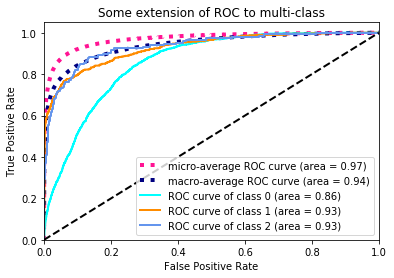

In [78]:
n_classes = len(tags_counts)
roc_auc(y_val, y_val_predicted_scores_mybag, n_classes)

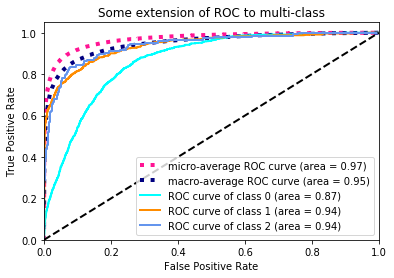

In [79]:
n_classes = len(tags_counts)
roc_auc(y_val, y_val_predicted_scores_tfidf, n_classes)

**Task 4 (MultilabelClassification).** Once we have the evaluation set up, we suggest that you experiment a bit with training your classifiers. We will use *F1-score weighted* as an evaluation metric. Our recommendation:
- compare the quality of the bag-of-words and TF-IDF approaches and chose one of them.
- for the chosen one, try *L1* and *L2*-regularization techniques in Logistic Regression with different coefficients (e.g. C equal to 0.1, 1, 10, 100).

You also could try other improvements of the preprocessing / model, if you want. 

/usr/local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Bag-of-words
Accuracy 0.3638
F1 macro 0.5187787752063479
F1 micro 0.6779744801804307
F1 weighted 0.656261247165244
Precision macro 0.3558998328463599
Precision micro 0.4883730218958395
Precision weighted 0.518154880445621


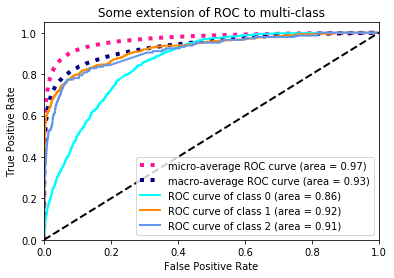

In [88]:
def train_classifier_reg(X_train, y_train):
    """
      X_train, y_train — training data
      
      return: trained classifier
    """
    
    clr = OneVsRestClassifier(LogisticRegression(penalty='l1', C=1))
    clr.fit(X_train, y_train)

    return clr

classifier_mybag = train_classifier_reg(X_train_mybag, y_train)

y_val_predicted_labels_mybag = classifier_mybag.predict(X_val_mybag)
y_val_predicted_scores_mybag = classifier_mybag.decision_function(X_val_mybag)

print('Bag-of-words')
print_evaluation_scores(y_val, y_val_predicted_labels_mybag)

n_classes = len(tags_counts)
roc_auc(y_val, y_val_predicted_scores_mybag, n_classes)


When you are happy with the quality, create predictions for *test* set, which you will submit to Coursera.

In [89]:
test_predictions = classifier_mybag.predict(X_test_mybag)
test_pred_inversed = mlb.inverse_transform(test_predictions)

test_predictions_for_submission = '\n'.join('%i\t%s' % (i, ','.join(row)) for i, row in enumerate(test_pred_inversed))
grader.submit_tag('MultilabelClassification', test_predictions_for_submission)

Current answer for task MultilabelClassification is:
 0	mysql,php
1	javascript
2	
3	javascript,jquery
4	android,java
5	php,xml
6	json,web-services
7	java,...


### Analysis of the most important features

Finally, it is usually a good idea to look at the features (words or n-grams) that are used with the largest weigths in your logistic regression model.

Implement the function *print_words_for_tag* to find them. Get back to sklearn documentation on [OneVsRestClassifier](http://scikit-learn.org/stable/modules/generated/sklearn.multiclass.OneVsRestClassifier.html) and [LogisticRegression](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) if needed.

In [ ]:
def print_words_for_tag(classifier, tag, tags_classes, index_to_words, all_words):
    """
        classifier: trained classifier
        tag: particular tag
        tags_classes: a list of classes names from MultiLabelBinarizer
        index_to_words: index_to_words transformation
        all_words: all words in the dictionary
        
        return nothing, just print top 5 positive and top 5 negative words for current tag
    """
    print('Tag:\t{}'.format(tag))
    
    # Extract an estimator from the classifier for the given tag.
    # Extract feature coefficients from the estimator. 
    
    ######################################
    ######### YOUR CODE HERE #############
    ######################################
    
    top_positive_words = # top-5 words sorted by the coefficiens.
    top_negative_words = # bottom-5 words  sorted by the coefficients.
    print('Top positive words:\t{}'.format(', '.join(top_positive_words)))
    print('Top negative words:\t{}\n'.format(', '.join(top_negative_words)))

In [ ]:
print_words_for_tag(classifier_tfidf, 'c', mlb.classes, tfidf_reversed_vocab, ALL_WORDS)
print_words_for_tag(classifier_tfidf, 'c++', mlb.classes, tfidf_reversed_vocab, ALL_WORDS)
print_words_for_tag(classifier_tfidf, 'linux', mlb.classes, tfidf_reversed_vocab, ALL_WORDS)

### Authorization & Submission
To submit assignment parts to Cousera platform, please, enter your e-mail and token into variables below. You can generate token on this programming assignment page. <b>Note:</b> Token expires 30 minutes after generation.

In [92]:
grader.status()

You want to submit these parts:
Task TextPrepare:
 sqlite php readonly
creating multiple textboxes dynamically
that  self one prefer javascript
save ph...
Task WordsTagsCount:
 javascript,c#,java
using,php,java...
Task BagOfWords:
 7...
Task MultilabelClassification:
 0	mysql,php
1	javascript
2	
3	javascript,jquery
4	android,java
5	php,xml
6	json,web-services
7	java,...


In [95]:
STUDENT_EMAIL = 'naudin.louise@gmail.com'
STUDENT_TOKEN = 'ZLULLiBQUqwZydiF'
grader.status()

You want to submit these parts:
Task TextPrepare:
 sqlite php readonly
creating multiple textboxes dynamically
that  self one prefer javascript
save ph...
Task WordsTagsCount:
 javascript,c#,java
using,php,java...
Task BagOfWords:
 7...
Task MultilabelClassification:
 0	mysql,php
1	javascript
2	
3	javascript,jquery
4	android,java
5	php,xml
6	json,web-services
7	java,...


If you want to submit these answers, run cell below

In [96]:
grader.submit(STUDENT_EMAIL, STUDENT_TOKEN)

Submitted to Coursera platform. See results on assignment page!
